### Comparison between Hodgkin Huxley, LIF and AdEx on sweeps of 'Short Square: Triple' on Frontal Lobe of 25 yr old male with epilepsy

***
***

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from brian2 import *
from brian2modelfitting import *
# from general_functions import *

WARNING    c:\Users\yjk16\anaconda3\envs\brianfit_env\lib\site-packages\brian2modelfitting\utils.py:1: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm
 [py.warnings]


In [40]:
from general_functions import *

In [145]:
# sweep nos 100-109 from Allen...
input_current = pd.read_csv('short_square_triple_in.csv', index_col=0).to_numpy()
output_response = pd.read_csv('short_square_triple_out.csv', index_col=0).to_numpy()

input_current_amps = input_current * 10**-12

start = 100_000
end = 150_000

sliced_input_amps = input_current_amps[:, start:end]
sliced_output_res = output_response[:, start:end]

time_step = np.arange(0, len(input_current_amps[0]))
sampling_rate = 50000
# time_steps = time_step * (1/sampling_rate)

# dt = 1/sampling_rate
# dt_in_ms = (1/sampling_rate) * 1000

end2 = 20_000
fast_spikes_input = sliced_input_amps[3:6,:end2]
fast_spikes_output = sliced_output_res[3:6,:end2]

end3 = 7_500
fastspikes_input_sliced = fast_spikes_input[:,:end3]
fastspikes_output_sliced = fast_spikes_output[:,:end3]

In [160]:
end4 = 5_000
fastspikes_input_sliced = fast_spikes_input[:,:end4]
fastspikes_output_sliced = fast_spikes_output[:,:end4]

In [272]:
reshaped_sst_sweep3_in, reshaped_sst_sweep3_out = reshape_data(fast_spikes_input[0], fastspikes_output_sliced[0])
reshaped_sst_sweep4_in, reshaped_sst_sweep4_out = reshape_data(fastspikes_input_sliced[1], fastspikes_output_sliced[1])
reshaped_sst_sweep5_in, reshaped_sst_sweep5_out = reshape_data(fastspikes_input_sliced[2], fastspikes_output_sliced[2])

***
***

# Initial analysis

***

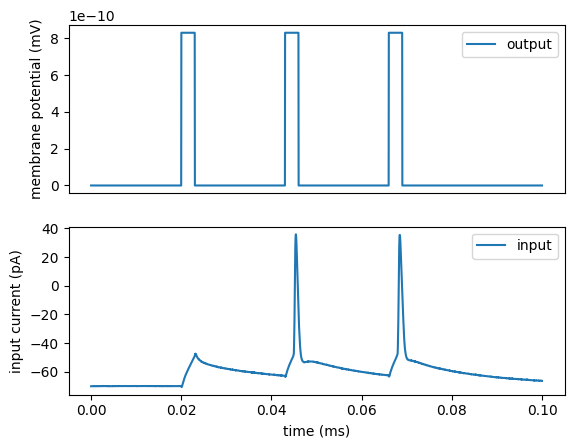

In [161]:
out_in_vertical(fastspikes_input_sliced[0], fastspikes_output_sliced[0])

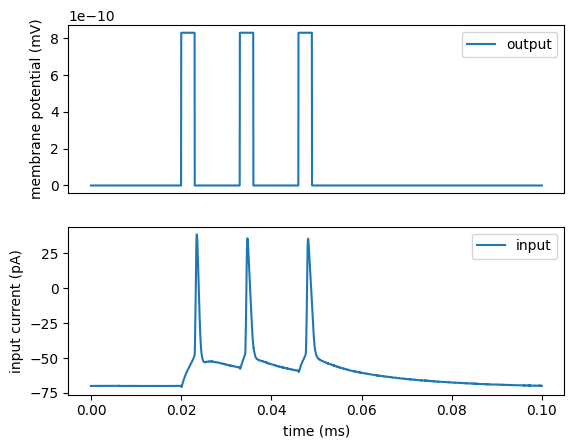

In [162]:
out_in_vertical(fastspikes_input_sliced[1], fastspikes_output_sliced[1])

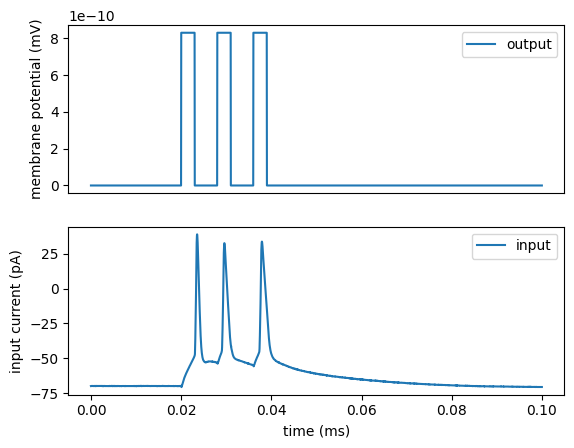

In [163]:
out_in_vertical(fastspikes_input_sliced[2], fastspikes_output_sliced[2])

In [164]:
print(len(fastspikes_input_sliced[0]))

5000


input/ output can be found elsewhere...

***
***

# Run models

***

In [ ]:
hh_sst_starters_0 = run_hh(sliced_input_amps, sliced_output_res, cm_var=200, el=-65, ek=-90, ena=50, vt=-63,\
                           glmin=1, glmax=20, gnamin=0.01, gnamax=150, gkdmin=1, gkdmax=50)

# tt: 7m 44.1s

WARNING    Cannot use Cython, a test compilation failed: Cython is not available (ImportError) [brian2.codegen.runtime.cython_rt.cython_rt.failed_compile_test]
INFO       Cannot use compiled code, falling back to the numpy code generation target. Note that this will likely be slower than using compiled code. Set the code generation to numpy manually to avoid this message:
prefs.codegen.target = "numpy" [brian2.devices.device.codegen_fallback]


first fit:
Round 0: Best parameters g_kd=30.27079216 uS, g_na=21.11549527 uS, gl=14.24890806 nS (error: 63.0441231 mV^2)
Round 1: Best parameters g_kd=6.38246302 uS, g_na=17.29591679 uS, gl=14.45518333 nS (error: 53.33050791 mV^2)
Round 2: Best parameters g_kd=4.84018998 uS, g_na=21.79333059 uS, gl=15.98282984 nS (error: 51.6796622 mV^2)
Round 3: Best parameters g_kd=3.4794292 uS, g_na=15.37988643 uS, gl=15.98282984 nS (error: 49.21105076 mV^2)
Round 4: Best parameters g_kd=2.520501 uS, g_na=18.04053587 uS, gl=16.01123389 nS (error: 46.17400141 mV^2)
Round 5: Best parameters g_kd=2.20114793 uS, g_na=22.69374289 uS, gl=17.13860824 nS (error: 44.27454726 mV^2)
Round 6: Best parameters g_kd=1.9623203 uS, g_na=23.5104484 uS, gl=18.83162124 nS (error: 42.16858462 mV^2)
Round 7: Best parameters g_kd=1.72828112 uS, g_na=22.75487582 uS, gl=18.73727051 nS (error: 40.77199563 mV^2)
Round 8: Best parameters g_kd=1.57307017 uS, g_na=22.80757245 uS, gl=19.28196221 nS (error: 39.87415223 mV^2)
Round

Text(0.5, 1.0, 'SST sweep 0: initial')

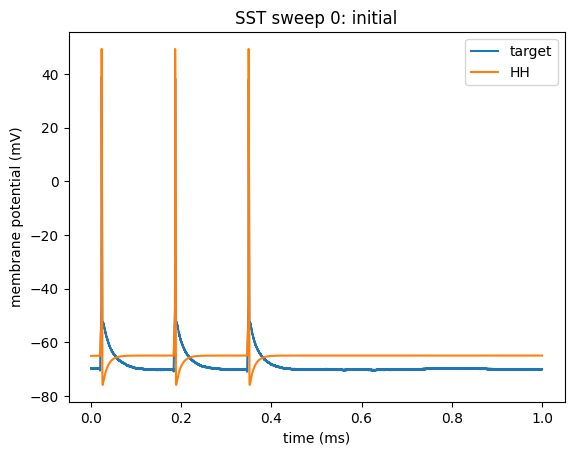

In [6]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_0[0]*1000, d2_title='HH')
title('SST sweep 0: initial')

Text(0.5, 1.0, 'SST sweep 1: initial')

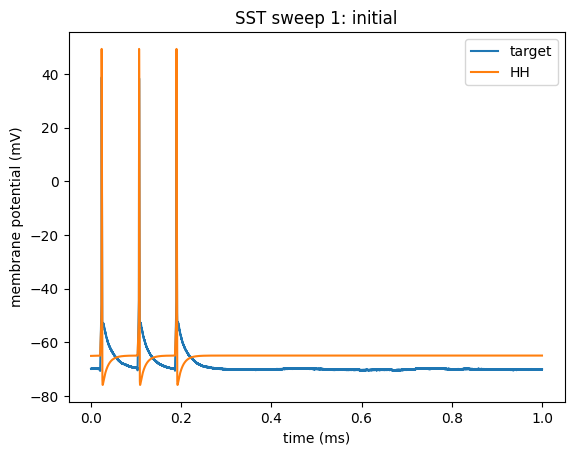

In [7]:
create_comparison_together(sliced_output_res[1], hh_sst_starters_0[1]*1000, d2_title='HH')
title('SST sweep 1: initial')

Text(0.5, 1.0, 'SST sweep 2: initial')

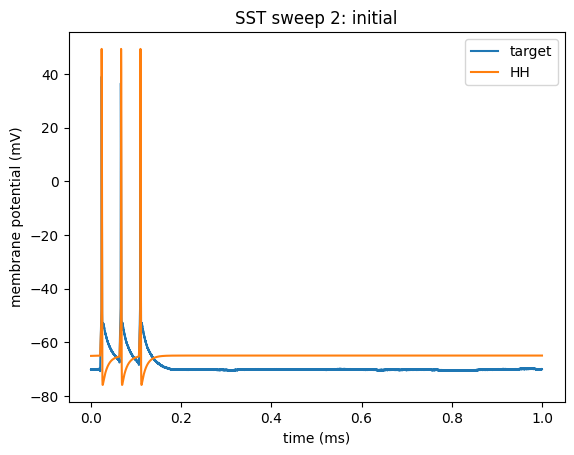

In [8]:
create_comparison_together(sliced_output_res[2], hh_sst_starters_0[2]*1000, d2_title='HH')
title('SST sweep 2: initial')

Text(0.5, 1.0, 'SST sweep 3: initial')

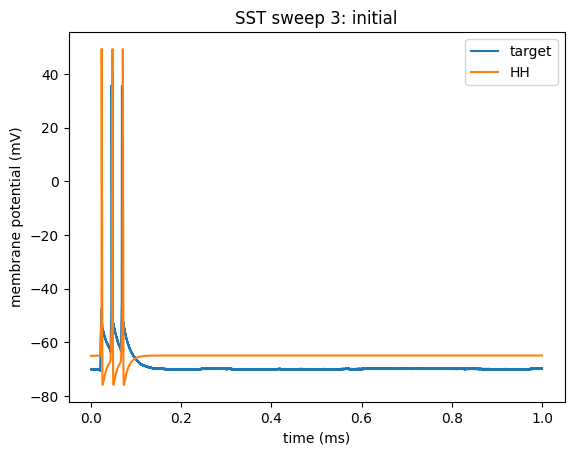

In [9]:
create_comparison_together(sliced_output_res[3], hh_sst_starters_0[3]*1000, d2_title='HH')
title('SST sweep 3: initial')

Text(0.5, 1.0, 'SST sweep 4: initial')

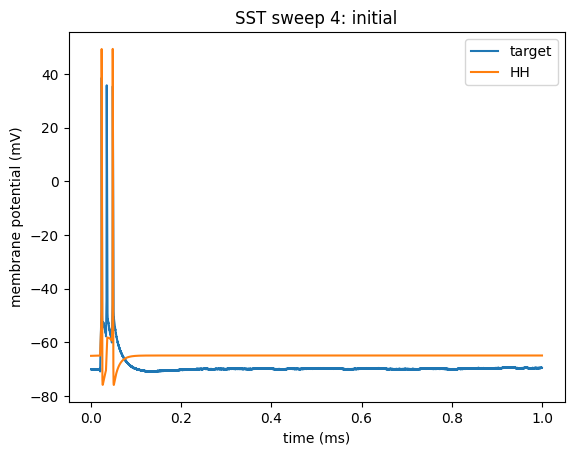

In [10]:
create_comparison_together(sliced_output_res[4], hh_sst_starters_0[4]*1000, d2_title='HH')
title('SST sweep 4: initial')

Text(0.5, 1.0, 'SST sweep 5: initial')

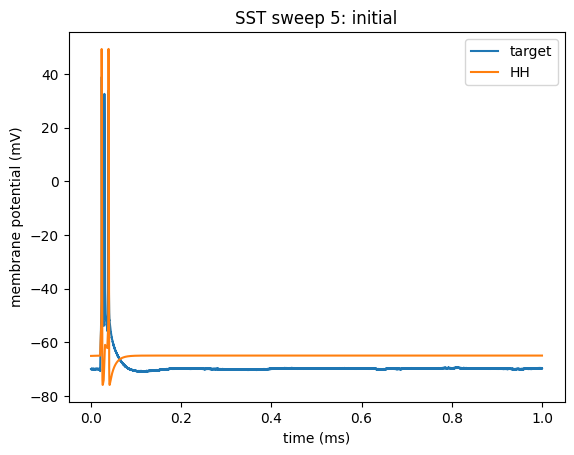

In [11]:
create_comparison_together(sliced_output_res[5], hh_sst_starters_0[5]*1000, d2_title='HH')
title('SST sweep 5: initial')

Text(0.5, 1.0, 'SST sweep 6: initial')

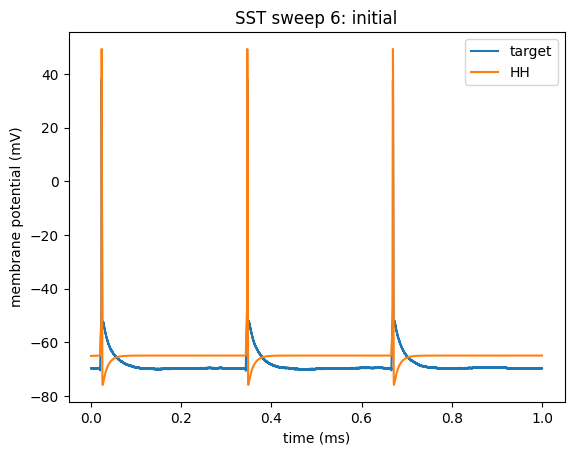

In [12]:
create_comparison_together(sliced_output_res[6], hh_sst_starters_0[6]*1000, d2_title='HH')
title('SST sweep 6: initial')

Text(0.5, 1.0, 'SST sweep 7: initial')

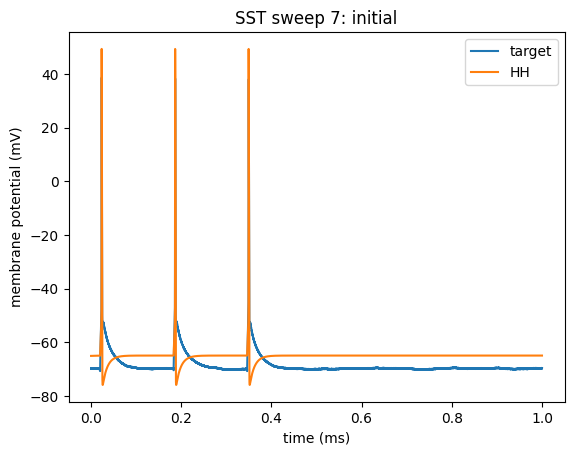

In [13]:
create_comparison_together(sliced_output_res[7], hh_sst_starters_0[7]*1000, d2_title='HH')
title('SST sweep 7: initial')

Text(0.5, 1.0, 'SST sweep 7: initial')

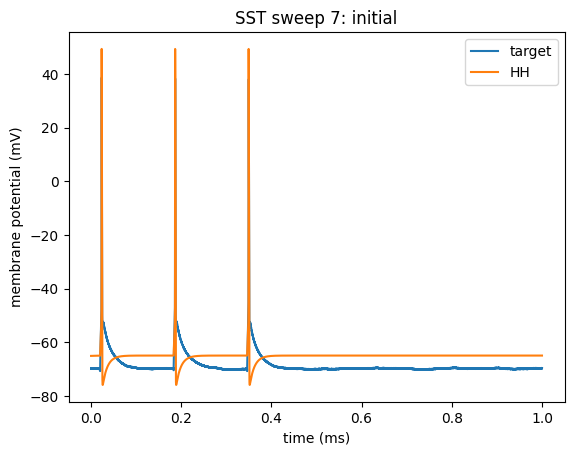

In [14]:
create_comparison_together(sliced_output_res[7], hh_sst_starters_0[7]*1000, d2_title='HH')
title('SST sweep 7: initial')

Text(0.5, 1.0, 'SST sweep 8: initial')

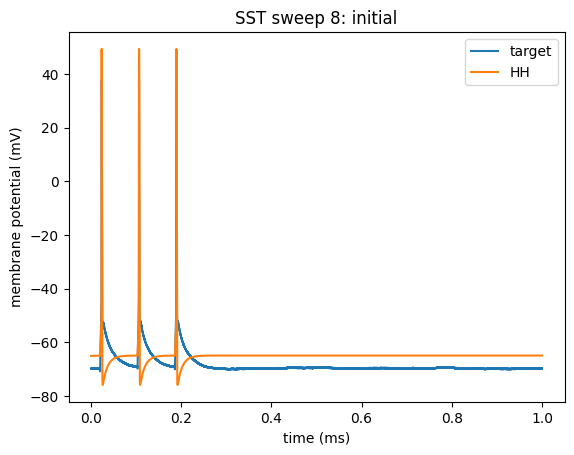

In [15]:
create_comparison_together(sliced_output_res[8], hh_sst_starters_0[8]*1000, d2_title='HH')
title('SST sweep 8: initial')

Text(0.5, 1.0, 'SST sweep 9: initial')

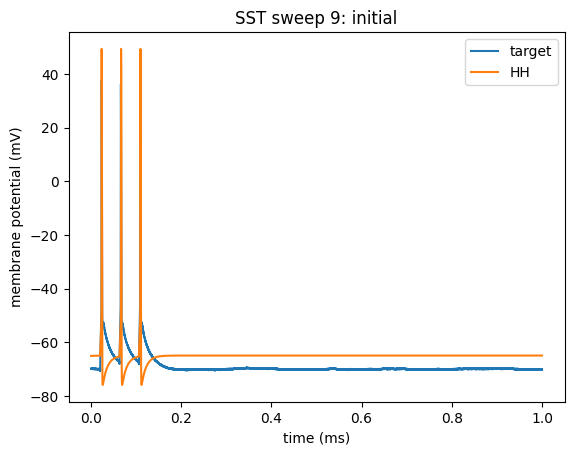

In [16]:
create_comparison_together(sliced_output_res[9], hh_sst_starters_0[9]*1000, d2_title='HH')
title('SST sweep 9: initial')

In [ ]:
hh_sst_starters_1 = run_hh(sliced_input_amps, sliced_output_res,\
                           glmin=1, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=4)

# tt: 6m 51.5s

first fit:
Round 0: Best parameters g_kd=3.34804349 uS, g_na=7.55291422 uS, gl=7.29450846 nS (error: 14.35420066 mV^2)
Round 1: Best parameters g_kd=2.92370515 uS, g_na=7.36063577 uS, gl=7.30390661 nS (error: 14.34025151 mV^2)
Round 2: Best parameters g_kd=1.9568406 uS, g_na=5.72397065 uS, gl=6.97431455 nS (error: 14.04192503 mV^2)
Round 3: Best parameters g_kd=1.40858957 uS, g_na=4.13812297 uS, gl=6.24308572 nS (error: 13.39153974 mV^2)
Round 4: Best parameters g_kd=1.40858957 uS, g_na=4.13812297 uS, gl=6.24308572 nS (error: 13.39153974 mV^2)
Round 5: Best parameters g_kd=1.40858957 uS, g_na=4.13812297 uS, gl=6.24308572 nS (error: 13.39153974 mV^2)
Round 6: Best parameters g_kd=1.40858957 uS, g_na=4.13812297 uS, gl=6.24308572 nS (error: 13.39153974 mV^2)
Round 7: Best parameters g_kd=0.95708794 uS, g_na=3.25319542 uS, gl=5.93856956 nS (error: 13.26702352 mV^2)
Round 8: Best parameters g_kd=0.95708794 uS, g_na=3.25319542 uS, gl=5.93856956 nS (error: 13.26702352 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'SST sweep 9: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

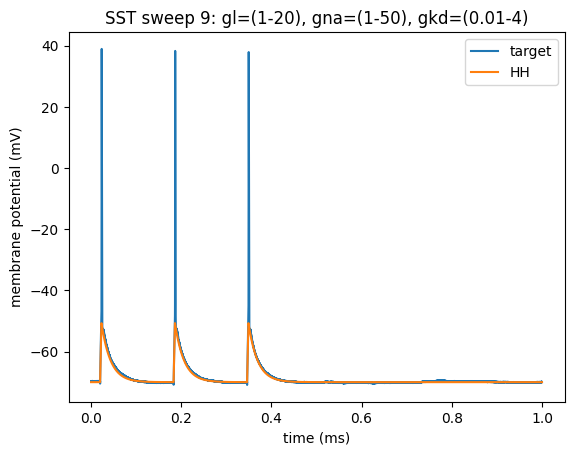

In [19]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_1[0]*1000, d2_title='HH')
title('SST sweep 9: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 1: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

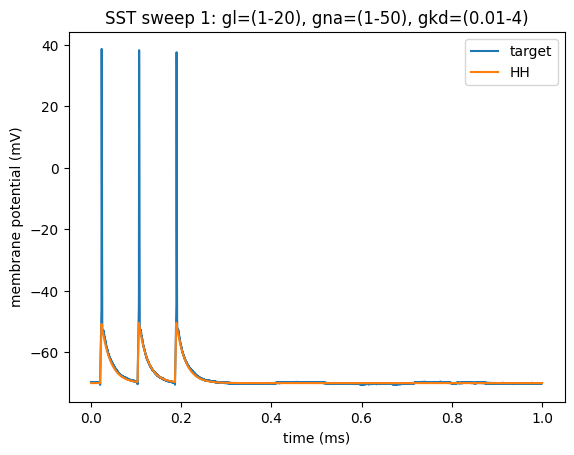

In [20]:
create_comparison_together(sliced_output_res[1], hh_sst_starters_1[1]*1000, d2_title='HH')
title('SST sweep 1: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 2: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

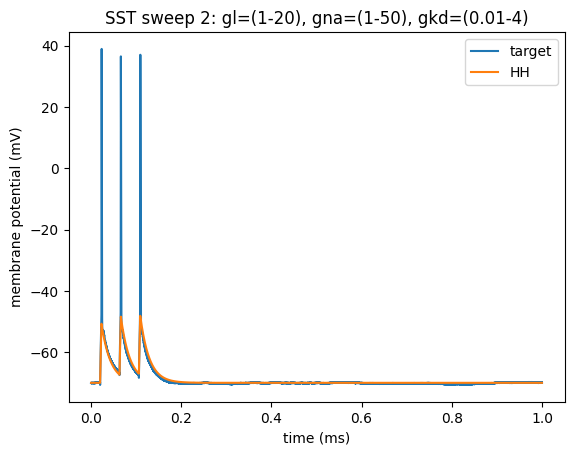

In [21]:
create_comparison_together(sliced_output_res[2], hh_sst_starters_1[2]*1000, d2_title='HH')
title('SST sweep 2: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 3: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

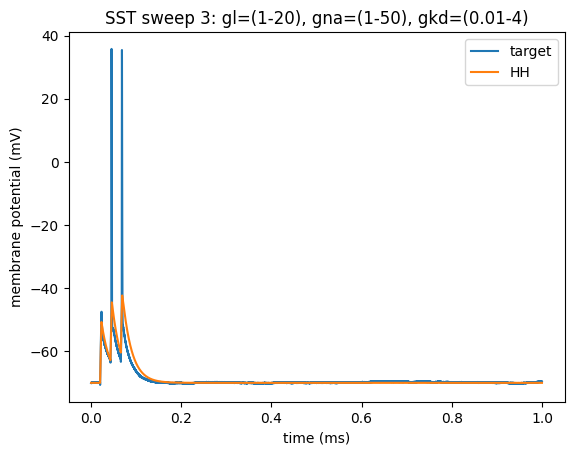

In [22]:
create_comparison_together(sliced_output_res[3], hh_sst_starters_1[3]*1000, d2_title='HH')
title('SST sweep 3: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 4: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

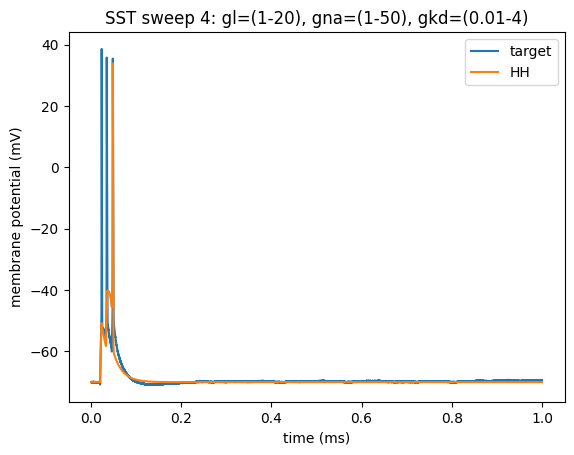

In [23]:
create_comparison_together(sliced_output_res[4], hh_sst_starters_1[4]*1000, d2_title='HH')
title('SST sweep 4: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 5: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

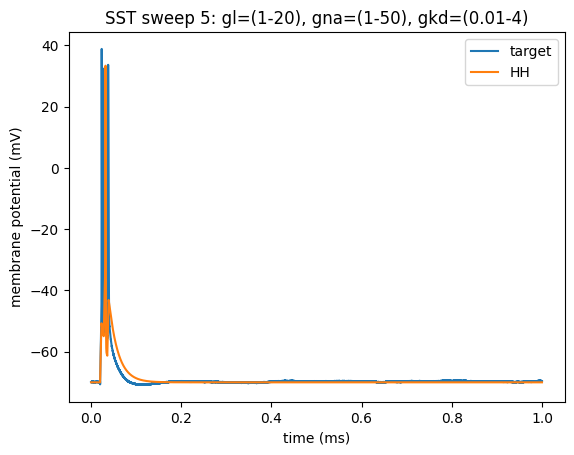

In [24]:
create_comparison_together(sliced_output_res[5], hh_sst_starters_1[5]*1000, d2_title='HH')
title('SST sweep 5: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 6: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

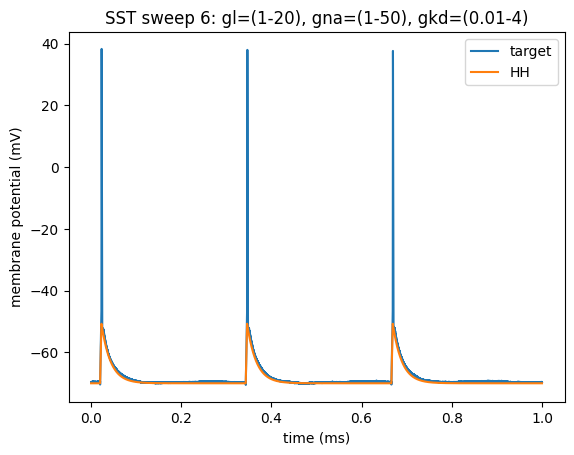

In [25]:
create_comparison_together(sliced_output_res[6], hh_sst_starters_1[6]*1000, d2_title='HH')
title('SST sweep 6: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 7: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

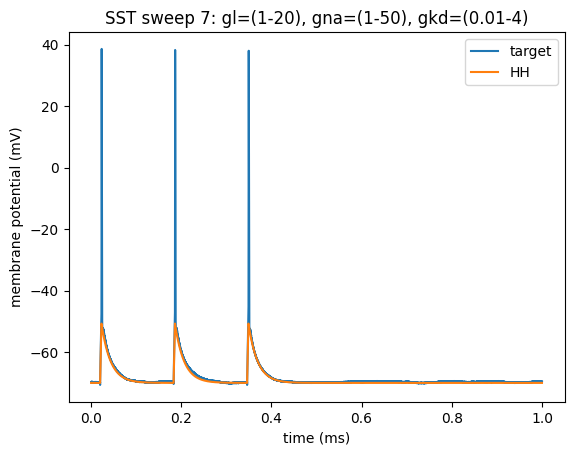

In [26]:
create_comparison_together(sliced_output_res[7], hh_sst_starters_1[7]*1000, d2_title='HH')
title('SST sweep 7: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 8: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

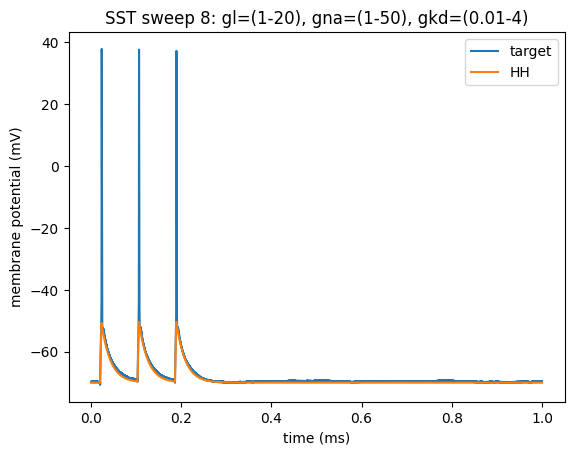

In [27]:
create_comparison_together(sliced_output_res[8], hh_sst_starters_1[8]*1000, d2_title='HH')
title('SST sweep 8: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 9: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

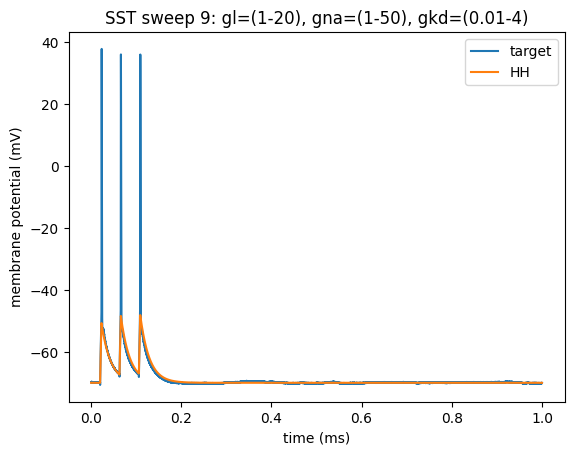

In [28]:
create_comparison_together(sliced_output_res[9], hh_sst_starters_1[9]*1000, d2_title='HH')
title('SST sweep 9: gl=(1-20), gna=(1-50), gkd=(0.01-4)')

([], [])

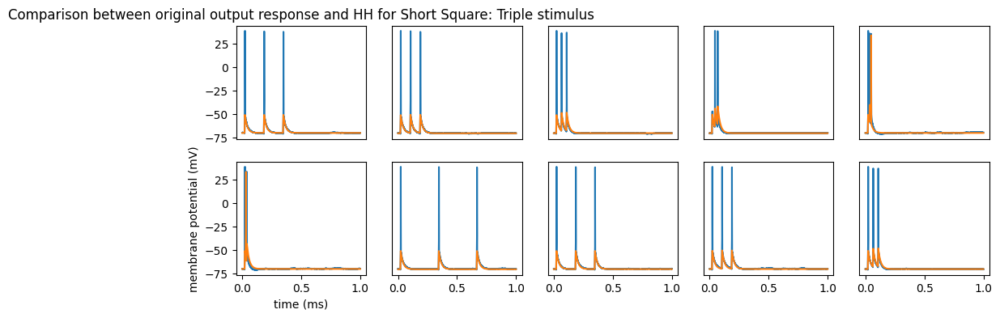

In [ ]:
figure(figsize=(12,4))

ts = (np.arange(0, len(sliced_output_res[0]))) * (1/50_000)

subplot(2,5,1)
plot(ts, sliced_output_res[0])
plot(ts, hh_sst_starters_1[0]*1000)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
# xlabel('time (ms)')
# ylabel('membrane potential (mV)')
# ylabel('input current (pA)')
title(f'Comparison between original output response and HH for Short Square: Triple stimulus')

subplot(2,5,2)
plot(ts, sliced_output_res[1])
plot(ts, hh_sst_starters_1[1]*1000)
tick_params(
axis='x',          
which='both',     
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(2,5,3)
plot(ts, sliced_output_res[2])
plot(ts, hh_sst_starters_1[2]*1000)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(2,5,4)
plot(ts, sliced_output_res[3])
plot(ts, hh_sst_starters_1[3]*1000)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(2,5,5)
plot(ts, sliced_output_res[4])
plot(ts, hh_sst_starters_1[4]*1000)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
yticks([])

subplot(2,5,6)
plot(ts, sliced_output_res[5])
plot(ts, hh_sst_starters_1[5]*1000)
xlabel('time (ms)')
# ylabel('input current (pA)')
ylabel('membrane potential (mV)')

subplot(2,5,7)
plot(ts, sliced_output_res[6])
plot(ts, hh_sst_starters_1[6]*1000)
yticks([])

subplot(2,5,8)
plot(ts, sliced_output_res[7])
plot(ts, hh_sst_starters_1[7]*1000)
yticks([])

subplot(2,5,9)
plot(ts, sliced_output_res[8])
plot(ts, hh_sst_starters_1[8]*1000)
yticks([])

subplot(2,5,10)
plot(ts, sliced_output_res[9])
plot(ts, hh_sst_starters_1[9]*1000)
yticks([])

Text(0.5, 1.0, 'Sweep 5')

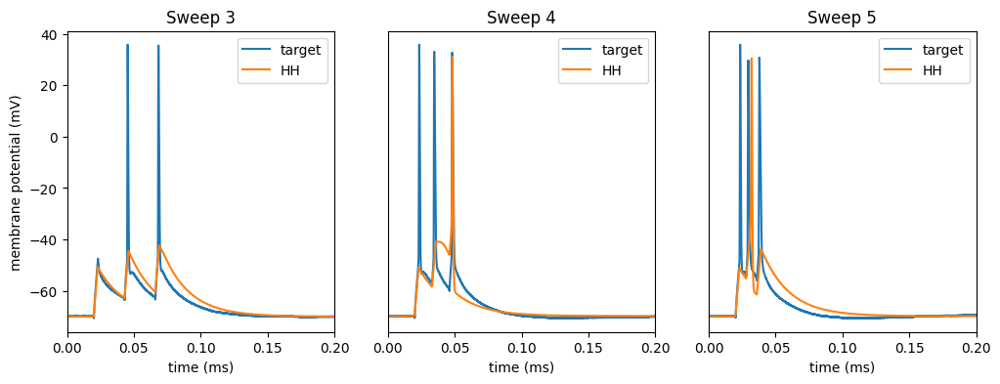

In [36]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(sliced_output_res[3], hh_sst_starters_1[3]*1000, d2_title='HH')
xlim(0, 0.2)
ylabel('membrane potential (mV)')
title('Sweep 3')

subplot(1,3,2)
create_comparison_together(sliced_output_res[4], hh_sst_starters_1[4]*1000, d2_title='HH')
xlim(0, 0.2)
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Sweep 4')

subplot(1,3,3)
create_comparison_together(sliced_output_res[5], hh_sst_starters_1[5]*1000, d2_title='HH')
xlim(0, 0.2)
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Sweep 5')

In [ ]:
hh_sst_starters_2 = run_hh(sliced_input_amps, sliced_output_res,\
                           glmin=10, glmax=40, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=4)

# tt: 6m 37.4s

first fit:
Round 0: Best parameters g_kd=2.45059019 uS, g_na=16.56920991 uS, gl=13.06212188 nS (error: 17.08136309 mV^2)
Round 1: Best parameters g_kd=3.02636073 uS, g_na=3.54318785 uS, gl=12.31041069 nS (error: 16.09565826 mV^2)
Round 2: Best parameters g_kd=1.46248543 uS, g_na=3.14044045 uS, gl=11.45005635 nS (error: 15.68426909 mV^2)
Round 3: Best parameters g_kd=3.06361762 uS, g_na=1.77049914 uS, gl=10.81725148 nS (error: 15.2666111 mV^2)
Round 4: Best parameters g_kd=2.991091 uS, g_na=1.42141471 uS, gl=10.57010956 nS (error: 15.12202386 mV^2)
Round 5: Best parameters g_kd=3.16964738 uS, g_na=1.40156081 uS, gl=10.38442309 nS (error: 15.02249187 mV^2)
Round 6: Best parameters g_kd=3.55608787 uS, g_na=1.31210711 uS, gl=10.28338939 nS (error: 14.96090233 mV^2)
Round 7: Best parameters g_kd=3.36973736 uS, g_na=1.19633493 uS, gl=10.20448794 nS (error: 14.91417211 mV^2)
Round 8: Best parameters g_kd=2.72293609 uS, g_na=1.1676483 uS, gl=10.12814848 nS (error: 14.87895899 mV^2)
Round 9: Be

In [41]:
plot_5_2_sst(sliced_output_res, hh_sst_starters_2, tite='SST: HH')

NameError: name 'plot_5_2_sst' is not defined

Text(0.5, 1.0, 'SST sweep 9: gl=(10-40), gna=(1-20), gkd=(0.01-4)')

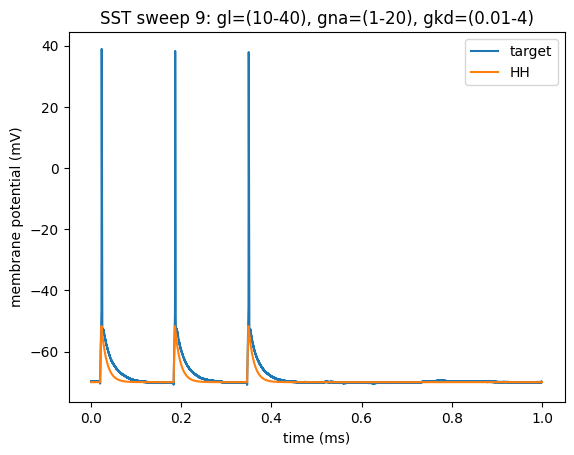

In [42]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_2[0]*1000, d2_title='HH')
title('SST sweep 9: gl=(10-40), gna=(1-20), gkd=(0.01-4)')

# BEST HH SO FAR: 3

In [ ]:
hh_sst_starters_3 = run_hh(sliced_input_amps, sliced_output_res, cm_var=200, vt=-70,\
                           glmin=10, glmax=40, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=4)

# tt: 6m 41.7s

first fit:
Round 0: Best parameters g_kd=0.81532501 uS, g_na=14.68431952 uS, gl=22.61624053 nS (error: 8.95740675 mV^2)
Round 1: Best parameters g_kd=0.81532501 uS, g_na=14.68431952 uS, gl=22.61624053 nS (error: 8.95740675 mV^2)
Round 2: Best parameters g_kd=0.70914275 uS, g_na=10.00345539 uS, gl=14.92229166 nS (error: 6.19368812 mV^2)
Round 3: Best parameters g_kd=0.67498868 uS, g_na=10.22706121 uS, gl=18.8452683 nS (error: 5.45961823 mV^2)
Round 4: Best parameters g_kd=0.67498868 uS, g_na=10.22706121 uS, gl=18.8452683 nS (error: 5.45961823 mV^2)
Round 5: Best parameters g_kd=0.67498868 uS, g_na=10.22706121 uS, gl=18.8452683 nS (error: 5.45961823 mV^2)
Round 6: Best parameters g_kd=0.67498868 uS, g_na=10.22706121 uS, gl=18.8452683 nS (error: 5.45961823 mV^2)
Round 7: Best parameters g_kd=0.67498868 uS, g_na=10.22706121 uS, gl=18.8452683 nS (error: 5.45961823 mV^2)
Round 8: Best parameters g_kd=0.67498868 uS, g_na=10.22706121 uS, gl=18.8452683 nS (error: 5.45961823 mV^2)
Round 9: Best 

Text(0.5, 1.0, 'SST sweep 9: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

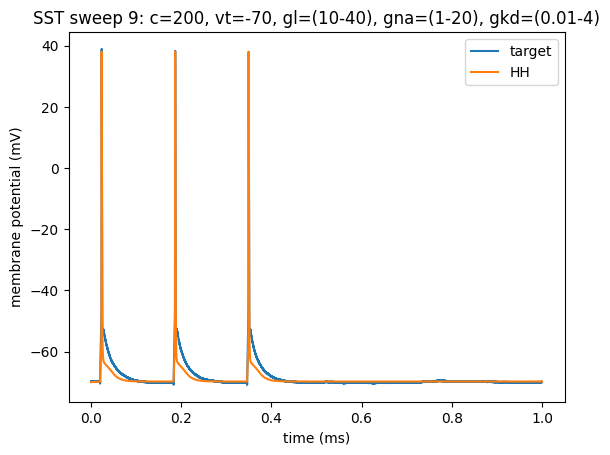

In [43]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_3[0]*1000, d2_title='HH')
title('SST sweep 9: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 1: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

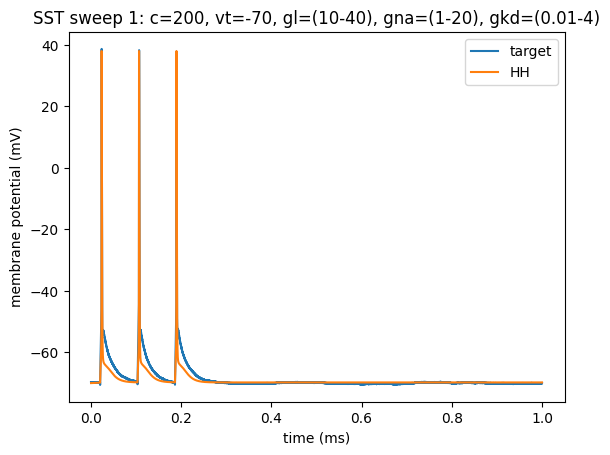

In [44]:
create_comparison_together(sliced_output_res[1], hh_sst_starters_3[1]*1000, d2_title='HH')
title('SST sweep 1: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

(0.0, 0.2)

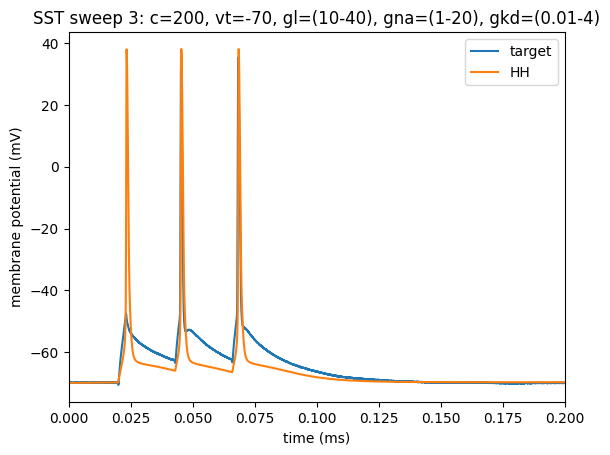

In [110]:
create_comparison_together(sliced_output_res[3], hh_sst_starters_3[3]*1000, d2_title='HH')
title('SST sweep 3: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')
xlim(0, 0.2)

(0.0, 0.2)

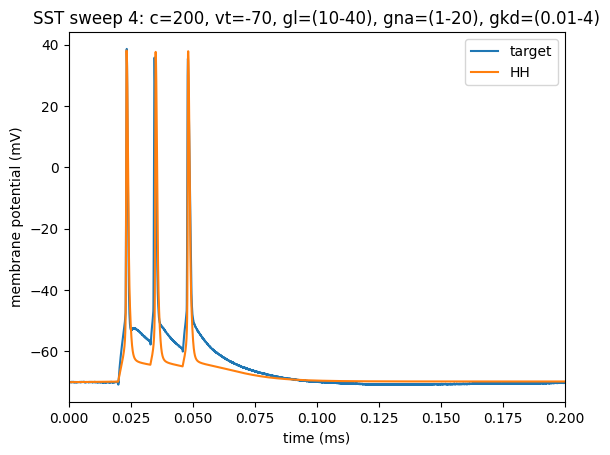

In [111]:
create_comparison_together(sliced_output_res[4], hh_sst_starters_3[4]*1000, d2_title='HH')
title('SST sweep 4: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')
xlim(0, 0.2)

(0.0, 0.2)

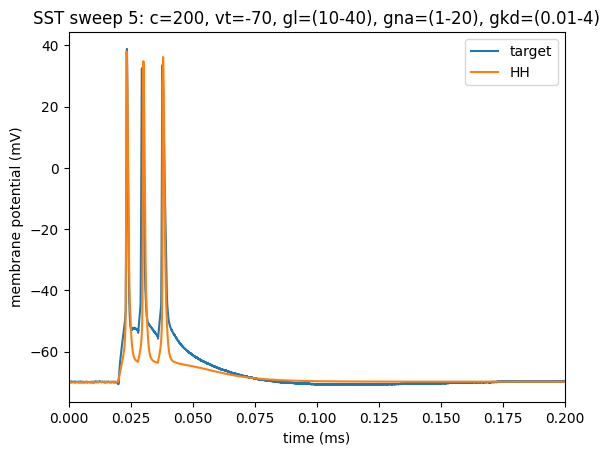

In [48]:
create_comparison_together(sliced_output_res[5], hh_sst_starters_3[5]*1000, d2_title='HH')
title('SST sweep 5: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')
xlim(0, 0.2)

Text(0.5, 1.0, 'SST sweep 6: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

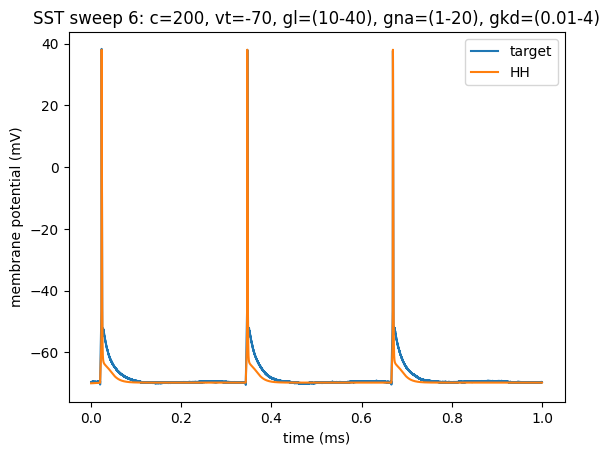

In [49]:
create_comparison_together(sliced_output_res[6], hh_sst_starters_3[6]*1000, d2_title='HH')
title('SST sweep 6: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 7: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

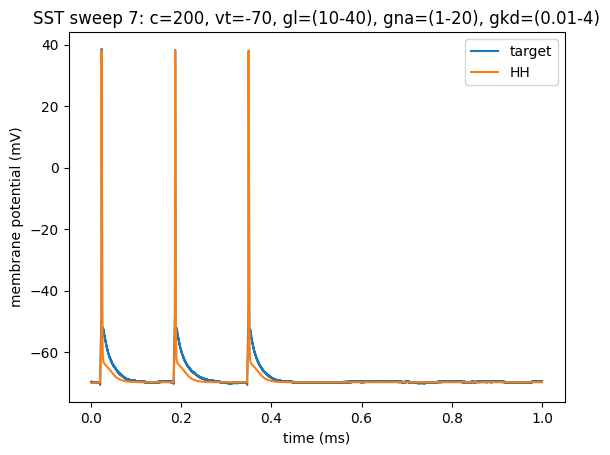

In [50]:
create_comparison_together(sliced_output_res[7], hh_sst_starters_3[7]*1000, d2_title='HH')
title('SST sweep 7: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 8: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

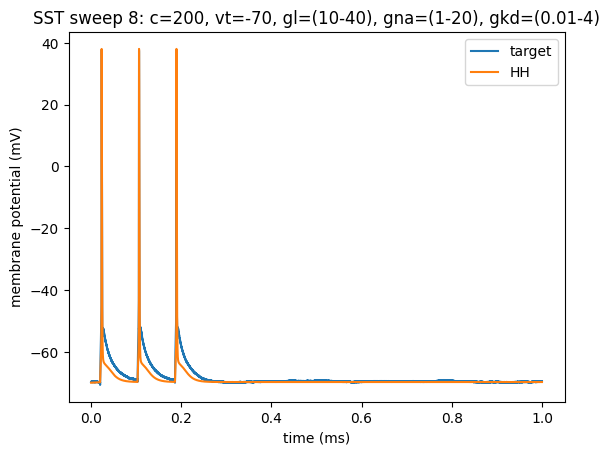

In [51]:
create_comparison_together(sliced_output_res[8], hh_sst_starters_3[8]*1000, d2_title='HH')
title('SST sweep 8: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 9: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

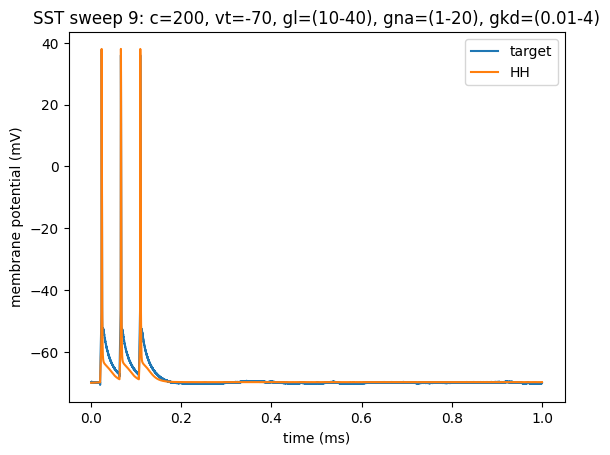

In [52]:
create_comparison_together(sliced_output_res[9], hh_sst_starters_3[9]*1000, d2_title='HH')
title('SST sweep 9: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

WARNING    c:\Users\yjk16\OneDrive\Desktop\CS Master's\Dissertation\diss files\general_functions.py:485: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  legend()
 [py.warnings]


Text(0.5, 1.0, 'Sweep 9')

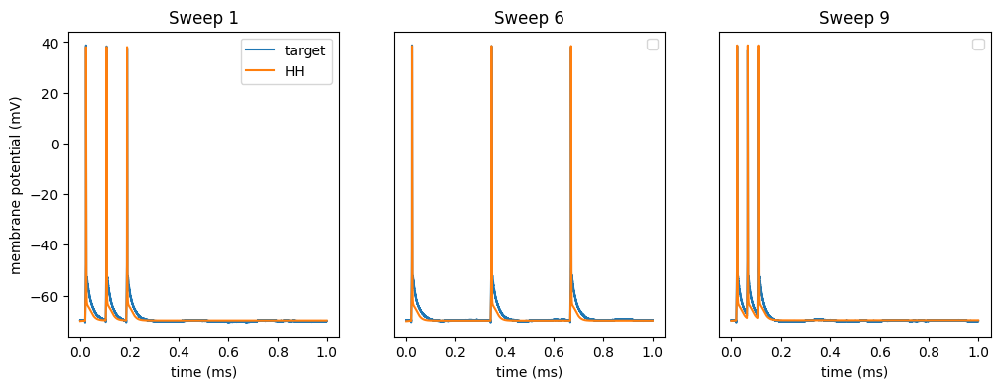

In [644]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(sliced_output_res[1], hh_sst_starters_3[1]*1000, d2_title='HH')
# xlim(0, 0.1)
ylabel('membrane potential (mV)')
title('Sweep 1')

subplot(1,3,2)
create_comparison_together(sliced_output_res[6], hh_sst_starters_3[6]*1000, d1_title='', d2_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Sweep 6')

subplot(1,3,3)
create_comparison_together(sliced_output_res[9], hh_sst_starters_3[9]*1000, d1_title='', d2_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Sweep 9')

Text(0.5, 1.0, 'Sweep 5')

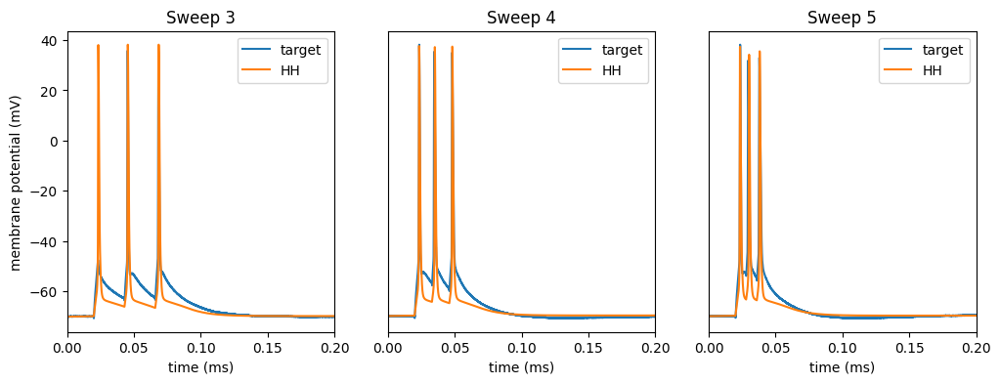

In [635]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(sliced_output_res[3], hh_sst_starters_3[3]*1000, d2_title='HH')
# xlim(0, 0.1)
ylabel('membrane potential (mV)')
xlim(0, 0.2)
title('Sweep 3')

subplot(1,3,2)
create_comparison_together(sliced_output_res[4], hh_sst_starters_3[4]*1000, d2_title='HH')
ax = plt.gca()
ax.yaxis.set_visible(False)
xlim(0, 0.2)
title('Sweep 4')

subplot(1,3,3)
create_comparison_together(sliced_output_res[5], hh_sst_starters_3[5]*1000, d2_title='HH')
ax = plt.gca()
ax.yaxis.set_visible(False)
xlim(0, 0.2)
title('Sweep 5')

In [ ]:
hh_sst_starters_4 = run_hh(sliced_input_amps, sliced_output_res, cm_var=200, vt=-70,\
                           glmin=0, glmax=6, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=4)

# tt: 7m 57.3s


first fit:
Round 0: Best parameters g_kd=1.11811959 uS, g_na=5.98224875 uS, gl=4.11574351 nS (error: 15.02745779 mV^2)
Round 1: Best parameters g_kd=0.7863608 uS, g_na=5.32694525 uS, gl=5.00927787 nS (error: 12.32213722 mV^2)
Round 2: Best parameters g_kd=0.77317763 uS, g_na=4.98197623 uS, gl=4.95100439 nS (error: 12.13038875 mV^2)
Round 3: Best parameters g_kd=0.77028585 uS, g_na=5.10250882 uS, gl=5.55984262 nS (error: 10.84676056 mV^2)
Round 4: Best parameters g_kd=0.77028585 uS, g_na=5.10250882 uS, gl=5.55984262 nS (error: 10.84676056 mV^2)
Round 5: Best parameters g_kd=0.77028585 uS, g_na=5.10250882 uS, gl=5.55984262 nS (error: 10.84676056 mV^2)
Round 6: Best parameters g_kd=0.7863608 uS, g_na=5.32694525 uS, gl=5.62128668 nS (error: 10.67154977 mV^2)
Round 7: Best parameters g_kd=0.7863608 uS, g_na=5.32694525 uS, gl=5.62128668 nS (error: 10.67154977 mV^2)
Round 8: Best parameters g_kd=0.7863608 uS, g_na=5.32694525 uS, gl=5.62128668 nS (error: 10.67154977 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'SST sweep 9: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

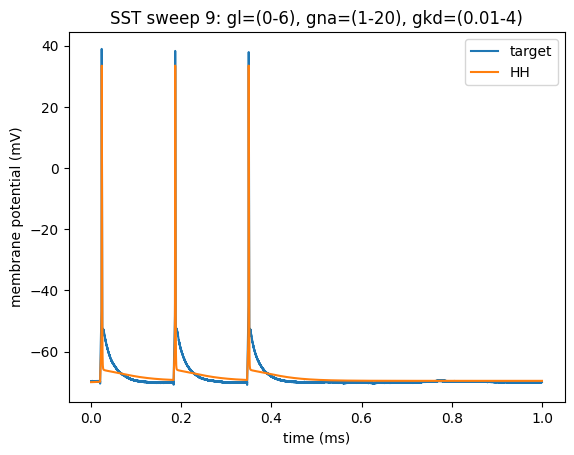

In [54]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_4[0]*1000, d2_title='HH')
title('SST sweep 9: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 1: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

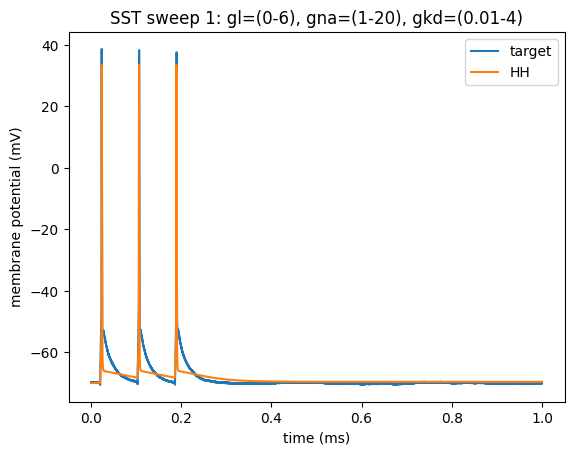

In [55]:
create_comparison_together(sliced_output_res[1], hh_sst_starters_4[1]*1000, d2_title='HH')
title('SST sweep 1: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 2: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

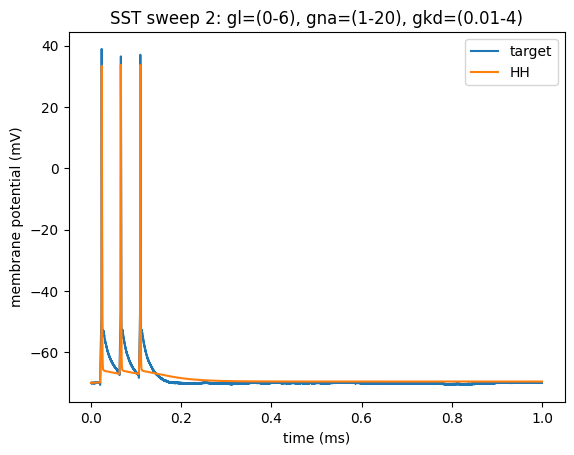

In [56]:
create_comparison_together(sliced_output_res[2], hh_sst_starters_4[2]*1000, d2_title='HH')
title('SST sweep 2: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 3: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

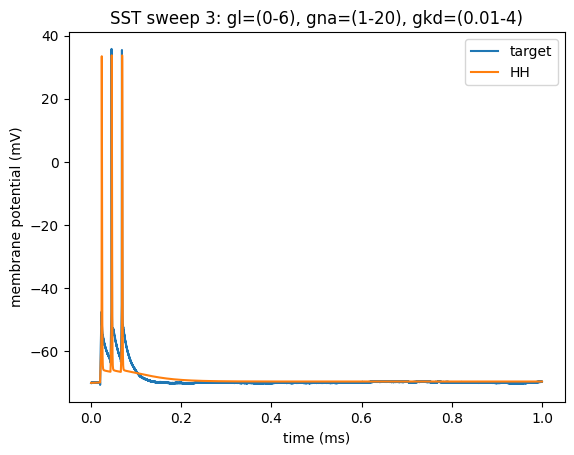

In [57]:
create_comparison_together(sliced_output_res[3], hh_sst_starters_4[3]*1000, d2_title='HH')
title('SST sweep 3: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 4: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

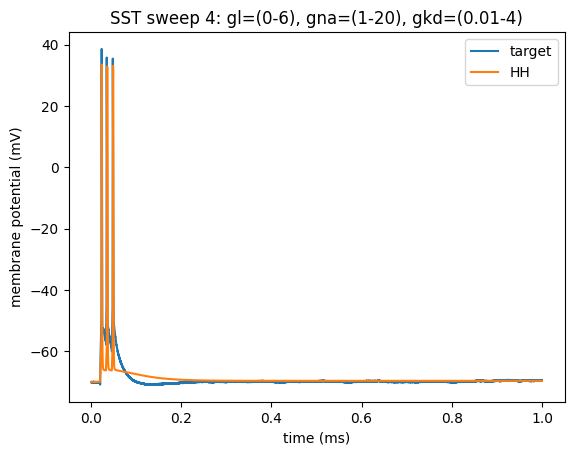

In [58]:
create_comparison_together(sliced_output_res[4], hh_sst_starters_4[4]*1000, d2_title='HH')
title('SST sweep 4: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 5: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

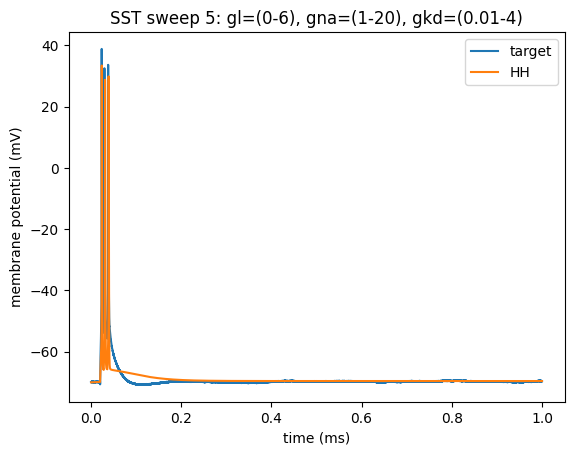

In [59]:
create_comparison_together(sliced_output_res[5], hh_sst_starters_4[5]*1000, d2_title='HH')
title('SST sweep 5: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 6: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

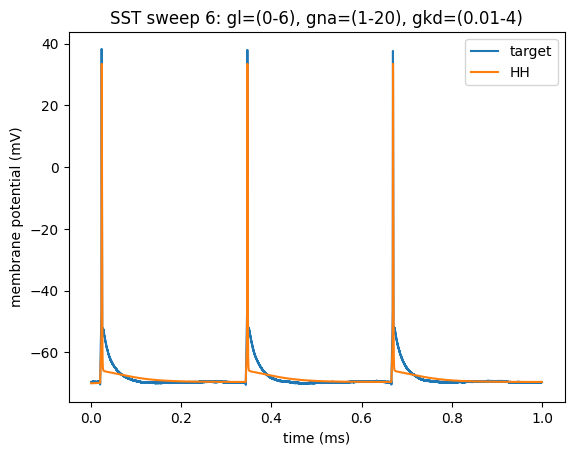

In [60]:
create_comparison_together(sliced_output_res[6], hh_sst_starters_4[6]*1000, d2_title='HH')
title('SST sweep 6: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 7: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

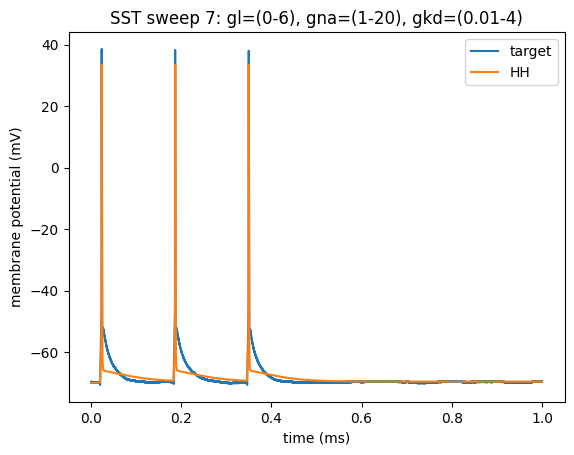

In [61]:
create_comparison_together(sliced_output_res[7], hh_sst_starters_4[7]*1000, d2_title='HH')
title('SST sweep 7: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 8: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

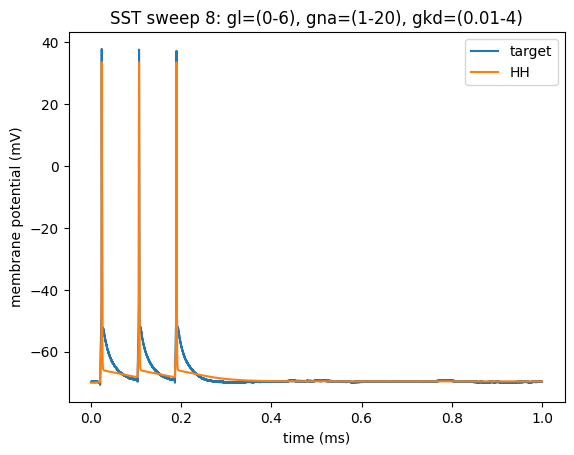

In [62]:
create_comparison_together(sliced_output_res[8], hh_sst_starters_4[8]*1000, d2_title='HH')
title('SST sweep 8: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 9: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

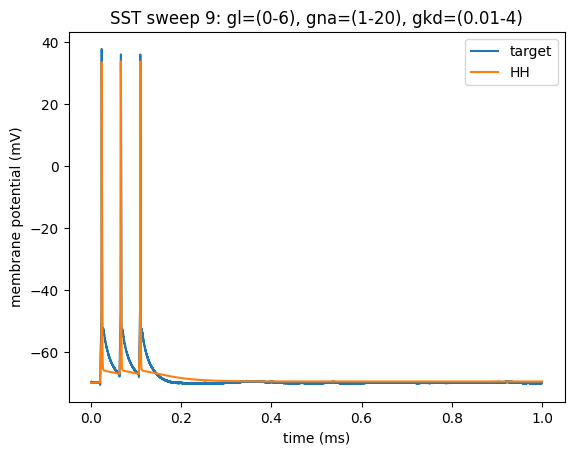

In [63]:
create_comparison_together(sliced_output_res[9], hh_sst_starters_4[9]*1000, d2_title='HH')
title('SST sweep 9: gl=(0-6), gna=(1-20), gkd=(0.01-4)')

In [ ]:
hh_sst_starters_5 = run_hh(sliced_input_amps, sliced_output_res, ena=60, \
                           glmin=1, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=4)

# tt: 9m 54.1s

first fit:
Round 0: Best parameters g_kd=2.19381726 uS, g_na=5.6890257 uS, gl=6.76884585 nS (error: 14.68700738 mV^2)
Round 1: Best parameters g_kd=3.1175471 uS, g_na=4.64299794 uS, gl=5.78910242 nS (error: 14.5068817 mV^2)
Round 2: Best parameters g_kd=3.45599252 uS, g_na=3.23620405 uS, gl=6.4260584 nS (error: 14.01818492 mV^2)
Round 3: Best parameters g_kd=2.52139078 uS, g_na=2.76288416 uS, gl=6.20312541 nS (error: 13.83520721 mV^2)
Round 4: Best parameters g_kd=3.61678227 uS, g_na=2.7238411 uS, gl=6.03606333 nS (error: 13.8183091 mV^2)
Round 5: Best parameters g_kd=2.67326254 uS, g_na=2.52928055 uS, gl=5.94602622 nS (error: 13.70904958 mV^2)
Round 6: Best parameters g_kd=3.31353683 uS, g_na=1.77267191 uS, gl=5.39793975 nS (error: 13.61921818 mV^2)
Round 7: Best parameters g_kd=3.12302211 uS, g_na=1.66322707 uS, gl=5.38557231 nS (error: 13.59599952 mV^2)
Round 8: Best parameters g_kd=1.04778143 uS, g_na=1.6414733 uS, gl=5.49863452 nS (error: 13.49657982 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'SST sweep 0: ena=60, gl=(1-20), gna=(1-50), gkd=(0.01-4)')

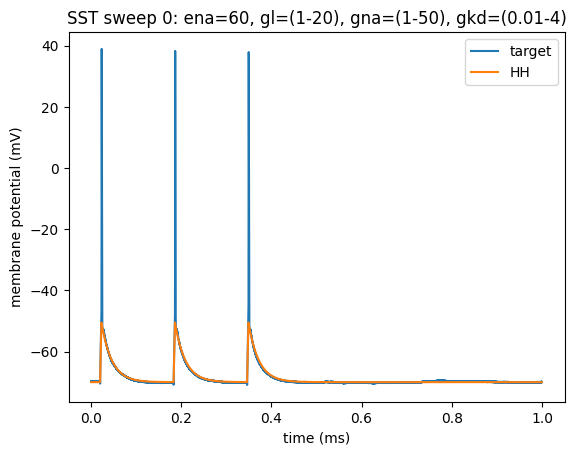

In [ ]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_5[0]*1000, d2_title='HH')
title('SST sweep 0: ena=60, gl=(1-20), gna=(1-50), gkd=(0.01-4)')

In [ ]:
hh_sst_starters_6 = run_hh(sliced_input_amps, sliced_output_res, ena=100, \
                           glmin=1, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=4)

# tt: 7m 27.7s

first fit:
Round 0: Best parameters g_kd=1.30129312 uS, g_na=7.0490325 uS, gl=7.91307362 nS (error: 15.52417659 mV^2)
Round 1: Best parameters g_kd=1.26395346 uS, g_na=5.5052517 uS, gl=7.41448479 nS (error: 14.70864627 mV^2)
Round 2: Best parameters g_kd=1.82716866 uS, g_na=4.76008145 uS, gl=7.18794822 nS (error: 14.59100304 mV^2)
Round 3: Best parameters g_kd=1.82716866 uS, g_na=4.76008145 uS, gl=7.18794822 nS (error: 14.59100304 mV^2)
Round 4: Best parameters g_kd=1.82716866 uS, g_na=4.76008145 uS, gl=7.18794822 nS (error: 14.59100304 mV^2)
Round 5: Best parameters g_kd=0.67548374 uS, g_na=3.10511591 uS, gl=6.71406322 nS (error: 14.44671887 mV^2)
Round 6: Best parameters g_kd=2.47952125 uS, g_na=3.18393704 uS, gl=6.60617017 nS (error: 14.33077913 mV^2)
Round 7: Best parameters g_kd=0.80822868 uS, g_na=2.78828915 uS, gl=8.77793087 nS (error: 14.06545035 mV^2)
Round 8: Best parameters g_kd=0.80822868 uS, g_na=2.78828915 uS, gl=8.77793087 nS (error: 14.06545035 mV^2)
Round 9: Best param

Text(0.5, 1.0, 'SST sweep 0: ena=100, gl=(1-20), gna=(1-50), gkd=(0.01-4)')

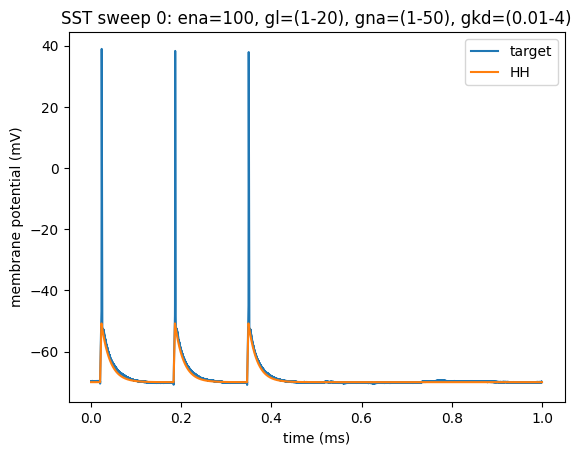

In [70]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_6[0]*1000, d2_title='HH')
title('SST sweep 0: ena=100, gl=(1-20), gna=(1-50), gkd=(0.01-4)')

In [69]:
hh_sst_starters_7 = run_hh(sliced_input_amps, sliced_output_res, ena=50, \
                           glmin=1, glmax=20, gnamin=5, gnamax=50, gkdmin=0.01, gkdmax=4)

# tt: 

first fit:
Round 0: Best parameters g_kd=3.1970457 uS, g_na=13.55104069 uS, gl=8.18377694 nS (error: 15.07954461 mV^2)
Round 1: Best parameters g_kd=3.45995848 uS, g_na=11.82455634 uS, gl=7.89012308 nS (error: 14.73521929 mV^2)
Round 2: Best parameters g_kd=3.49126115 uS, g_na=8.15487785 uS, gl=6.26861442 nS (error: 14.58095719 mV^2)
Round 3: Best parameters g_kd=1.7150662 uS, g_na=7.78968478 uS, gl=7.39766483 nS (error: 14.36617199 mV^2)
Round 4: Best parameters g_kd=1.7150662 uS, g_na=7.78968478 uS, gl=7.39766483 nS (error: 14.36617199 mV^2)
Round 5: Best parameters g_kd=2.89800552 uS, g_na=7.81276448 uS, gl=7.25929967 nS (error: 14.28230287 mV^2)
Round 6: Best parameters g_kd=2.89800552 uS, g_na=7.81276448 uS, gl=7.25929967 nS (error: 14.28230287 mV^2)
Round 7: Best parameters g_kd=1.00603828 uS, g_na=6.99698715 uS, gl=7.21933367 nS (error: 14.12204092 mV^2)
Round 8: Best parameters g_kd=1.0022797 uS, g_na=8.03672681 uS, gl=7.35149708 nS (error: 14.03011084 mV^2)
Round 9: Best param

Text(0.5, 1.0, 'SST sweep 0: ena=50, gl=(1-20), gna=(5-50), gkd=(0.01-4)')

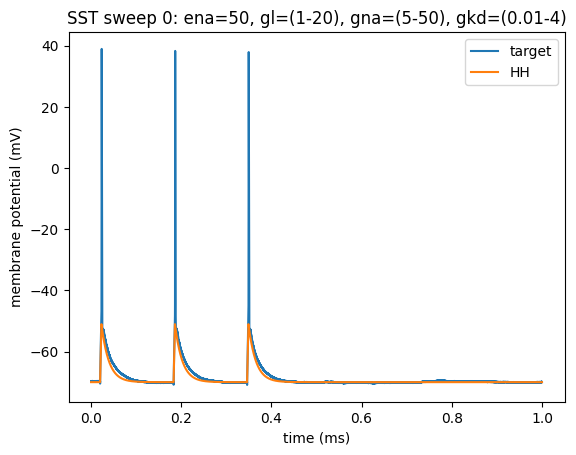

In [71]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_7[0]*1000, d2_title='HH')
title('SST sweep 0: ena=50, gl=(1-20), gna=(5-50), gkd=(0.01-4)')

In [ ]:
hh_sst_starters_8 = run_hh(sliced_input_amps, sliced_output_res, cm_var=200, vt=-70, \
                           glmin=1, glmax=10, gnamin=5, gnamax=50, gkdmin=0.01, gkdmax=4)

# tt: 7m 35.2s

first fit:
Round 0: Best parameters g_kd=1.23873905 uS, g_na=11.84748957 uS, gl=6.47062266 nS (error: 31.60217523 mV^2)
Round 1: Best parameters g_kd=0.99561763 uS, g_na=8.80934922 uS, gl=6.85036405 nS (error: 14.3805165 mV^2)
Round 2: Best parameters g_kd=0.83089809 uS, g_na=8.63975041 uS, gl=8.48402253 nS (error: 10.55032617 mV^2)
Round 3: Best parameters g_kd=0.76292691 uS, g_na=7.30567761 uS, gl=8.8182973 nS (error: 8.43329571 mV^2)
Round 4: Best parameters g_kd=0.76292691 uS, g_na=7.30567761 uS, gl=8.8182973 nS (error: 8.43329571 mV^2)
Round 5: Best parameters g_kd=0.76292691 uS, g_na=7.30567761 uS, gl=8.8182973 nS (error: 8.43329571 mV^2)
Round 6: Best parameters g_kd=0.67575232 uS, g_na=6.32639706 uS, gl=9.09890082 nS (error: 7.69656163 mV^2)
Round 7: Best parameters g_kd=0.68776196 uS, g_na=6.98779174 uS, gl=9.46650945 nS (error: 7.62716156 mV^2)
Round 8: Best parameters g_kd=0.68776196 uS, g_na=6.98779174 uS, gl=9.46650945 nS (error: 7.62716156 mV^2)
Round 9: Best parameters g

Text(0.5, 1.0, 'SST sweep 0: c=200, vt=-70, ena=40, gl=(1-10), gna=(5-50), gkd=(0.01-4)')

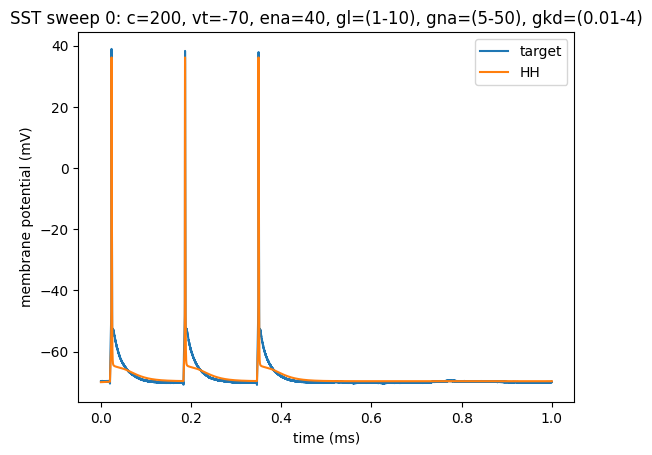

In [73]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_8[0]*1000, d2_title='HH')
title('SST sweep 0: c=200, vt=-70, ena=40, gl=(1-10), gna=(5-50), gkd=(0.01-4)')

In [ ]:
hh_sst_starters_9 = run_hh(sliced_input_amps, sliced_output_res, cm_var=200, vt=-70, \
                           glmin=1, glmax=8, gnamin=5, gnamax=50, gkdmin=0.01, gkdmax=4)

# tt: 5m 15.6s

first fit:
Round 0: Best parameters g_kd=0.96686125 uS, g_na=10.54154586 uS, gl=6.63764493 nS (error: 20.72040341 mV^2)
Round 1: Best parameters g_kd=0.98399022 uS, g_na=9.15795017 uS, gl=7.13891723 nS (error: 14.49588639 mV^2)
Round 2: Best parameters g_kd=0.93765152 uS, g_na=7.53552477 uS, gl=7.23593499 nS (error: 11.9276578 mV^2)
Round 3: Best parameters g_kd=0.80135012 uS, g_na=6.89894968 uS, gl=7.00280718 nS (error: 9.806371 mV^2)
Round 4: Best parameters g_kd=0.71780865 uS, g_na=6.43427916 uS, gl=7.5346804 nS (error: 9.71338027 mV^2)
Round 5: Best parameters g_kd=0.72476414 uS, g_na=6.41210969 uS, gl=7.67736892 nS (error: 8.79820991 mV^2)
Round 6: Best parameters g_kd=0.72476414 uS, g_na=6.41210969 uS, gl=7.67736892 nS (error: 8.79820991 mV^2)
Round 7: Best parameters g_kd=0.73311646 uS, g_na=6.18749795 uS, gl=7.67736892 nS (error: 8.6921894 mV^2)
Round 8: Best parameters g_kd=0.72825009 uS, g_na=6.1890121 uS, gl=7.77685616 nS (error: 8.61049339 mV^2)
Round 9: Best parameters g_k

Text(0.5, 1.0, 'SST sweep 0: c=200, vt=-70, ena=40, gl=(1-8), gna=(5-50), gkd=(0.01-4)')

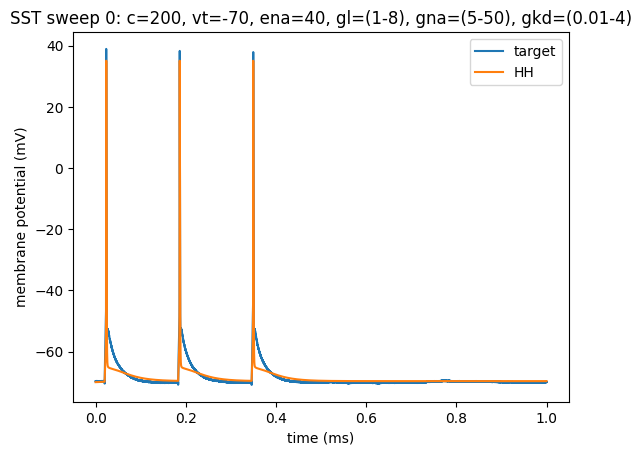

In [76]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_9[0]*1000, d2_title='HH')
title('SST sweep 0: c=200, vt=-70, ena=40, gl=(1-8), gna=(5-50), gkd=(0.01-4)')

In [ ]:
hh_sst_starters_10 = run_hh(sliced_input_amps, sliced_output_res, cm_var=200, vt=-70, \
                           glmin=1, glmax=8, gnamin=5, gnamax=50, gkdmin=1, gkdmax=5)

# tt: 5m 8.9s

first fit:
Round 0: Best parameters g_kd=2.69536451 uS, g_na=10.48060152 uS, gl=6.4443086 nS (error: 31.37196668 mV^2)
Round 1: Best parameters g_kd=1.81137458 uS, g_na=8.82024751 uS, gl=7.03874531 nS (error: 23.03878468 mV^2)
Round 2: Best parameters g_kd=1.47337991 uS, g_na=7.55604314 uS, gl=6.75050353 nS (error: 19.03553727 mV^2)
Round 3: Best parameters g_kd=1.33858206 uS, g_na=6.85242693 uS, gl=7.45053501 nS (error: 17.47175576 mV^2)
Round 4: Best parameters g_kd=1.18909002 uS, g_na=8.07073742 uS, gl=7.23723903 nS (error: 16.0960139 mV^2)
Round 5: Best parameters g_kd=1.13980073 uS, g_na=7.01759859 uS, gl=7.42865985 nS (error: 15.12936395 mV^2)
Round 6: Best parameters g_kd=1.09069405 uS, g_na=6.11218986 uS, gl=5.19515122 nS (error: 14.39691168 mV^2)
Round 7: Best parameters g_kd=1.07570191 uS, g_na=6.4262547 uS, gl=5.88703216 nS (error: 14.12574214 mV^2)
Round 8: Best parameters g_kd=1.05061 uS, g_na=7.09000441 uS, gl=6.49838715 nS (error: 13.7093899 mV^2)
Round 9: Best parameter

Text(0.5, 1.0, 'SST sweep 0: c=200, vt=-70, ena=40, gl=(1-8), gna=(5-50), gkd=(1-5)')

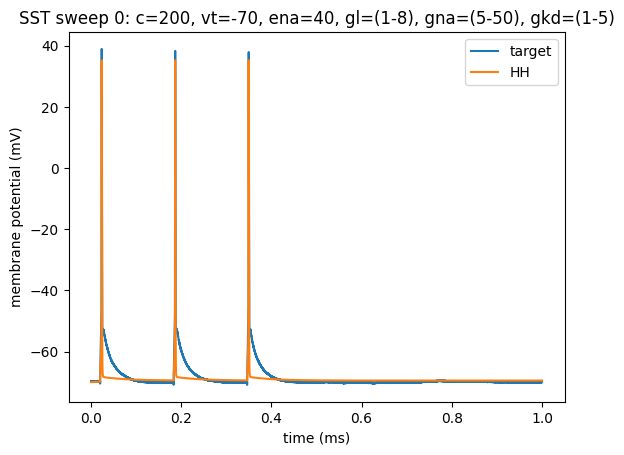

In [79]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_10[0]*1000, d2_title='HH')
title('SST sweep 0: c=200, vt=-70, ena=40, gl=(1-8), gna=(5-50), gkd=(1-5)')

In [ ]:
hh_sst_starters_11 = run_hh(sliced_input_amps, sliced_output_res, cm_var=200, vt=-70, \
                           glmin=1, glmax=8, gnamin=5, gnamax=50, gkdmin=0.01, gkdmax=0.05)

# tt: 5m 22.9s

first fit:
Round 0: Best parameters g_kd=37.11407688 nS, g_na=11.73935109 uS, gl=6.45978376 nS (error: 3163.61639686 mV^2)
Round 1: Best parameters g_kd=45.85128189 nS, g_na=8.93575956 uS, gl=6.96149685 nS (error: 2711.51505637 mV^2)
Round 2: Best parameters g_kd=44.35954092 nS, g_na=7.09381445 uS, gl=6.18056957 nS (error: 2550.24786788 mV^2)
Round 3: Best parameters g_kd=46.83780207 nS, g_na=6.33776243 uS, gl=7.43464563 nS (error: 2391.19575467 mV^2)
Round 4: Best parameters g_kd=47.22131261 nS, g_na=5.89281169 uS, gl=7.43464563 nS (error: 2328.77194723 mV^2)
Round 5: Best parameters g_kd=47.9246015 nS, g_na=5.70333391 uS, gl=7.69889826 nS (error: 2289.08335783 mV^2)
Round 6: Best parameters g_kd=47.52767352 nS, g_na=5.46030243 uS, gl=7.771802 nS (error: 2259.96584577 mV^2)
Round 7: Best parameters g_kd=48.20553787 nS, g_na=5.37510826 uS, gl=7.77445772 nS (error: 2239.74874761 mV^2)
Round 8: Best parameters g_kd=48.66898142 nS, g_na=5.32144358 uS, gl=7.74927028 nS (error: 2227.1773728

Text(0.5, 1.0, 'SST sweep 0: c=200, vt=-70, ena=40, gl=(1-8), gna=(5-50), gkd=(0.01-0.05)')

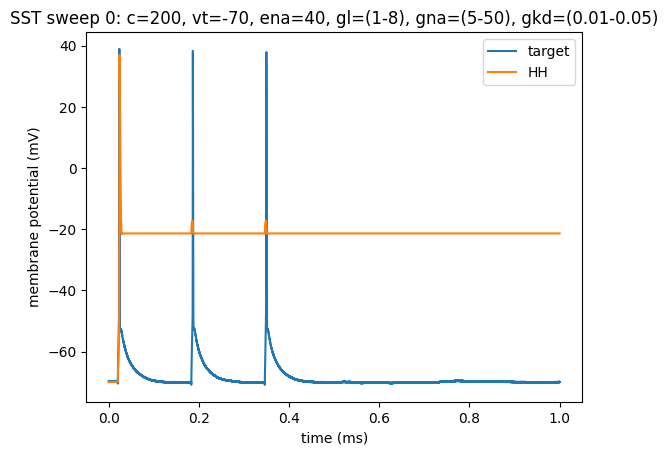

In [97]:
create_comparison_together(sliced_output_res[0], hh_sst_starters_11[0]*1000, d2_title='HH')
title('SST sweep 0: c=200, vt=-70, ena=40, gl=(1-8), gna=(5-50), gkd=(0.01-0.05)')

***

***

In [ ]:
lif_sst_starters_0 = run_lif(sliced_input_amps, sliced_output_res, cm_var=200, reset_var='v=-70*mV', thresh_var='v>-50*mV')

# tt: 55.3s

first fit:
Round 0: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)
Round 1: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)
Round 2: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)
Round 3: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)
Round 4: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)
Round 5: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)
Round 6: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)
Round 7: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)
Round 8: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)
Round 9: Best parameters R=142.94187725 Mohm, tau=18.15398459 ms (error: 15.73672883 mV^2)


Text(0.5, 1.0, 'SST sweep 0: c=200, reset=-70, thresh>-50')

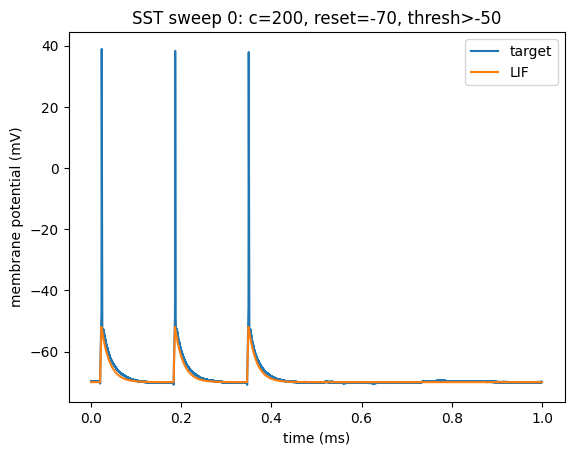

In [77]:
create_comparison_together(sliced_output_res[0], lif_sst_starters_0[0]*1000, d2_title='LIF')
title('SST sweep 0: c=200, reset=-70, thresh>-50')

Text(0.5, 1.0, 'SST sweep 1: c=200, reset=-70, thresh>-50')

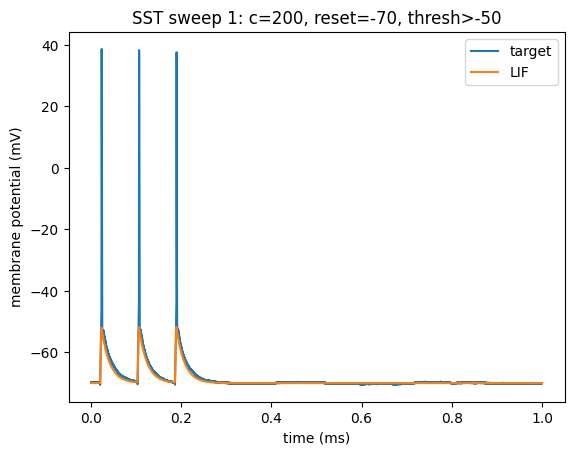

In [82]:
create_comparison_together(sliced_output_res[1], lif_sst_starters_0[1]*1000, d2_title='LIF')
title('SST sweep 1: c=200, reset=-70, thresh>-50')

Text(0.5, 1.0, 'SST sweep 2: c=200, reset=-70, thresh>-50')

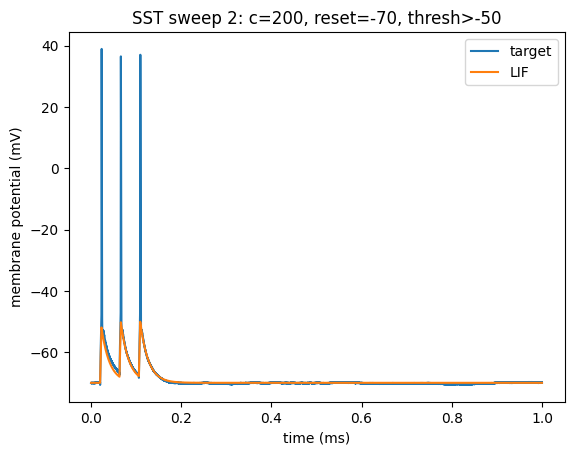

In [83]:
create_comparison_together(sliced_output_res[2], lif_sst_starters_0[2]*1000, d2_title='LIF')
title('SST sweep 2: c=200, reset=-70, thresh>-50')

Text(0.5, 1.0, 'SST sweep 3: c=200, reset=-70, thresh>-50')

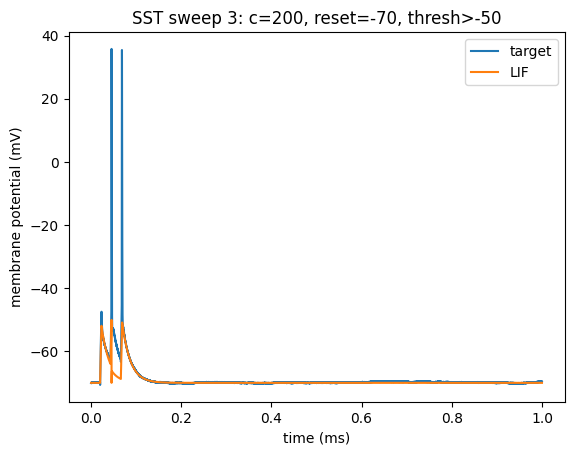

In [84]:
create_comparison_together(sliced_output_res[3], lif_sst_starters_0[3]*1000, d2_title='LIF')
title('SST sweep 3: c=200, reset=-70, thresh>-50')

(0.0, 0.2)

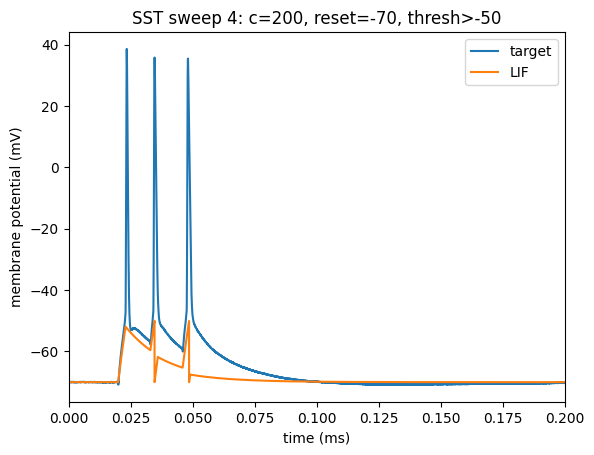

In [91]:
create_comparison_together(sliced_output_res[4], lif_sst_starters_0[4]*1000, d2_title='LIF')
title('SST sweep 4: c=200, reset=-70, thresh>-50')
xlim(0, 0.2)

(0.0, 0.2)

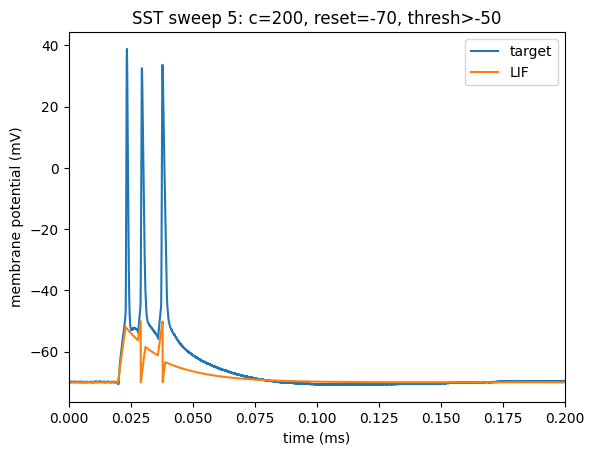

In [93]:
create_comparison_together(sliced_output_res[5], lif_sst_starters_0[5]*1000, d2_title='LIF')
title('SST sweep 5: c=200, reset=-70, thresh>-50')
xlim(0, 0.2)

Text(0.5, 1.0, 'SST sweep 6: c=200, reset=-70, thresh>-50')

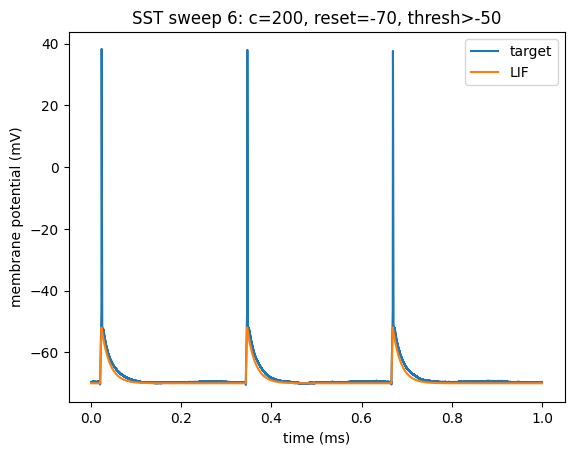

In [87]:
create_comparison_together(sliced_output_res[6], lif_sst_starters_0[6]*1000, d2_title='LIF')
title('SST sweep 6: c=200, reset=-70, thresh>-50')

Text(0.5, 1.0, 'SST sweep 7: c=200, reset=-70, thresh>-50')

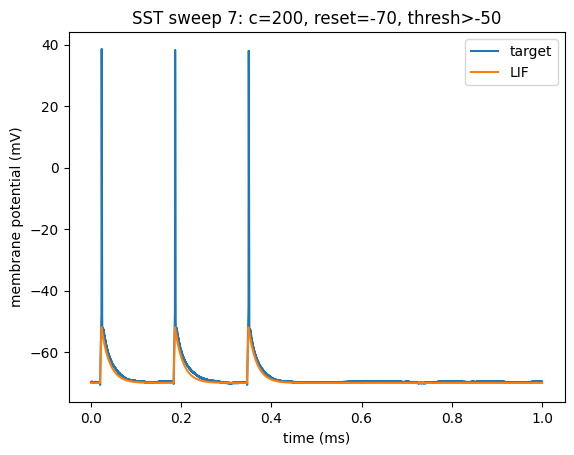

In [88]:
create_comparison_together(sliced_output_res[7], lif_sst_starters_0[7]*1000, d2_title='LIF')
title('SST sweep 7: c=200, reset=-70, thresh>-50')

Text(0.5, 1.0, 'SST sweep 8: c=200, reset=-70, thresh>-50')

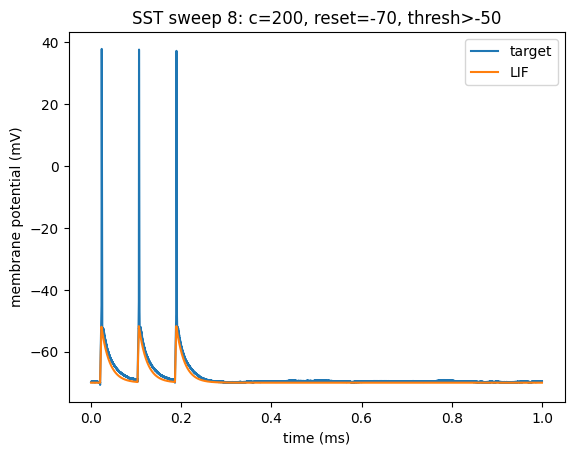

In [89]:
create_comparison_together(sliced_output_res[8], lif_sst_starters_0[8]*1000, d2_title='LIF')
title('SST sweep 8: c=200, reset=-70, thresh>-50')

Text(0.5, 1.0, 'SST sweep 9: c=200, reset=-70, thresh>-50')

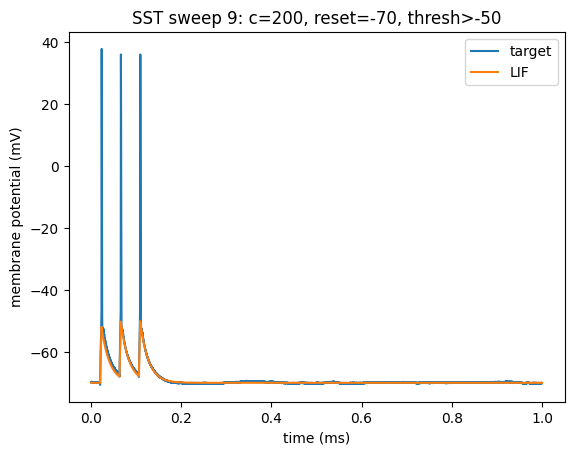

In [90]:
create_comparison_together(sliced_output_res[9], lif_sst_starters_0[9]*1000, d2_title='LIF')
title('SST sweep 9: c=200, reset=-70, thresh>-50')

Text(0.5, 1.0, 'Sweep 9')

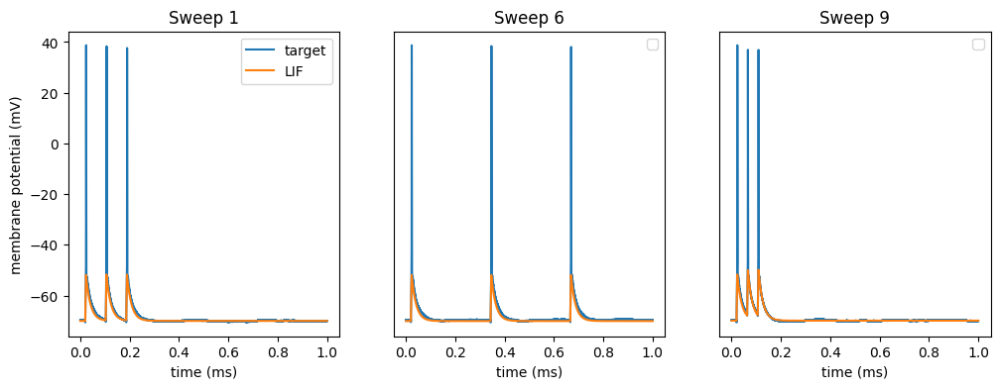

In [640]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(sliced_output_res[1], lif_sst_starters_0[1]*1000, d2_title='LIF')
# xlim(0, 0.1)
ylabel('membrane potential (mV)')
# xlim(0, 0.2)
title('Sweep 1')

subplot(1,3,2)
create_comparison_together(sliced_output_res[6], lif_sst_starters_0[6]*1000, d1_title='', d2_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
# xlim(0, 0.2)
title('Sweep 6')

subplot(1,3,3)
create_comparison_together(sliced_output_res[9], lif_sst_starters_0[9]*1000, d1_title='', d2_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
# xlim(0, 0.2)
title('Sweep 9')

Text(0.5, 1.0, 'Sweep 5')

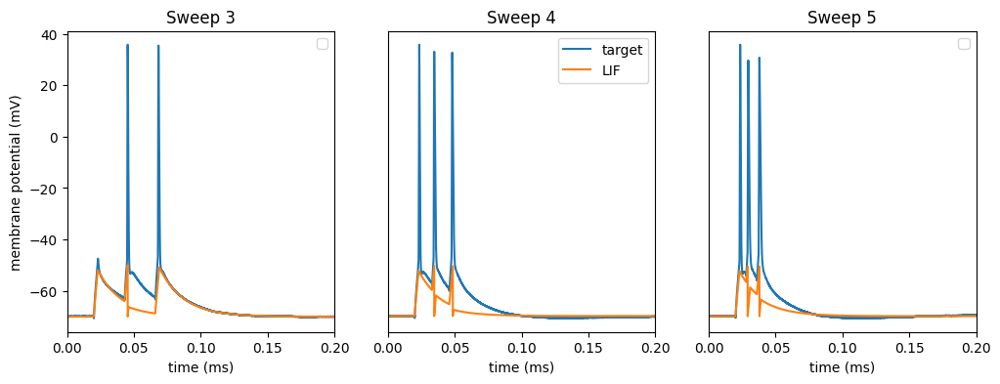

In [639]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(sliced_output_res[3], lif_sst_starters_0[3]*1000, d1_title='', d2_title='')
ylabel('membrane potential (mV)')
xlim(0, 0.2)
title('Sweep 3')

subplot(1,3,2)
create_comparison_together(sliced_output_res[4], lif_sst_starters_0[4]*1000, d2_title='LIF')
ax = plt.gca()
ax.yaxis.set_visible(False)
xlim(0, 0.2)
title('Sweep 4')

subplot(1,3,3)
create_comparison_together(sliced_output_res[5], lif_sst_starters_0[5]*1000, d1_title='', d2_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
xlim(0, 0.2)
title('Sweep 5')

***

***

In [ ]:
adex_sst_starters_0 = run_adex(sliced_input_amps, sliced_output_res, c_var=200, gl_var=10)

# tt: 1m 9.3s

first fit:
Round 0: Best parameters a=1.8486368 nS, b=59.58268892 pA, tauw=131.25975874 ms (error: 18.5594053 mV^2)
Round 1: Best parameters a=1.33925031 nS, b=39.1739643 pA, tauw=150.00875213 ms (error: 18.37386338 mV^2)
Round 2: Best parameters a=1.45787857 nS, b=23.96970585 pA, tauw=138.10237161 ms (error: 18.3105603 mV^2)
Round 3: Best parameters a=1.17325806 nS, b=14.82514673 pA, tauw=126.52916091 ms (error: 18.24736019 mV^2)
Round 4: Best parameters a=1.11992478 nS, b=9.09555571 pA, tauw=138.10237161 ms (error: 18.22132493 mV^2)
Round 5: Best parameters a=1.06668805 nS, b=7.86007243 pA, tauw=151.47029459 ms (error: 18.20762223 mV^2)
Round 6: Best parameters a=1.047317 nS, b=6.80113002 pA, tauw=156.9676363 ms (error: 18.20116793 mV^2)
Round 7: Best parameters a=1.04765241 nS, b=4.95855807 pA, tauw=157.54172441 ms (error: 18.19684505 mV^2)
Round 8: Best parameters a=1.03771625 nS, b=3.92837023 pA, tauw=156.73724519 ms (error: 18.19383026 mV^2)
Round 9: Best parameters a=1.02266437 

Text(0.5, 1.0, 'SST sweep 0: c=200, gl=10')

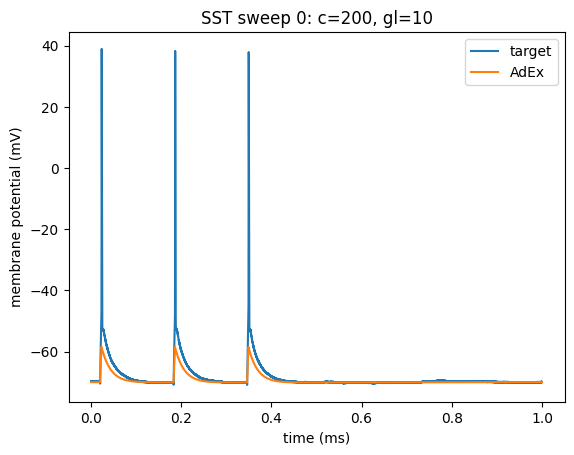

In [81]:
create_comparison_together(sliced_output_res[0], adex_sst_starters_0[0]*1000, d2_title='AdEx')
title('SST sweep 0: c=200, gl=10')

In [ ]:
adex_sst_starters_1 = run_adex(sliced_input_amps, sliced_output_res)

# tt: 1m 4s

first fit:
Round 0: Best parameters a=3.20930227 nS, b=68.94403469 pA, tauw=127.38748564 ms (error: 16.69105131 mV^2)
Round 1: Best parameters a=1.4881453 nS, b=39.83135911 pA, tauw=134.49972802 ms (error: 14.89491485 mV^2)
Round 2: Best parameters a=1.32675523 nS, b=26.52659352 pA, tauw=124.87144789 ms (error: 14.36845982 mV^2)
Round 3: Best parameters a=1.23007923 nS, b=15.65587183 pA, tauw=125.39639955 ms (error: 14.1431406 mV^2)
Round 4: Best parameters a=1.20049687 nS, b=11.32428112 pA, tauw=124.19496286 ms (error: 14.09167962 mV^2)
Round 5: Best parameters a=1.1454504 nS, b=9.69967133 pA, tauw=125.59522304 ms (error: 14.07768595 mV^2)
Round 6: Best parameters a=1.10969421 nS, b=7.6808312 pA, tauw=122.1669036 ms (error: 14.06325292 mV^2)
Round 7: Best parameters a=1.07778358 nS, b=7.43530132 pA, tauw=121.75652588 ms (error: 14.05949865 mV^2)
Round 8: Best parameters a=1.05892761 nS, b=6.68672523 pA, tauw=122.10495174 ms (error: 14.05721774 mV^2)
Round 9: Best parameters a=1.045090

Text(0.5, 1.0, 'SST sweep 0: c=120, gl=5, vt=-50')

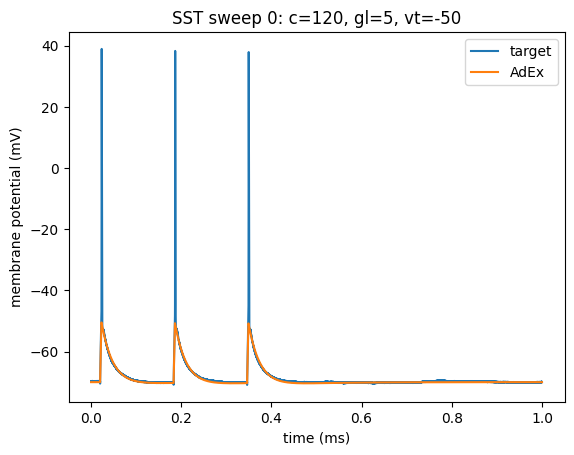

In [96]:
create_comparison_together(sliced_output_res[0], adex_sst_starters_1[0]*1000, d2_title='AdEx')
title('SST sweep 0: c=120, gl=5, vt=-50')

Text(0.5, 1.0, 'SST sweep 1: c=120, gl=5, vt=-50')

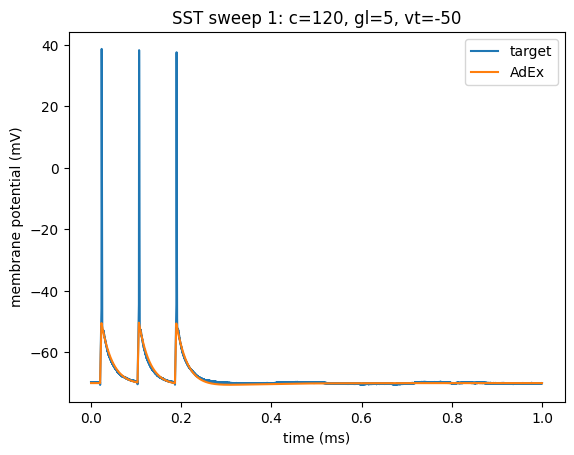

In [98]:
create_comparison_together(sliced_output_res[1], adex_sst_starters_1[1]*1000, d2_title='AdEx')
title('SST sweep 1: c=120, gl=5, vt=-50')

Text(0.5, 1.0, 'SST sweep 2: c=120, gl=5, vt=-50')

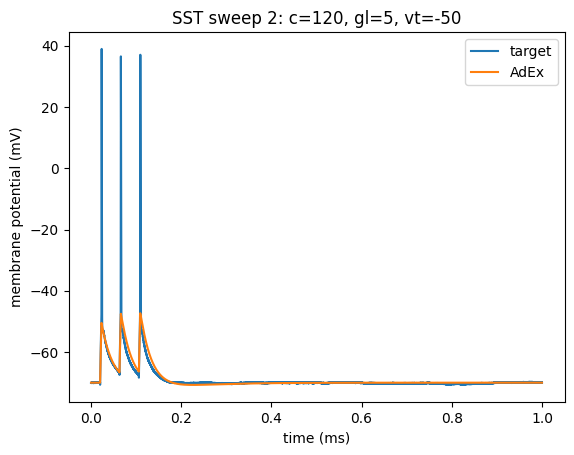

In [99]:
create_comparison_together(sliced_output_res[2], adex_sst_starters_1[2]*1000, d2_title='AdEx')
title('SST sweep 2: c=120, gl=5, vt=-50')

(0.0, 0.2)

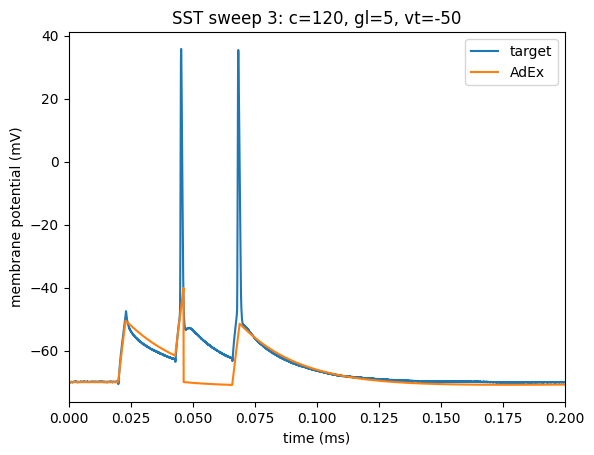

In [103]:
create_comparison_together(sliced_output_res[3], adex_sst_starters_1[3]*1000, d2_title='AdEx')
title('SST sweep 3: c=120, gl=5, vt=-50')
xlim(0, 0.2)

(0.0, 0.2)

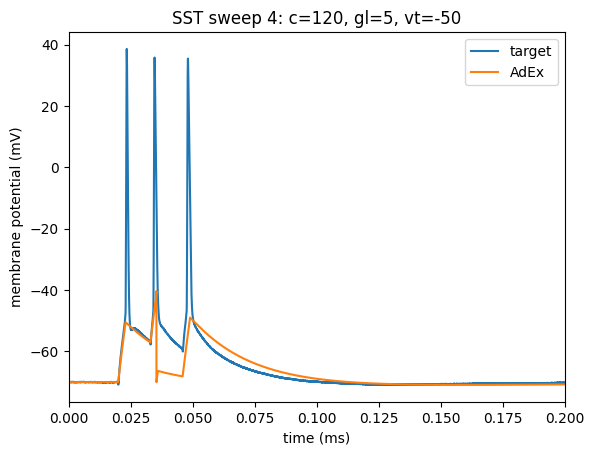

In [102]:
create_comparison_together(sliced_output_res[4], adex_sst_starters_1[4]*1000, d2_title='AdEx')
title('SST sweep 4: c=120, gl=5, vt=-50')
xlim(0, 0.2)

(0.0, 0.2)

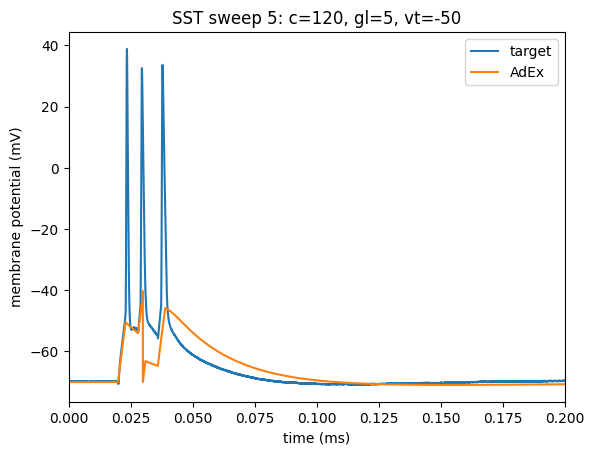

In [105]:
create_comparison_together(sliced_output_res[5], adex_sst_starters_1[5]*1000, d2_title='AdEx')
title('SST sweep 5: c=120, gl=5, vt=-50')
xlim(0, 0.2)

Text(0.5, 1.0, 'SST sweep 6: c=120, gl=5, vt=-50')

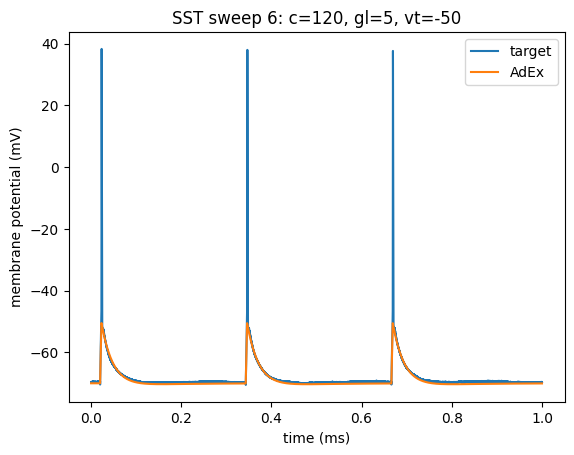

In [106]:
create_comparison_together(sliced_output_res[6], adex_sst_starters_1[6]*1000, d2_title='AdEx')
title('SST sweep 6: c=120, gl=5, vt=-50')

Text(0.5, 1.0, 'SST sweep 7: c=120, gl=5, vt=-50')

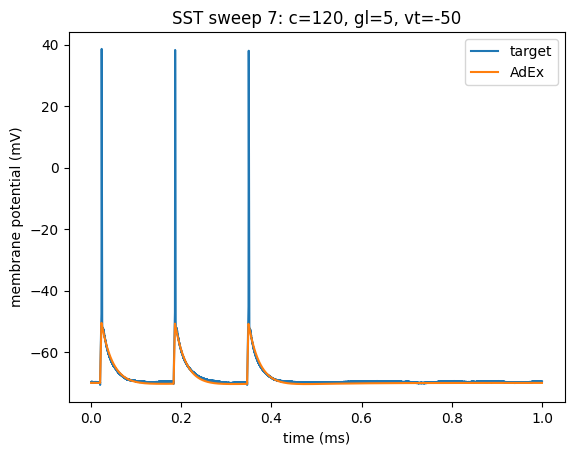

In [107]:
create_comparison_together(sliced_output_res[7], adex_sst_starters_1[7]*1000, d2_title='AdEx')
title('SST sweep 7: c=120, gl=5, vt=-50')

Text(0.5, 1.0, 'SST sweep 8: c=120, gl=5, vt=-50')

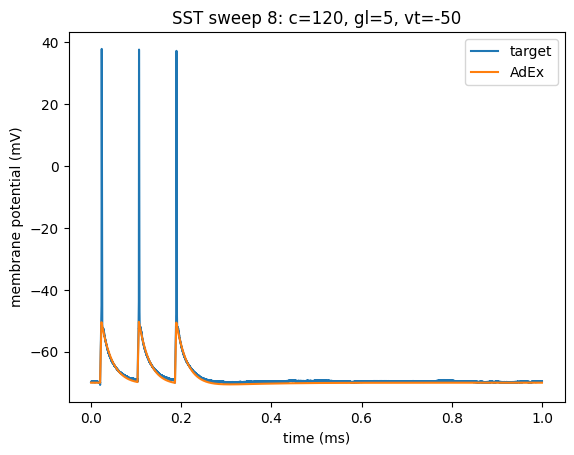

In [108]:
create_comparison_together(sliced_output_res[8], adex_sst_starters_1[8]*1000, d2_title='AdEx')
title('SST sweep 8: c=120, gl=5, vt=-50')

Text(0.5, 1.0, 'SST sweep 9: c=120, gl=5, vt=-50')

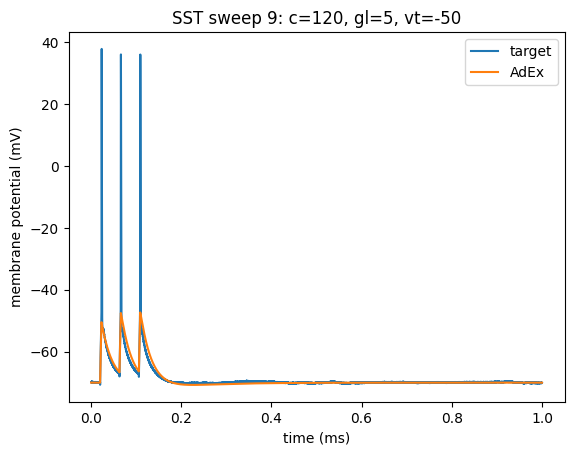

In [109]:
create_comparison_together(sliced_output_res[9], adex_sst_starters_1[9]*1000, d2_title='AdEx')
title('SST sweep 9: c=120, gl=5, vt=-50')

WARNING    c:\Users\yjk16\OneDrive\Desktop\CS Master's\Dissertation\diss files\general_functions.py:485: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  legend()
 [py.warnings]


Text(0.5, 1.0, 'Sweep 9')

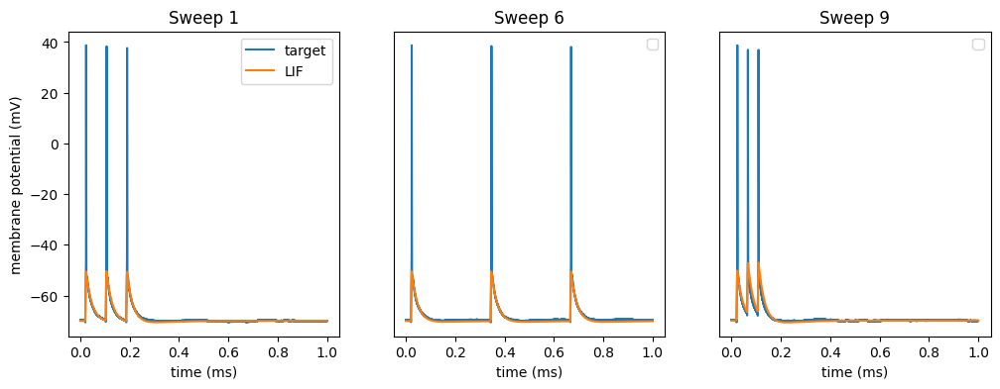

In [643]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(sliced_output_res[1], adex_sst_starters_1[1]*1000, d2_title='LIF')
ylabel('membrane potential (mV)')
title('Sweep 1')

subplot(1,3,2)
create_comparison_together(sliced_output_res[6], adex_sst_starters_1[6]*1000, d1_title='', d2_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Sweep 6')

subplot(1,3,3)
create_comparison_together(sliced_output_res[9], adex_sst_starters_1[9]*1000, d1_title='', d2_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Sweep 9')

WARNING    c:\Users\yjk16\OneDrive\Desktop\CS Master's\Dissertation\diss files\general_functions.py:485: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  legend()
 [py.warnings]


Text(0.5, 1.0, 'Sweep 5')

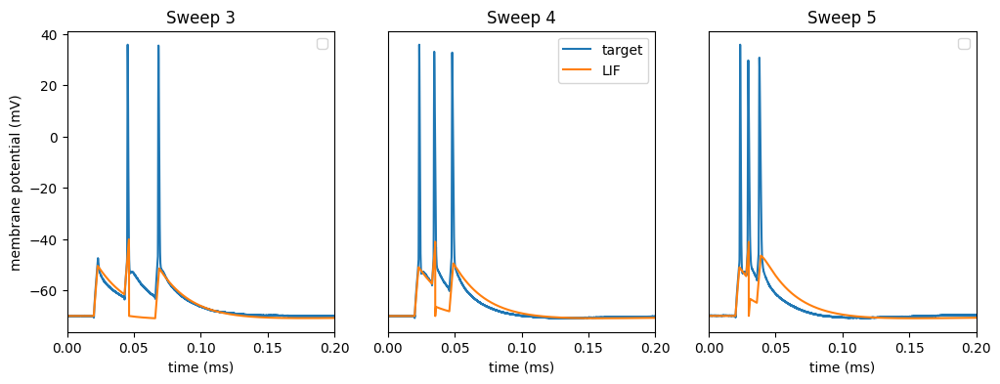

In [641]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(sliced_output_res[3], adex_sst_starters_1[3]*1000, d1_title='', d2_title='')
ylabel('membrane potential (mV)')
xlim(0, 0.2)
title('Sweep 3')

subplot(1,3,2)
create_comparison_together(sliced_output_res[4], adex_sst_starters_1[4]*1000, d2_title='LIF')
ax = plt.gca()
ax.yaxis.set_visible(False)
xlim(0, 0.2)
title('Sweep 4')

subplot(1,3,3)
create_comparison_together(sliced_output_res[5], adex_sst_starters_1[5]*1000, d1_title='', d2_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
xlim(0, 0.2)
title('Sweep 5')

***
***

Text(0.5, 1.0, 'Comparison on sweep 0: Short Square: Triple stimulus')

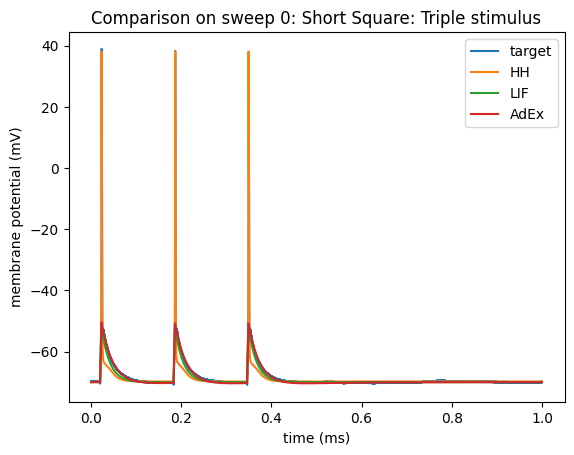

In [113]:
create_comparison_together_four(sliced_output_res[0], hh_sst_starters_3[0]*1000, lif_sst_starters_0[0]*1000, adex_sst_starters_1[0]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 0: Short Square: Triple stimulus')

Text(0.5, 1.0, 'Comparison on sweep 1: Short Square: Triple stimulus')

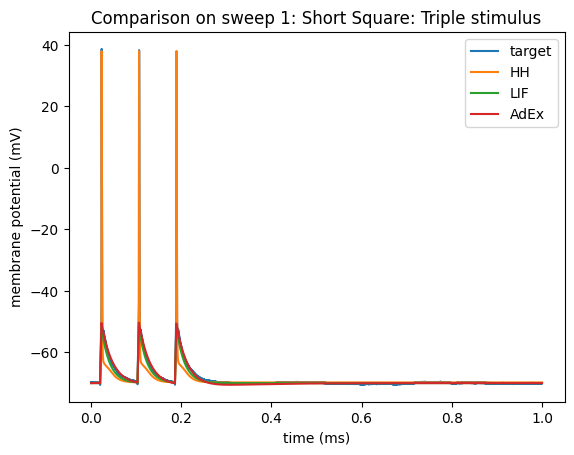

In [114]:
create_comparison_together_four(sliced_output_res[1], hh_sst_starters_3[1]*1000, lif_sst_starters_0[1]*1000, adex_sst_starters_1[1]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 1: Short Square: Triple stimulus')

Text(0.5, 1.0, 'Comparison on sweep 2: Short Square: Triple stimulus')

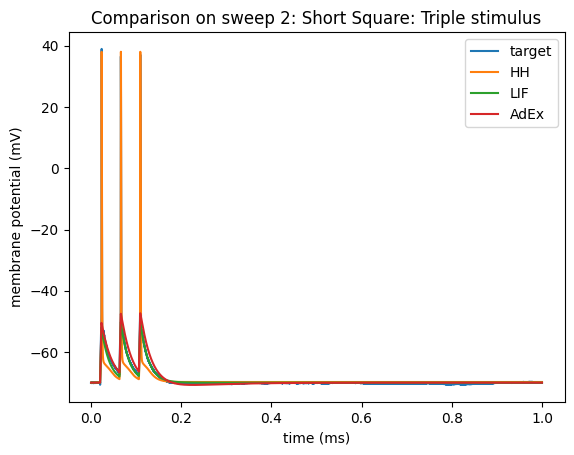

In [143]:
create_comparison_together_four(sliced_output_res[2], hh_sst_starters_3[2]*1000, lif_sst_starters_0[2]*1000, adex_sst_starters_1[2]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 2: Short Square: Triple stimulus')
# xlim(0, 0.2)

(0.0, 0.2)

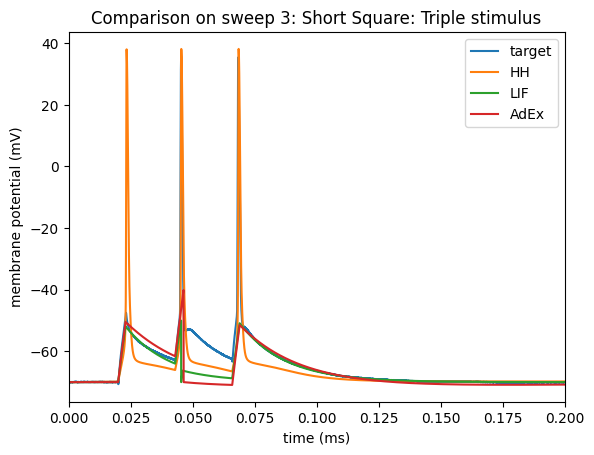

In [116]:
create_comparison_together_four(sliced_output_res[3], hh_sst_starters_3[3]*1000, lif_sst_starters_0[3]*1000, adex_sst_starters_1[3]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 3: Short Square: Triple stimulus')
xlim(0, 0.2)

(0.0, 0.2)

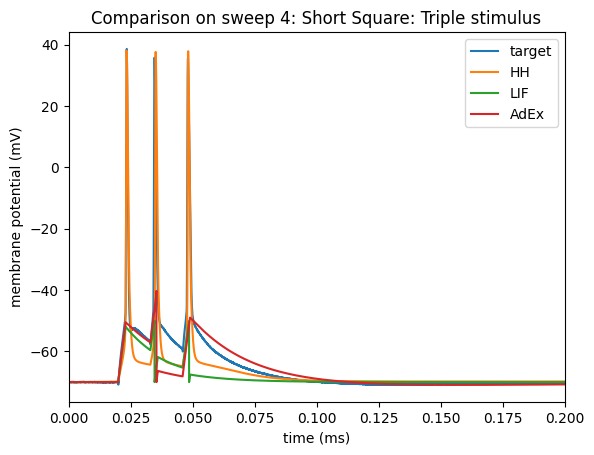

In [117]:
create_comparison_together_four(sliced_output_res[4], hh_sst_starters_3[4]*1000, lif_sst_starters_0[4]*1000, adex_sst_starters_1[4]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 4: Short Square: Triple stimulus')
xlim(0, 0.2)

(0.0, 0.2)

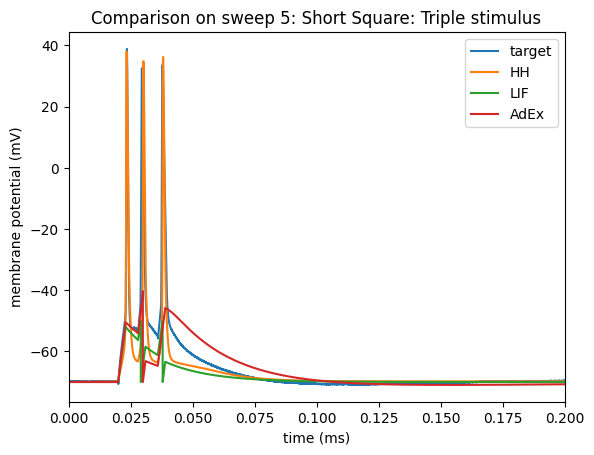

In [118]:
create_comparison_together_four(sliced_output_res[5], hh_sst_starters_3[5]*1000, lif_sst_starters_0[5]*1000, adex_sst_starters_1[5]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 5: Short Square: Triple stimulus')
xlim(0, 0.2)

Text(0.5, 1.0, 'Comparison on sweep 6: Short Square: Triple stimulus')

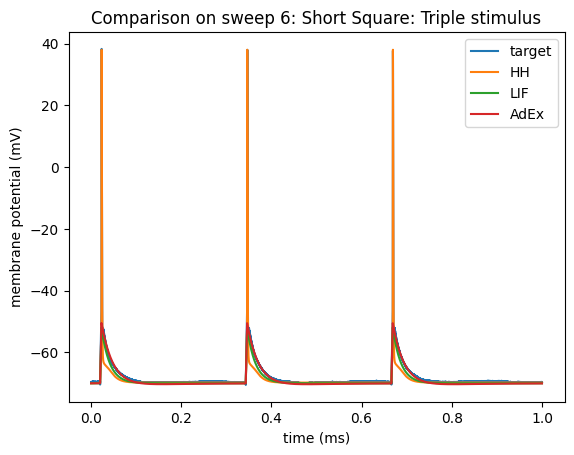

In [119]:
create_comparison_together_four(sliced_output_res[6], hh_sst_starters_3[6]*1000, lif_sst_starters_0[6]*1000, adex_sst_starters_1[6]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 6: Short Square: Triple stimulus')
# xlim(0, 0.2)

Text(0.5, 1.0, 'Comparison on sweep 7: Short Square: Triple stimulus')

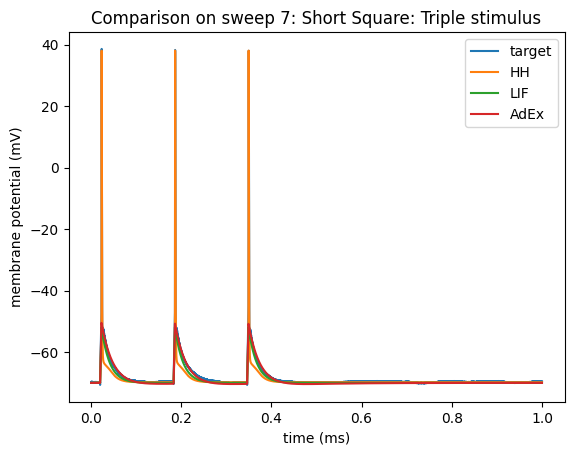

In [120]:
create_comparison_together_four(sliced_output_res[7], hh_sst_starters_3[7]*1000, lif_sst_starters_0[7]*1000, adex_sst_starters_1[7]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 7: Short Square: Triple stimulus')

Text(0.5, 1.0, 'Comparison on sweep 8: Short Square: Triple stimulus')

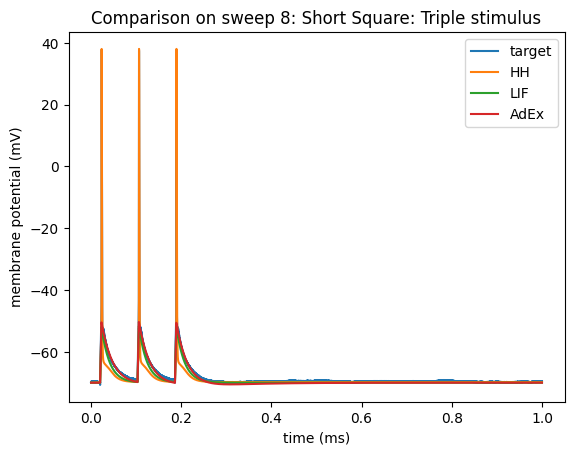

In [121]:
create_comparison_together_four(sliced_output_res[8], hh_sst_starters_3[8]*1000, lif_sst_starters_0[8]*1000, adex_sst_starters_1[8]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 8: Short Square: Triple stimulus')


Text(0.5, 1.0, 'Comparison on sweep 9: Short Square: Triple stimulus')

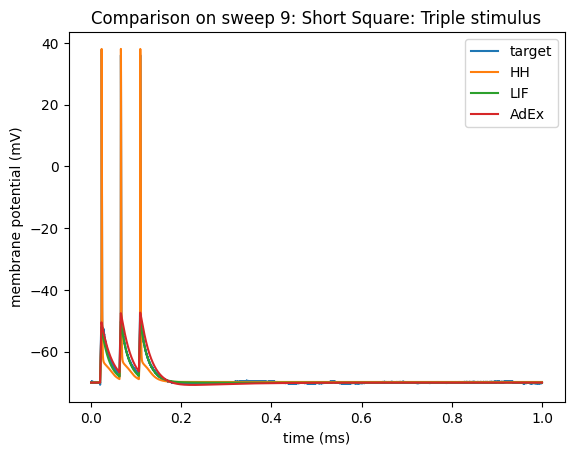

In [122]:
create_comparison_together_four(sliced_output_res[9], hh_sst_starters_3[9]*1000, lif_sst_starters_0[9]*1000, adex_sst_starters_1[9]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
title('Comparison on sweep 9: Short Square: Triple stimulus')


([], [])

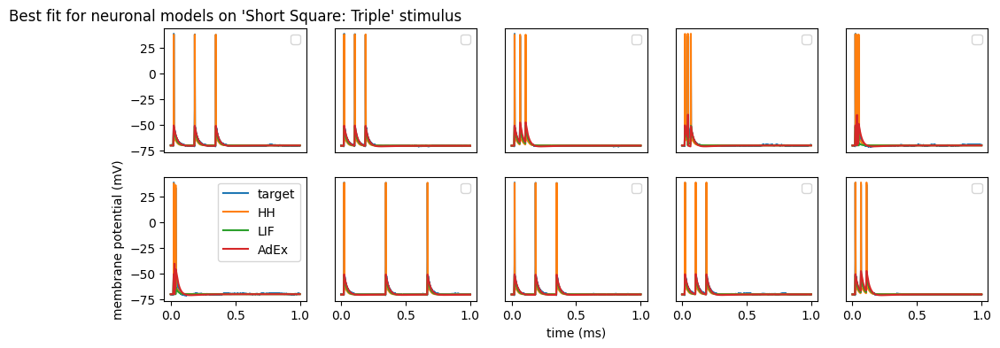

In [142]:
figure(figsize=(12,4))

ts = (np.arange(0, len(sliced_output_res[0]))) * (1/50_000)

subplot(2,5,1)
create_comparison_together_four(sliced_output_res[0], hh_sst_starters_3[0]*1000, lif_sst_starters_0[0]*1000, adex_sst_starters_1[0]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
# title('Sweep 0')
# ax = plt.gca()
# ax.yaxis.set_visible(False)

tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
ylabel('')

# yticks([])
title(f"Best fit for neuronal models on 'Short Square: Triple' stimulus")

subplot(2,5,2)
create_comparison_together_four(sliced_output_res[1], hh_sst_starters_3[1]*1000, lif_sst_starters_0[1]*1000, adex_sst_starters_1[1]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
# title('Sweep 1')
ax = plt.gca()
ax.yaxis.set_visible(False)
tick_params(
axis='x',          
which='both',     
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
yticks([])

subplot(2,5,3)
create_comparison_together_four(sliced_output_res[2], hh_sst_starters_3[2]*1000, lif_sst_starters_0[2]*1000, adex_sst_starters_1[2]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
# title('Sweep 2')
# xlim(0, 0.2)
ax = plt.gca()
ax.yaxis.set_visible(False)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
yticks([])

subplot(2,5,4)
create_comparison_together_four(sliced_output_res[3], hh_sst_starters_3[3]*1000, lif_sst_starters_0[3]*1000, adex_sst_starters_1[3]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
# xlim(0, 0.2)
# title('Sweep 3')
ax = plt.gca()
ax.yaxis.set_visible(False)
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
yticks([])

subplot(2,5,5)
create_comparison_together_four(sliced_output_res[4], hh_sst_starters_3[4]*1000, lif_sst_starters_0[4]*1000, adex_sst_starters_1[4]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
# xlim(0, 0.2)
# title('Sweep 4')
tick_params(
axis='x',          
which='both',      
bottom=False,      
top=False,         
labelbottom=False)
xlabel('')
yticks([])
ax = plt.gca()
ax.yaxis.set_visible(False)

subplot(2,5,6)
create_comparison_together_four(sliced_output_res[5], hh_sst_starters_3[5]*1000, lif_sst_starters_0[5]*1000, adex_sst_starters_1[5]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
# xlim(0, 0.2)
# title('Sweep 5')
xlabel('')
# ylabel('input current (pA)')
ylabel('membrane potential (mV)')

subplot(2,5,7)
create_comparison_together_four(sliced_output_res[6], hh_sst_starters_3[6]*1000, lif_sst_starters_0[6]*1000, adex_sst_starters_1[6]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
# title('Sweep 6')
ax = plt.gca()
ax.yaxis.set_visible(False)
xlabel('')
yticks([])

subplot(2,5,8)
create_comparison_together_four(sliced_output_res[7], hh_sst_starters_3[7]*1000, lif_sst_starters_0[7]*1000, adex_sst_starters_1[7]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
# xlabel('')
yticks([])

subplot(2,5,9)
create_comparison_together_four(sliced_output_res[8], hh_sst_starters_3[8]*1000, lif_sst_starters_0[8]*1000, adex_sst_starters_1[8]*1000,\
                               d1_title='', d2_title='', d3_title='', d4_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
xlabel('')
yticks([])

subplot(2,5,10)
create_comparison_together_four(sliced_output_res[9], hh_sst_starters_3[9]*1000, lif_sst_starters_0[9]*1000, adex_sst_starters_1[9]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
xlabel('')
# title('Sweep 9')
yticks([])

WARNING    c:\Users\yjk16\OneDrive\Desktop\CS Master's\Dissertation\diss files\general_functions.py:508: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  legend()
 [py.warnings]


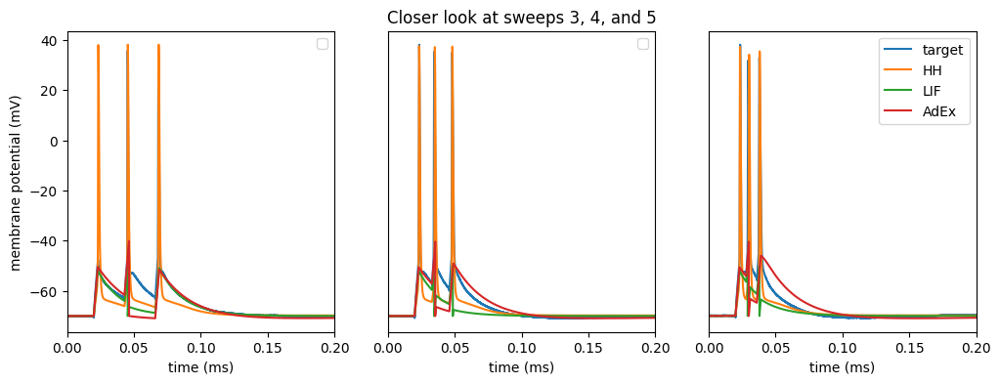

In [144]:
# closer look at sweeps 3, 4, 5:

figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together_four(sliced_output_res[3], hh_sst_starters_3[3]*1000, lif_sst_starters_0[3]*1000, adex_sst_starters_1[3]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
xlim(0, 0.2)
ylabel('membrane potential (mV)')

subplot(1,3,2)
create_comparison_together_four(sliced_output_res[4], hh_sst_starters_3[4]*1000, lif_sst_starters_0[4]*1000, adex_sst_starters_1[4]*1000,\
                                d1_title='', d2_title='', d3_title='', d4_title='')
xlim(0, 0.2)
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Closer look at sweeps 3, 4, and 5')

subplot(1,3,3)
create_comparison_together_four(sliced_output_res[5], hh_sst_starters_3[5]*1000, lif_sst_starters_0[5]*1000, adex_sst_starters_1[5]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
xlim(0, 0.2)
ax = plt.gca()
ax.yaxis.set_visible(False)

***
***

# HH ON FAST SLICED (3 ARRAYS OF LEN 5_000)

***

In [ ]:
hh_sst_fast_0 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=200, vt=-70,\
                           glmin=10, glmax=40, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=4)

# tt: 26.6s


first fit:
Round 0: Best parameters g_kd=0.80072483 uS, g_na=10.83014724 uS, gl=14.2177816 nS (error: 144.02777823 mV^2)
Round 1: Best parameters g_kd=0.79108846 uS, g_na=10.2797688 uS, gl=12.71234345 nS (error: 132.17663929 mV^2)
Round 2: Best parameters g_kd=0.61380709 uS, g_na=8.23725871 uS, gl=16.66455608 nS (error: 72.59919755 mV^2)
Round 3: Best parameters g_kd=0.61380709 uS, g_na=8.23725871 uS, gl=16.66455608 nS (error: 72.59919755 mV^2)
Round 4: Best parameters g_kd=0.61380709 uS, g_na=8.23725871 uS, gl=16.66455608 nS (error: 72.59919755 mV^2)
Round 5: Best parameters g_kd=0.61380709 uS, g_na=8.23725871 uS, gl=16.66455608 nS (error: 72.59919755 mV^2)
Round 6: Best parameters g_kd=0.61380709 uS, g_na=8.23725871 uS, gl=16.66455608 nS (error: 72.59919755 mV^2)
Round 7: Best parameters g_kd=0.61380709 uS, g_na=8.23725871 uS, gl=16.66455608 nS (error: 72.59919755 mV^2)
Round 8: Best parameters g_kd=0.62196356 uS, g_na=9.15339299 uS, gl=19.68839639 nS (error: 68.78716151 mV^2)
Round 

Text(0.5, 1.0, 'SST sweep 3: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

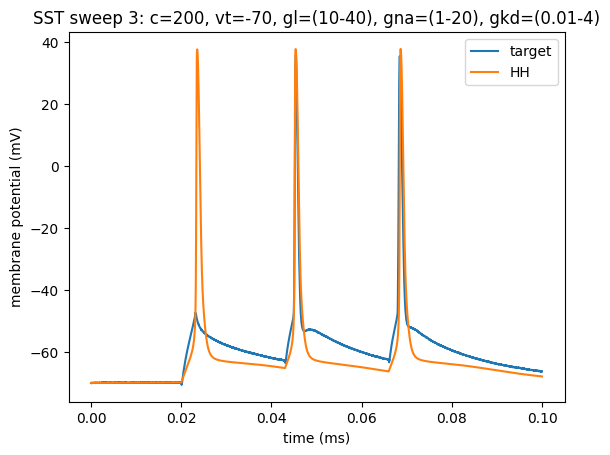

In [169]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_0[0]*1000, d2_title='HH')
title('SST sweep 3: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 4: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

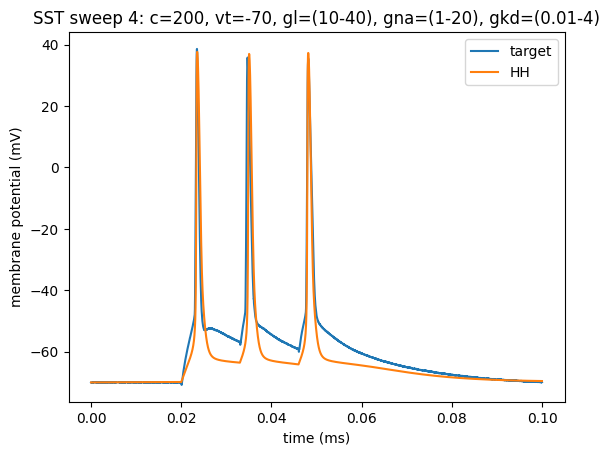

In [170]:
create_comparison_together(fastspikes_output_sliced[1], hh_sst_fast_0[1]*1000, d2_title='HH')
title('SST sweep 4: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

Text(0.5, 1.0, 'SST sweep 5: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

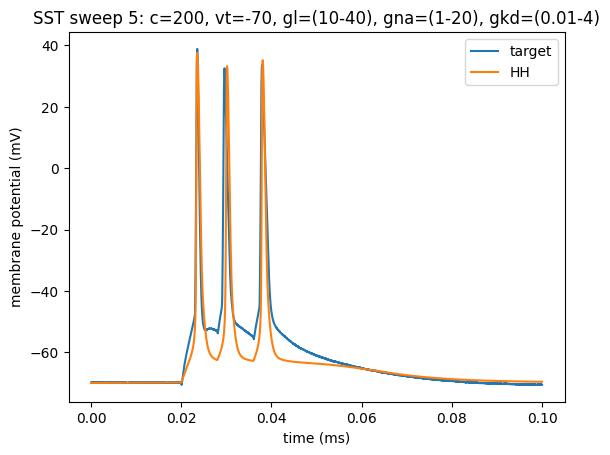

In [171]:
create_comparison_together(fastspikes_output_sliced[2], hh_sst_fast_0[2]*1000, d2_title='HH')
title('SST sweep 5: c=200, vt=-70, gl=(10-40), gna=(1-20), gkd=(0.01-4)')

In [ ]:
hh_sst_fast_1 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=200, vt=-70,\
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=4)

# tt: 27.3s

first fit:
Round 0: Best parameters g_kd=0.75046281 uS, g_na=7.26823576 uS, gl=6.84884173 nS (error: 171.2468815 mV^2)
Round 1: Best parameters g_kd=0.79341642 uS, g_na=7.81396436 uS, gl=8.69967899 nS (error: 149.71647289 mV^2)
Round 2: Best parameters g_kd=0.79341642 uS, g_na=7.81396436 uS, gl=8.69967899 nS (error: 149.71647289 mV^2)
Round 3: Best parameters g_kd=0.79341642 uS, g_na=7.81396436 uS, gl=8.69967899 nS (error: 149.71647289 mV^2)
Round 4: Best parameters g_kd=0.68544308 uS, g_na=6.48545697 uS, gl=8.51962903 nS (error: 112.90193761 mV^2)
Round 5: Best parameters g_kd=0.68544308 uS, g_na=6.48545697 uS, gl=8.51962903 nS (error: 112.90193761 mV^2)
Round 6: Best parameters g_kd=0.68544308 uS, g_na=6.48545697 uS, gl=8.51962903 nS (error: 112.90193761 mV^2)
Round 7: Best parameters g_kd=0.68544308 uS, g_na=6.48545697 uS, gl=8.51962903 nS (error: 112.90193761 mV^2)
Round 8: Best parameters g_kd=0.68544308 uS, g_na=6.48545697 uS, gl=8.51962903 nS (error: 112.90193761 mV^2)
Round 9: 

Text(0.5, 1.0, 'SST sweep 3: c=200, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-4)')

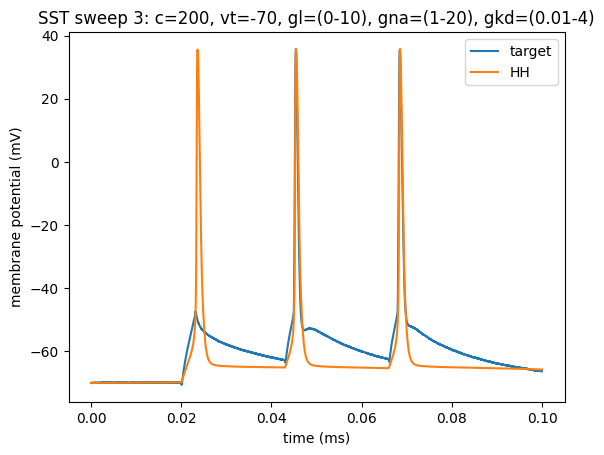

In [173]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_1[0]*1000, d2_title='HH')
title('SST sweep 3: c=200, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-4)')

In [ ]:
hh_sst_fast_2 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70,\
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=4)

# tt: 45.4s

first fit:
Round 0: Best parameters g_kd=0.62168375 uS, g_na=5.83146788 uS, gl=3.78812213 nS (error: 181.13358407 mV^2)
Round 1: Best parameters g_kd=0.41799046 uS, g_na=4.21825527 uS, gl=7.88693009 nS (error: 127.33761794 mV^2)
Round 2: Best parameters g_kd=0.34724255 uS, g_na=2.46194998 uS, gl=5.38286854 nS (error: 101.96643169 mV^2)
Round 3: Best parameters g_kd=0.32379036 uS, g_na=2.16955353 uS, gl=7.12824321 nS (error: 86.41987497 mV^2)
Round 4: Best parameters g_kd=271.25567115 nS, g_na=1.83895241 uS, gl=8.94416559 nS (error: 69.57554288 mV^2)
Round 5: Best parameters g_kd=263.97874198 nS, g_na=1.97429866 uS, gl=9.21415445 nS (error: 64.26546398 mV^2)
Round 6: Best parameters g_kd=251.79793201 nS, g_na=1.55834384 uS, gl=8.38897207 nS (error: 55.75594565 mV^2)
Round 7: Best parameters g_kd=239.62540208 nS, g_na=1.52318292 uS, gl=8.98272835 nS (error: 52.6732909 mV^2)
Round 8: Best parameters g_kd=239.62540208 nS, g_na=1.52318292 uS, gl=8.98272835 nS (error: 52.6732909 mV^2)
Round 

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-4)')

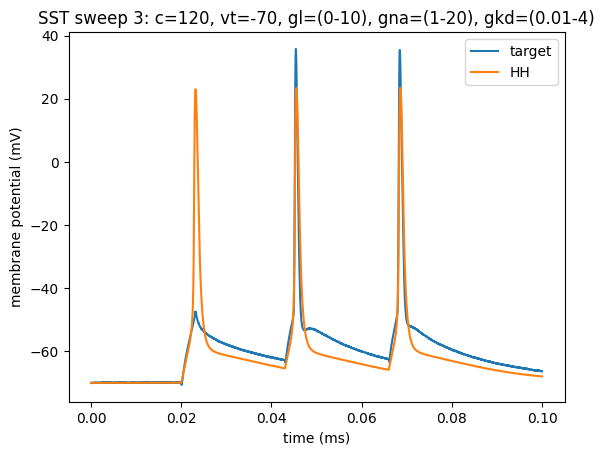

In [175]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_2[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-4)')

In [ ]:
hh_sst_fast_3 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70,\
                           glmin=0, glmax=8, gnamin=4, gnamax=20, gkdmin=0.01, gkdmax=4)

# tt: 27.3s

first fit:
Round 0: Best parameters g_kd=0.75469378 uS, g_na=11.77300843 uS, gl=6.1942228 nS (error: 203.01249754 mV^2)
Round 1: Best parameters g_kd=0.66939802 uS, g_na=9.4424586 uS, gl=6.93753246 nS (error: 189.24086921 mV^2)
Round 2: Best parameters g_kd=0.49098013 uS, g_na=6.73272514 uS, gl=7.52736195 nS (error: 157.39086589 mV^2)
Round 3: Best parameters g_kd=0.42409604 uS, g_na=4.95555164 uS, gl=7.53123338 nS (error: 136.33153978 mV^2)
Round 4: Best parameters g_kd=0.42409604 uS, g_na=4.95555164 uS, gl=7.53123338 nS (error: 136.33153978 mV^2)
Round 5: Best parameters g_kd=0.44099064 uS, g_na=4.67288078 uS, gl=7.68818949 nS (error: 135.05507846 mV^2)
Round 6: Best parameters g_kd=0.41639188 uS, g_na=4.70693646 uS, gl=7.75662855 nS (error: 131.06576216 mV^2)
Round 7: Best parameters g_kd=0.42139474 uS, g_na=4.5681031 uS, gl=7.83176556 nS (error: 129.95026409 mV^2)
Round 8: Best parameters g_kd=0.40250032 uS, g_na=4.34576808 uS, gl=7.85796892 nS (error: 125.01759019 mV^2)
Round 9: B

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-8), gna=(4-20), gkd=(0.01-4)')

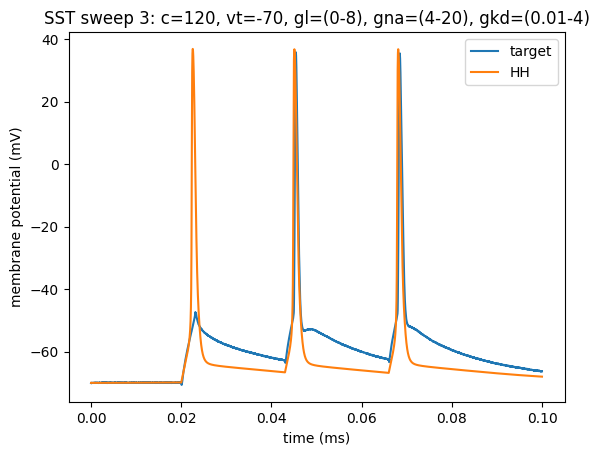

In [177]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_3[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-8), gna=(4-20), gkd=(0.01-4)')

In [178]:
hh_sst_fast_4 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70,\
                           glmin=0, glmax=6, gnamin=4, gnamax=20, gkdmin=0.01, gkdmax=4)

first fit:
Round 0: Best parameters g_kd=0.80051251 uS, g_na=7.93757866 uS, gl=4.03073039 nS (error: 215.82886933 mV^2)
Round 1: Best parameters g_kd=0.60480452 uS, g_na=7.9549655 uS, gl=5.14146905 nS (error: 181.09557171 mV^2)
Round 2: Best parameters g_kd=0.60480452 uS, g_na=7.9549655 uS, gl=5.14146905 nS (error: 181.09557171 mV^2)
Round 3: Best parameters g_kd=0.57970153 uS, g_na=5.93627978 uS, gl=5.27764676 nS (error: 171.78185038 mV^2)
Round 4: Best parameters g_kd=0.47612667 uS, g_na=4.94584928 uS, gl=5.12495978 nS (error: 152.53702142 mV^2)
Round 5: Best parameters g_kd=0.47612667 uS, g_na=4.94584928 uS, gl=5.12495978 nS (error: 152.53702142 mV^2)
Round 6: Best parameters g_kd=0.47612667 uS, g_na=4.94584928 uS, gl=5.66078118 nS (error: 149.05262155 mV^2)
Round 7: Best parameters g_kd=0.45801147 uS, g_na=4.63713317 uS, gl=5.60470579 nS (error: 144.88139142 mV^2)
Round 8: Best parameters g_kd=0.43652194 uS, g_na=4.5394008 uS, gl=5.66424754 nS (error: 144.4062745 mV^2)
Round 9: Bes

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-6), gna=(4-20), gkd=(0.01-4)')

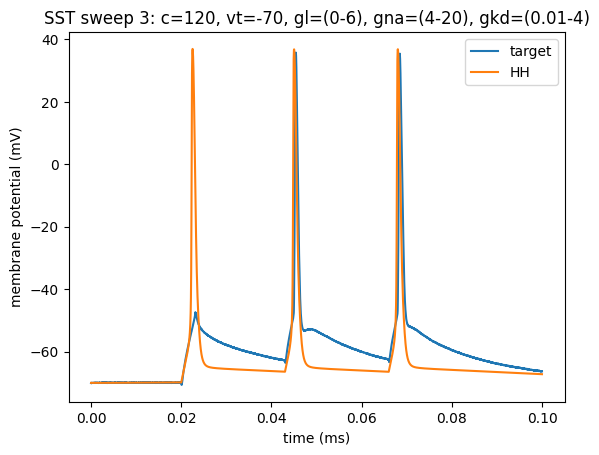

In [179]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_4[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-6), gna=(4-20), gkd=(0.01-4)')

# TEST 10 TIMES ON SAME (WIDE-ISH) PARAMS...

In [ ]:
hh_sst_fast_5 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 52.3s

first fit:
Round 0: Best parameters g_kd=0.91611078 uS, g_na=11.33433783 uS, gl=14.42855768 nS (error: 230.91844881 mV^2)
Round 1: Best parameters g_kd=0.54099007 uS, g_na=8.04275269 uS, gl=12.01855279 nS (error: 159.82112678 mV^2)
Round 2: Best parameters g_kd=303.86147223 nS, g_na=3.82057448 uS, gl=15.8978819 nS (error: 104.61126427 mV^2)
Round 3: Best parameters g_kd=298.01062978 nS, g_na=3.66190663 uS, gl=15.38862192 nS (error: 99.99404874 mV^2)
Round 4: Best parameters g_kd=298.01062978 nS, g_na=3.66190663 uS, gl=15.38862192 nS (error: 99.99404874 mV^2)
Round 5: Best parameters g_kd=298.01062978 nS, g_na=3.66190663 uS, gl=15.38862192 nS (error: 99.99404874 mV^2)
Round 6: Best parameters g_kd=297.92136394 nS, g_na=3.62000958 uS, gl=13.63191813 nS (error: 88.49581111 mV^2)
Round 7: Best parameters g_kd=297.92136394 nS, g_na=3.62000958 uS, gl=13.63191813 nS (error: 88.49581111 mV^2)
Round 8: Best parameters g_kd=297.92136394 nS, g_na=3.62000958 uS, gl=13.63191813 nS (error: 88.495811

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

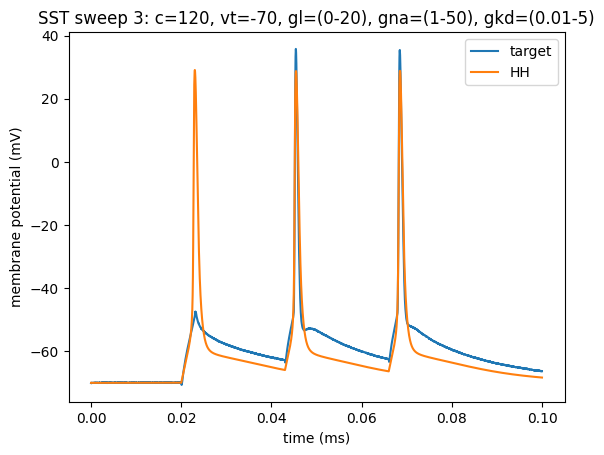

In [190]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

In [ ]:
hh_sst_fast_5_1 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 51.3s

first fit:
Round 0: Best parameters g_kd=0.73434314 uS, g_na=6.99997104 uS, gl=13.27931511 nS (error: 209.83560047 mV^2)
Round 1: Best parameters g_kd=0.57109383 uS, g_na=6.60796139 uS, gl=3.93720502 nS (error: 178.56961883 mV^2)
Round 2: Best parameters g_kd=0.44306143 uS, g_na=6.22259329 uS, gl=14.76659017 nS (error: 140.81141562 mV^2)
Round 3: Best parameters g_kd=0.3612468 uS, g_na=4.19913364 uS, gl=10.86858743 nS (error: 108.98312184 mV^2)
Round 4: Best parameters g_kd=256.74541678 nS, g_na=3.1053947 uS, gl=16.82196182 nS (error: 91.5883386 mV^2)
Round 5: Best parameters g_kd=256.74541678 nS, g_na=3.1053947 uS, gl=16.82196182 nS (error: 91.5883386 mV^2)
Round 6: Best parameters g_kd=256.74541678 nS, g_na=3.1053947 uS, gl=16.82196182 nS (error: 91.5883386 mV^2)
Round 7: Best parameters g_kd=258.41288919 nS, g_na=2.63946132 uS, gl=13.48069596 nS (error: 79.17726026 mV^2)
Round 8: Best parameters g_kd=258.41288919 nS, g_na=2.63946132 uS, gl=13.48069596 nS (error: 79.17726026 mV^2)
Ro

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-6), gna=(4-20), gkd=(0.01-4)')

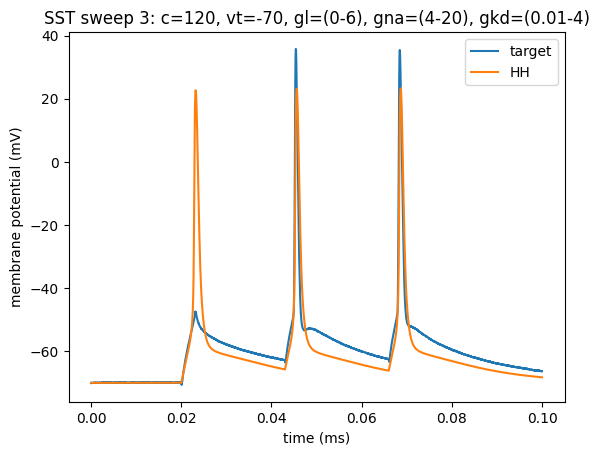

In [191]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_1[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-6), gna=(4-20), gkd=(0.01-4)')

In [ ]:
hh_sst_fast_5_2 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 51s

first fit:
Round 0: Best parameters g_kd=0.9633607 uS, g_na=18.91038785 uS, gl=15.95206589 nS (error: 217.97014647 mV^2)
Round 1: Best parameters g_kd=0.73989544 uS, g_na=15.0556742 uS, gl=16.85408998 nS (error: 180.40373277 mV^2)
Round 2: Best parameters g_kd=0.4773104 uS, g_na=6.50914403 uS, gl=16.01567541 nS (error: 156.65962747 mV^2)
Round 3: Best parameters g_kd=0.34189685 uS, g_na=4.90675822 uS, gl=17.1755175 nS (error: 114.09873286 mV^2)
Round 4: Best parameters g_kd=300.82297777 nS, g_na=3.79656467 uS, gl=15.28415128 nS (error: 97.15207855 mV^2)
Round 5: Best parameters g_kd=301.3496094 nS, g_na=3.88281923 uS, gl=15.21826163 nS (error: 94.55591665 mV^2)
Round 6: Best parameters g_kd=291.51372129 nS, g_na=2.98568215 uS, gl=11.94613954 nS (error: 85.71263722 mV^2)
Round 7: Best parameters g_kd=289.54777926 nS, g_na=3.13525847 uS, gl=12.09097844 nS (error: 82.74366694 mV^2)
Round 8: Best parameters g_kd=258.6925516 nS, g_na=2.69786045 uS, gl=13.5372221 nS (error: 77.67553439 mV^2)

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

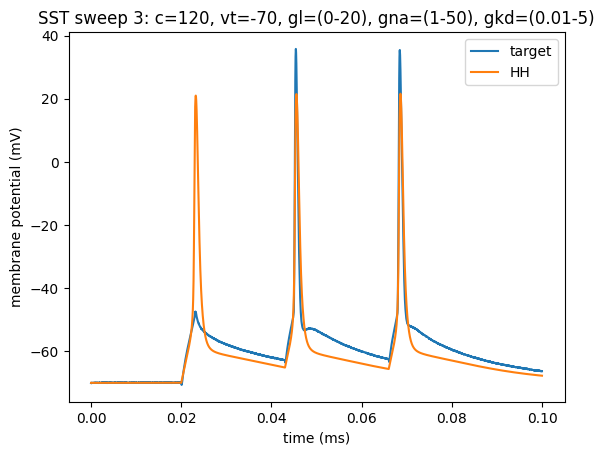

In [192]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_2[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

In [ ]:
hh_sst_fast_5_3 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 51.1s

first fit:
Round 0: Best parameters g_kd=0.83678073 uS, g_na=15.36612644 uS, gl=8.00714638 nS (error: 207.43267346 mV^2)
Round 1: Best parameters g_kd=0.65458292 uS, g_na=10.95833247 uS, gl=11.31112265 nS (error: 180.8821083 mV^2)
Round 2: Best parameters g_kd=0.45406241 uS, g_na=6.33004366 uS, gl=13.36862814 nS (error: 140.36185404 mV^2)
Round 3: Best parameters g_kd=0.3552543 uS, g_na=4.74391759 uS, gl=14.65714084 nS (error: 112.9160917 mV^2)
Round 4: Best parameters g_kd=265.58376956 nS, g_na=3.26543481 uS, gl=17.00569422 nS (error: 96.76445056 mV^2)
Round 5: Best parameters g_kd=265.58376956 nS, g_na=3.26543481 uS, gl=17.00569422 nS (error: 96.76445056 mV^2)
Round 6: Best parameters g_kd=315.97570703 nS, g_na=3.09091955 uS, gl=11.11755815 nS (error: 95.9054619 mV^2)
Round 7: Best parameters g_kd=242.13279976 nS, g_na=2.45697018 uS, gl=14.39631584 nS (error: 79.00705464 mV^2)
Round 8: Best parameters g_kd=238.69238602 nS, g_na=2.1483601 uS, gl=13.07301355 nS (error: 74.33259541 mV^2

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

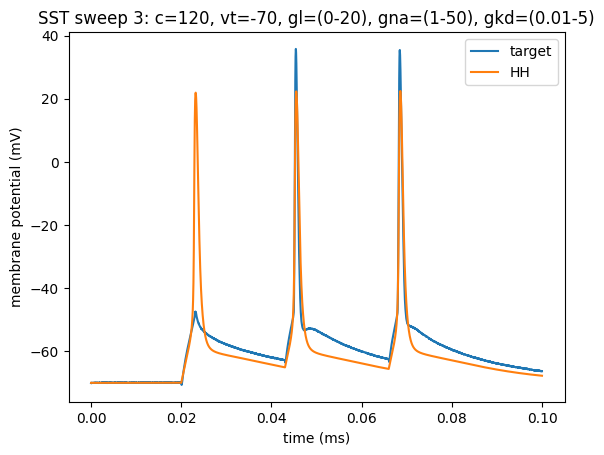

In [193]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_3[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

In [ ]:
hh_sst_fast_5_4 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 51s

first fit:
Round 0: Best parameters g_kd=0.71287072 uS, g_na=8.99278352 uS, gl=4.36241082 nS (error: 199.47323841 mV^2)
Round 1: Best parameters g_kd=0.49510375 uS, g_na=8.83706543 uS, gl=15.22023316 nS (error: 158.90827574 mV^2)
Round 2: Best parameters g_kd=0.3259718 uS, g_na=4.52693321 uS, gl=15.27514587 nS (error: 122.64552229 mV^2)
Round 3: Best parameters g_kd=311.88237869 nS, g_na=4.06960325 uS, gl=15.01672175 nS (error: 97.28410012 mV^2)
Round 4: Best parameters g_kd=311.88237869 nS, g_na=4.06960325 uS, gl=15.01672175 nS (error: 97.28410012 mV^2)
Round 5: Best parameters g_kd=311.88237869 nS, g_na=4.06960325 uS, gl=15.01672175 nS (error: 97.28410012 mV^2)
Round 6: Best parameters g_kd=273.45528527 nS, g_na=3.1673181 uS, gl=14.46882827 nS (error: 84.57442735 mV^2)
Round 7: Best parameters g_kd=310.289197 nS, g_na=2.5138146 uS, gl=8.34881653 nS (error: 84.39934323 mV^2)
Round 8: Best parameters g_kd=275.83641299 nS, g_na=2.48955072 uS, gl=10.44689873 nS (error: 73.45050848 mV^2)


Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

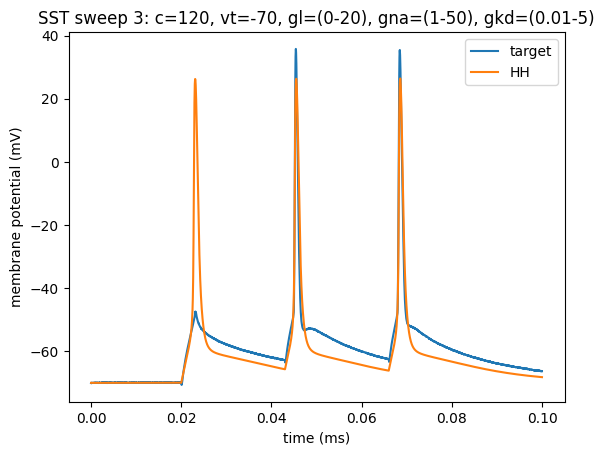

In [194]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_4[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

In [ ]:
hh_sst_fast_5_5 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 50.8s

first fit:
Round 0: Best parameters g_kd=0.66686669 uS, g_na=11.29482236 uS, gl=14.5336804 nS (error: 184.23766344 mV^2)
Round 1: Best parameters g_kd=0.53266552 uS, g_na=8.87879999 uS, gl=15.61377627 nS (error: 156.22483976 mV^2)
Round 2: Best parameters g_kd=0.42814644 uS, g_na=5.83005915 uS, gl=10.83587613 nS (error: 130.71649874 mV^2)
Round 3: Best parameters g_kd=295.68496395 nS, g_na=3.38171363 uS, gl=15.52019158 nS (error: 109.75019278 mV^2)
Round 4: Best parameters g_kd=0.31680289 uS, g_na=4.25797403 uS, gl=15.7943174 nS (error: 101.51406793 mV^2)
Round 5: Best parameters g_kd=0.31680289 uS, g_na=4.25797403 uS, gl=15.7943174 nS (error: 101.51406793 mV^2)
Round 6: Best parameters g_kd=223.12718663 nS, g_na=2.23868507 uS, gl=16.53952862 nS (error: 94.56706049 mV^2)
Round 7: Best parameters g_kd=223.12718663 nS, g_na=2.23868507 uS, gl=16.53952862 nS (error: 94.56706049 mV^2)
Round 8: Best parameters g_kd=224.78202809 nS, g_na=2.27948111 uS, gl=15.941515 nS (error: 86.23037924 mV^2

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

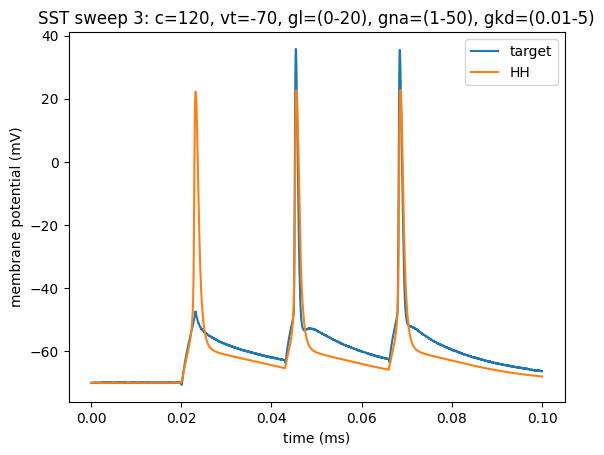

In [195]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_5[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

In [ ]:
hh_sst_fast_5_6 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 51.6s

first fit:
Round 0: Best parameters g_kd=1.13664259 uS, g_na=12.22669622 uS, gl=13.85472218 nS (error: 254.6646543 mV^2)
Round 1: Best parameters g_kd=0.73040793 uS, g_na=8.43313172 uS, gl=14.66546101 nS (error: 207.04683094 mV^2)
Round 2: Best parameters g_kd=0.41622452 uS, g_na=4.95455979 uS, gl=13.63262557 nS (error: 138.97332315 mV^2)
Round 3: Best parameters g_kd=0.36196398 uS, g_na=4.39081591 uS, gl=11.5998649 nS (error: 109.6369697 mV^2)
Round 4: Best parameters g_kd=313.8333207 nS, g_na=3.45452107 uS, gl=12.57468243 nS (error: 97.12167791 mV^2)
Round 5: Best parameters g_kd=271.72095179 nS, g_na=2.40563915 uS, gl=11.31466351 nS (error: 78.57069519 mV^2)
Round 6: Best parameters g_kd=271.72095179 nS, g_na=2.40563915 uS, gl=11.31466351 nS (error: 78.57069519 mV^2)
Round 7: Best parameters g_kd=283.37899925 nS, g_na=2.48926329 uS, gl=9.66519497 nS (error: 74.99249867 mV^2)
Round 8: Best parameters g_kd=287.4050864 nS, g_na=2.22263417 uS, gl=8.33389866 nS (error: 73.56293506 mV^2)


Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

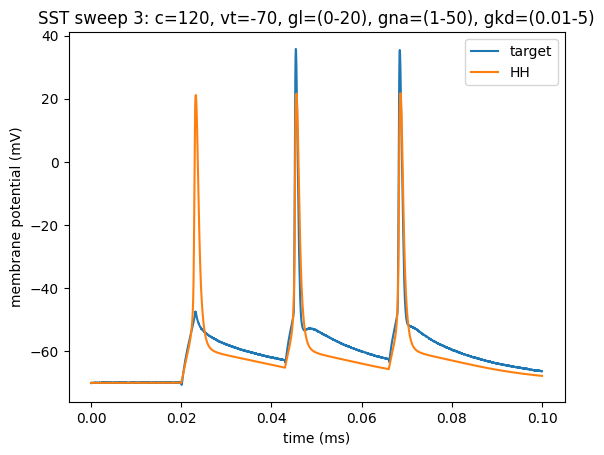

In [196]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_6[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

In [ ]:
hh_sst_fast_5_7 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 50.4s

first fit:
Round 0: Best parameters g_kd=0.68946319 uS, g_na=9.45705715 uS, gl=11.35138576 nS (error: 194.27316805 mV^2)
Round 1: Best parameters g_kd=0.46931169 uS, g_na=5.28032907 uS, gl=14.2687724 nS (error: 159.54557854 mV^2)
Round 2: Best parameters g_kd=284.07946719 nS, g_na=3.18147854 uS, gl=13.45126611 nS (error: 85.84931565 mV^2)
Round 3: Best parameters g_kd=284.07946719 nS, g_na=3.18147854 uS, gl=13.45126611 nS (error: 85.84931565 mV^2)
Round 4: Best parameters g_kd=284.07946719 nS, g_na=3.18147854 uS, gl=13.45126611 nS (error: 85.84931565 mV^2)
Round 5: Best parameters g_kd=284.07946719 nS, g_na=3.18147854 uS, gl=13.45126611 nS (error: 85.84931565 mV^2)
Round 6: Best parameters g_kd=284.07946719 nS, g_na=3.18147854 uS, gl=13.45126611 nS (error: 85.84931565 mV^2)
Round 7: Best parameters g_kd=282.59360651 nS, g_na=2.7302636 uS, gl=12.02288512 nS (error: 85.47893185 mV^2)
Round 8: Best parameters g_kd=274.47237001 nS, g_na=2.11182098 uS, gl=9.19047025 nS (error: 69.51008468 m

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

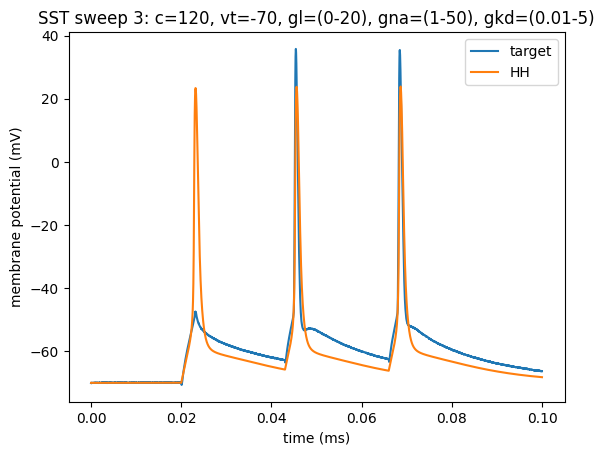

In [197]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_7[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

In [ ]:
hh_sst_fast_5_8 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 51.6s

first fit:
Round 0: Best parameters g_kd=0.74331154 uS, g_na=9.71080028 uS, gl=11.21125447 nS (error: 204.98078451 mV^2)
Round 1: Best parameters g_kd=0.45585324 uS, g_na=5.61626874 uS, gl=9.10013314 nS (error: 139.34670009 mV^2)
Round 2: Best parameters g_kd=288.17217281 nS, g_na=3.78966567 uS, gl=17.52076845 nS (error: 104.08880084 mV^2)
Round 3: Best parameters g_kd=288.17217281 nS, g_na=3.78966567 uS, gl=17.52076845 nS (error: 104.08880084 mV^2)
Round 4: Best parameters g_kd=288.17217281 nS, g_na=3.78966567 uS, gl=17.52076845 nS (error: 104.08880084 mV^2)
Round 5: Best parameters g_kd=288.17217281 nS, g_na=3.78966567 uS, gl=17.52076845 nS (error: 104.08880084 mV^2)
Round 6: Best parameters g_kd=282.99085737 nS, g_na=3.35039369 uS, gl=15.07598956 nS (error: 93.36764759 mV^2)
Round 7: Best parameters g_kd=0.32598199 uS, g_na=2.91923368 uS, gl=8.32400418 nS (error: 93.04863638 mV^2)
Round 8: Best parameters g_kd=237.3945654 nS, g_na=2.74070183 uS, gl=17.39827379 nS (error: 93.03291125

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

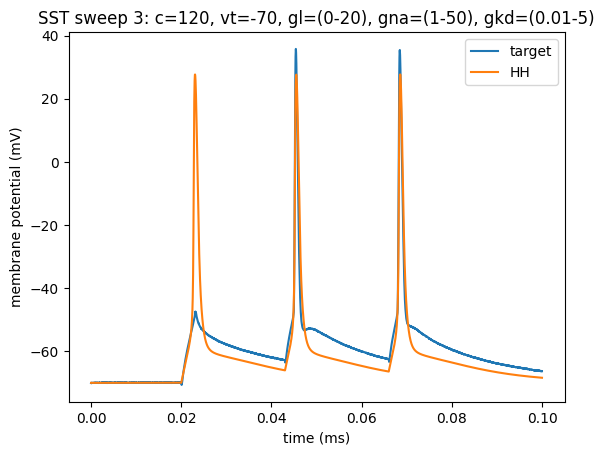

In [198]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_8[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

In [ ]:
hh_sst_fast_5_9 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=20, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 1m 13.9s

first fit:
Round 0: Best parameters g_kd=0.69144782 uS, g_na=11.25316841 uS, gl=15.69381072 nS (error: 191.87477389 mV^2)
Round 1: Best parameters g_kd=0.61915445 uS, g_na=6.59879278 uS, gl=10.26473413 nS (error: 184.12261339 mV^2)
Round 2: Best parameters g_kd=0.46043541 uS, g_na=5.40122636 uS, gl=6.36621231 nS (error: 150.26220294 mV^2)
Round 3: Best parameters g_kd=0.36121558 uS, g_na=5.19249484 uS, gl=17.16491681 nS (error: 122.04249253 mV^2)
Round 4: Best parameters g_kd=0.32617428 uS, g_na=4.46473475 uS, gl=15.9551599 nS (error: 104.91489633 mV^2)
Round 5: Best parameters g_kd=0.33351961 uS, g_na=4.25659774 uS, gl=13.99322849 nS (error: 103.67510332 mV^2)
Round 6: Best parameters g_kd=0.33351961 uS, g_na=4.25659774 uS, gl=13.99322849 nS (error: 103.67510332 mV^2)
Round 7: Best parameters g_kd=290.72700006 nS, g_na=3.18764207 uS, gl=12.04229657 nS (error: 82.96431865 mV^2)
Round 8: Best parameters g_kd=290.72700006 nS, g_na=3.18764207 uS, gl=12.04229657 nS (error: 82.96431865 mV^2

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

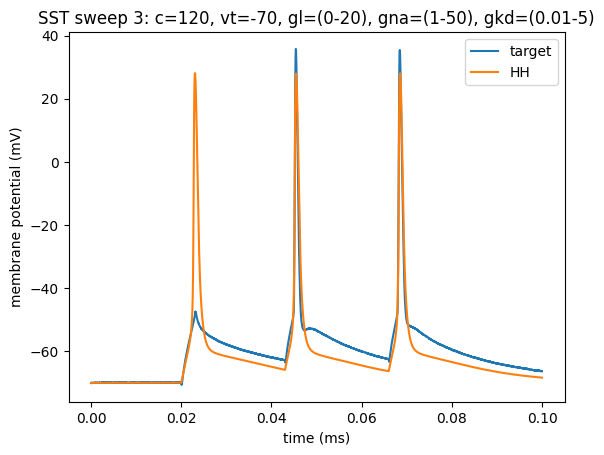

In [199]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_9[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-20), gna=(1-50), gkd=(0.01-5)')

In [ ]:
hh_sst_fast_5_9_30rounds = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 1m 39.7s

first fit:
Round 0: Best parameters g_kd=0.81625371 uS, g_na=14.87172678 uS, gl=15.52285294 nS (error: 205.62643664 mV^2)
Round 1: Best parameters g_kd=0.4757972 uS, g_na=5.27339583 uS, gl=5.64642556 nS (error: 152.96361852 mV^2)
Round 2: Best parameters g_kd=300.85037305 nS, g_na=3.79222079 uS, gl=15.52285294 nS (error: 99.30419322 mV^2)
Round 3: Best parameters g_kd=300.85037305 nS, g_na=3.79222079 uS, gl=15.52285294 nS (error: 99.30419322 mV^2)
Round 4: Best parameters g_kd=282.94782619 nS, g_na=2.59138755 uS, gl=10.22461598 nS (error: 76.06797241 mV^2)
Round 5: Best parameters g_kd=269.70421489 nS, g_na=2.41053467 uS, gl=10.22623412 nS (error: 70.10751777 mV^2)
Round 6: Best parameters g_kd=269.70421489 nS, g_na=2.41053467 uS, gl=10.22623412 nS (error: 70.10751777 mV^2)
Round 7: Best parameters g_kd=269.70421489 nS, g_na=2.41053467 uS, gl=10.22623412 nS (error: 70.10751777 mV^2)
Round 8: Best parameters g_kd=269.70421489 nS, g_na=2.41053467 uS, gl=10.22623412 nS (error: 70.10751777

In [ ]:
hh_sst_fast_5_9_30rounds_1 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# 1m 46.4s

first fit:
Round 0: Best parameters g_kd=0.70346832 uS, g_na=5.87541164 uS, gl=13.62778171 nS (error: 208.82228749 mV^2)
Round 1: Best parameters g_kd=0.39942414 uS, g_na=6.19476521 uS, gl=15.46319844 nS (error: 120.9516328 mV^2)
Round 2: Best parameters g_kd=0.34430228 uS, g_na=4.55488898 uS, gl=13.13900333 nS (error: 103.75759882 mV^2)
Round 3: Best parameters g_kd=0.34430228 uS, g_na=4.55488898 uS, gl=13.13900333 nS (error: 103.75759882 mV^2)
Round 4: Best parameters g_kd=0.34430228 uS, g_na=4.55488898 uS, gl=13.13900333 nS (error: 103.75759882 mV^2)
Round 5: Best parameters g_kd=0.34430228 uS, g_na=4.55488898 uS, gl=13.13900333 nS (error: 103.75759882 mV^2)
Round 6: Best parameters g_kd=0.32403472 uS, g_na=3.88985854 uS, gl=13.73813222 nS (error: 102.99518686 mV^2)
Round 7: Best parameters g_kd=279.74623105 nS, g_na=3.14370381 uS, gl=14.28106284 nS (error: 90.28387689 mV^2)
Round 8: Best parameters g_kd=283.41083251 nS, g_na=3.11130635 uS, gl=12.88600661 nS (error: 82.97252054 mV^2

In [ ]:
hh_sst_fast_5_9_30rounds_2 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 1m 12s

first fit:
Round 0: Best parameters g_kd=1.02277275 uS, g_na=9.28410257 uS, gl=17.08465773 nS (error: 241.73445088 mV^2)
Round 1: Best parameters g_kd=0.51438887 uS, g_na=8.36661013 uS, gl=16.27021045 nS (error: 154.54704566 mV^2)
Round 2: Best parameters g_kd=0.43328966 uS, g_na=5.9278253 uS, gl=15.08255075 nS (error: 140.96422883 mV^2)
Round 3: Best parameters g_kd=0.37463116 uS, g_na=4.24494541 uS, gl=14.90536898 nS (error: 137.07283051 mV^2)
Round 4: Best parameters g_kd=302.21969375 nS, g_na=3.50290696 uS, gl=13.72222275 nS (error: 94.96743121 mV^2)
Round 5: Best parameters g_kd=302.21969375 nS, g_na=3.50290696 uS, gl=13.72222275 nS (error: 94.96743121 mV^2)
Round 6: Best parameters g_kd=269.79401676 nS, g_na=3.0753245 uS, gl=14.32423828 nS (error: 82.76423542 mV^2)
Round 7: Best parameters g_kd=269.79401676 nS, g_na=3.0753245 uS, gl=14.32423828 nS (error: 82.76423542 mV^2)
Round 8: Best parameters g_kd=269.79401676 nS, g_na=3.0753245 uS, gl=14.32423828 nS (error: 82.76423542 mV^2

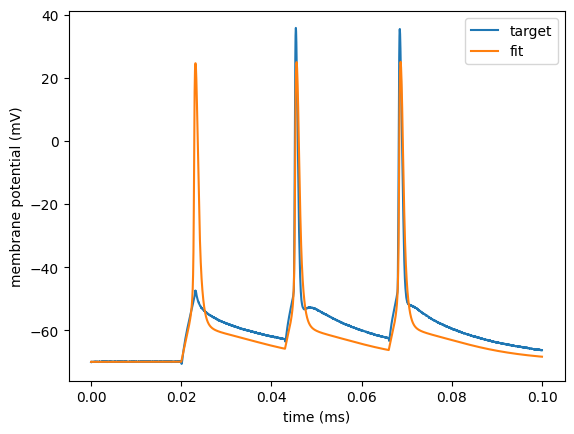

In [210]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_9_30rounds_2[0]*1000)

In [ ]:
hh_sst_fast_5_9_30rounds_2 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 1m 13.9s

first fit:
Round 0: Best parameters g_kd=0.59666221 uS, g_na=10.14327123 uS, gl=13.5105032 nS (error: 168.36068609 mV^2)
Round 1: Best parameters g_kd=0.48289786 uS, g_na=8.4038932 uS, gl=15.80743611 nS (error: 139.90190061 mV^2)
Round 2: Best parameters g_kd=0.42231368 uS, g_na=6.77380264 uS, gl=16.87916141 nS (error: 129.913856 mV^2)
Round 3: Best parameters g_kd=0.35535495 uS, g_na=5.61024767 uS, gl=17.65467236 nS (error: 125.34433379 mV^2)
Round 4: Best parameters g_kd=0.32993898 uS, g_na=4.37795582 uS, gl=15.80743611 nS (error: 109.63016237 mV^2)
Round 5: Best parameters g_kd=0.32993898 uS, g_na=4.37795582 uS, gl=15.80743611 nS (error: 109.63016237 mV^2)
Round 6: Best parameters g_kd=297.03057017 nS, g_na=4.04135679 uS, gl=17.77487695 nS (error: 105.44545708 mV^2)
Round 7: Best parameters g_kd=253.40583912 nS, g_na=3.12001841 uS, gl=17.70796706 nS (error: 96.40106203 mV^2)
Round 8: Best parameters g_kd=253.40583912 nS, g_na=3.12001841 uS, gl=17.70796706 nS (error: 96.40106203 mV^2

In [ ]:
hh_sst_fast_5_9_30rounds_3 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 1m 18.8s

first fit:
Round 0: Best parameters g_kd=1.142461 uS, g_na=23.7041448 uS, gl=15.07195086 nS (error: 224.80838328 mV^2)
Round 1: Best parameters g_kd=0.85802823 uS, g_na=16.31032818 uS, gl=16.45940586 nS (error: 208.31643655 mV^2)
Round 2: Best parameters g_kd=0.49673458 uS, g_na=5.00047986 uS, gl=12.16880768 nS (error: 163.07823497 mV^2)
Round 3: Best parameters g_kd=0.38553754 uS, g_na=4.20223946 uS, gl=14.4971144 nS (error: 140.82500327 mV^2)
Round 4: Best parameters g_kd=273.06012307 nS, g_na=3.38990331 uS, gl=17.44602105 nS (error: 104.57895636 mV^2)
Round 5: Best parameters g_kd=273.06012307 nS, g_na=3.38990331 uS, gl=17.44602105 nS (error: 104.57895636 mV^2)
Round 6: Best parameters g_kd=273.06012307 nS, g_na=3.38990331 uS, gl=17.44602105 nS (error: 104.57895636 mV^2)
Round 7: Best parameters g_kd=287.16915909 nS, g_na=2.51191943 uS, gl=9.62822147 nS (error: 76.62978374 mV^2)
Round 8: Best parameters g_kd=287.16915909 nS, g_na=2.51191943 uS, gl=9.62822147 nS (error: 76.62978374 m

In [ ]:
hh_sst_fast_5_9_30rounds_4 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 1m 32.1s

first fit:
Round 0: Best parameters g_kd=0.92367361 uS, g_na=19.07614887 uS, gl=15.24147675 nS (error: 202.66555855 mV^2)
Round 1: Best parameters g_kd=0.56852044 uS, g_na=9.81785438 uS, gl=16.85580191 nS (error: 164.41767609 mV^2)
Round 2: Best parameters g_kd=0.46867983 uS, g_na=6.74868062 uS, gl=15.13123748 nS (error: 147.81458655 mV^2)
Round 3: Best parameters g_kd=0.38538171 uS, g_na=5.40349978 uS, gl=17.94618157 nS (error: 138.68276644 mV^2)
Round 4: Best parameters g_kd=0.35290916 uS, g_na=5.35125935 uS, gl=17.70967201 nS (error: 114.25419212 mV^2)
Round 5: Best parameters g_kd=0.35290916 uS, g_na=5.35125935 uS, gl=17.70967201 nS (error: 114.25419212 mV^2)
Round 6: Best parameters g_kd=314.04723817 nS, g_na=4.35396305 uS, gl=17.8449993 nS (error: 111.7138585 mV^2)
Round 7: Best parameters g_kd=0.32225905 uS, g_na=3.18912422 uS, gl=10.10958679 nS (error: 93.44223433 mV^2)
Round 8: Best parameters g_kd=282.2591257 nS, g_na=3.4232241 uS, gl=15.33256013 nS (error: 92.14371199 mV^2)


In [ ]:
hh_sst_fast_5_9_30rounds_5 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 1m 23.1s

first fit:
Round 0: Best parameters g_kd=0.70923967 uS, g_na=9.90691024 uS, gl=4.56803851 nS (error: 198.83281059 mV^2)
Round 1: Best parameters g_kd=0.50963389 uS, g_na=7.1321658 uS, gl=15.63002509 nS (error: 161.60855635 mV^2)
Round 2: Best parameters g_kd=0.43407801 uS, g_na=5.18777243 uS, gl=17.00548934 nS (error: 160.16894447 mV^2)
Round 3: Best parameters g_kd=0.32440856 uS, g_na=4.6818896 uS, gl=18.5757677 nS (error: 115.80472406 mV^2)
Round 4: Best parameters g_kd=0.32440856 uS, g_na=4.6818896 uS, gl=18.5757677 nS (error: 115.80472406 mV^2)
Round 5: Best parameters g_kd=278.48328232 nS, g_na=3.432298 uS, gl=17.36297842 nS (error: 108.2059824 mV^2)
Round 6: Best parameters g_kd=276.50313786 nS, g_na=3.2922143 uS, gl=15.63002509 nS (error: 94.13157337 mV^2)
Round 7: Best parameters g_kd=279.80062244 nS, g_na=3.12879285 uS, gl=13.05577163 nS (error: 81.18149884 mV^2)
Round 8: Best parameters g_kd=279.80062244 nS, g_na=3.12879285 uS, gl=13.05577163 nS (error: 81.18149884 mV^2)
Roun

In [ ]:
hh_sst_fast_5_9_30rounds_6 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 52.3s

first fit:
Round 0: Best parameters g_kd=0.93760793 uS, g_na=7.24517835 uS, gl=11.01310007 nS (error: 236.71437219 mV^2)
Round 1: Best parameters g_kd=0.58084688 uS, g_na=7.02523745 uS, gl=9.09301097 nS (error: 171.92475581 mV^2)
Round 2: Best parameters g_kd=0.35920423 uS, g_na=4.17515654 uS, gl=10.24358075 nS (error: 108.61569275 mV^2)
Round 3: Best parameters g_kd=0.35920423 uS, g_na=4.17515654 uS, gl=10.24358075 nS (error: 108.61569275 mV^2)
Round 4: Best parameters g_kd=0.35920423 uS, g_na=4.17515654 uS, gl=10.24358075 nS (error: 108.61569275 mV^2)
Round 5: Best parameters g_kd=0.35920423 uS, g_na=4.17515654 uS, gl=10.24358075 nS (error: 108.61569275 mV^2)
Round 6: Best parameters g_kd=0.35920423 uS, g_na=4.17515654 uS, gl=10.24358075 nS (error: 108.61569275 mV^2)
Round 7: Best parameters g_kd=0.35920423 uS, g_na=4.17515654 uS, gl=10.24358075 nS (error: 108.61569275 mV^2)
Round 8: Best parameters g_kd=0.35920423 uS, g_na=4.17515654 uS, gl=10.24358075 nS (error: 108.61569275 mV^2)


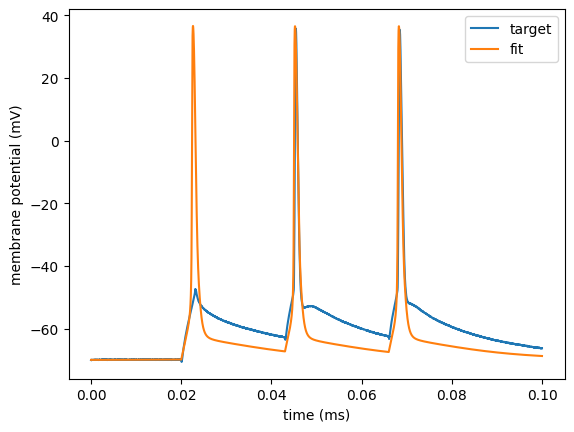

In [211]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_9_30rounds_6[0]*1000)

In [ ]:
hh_sst_fast_5_9_30rounds_7 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 1m 26.8s

first fit:
Round 0: Best parameters g_kd=1.04321202 uS, g_na=9.6380735 uS, gl=11.78197507 nS (error: 247.13544605 mV^2)
Round 1: Best parameters g_kd=0.52665507 uS, g_na=8.54242572 uS, gl=11.53139336 nS (error: 154.554766 mV^2)
Round 2: Best parameters g_kd=0.52665507 uS, g_na=8.54242572 uS, gl=11.53139336 nS (error: 154.554766 mV^2)
Round 3: Best parameters g_kd=0.33914347 uS, g_na=4.44212526 uS, gl=14.16446586 nS (error: 105.01874708 mV^2)
Round 4: Best parameters g_kd=0.32495588 uS, g_na=3.80498762 uS, gl=13.44797918 nS (error: 103.70796847 mV^2)
Round 5: Best parameters g_kd=0.33170882 uS, g_na=3.35678645 uS, gl=10.14532183 nS (error: 97.41566829 mV^2)
Round 6: Best parameters g_kd=259.61736811 nS, g_na=2.94362742 uS, gl=15.16239323 nS (error: 85.21112727 mV^2)
Round 7: Best parameters g_kd=280.12951714 nS, g_na=2.86593628 uS, gl=12.07495233 nS (error: 80.18766979 mV^2)
Round 8: Best parameters g_kd=280.12951714 nS, g_na=2.86593628 uS, gl=12.07495233 nS (error: 80.18766979 mV^2)
Ro

In [ ]:
hh_sst_fast_5_9_30rounds_8 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, round_num=30, \
                           glmin=0, glmax=20, gnamin=1, gnamax=50, gkdmin=0.01, gkdmax=5)

# tt: 55.9s

first fit:
Round 0: Best parameters g_kd=0.93327188 uS, g_na=17.38702188 uS, gl=14.63164107 nS (error: 219.67362888 mV^2)
Round 1: Best parameters g_kd=0.650241 uS, g_na=9.37132204 uS, gl=14.14247164 nS (error: 187.60741509 mV^2)
Round 2: Best parameters g_kd=0.47456764 uS, g_na=6.7817127 uS, gl=16.08418939 nS (error: 153.03857717 mV^2)
Round 3: Best parameters g_kd=0.36422714 uS, g_na=3.94792495 uS, gl=11.60714691 nS (error: 115.36887539 mV^2)
Round 4: Best parameters g_kd=0.34979474 uS, g_na=3.41367607 uS, gl=9.05632063 nS (error: 103.24675471 mV^2)
Round 5: Best parameters g_kd=266.03097585 nS, g_na=3.1293971 uS, gl=16.19515615 nS (error: 95.40044433 mV^2)
Round 6: Best parameters g_kd=259.28025924 nS, g_na=2.70457729 uS, gl=13.23849389 nS (error: 75.30391626 mV^2)
Round 7: Best parameters g_kd=259.28025924 nS, g_na=2.70457729 uS, gl=13.23849389 nS (error: 75.30391626 mV^2)
Round 8: Best parameters g_kd=259.28025924 nS, g_na=2.70457729 uS, gl=13.23849389 nS (error: 75.30391626 mV^2)

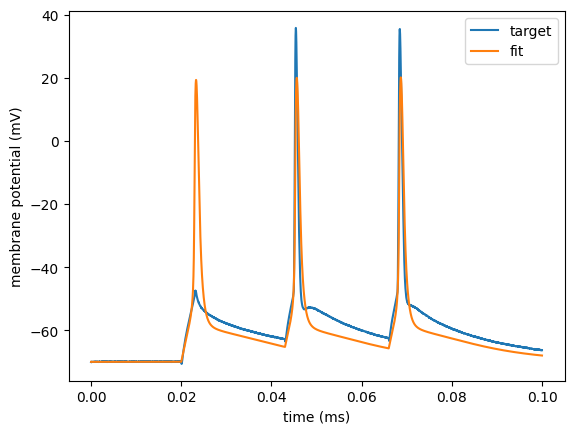

In [212]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_9_30rounds_8[0]*1000)

Text(0.5, 1.0, 'Comparison between low and high mse errors')

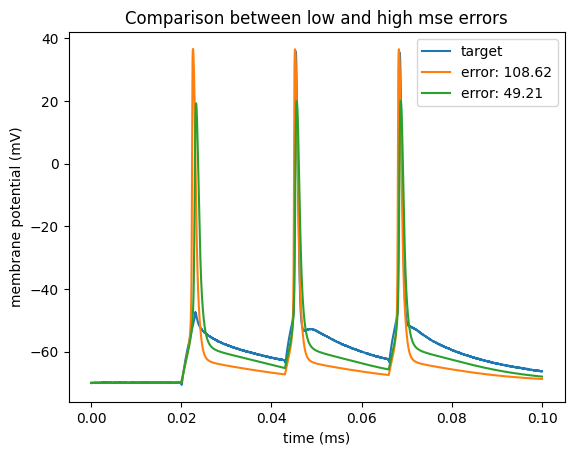

In [213]:
create_comparison_together_three(fastspikes_output_sliced[0], hh_sst_fast_5_9_30rounds_6[0]*1000, hh_sst_fast_5_9_30rounds_8[0]*1000,\
                                 d2_title='error: 108.62', d3_title='error: 49.21')
title('Comparison between low and high mse errors')

WARNING    c:\Users\yjk16\OneDrive\Desktop\CS Master's\Dissertation\diss files\general_functions.py:496: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  legend()
 [py.warnings]


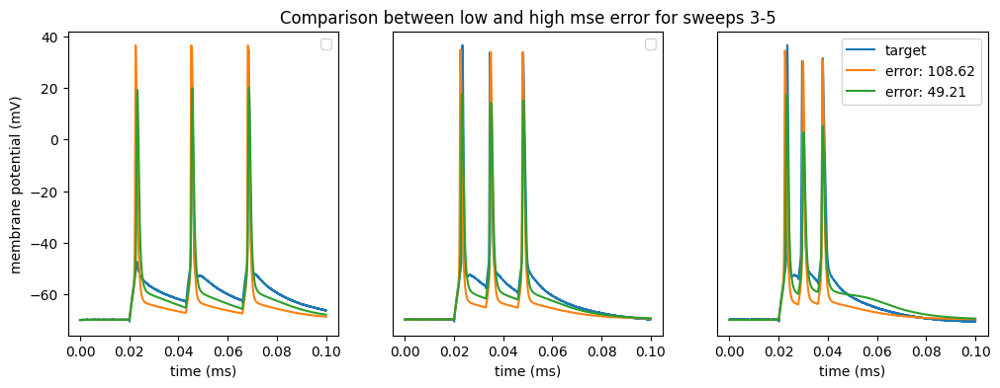

In [271]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together_three(fastspikes_output_sliced[0], hh_sst_fast_5_9_30rounds_6[0]*1000, hh_sst_fast_5_9_30rounds_8[0]*1000,\
                                 d1_title='', d2_title='', d3_title='')
ylabel('membrane potential (mV)')

subplot(1,3,2)
create_comparison_together_three(fastspikes_output_sliced[1], hh_sst_fast_5_9_30rounds_6[1]*1000, hh_sst_fast_5_9_30rounds_8[1]*1000,\
                                 d1_title='', d2_title='', d3_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Comparison between low and high mse error for sweeps 3-5')

subplot(1,3,3)
create_comparison_together_three(fastspikes_output_sliced[2], hh_sst_fast_5_9_30rounds_6[2]*1000, hh_sst_fast_5_9_30rounds_8[2]*1000,\
                                 d2_title='error: 108.62', d3_title='error: 49.21')
ax = plt.gca()
ax.yaxis.set_visible(False)

In [ ]:
hh_sst_fast_5_10 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=10, gkdmin=0.01, gkdmax=0.03)

# tt: 16.1s

first fit:
Round 0: Best parameters g_kd=26.97824987 nS, g_na=2.44383226 uS, gl=7.72828267 nS (error: 1169.97187475 mV^2)
Round 1: Best parameters g_kd=27.61810912 nS, g_na=1.82770872 uS, gl=6.33026146 nS (error: 1070.97158406 mV^2)
Round 2: Best parameters g_kd=28.55238654 nS, g_na=1.35537076 uS, gl=4.25467124 nS (error: 990.76384765 mV^2)
Round 3: Best parameters g_kd=28.95656818 nS, g_na=1.3128099 uS, gl=9.19411852 nS (error: 889.70393741 mV^2)
Round 4: Best parameters g_kd=28.93824096 nS, g_na=1.18439647 uS, gl=9.29003139 nS (error: 855.74224734 mV^2)
Round 5: Best parameters g_kd=29.53607163 nS, g_na=1.14090186 uS, gl=9.50600761 nS (error: 837.18343895 mV^2)
Round 6: Best parameters g_kd=29.42716575 nS, g_na=1.08851592 uS, gl=9.46241134 nS (error: 824.47963942 mV^2)
Round 7: Best parameters g_kd=29.49428099 nS, g_na=1.07344493 uS, gl=9.69970064 nS (error: 816.70971243 mV^2)
Round 8: Best parameters g_kd=29.65469543 nS, g_na=1.06134022 uS, gl=9.76237454 nS (error: 811.56895349 mV^2

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-10), gna=(1-10), gkd=(0.01-0.03)')

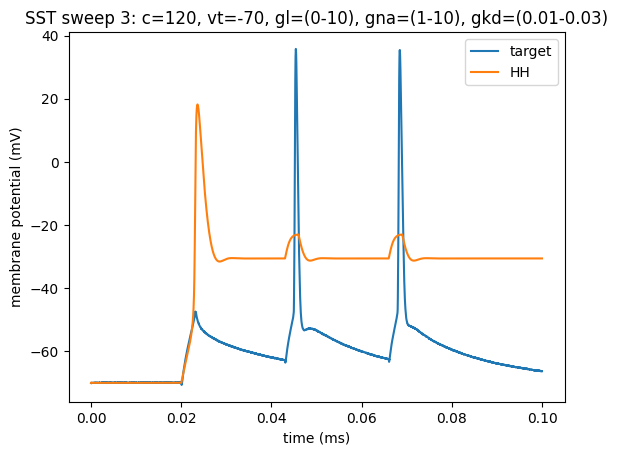

In [215]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_10[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-10), gna=(1-10), gkd=(0.01-0.03)')

In [ ]:
hh_sst_fast_5_11 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.025)

# tt: 16.6s

first fit:
Round 0: Best parameters g_kd=18.58798322 nS, g_na=3.66793459 uS, gl=7.76102039 nS (error: 1509.8013208 mV^2)
Round 1: Best parameters g_kd=23.68254466 nS, g_na=3.13490466 uS, gl=7.65612033 nS (error: 1333.78427099 mV^2)
Round 2: Best parameters g_kd=23.26995107 nS, g_na=2.34192945 uS, gl=8.79787607 nS (error: 1174.91826327 mV^2)
Round 3: Best parameters g_kd=23.26995107 nS, g_na=1.86588815 uS, gl=8.79787607 nS (error: 1078.20500571 mV^2)
Round 4: Best parameters g_kd=23.8978501 nS, g_na=1.56152387 uS, gl=9.27059844 nS (error: 992.45806629 mV^2)
Round 5: Best parameters g_kd=24.14481616 nS, g_na=1.39856432 uS, gl=9.35049475 nS (error: 948.45972928 mV^2)
Round 6: Best parameters g_kd=24.40004515 nS, g_na=1.31290605 uS, gl=9.46292075 nS (error: 922.09171194 mV^2)
Round 7: Best parameters g_kd=24.26558878 nS, g_na=1.24432881 uS, gl=9.43047741 nS (error: 905.58463437 mV^2)
Round 8: Best parameters g_kd=23.84694091 nS, g_na=1.1603703 uS, gl=9.65087117 nS (error: 882.22877662 mV^2

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-0.025)')

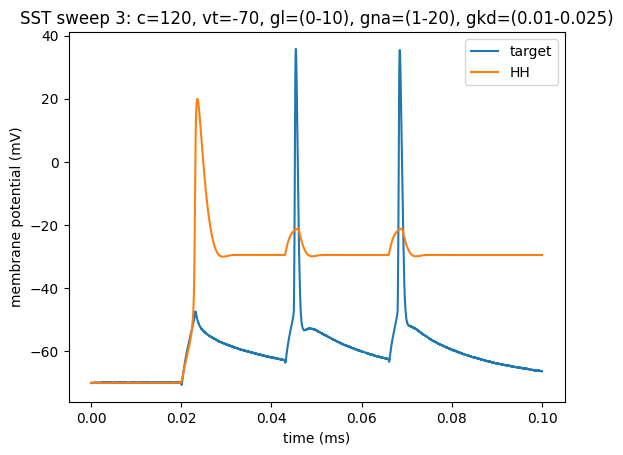

In [217]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_11[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-0.025)')

In [ ]:
hh_sst_fast_5_12 = run_hh(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)

# tt: 16.2

first fit:
Round 0: Best parameters g_kd=130.69053562 nS, g_na=3.33989642 uS, gl=3.51948721 nS (error: 869.87312115 mV^2)
Round 1: Best parameters g_kd=212.30477528 nS, g_na=2.41745908 uS, gl=6.38081788 nS (error: 694.59065743 mV^2)
Round 2: Best parameters g_kd=222.76708495 nS, g_na=1.82237905 uS, gl=6.47323551 nS (error: 606.87831699 mV^2)
Round 3: Best parameters g_kd=232.22253718 nS, g_na=1.62204241 uS, gl=8.36797865 nS (error: 411.40052239 mV^2)
Round 4: Best parameters g_kd=228.53726112 nS, g_na=1.46110003 uS, gl=8.89035515 nS (error: 68.57686044 mV^2)
Round 5: Best parameters g_kd=228.30426114 nS, g_na=1.38131379 uS, gl=9.13680409 nS (error: 49.65790891 mV^2)
Round 6: Best parameters g_kd=227.37658889 nS, g_na=1.30115174 uS, gl=8.84720601 nS (error: 48.65185696 mV^2)
Round 7: Best parameters g_kd=233.51603546 nS, g_na=1.26532911 uS, gl=8.13697781 nS (error: 47.85681408 mV^2)
Round 8: Best parameters g_kd=230.29356572 nS, g_na=1.18583436 uS, gl=8.1624541 nS (error: 47.82049602 mV

Text(0.5, 1.0, 'SST sweep 3: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-0.25)')

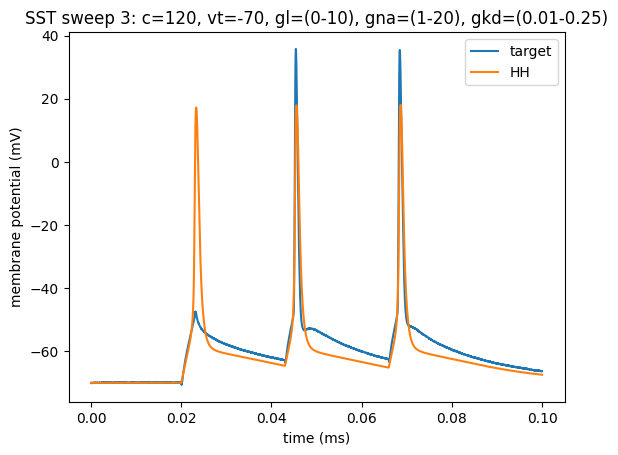

In [ ]:
create_comparison_together(fastspikes_output_sliced[0], hh_sst_fast_5_12[0]*1000, d2_title='HH')
title('SST sweep 3: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-0.25)')

Text(0.5, 1.0, 'SST sweep 4: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-0.25)')

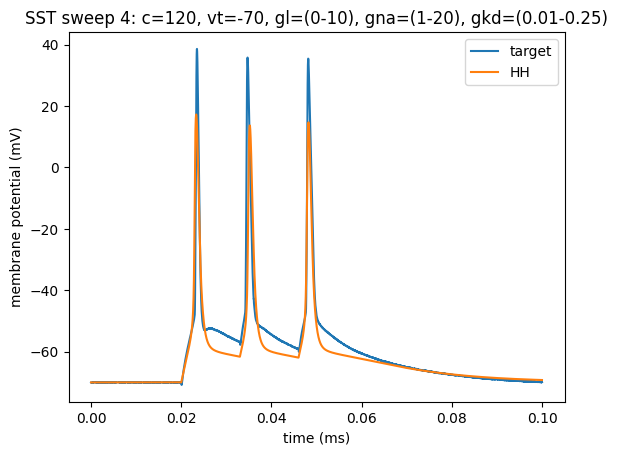

In [220]:
create_comparison_together(fastspikes_output_sliced[1], hh_sst_fast_5_12[1]*1000, d2_title='HH')
title('SST sweep 4: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-0.25)')

Text(0.5, 1.0, 'SST sweep 5: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-0.25)')

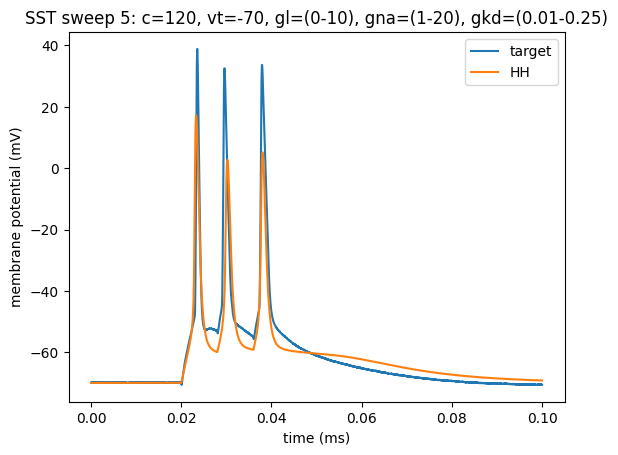

In [221]:
create_comparison_together(fastspikes_output_sliced[2], hh_sst_fast_5_12[2]*1000, d2_title='HH')
title('SST sweep 5: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=(0.01-0.25)')

***
***

# LIF ON FAST SPIKES LEN: 5,000

In [223]:
lif_sst_fast_0 = run_lif(fastspikes_input_sliced, fastspikes_output_sliced)

first fit:
Round 0: Best parameters R=171.43469478 Mohm, tau=13.23114478 ms (error: 111.9205277 mV^2)
Round 1: Best parameters R=166.08959747 Mohm, tau=12.47771196 ms (error: 111.68056024 mV^2)
Round 2: Best parameters R=157.83534184 Mohm, tau=11.58661356 ms (error: 111.35054872 mV^2)
Round 3: Best parameters R=157.83534184 Mohm, tau=11.58661356 ms (error: 111.35054872 mV^2)
Round 4: Best parameters R=157.83534184 Mohm, tau=11.58661356 ms (error: 111.35054872 mV^2)
Round 5: Best parameters R=157.66188023 Mohm, tau=11.75216019 ms (error: 111.31778577 mV^2)
Round 6: Best parameters R=157.66188023 Mohm, tau=11.75216019 ms (error: 111.31778577 mV^2)
Round 7: Best parameters R=157.19890667 Mohm, tau=11.69796331 ms (error: 111.31558174 mV^2)
Round 8: Best parameters R=157.19890667 Mohm, tau=11.69796331 ms (error: 111.31558174 mV^2)
Round 9: Best parameters R=157.19890667 Mohm, tau=11.69796331 ms (error: 111.31558174 mV^2)


In [ ]:
lif_sst_fast_1 = run_lif(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-50*mV')

# tt: 4s

first fit:
Round 0: Best parameters R=140.92357704 Mohm, tau=26.77638125 ms (error: 180.1473049 mV^2)
Round 1: Best parameters R=123.64035263 Mohm, tau=21.47312529 ms (error: 174.95031424 mV^2)
Round 2: Best parameters R=117.5744438 Mohm, tau=18.96138008 ms (error: 170.64987402 mV^2)
Round 3: Best parameters R=114.1554374 Mohm, tau=17.80509055 ms (error: 169.17083996 mV^2)
Round 4: Best parameters R=107.63959752 Mohm, tau=15.89097916 ms (error: 167.3983842 mV^2)
Round 5: Best parameters R=109.20369627 Mohm, tau=16.16995514 ms (error: 167.17932853 mV^2)
Round 6: Best parameters R=108.74348886 Mohm, tau=15.98079933 ms (error: 166.86677948 mV^2)
Round 7: Best parameters R=107.87210984 Mohm, tau=15.74522523 ms (error: 166.72888897 mV^2)
Round 8: Best parameters R=107.87210984 Mohm, tau=15.74522523 ms (error: 166.72888897 mV^2)
Round 9: Best parameters R=107.87210984 Mohm, tau=15.74522523 ms (error: 166.72888897 mV^2)


Text(0.5, 1.0, 'SST 5,000 sweep 3: c=120, reset=-70, thresh>-50')

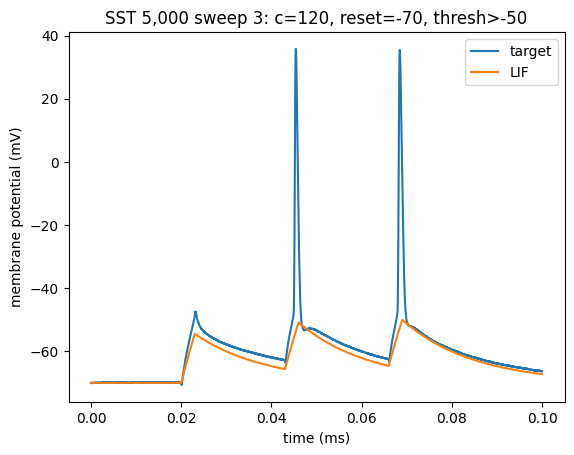

In [226]:
create_comparison_together(fastspikes_output_sliced[0], lif_sst_fast_1[0]*1000, d2_title='LIF')
title('SST 5,000 sweep 3: c=120, reset=-70, thresh>-50')

Text(0.5, 1.0, 'SST 5,000 sweep 4: c=120, reset=-70, thresh>-50')

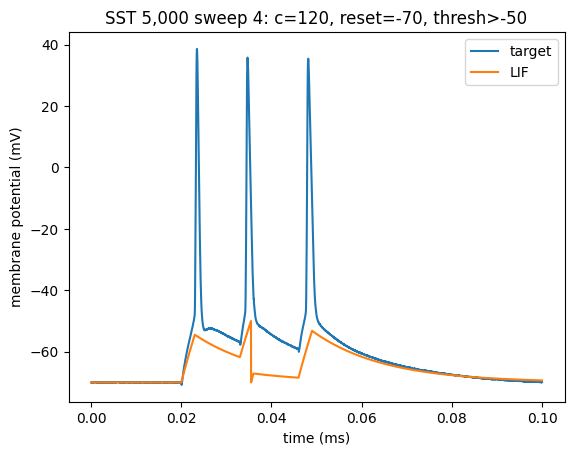

In [227]:
create_comparison_together(fastspikes_output_sliced[1], lif_sst_fast_1[1]*1000, d2_title='LIF')
title('SST 5,000 sweep 4: c=120, reset=-70, thresh>-50')

Text(0.5, 1.0, 'SST 5,000 sweep 5: c=120, reset=-70, thresh>-50')

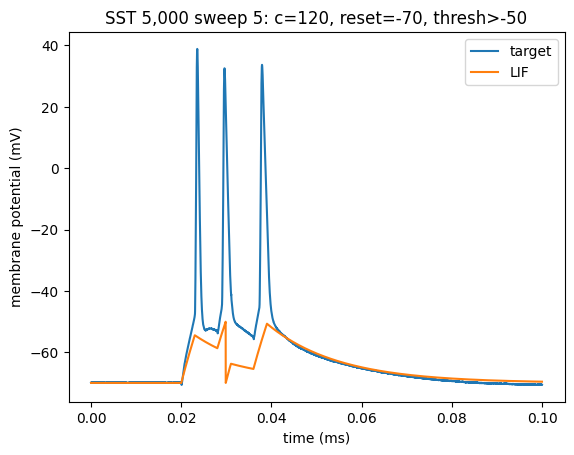

In [232]:
create_comparison_together(fastspikes_output_sliced[2], lif_sst_fast_1[2]*1000, d2_title='LIF')
title('SST 5,000 sweep 5: c=120, reset=-70, thresh>-50')

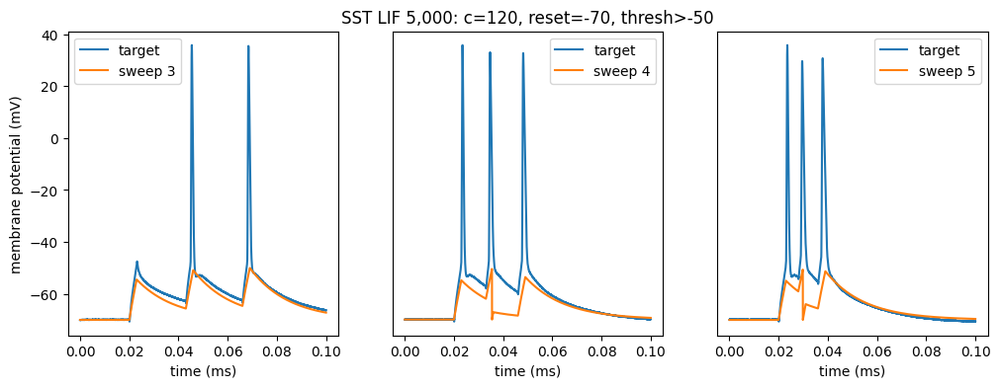

In [258]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(fastspikes_output_sliced[0], lif_sst_fast_1[0]*1000, d2_title='sweep 3')
ylabel('membrane potential (mV)')

subplot(1,3,2)
create_comparison_together(fastspikes_output_sliced[1], lif_sst_fast_1[1]*1000, d2_title='sweep 4')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('SST LIF 5,000: c=120, reset=-70, thresh>-50')

subplot(1,3,3)
create_comparison_together(fastspikes_output_sliced[2], lif_sst_fast_1[2]*1000, d2_title='sweep 5')
ax = plt.gca()
ax.yaxis.set_visible(False)

reset and thresh change for sweeps 4 and 5

In [ ]:
lif_sst_fast_2 = run_lif(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, reset_var='v=-50*mV', thresh_var='v>-40*mV')

# tt: 4.2s

first fit:
Round 0: Best parameters R=167.52858121 Mohm, tau=14.09914655 ms (error: 113.57039632 mV^2)
Round 1: Best parameters R=163.23353812 Mohm, tau=11.99547205 ms (error: 111.58997933 mV^2)
Round 2: Best parameters R=163.23353812 Mohm, tau=11.99547205 ms (error: 111.58997933 mV^2)
Round 3: Best parameters R=163.23353812 Mohm, tau=11.99547205 ms (error: 111.58997933 mV^2)
Round 4: Best parameters R=159.83527042 Mohm, tau=11.99547205 ms (error: 111.31970339 mV^2)
Round 5: Best parameters R=159.83527042 Mohm, tau=11.99547205 ms (error: 111.31970339 mV^2)
Round 6: Best parameters R=159.83527042 Mohm, tau=11.99547205 ms (error: 111.31970339 mV^2)
Round 7: Best parameters R=158.6208985 Mohm, tau=11.72869252 ms (error: 111.30877473 mV^2)
Round 8: Best parameters R=158.6208985 Mohm, tau=11.72869252 ms (error: 111.30877473 mV^2)
Round 9: Best parameters R=158.6208985 Mohm, tau=11.72869252 ms (error: 111.30877473 mV^2)


Text(0.5, 1.0, 'SST 5,000 sweep 3: c=120, reset=-50, thresh>-40')

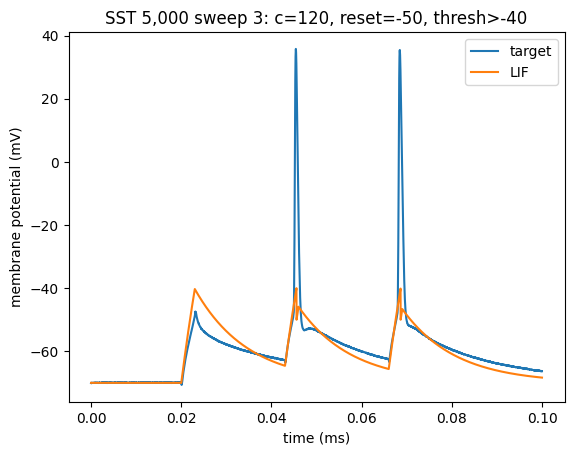

In [234]:
create_comparison_together(fastspikes_output_sliced[0], lif_sst_fast_2[0]*1000, d2_title='LIF')
title('SST 5,000 sweep 3: c=120, reset=-50, thresh>-40')

Text(0.5, 1.0, 'SST 5,000 sweep 4: c=120, reset=-50, thresh>-40')

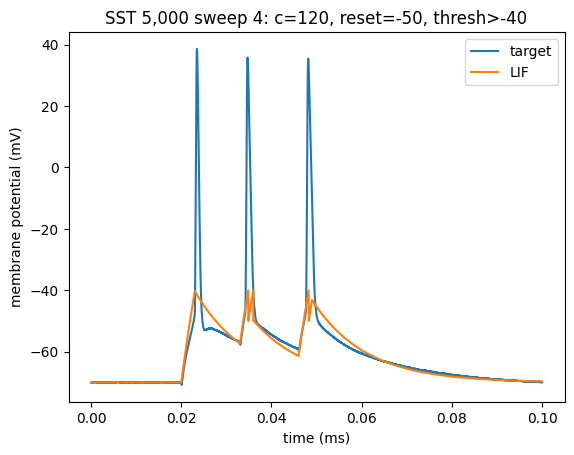

In [233]:
create_comparison_together(fastspikes_output_sliced[1], lif_sst_fast_2[1]*1000, d2_title='LIF')
title('SST 5,000 sweep 4: c=120, reset=-50, thresh>-40')

Text(0.5, 1.0, 'SST 5,000 sweep 5: c=120, reset=-50, thresh>-40')

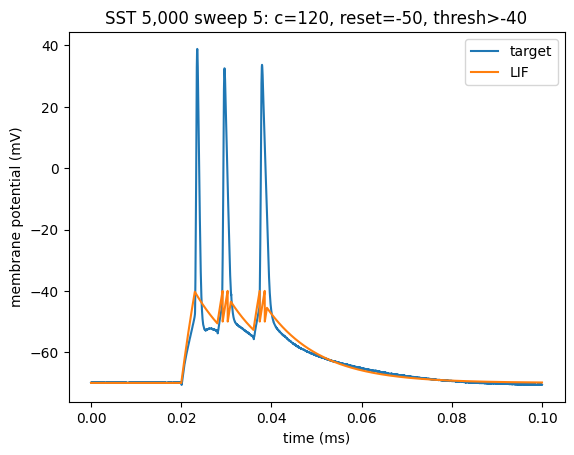

In [231]:
create_comparison_together(fastspikes_output_sliced[2], lif_sst_fast_2[2]*1000, d2_title='LIF')
title('SST 5,000 sweep 5: c=120, reset=-50, thresh>-40')

In [ ]:
lif_sst_fast_3 = run_lif(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, reset_var='v=-50*mV', thresh_var='v>-20*mV')

# tt: 4.2s

first fit:
Round 0: Best parameters R=166.8778923 Mohm, tau=13.28688629 ms (error: 111.36217903 mV^2)
Round 1: Best parameters R=159.60388737 Mohm, tau=12.87301899 ms (error: 108.38825509 mV^2)
Round 2: Best parameters R=151.430195 Mohm, tau=11.5705604 ms (error: 105.16823666 mV^2)
Round 3: Best parameters R=199.30089686 Mohm, tau=11.27587412 ms (error: 101.91399371 mV^2)
Round 4: Best parameters R=194.27342143 Mohm, tau=11.03501197 ms (error: 99.69569917 mV^2)
Round 5: Best parameters R=194.27342143 Mohm, tau=11.03501197 ms (error: 99.69569917 mV^2)
Round 6: Best parameters R=194.27342143 Mohm, tau=11.03501197 ms (error: 99.69569917 mV^2)
Round 7: Best parameters R=190.0144546 Mohm, tau=10.68504983 ms (error: 98.44405034 mV^2)
Round 8: Best parameters R=190.0144546 Mohm, tau=10.68504983 ms (error: 98.44405034 mV^2)
Round 9: Best parameters R=190.0144546 Mohm, tau=10.68504983 ms (error: 98.44405034 mV^2)


Text(0.5, 1.0, 'SST 5,000 sweep 3: c=120, reset=-50, thresh>-20')

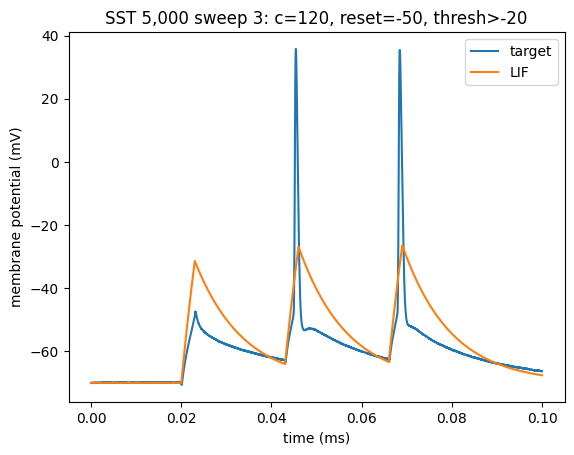

In [236]:
create_comparison_together(fastspikes_output_sliced[0], lif_sst_fast_3[0]*1000, d2_title='LIF')
title('SST 5,000 sweep 3: c=120, reset=-50, thresh>-20')

Text(0.5, 1.0, 'SST 5,000 sweep 4: c=120, reset=-50, thresh>-20')

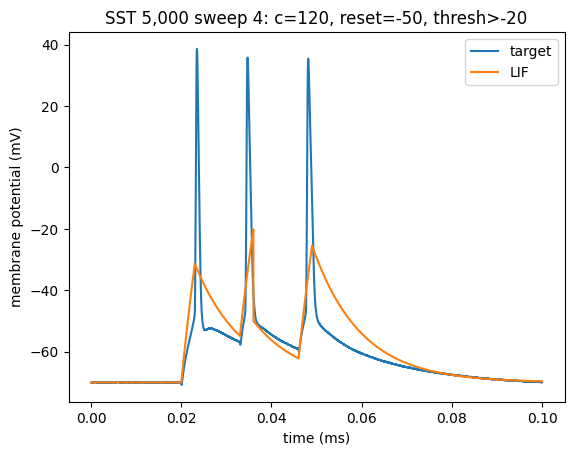

In [237]:
create_comparison_together(fastspikes_output_sliced[1], lif_sst_fast_3[1]*1000, d2_title='LIF')
title('SST 5,000 sweep 4: c=120, reset=-50, thresh>-20')

Text(0.5, 1.0, 'SST 5,000 sweep 5: c=120, reset=-50, thresh>-20')

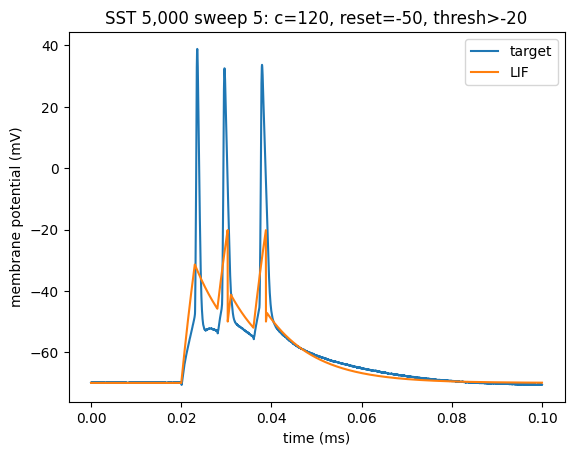

In [238]:
create_comparison_together(fastspikes_output_sliced[2], lif_sst_fast_3[2]*1000, d2_title='LIF')
title('SST 5,000 sweep 5: c=120, reset=-50, thresh>-20')

In [ ]:
lif_sst_fast_4 = run_lif(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, reset_var='v=-60*mV', thresh_var='v>-20*mV')

# tt: 4.2s

first fit:
Round 0: Best parameters R=198.64008186 Mohm, tau=12.95106454 ms (error: 117.48637962 mV^2)
Round 1: Best parameters R=163.80005842 Mohm, tau=13.14065602 ms (error: 113.41362024 mV^2)
Round 2: Best parameters R=151.6366168 Mohm, tau=11.61691518 ms (error: 109.01994894 mV^2)
Round 3: Best parameters R=151.6366168 Mohm, tau=11.32192173 ms (error: 108.71050256 mV^2)
Round 4: Best parameters R=151.6366168 Mohm, tau=11.32192173 ms (error: 108.71050256 mV^2)
Round 5: Best parameters R=150.54141203 Mohm, tau=11.29740617 ms (error: 108.49397257 mV^2)
Round 6: Best parameters R=148.67013985 Mohm, tau=10.72611581 ms (error: 107.60780312 mV^2)
Round 7: Best parameters R=148.67013985 Mohm, tau=10.72611581 ms (error: 107.60780312 mV^2)
Round 8: Best parameters R=193.12815838 Mohm, tau=10.45392294 ms (error: 106.90291614 mV^2)
Round 9: Best parameters R=145.3780593 Mohm, tau=10.4469321 ms (error: 106.78050002 mV^2)


Text(0.5, 1.0, 'SST 5,000 sweep 3: c=120, reset=-60, thresh>-20')

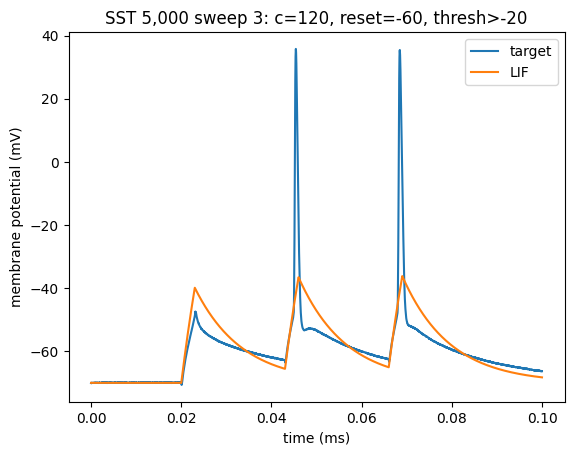

In [240]:
create_comparison_together(fastspikes_output_sliced[0], lif_sst_fast_4[0]*1000, d2_title='LIF')
title('SST 5,000 sweep 3: c=120, reset=-60, thresh>-20')

Text(0.5, 1.0, 'SST 5,000 sweep 4: c=120, reset=-60, thresh>-20')

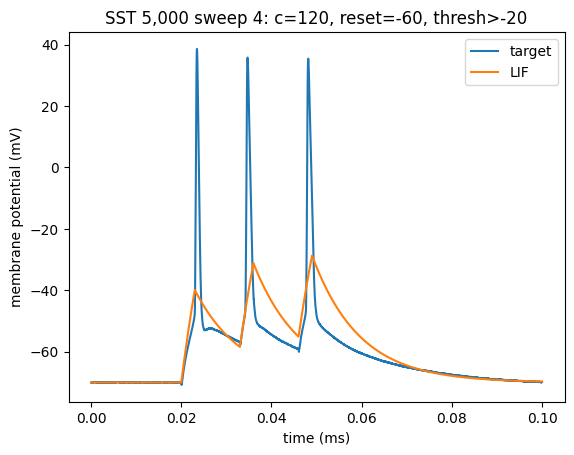

In [241]:
create_comparison_together(fastspikes_output_sliced[1], lif_sst_fast_4[1]*1000, d2_title='LIF')
title('SST 5,000 sweep 4: c=120, reset=-60, thresh>-20')

Text(0.5, 1.0, 'SST 5,000 sweep 5: c=120, reset=-60, thresh>-20')

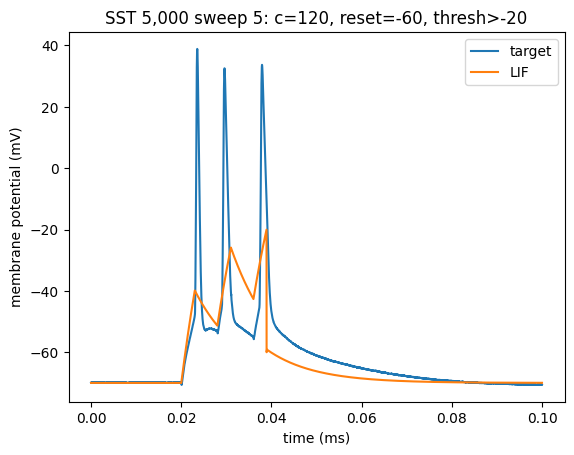

In [242]:
create_comparison_together(fastspikes_output_sliced[2], lif_sst_fast_4[2]*1000, d2_title='LIF')
title('SST 5,000 sweep 5: c=120, reset=-60, thresh>-20')

In [ ]:
lif_sst_fast_5 = run_lif(fastspikes_input_sliced, fastspikes_output_sliced, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 4.1s

first fit:
Round 0: Best parameters R=147.65234632 Mohm, tau=14.06577665 ms (error: 122.44743249 mV^2)
Round 1: Best parameters R=128.71588911 Mohm, tau=11.73637604 ms (error: 114.7765404 mV^2)
Round 2: Best parameters R=136.52377935 Mohm, tau=11.19384209 ms (error: 112.68523911 mV^2)
Round 3: Best parameters R=129.72552463 Mohm, tau=10.78496398 ms (error: 111.45289327 mV^2)
Round 4: Best parameters R=129.36653496 Mohm, tau=10.48976789 ms (error: 110.51835496 mV^2)
Round 5: Best parameters R=130.83127966 Mohm, tau=10.38593204 ms (error: 110.1157564 mV^2)
Round 6: Best parameters R=131.24265129 Mohm, tau=10.25270021 ms (error: 109.69515104 mV^2)
Round 7: Best parameters R=130.96909508 Mohm, tau=10.18502056 ms (error: 109.49098022 mV^2)
Round 8: Best parameters R=133.68459597 Mohm, tau=10.13128489 ms (error: 109.39110681 mV^2)
Round 9: Best parameters R=130.75714833 Mohm, tau=10.10593488 ms (error: 109.25192938 mV^2)


Text(0.5, 1.0, 'SST 5,000 sweep 3: c=120, reset=-70, thresh>-20')

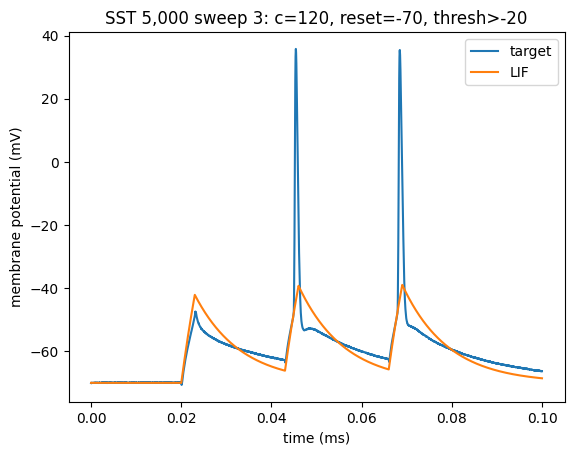

In [244]:
create_comparison_together(fastspikes_output_sliced[0], lif_sst_fast_5[0]*1000, d2_title='LIF')
title('SST 5,000 sweep 3: c=120, reset=-70, thresh>-20')

Text(0.5, 1.0, 'SST 5,000 sweep 4: c=120, reset=-70, thresh>-20')

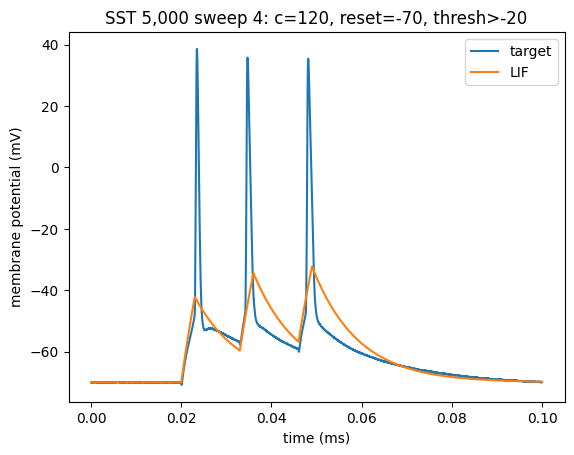

In [245]:
create_comparison_together(fastspikes_output_sliced[1], lif_sst_fast_5[1]*1000, d2_title='LIF')
title('SST 5,000 sweep 4: c=120, reset=-70, thresh>-20')

Text(0.5, 1.0, 'SST 5,000 sweep 5: c=120, reset=-70, thresh>-20')

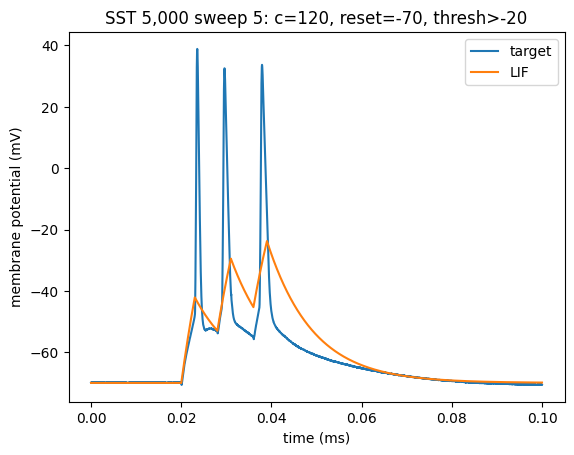

In [246]:
create_comparison_together(fastspikes_output_sliced[2], lif_sst_fast_5[2]*1000, d2_title='LIF')
title('SST 5,000 sweep 5: c=120, reset=-70, thresh>-20')

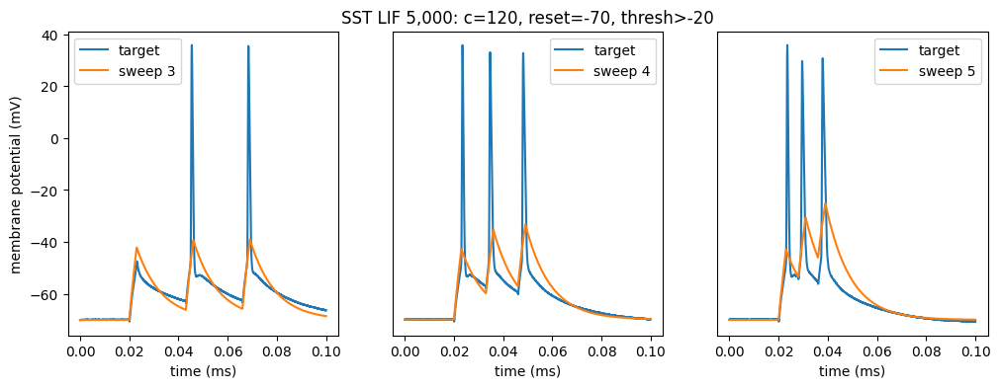

In [257]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(fastspikes_output_sliced[0], lif_sst_fast_5[0]*1000, d2_title='sweep 3')
ylabel('membrane potential (mV)')

subplot(1,3,2)
create_comparison_together(fastspikes_output_sliced[1], lif_sst_fast_5[1]*1000, d2_title='sweep 4')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('SST LIF 5,000: c=120, reset=-70, thresh>-20')

subplot(1,3,3)
create_comparison_together(fastspikes_output_sliced[2], lif_sst_fast_5[2]*1000, d2_title='sweep 5')
ax = plt.gca()
ax.yaxis.set_visible(False)

for further improvements need individual arrays?

***
***

# ADEX 5,000

In [ ]:
adex_sst_fast_0 = run_adex(fastspikes_input_sliced, fastspikes_output_sliced)

# tt: 4.9s

first fit:
Round 0: Best parameters a=3.17299986 nS, b=59.48910517 pA, tauw=129.51488974 ms (error: 189.7534956 mV^2)
Round 1: Best parameters a=2.42888267 nS, b=35.80177263 pA, tauw=146.22205779 ms (error: 170.48899223 mV^2)
Round 2: Best parameters a=2.81957467 nS, b=21.67603106 pA, tauw=148.32715686 ms (error: 164.27039193 mV^2)
Round 3: Best parameters a=1.84235161 nS, b=15.89011862 pA, tauw=143.562977 ms (error: 162.20419817 mV^2)
Round 4: Best parameters a=2.3282452 nS, b=9.31892496 pA, tauw=138.07037536 ms (error: 161.32003205 mV^2)
Round 5: Best parameters a=3.19122119 nS, b=6.39582526 pA, tauw=155.52325435 ms (error: 161.03448879 mV^2)
Round 6: Best parameters a=3.29895741 nS, b=4.66856541 pA, tauw=129.47399153 ms (error: 160.91302727 mV^2)
Round 7: Best parameters a=3.60346331 nS, b=4.20035821 pA, tauw=131.94304613 ms (error: 160.87530227 mV^2)
Round 8: Best parameters a=3.7218374 nS, b=2.62880347 pA, tauw=133.57693965 ms (error: 160.78823477 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST 5,000 sweep 3: initial')

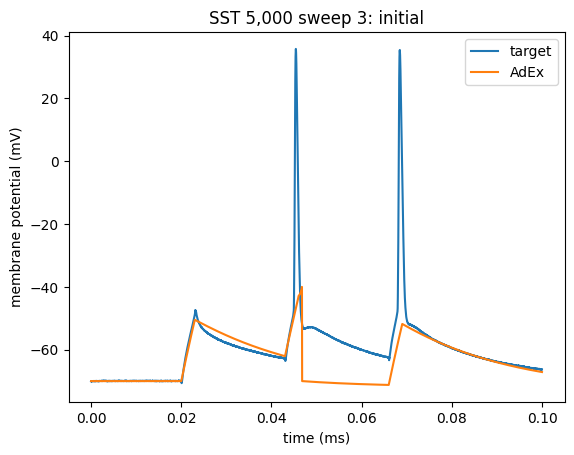

In [252]:
create_comparison_together(fastspikes_output_sliced[0], adex_sst_fast_0[0]*1000, d2_title='AdEx')
title('SST 5,000 sweep 3: initial')

Text(0.5, 1.0, 'SST 5,000 sweep 4: initial')

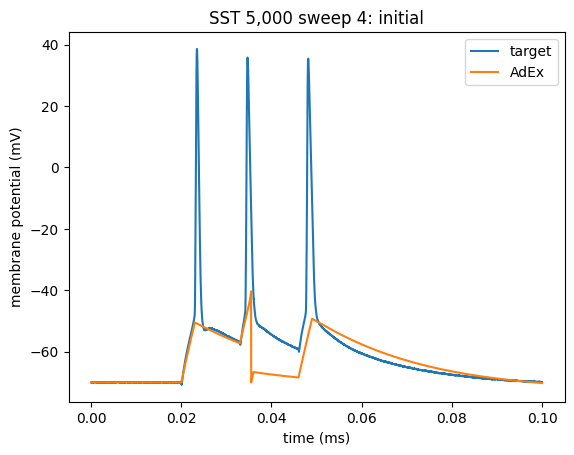

In [253]:
create_comparison_together(fastspikes_output_sliced[1], adex_sst_fast_0[1]*1000, d2_title='AdEx')
title('SST 5,000 sweep 4: initial')

Text(0.5, 1.0, 'SST 5,000 sweep 5: initial')

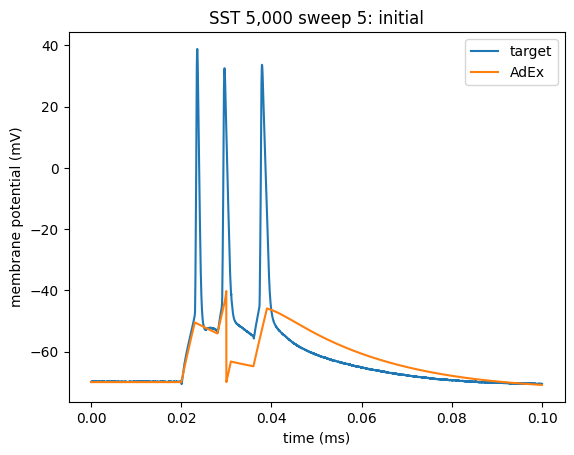

In [254]:
create_comparison_together(fastspikes_output_sliced[2], adex_sst_fast_0[2]*1000, d2_title='AdEx')
title('SST 5,000 sweep 5: initial')

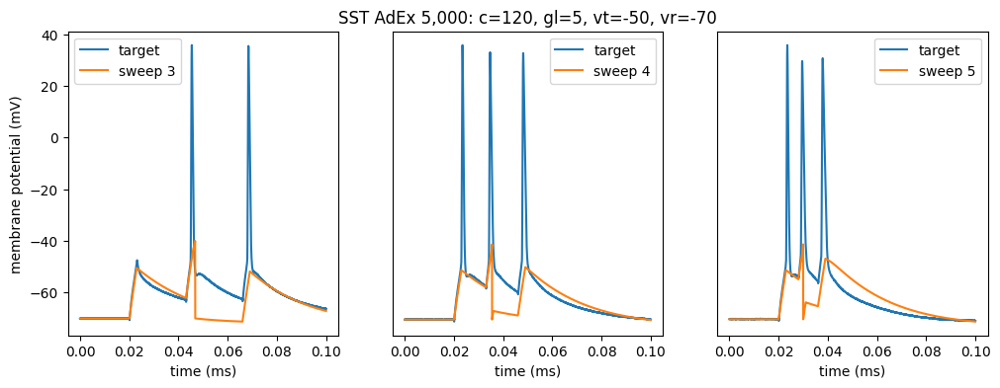

In [256]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(fastspikes_output_sliced[0], adex_sst_fast_0[0]*1000, d2_title='sweep 3')
ylabel('membrane potential (mV)')

subplot(1,3,2)
create_comparison_together(fastspikes_output_sliced[1], adex_sst_fast_0[1]*1000, d2_title='sweep 4')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('SST AdEx 5,000: c=120, gl=5, vt=-50, vr=-70')

subplot(1,3,3)
create_comparison_together(fastspikes_output_sliced[2], adex_sst_fast_0[2]*1000, d2_title='sweep 5')
ax = plt.gca()
ax.yaxis.set_visible(False)

In [ ]:
adex_sst_fast_1 = run_adex(fastspikes_input_sliced, fastspikes_output_sliced, delt_var=1)

# tt: 4.6s

first fit:
Round 0: Best parameters a=1.90288365 nS, b=66.51823192 pA, tauw=131.05799381 ms (error: 197.26536973 mV^2)
Round 1: Best parameters a=1.8632196 nS, b=58.2848049 pA, tauw=129.7426289 ms (error: 190.14973673 mV^2)
Round 2: Best parameters a=1.77619816 nS, b=56.94857258 pA, tauw=129.99262724 ms (error: 189.62841201 mV^2)
Round 3: Best parameters a=1.8632196 nS, b=57.21110902 pA, tauw=129.94182235 ms (error: 189.54399138 mV^2)
Round 4: Best parameters a=1.8632196 nS, b=57.21110902 pA, tauw=129.94182235 ms (error: 189.54399138 mV^2)
Round 5: Best parameters a=1.46842874 nS, b=57.83543947 pA, tauw=133.00930964 ms (error: 189.27142622 mV^2)
Round 6: Best parameters a=1.46842874 nS, b=57.83543947 pA, tauw=124.02093458 ms (error: 188.98592358 mV^2)
Round 7: Best parameters a=1.46842874 nS, b=57.83543947 pA, tauw=124.02093458 ms (error: 188.98592358 mV^2)
Round 8: Best parameters a=1.46842874 nS, b=57.83543947 pA, tauw=124.02093458 ms (error: 188.98592358 mV^2)
Round 9: Best paramete

Text(0.5, 1.0, 'SST 5,000 sweep 5: delt=1')

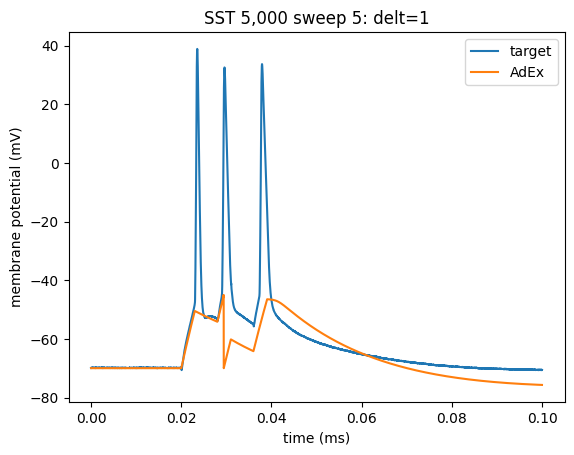

In [263]:
create_comparison_together(fastspikes_output_sliced[2], adex_sst_fast_1[2]*1000, d2_title='AdEx')
title('SST 5,000 sweep 5: delt=1')

In [ ]:
adex_sst_fast_2 = run_adex(fastspikes_input_sliced, fastspikes_output_sliced, delt_var=3)

# tt: 4.6s

first fit:
Round 0: Best parameters a=2.00782195 nS, b=58.47184614 pA, tauw=135.6878808 ms (error: 184.89635397 mV^2)
Round 1: Best parameters a=1.77863858 nS, b=34.00563871 pA, tauw=132.42401656 ms (error: 166.59567636 mV^2)
Round 2: Best parameters a=1.9077055 nS, b=20.69261715 pA, tauw=140.15831219 ms (error: 160.78744884 mV^2)
Round 3: Best parameters a=1.48602441 nS, b=14.75013337 pA, tauw=125.72446828 ms (error: 158.87732268 mV^2)
Round 4: Best parameters a=2.78685528 nS, b=9.84002593 pA, tauw=142.09350984 ms (error: 158.03286851 mV^2)
Round 5: Best parameters a=2.76971332 nS, b=6.70858272 pA, tauw=152.21602766 ms (error: 157.49019836 mV^2)
Round 6: Best parameters a=3.2606907 nS, b=4.84421663 pA, tauw=152.51175296 ms (error: 157.16764483 mV^2)
Round 7: Best parameters a=3.86848613 nS, b=3.24470965 pA, tauw=140.59563282 ms (error: 156.92563278 mV^2)
Round 8: Best parameters a=3.92078288 nS, b=2.5157558 pA, tauw=130.66277004 ms (error: 156.76968628 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST 5,000 sweep 5: delt=3')

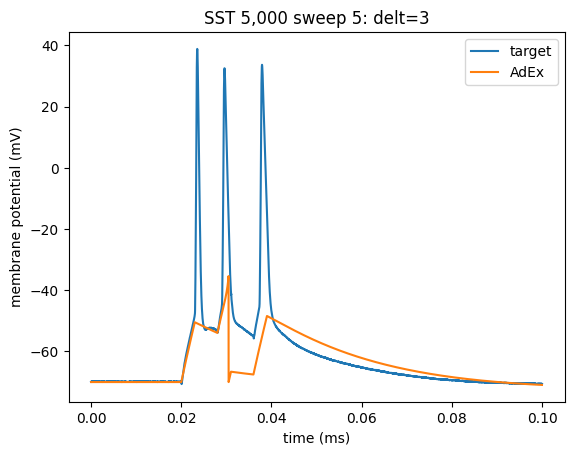

In [264]:
create_comparison_together(fastspikes_output_sliced[2], adex_sst_fast_2[2]*1000, d2_title='AdEx')
title('SST 5,000 sweep 5: delt=3')

In [ ]:
adex_sst_fast_3 = run_adex(fastspikes_input_sliced, fastspikes_output_sliced, delt_var=4)

# tt: 4.7s

first fit:
Round 0: Best parameters a=3.138145 nS, b=71.09466045 pA, tauw=134.63206287 ms (error: 204.77912304 mV^2)
Round 1: Best parameters a=1.82631516 nS, b=36.71437959 pA, tauw=141.02192643 ms (error: 183.14840308 mV^2)
Round 2: Best parameters a=1.56001747 nS, b=29.8658596 pA, tauw=155.55815582 ms (error: 166.13605565 mV^2)
Round 3: Best parameters a=1.29434061 nS, b=22.29347616 pA, tauw=147.85578131 ms (error: 161.62978237 mV^2)
Round 4: Best parameters a=1.25187458 nS, b=14.92127196 pA, tauw=154.6212687 ms (error: 159.56187793 mV^2)
Round 5: Best parameters a=1.13081685 nS, b=14.13250886 pA, tauw=155.3057722 ms (error: 158.92101384 mV^2)
Round 6: Best parameters a=1.15744781 nS, b=8.6135699 pA, tauw=156.34740334 ms (error: 158.49385951 mV^2)
Round 7: Best parameters a=1.09788146 nS, b=9.73151226 pA, tauw=158.55336108 ms (error: 158.31553786 mV^2)
Round 8: Best parameters a=1.07752669 nS, b=7.59127305 pA, tauw=158.23043577 ms (error: 158.20552413 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST 5,000 sweep 5: delt=4')

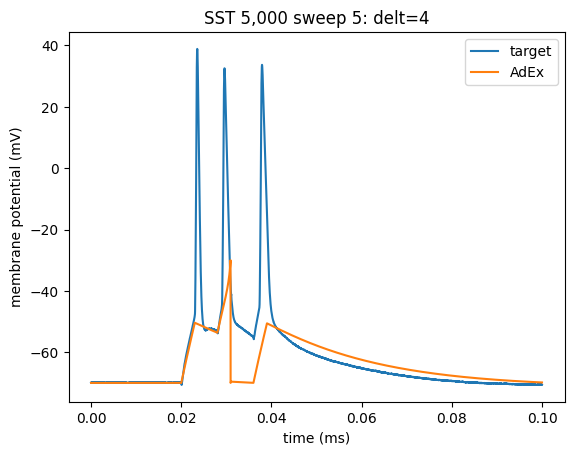

In [265]:
create_comparison_together(fastspikes_output_sliced[2], adex_sst_fast_3[2]*1000, d2_title='AdEx')
title('SST 5,000 sweep 5: delt=4')

In [ ]:
adex_sst_fast_4 = run_adex(fastspikes_input_sliced, fastspikes_output_sliced, tauw_min=130, tauw_max=150, b_max=0.001)
# tt: 8.3s

first fit:
Round 0: Best parameters a=3.61786604 nS, b=0.60533496 pA, tauw=134.47364877 ms (error: 160.81888688 mV^2)
Round 1: Best parameters a=3.65071652 nS, b=0.85496133 pA, tauw=135.75193172 ms (error: 160.80959273 mV^2)
Round 2: Best parameters a=3.76333458 nS, b=0.80239671 pA, tauw=133.05754569 ms (error: 160.77212733 mV^2)
Round 3: Best parameters a=3.89393727 nS, b=0.87393296 pA, tauw=132.89053187 ms (error: 160.74411608 mV^2)
Round 4: Best parameters a=3.89350988 nS, b=0.80239671 pA, tauw=131.09303792 ms (error: 160.72715015 mV^2)
Round 5: Best parameters a=3.93750714 nS, b=0.87778745 pA, tauw=131.17128983 ms (error: 160.72463419 mV^2)
Round 6: Best parameters a=3.95761937 nS, b=0.87079014 pA, tauw=130.93400072 ms (error: 160.72330983 mV^2)
Round 7: Best parameters a=3.96856228 nS, b=0.91521215 pA, tauw=130.69557219 ms (error: 160.70946334 mV^2)
Round 8: Best parameters a=3.97367563 nS, b=0.72077271 pA, tauw=130.50131004 ms (error: 160.69532178 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST 5,000 sweep 5: tauw=(130-150), a=(1-4), b=(0-0.001)')

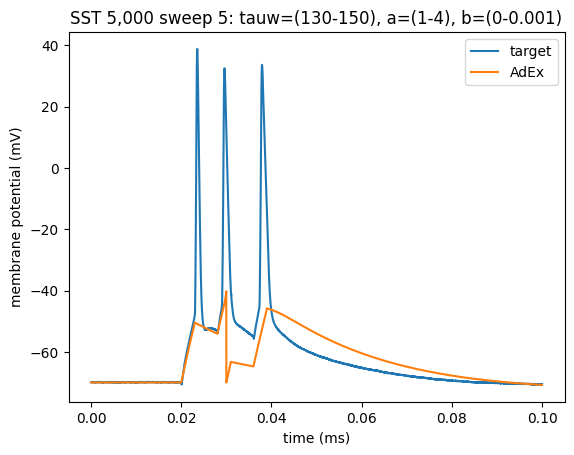

In [267]:
create_comparison_together(fastspikes_output_sliced[2], adex_sst_fast_4[2]*1000, d2_title='AdEx')
title('SST 5,000 sweep 5: tauw=(130-150), a=(1-4), b=(0-0.001)')

In [ ]:
adex_sst_fast_5 = run_adex(fastspikes_input_sliced, fastspikes_output_sliced, tauw_min=130, tauw_max=150, b_max=0.001)

# tt: 9.5s

first fit:
Round 0: Best parameters a=3.67058006 nS, b=0.81166115 pA, tauw=141.7051404 ms (error: 160.84545163 mV^2)
Round 1: Best parameters a=3.7571474 nS, b=0.79677132 pA, tauw=134.14552642 ms (error: 160.77597168 mV^2)
Round 2: Best parameters a=3.81691804 nS, b=0.81572113 pA, tauw=132.59555472 ms (error: 160.75044554 mV^2)
Round 3: Best parameters a=3.91390659 nS, b=0.9126249 pA, tauw=132.02325557 ms (error: 160.72729435 mV^2)
Round 4: Best parameters a=3.93104918 nS, b=0.820683 pA, tauw=131.58254363 ms (error: 160.72549926 mV^2)
Round 5: Best parameters a=3.93104918 nS, b=0.820683 pA, tauw=131.58254363 ms (error: 160.72549926 mV^2)
Round 6: Best parameters a=3.93104918 nS, b=0.820683 pA, tauw=131.58254363 ms (error: 160.72549926 mV^2)
Round 7: Best parameters a=3.93104918 nS, b=0.820683 pA, tauw=131.58254363 ms (error: 160.72549926 mV^2)
Round 8: Best parameters a=3.93104918 nS, b=0.820683 pA, tauw=131.58254363 ms (error: 160.72549926 mV^2)
Round 9: Best parameters a=3.93104918 n

Text(0.5, 1.0, 'SST 5,000 sweep 5: tauw=(120-150), b=(0-0.001)')

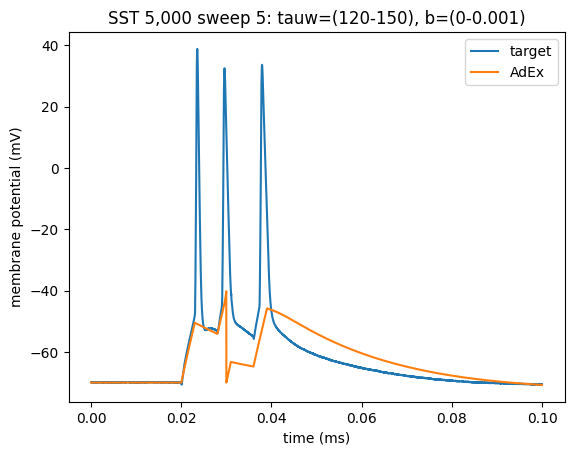

In [623]:
create_comparison_together(fastspikes_output_sliced[2], adex_sst_fast_5[2]*1000, d2_title='AdEx')
title('SST 5,000 sweep 5: tauw=(120-150), b=(0-0.001)')

In [622]:
adex_sst_fast_6 = run_adex(fastspikes_input_sliced, fastspikes_output_sliced, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

first fit:
Round 0: Best parameters a=3.80825538 nS, b=139.91564896 pA, tauw=126.12031835 ms (error: 249.91462824 mV^2)
Round 1: Best parameters a=3.09436937 nS, b=82.69876888 pA, tauw=90.12904973 ms (error: 214.26138974 mV^2)
Round 2: Best parameters a=4.61534264 nS, b=59.29171369 pA, tauw=108.04996963 ms (error: 201.9892686 mV^2)
Round 3: Best parameters a=4.33262288 nS, b=29.29399364 pA, tauw=90.15769113 ms (error: 195.79059458 mV^2)
Round 4: Best parameters a=4.75960887 nS, b=23.92460158 pA, tauw=140.9037615 ms (error: 191.01746844 mV^2)
Round 5: Best parameters a=3.88264529 nS, b=14.74964602 pA, tauw=144.90405814 ms (error: 188.12173681 mV^2)
Round 6: Best parameters a=1.44829913 nS, b=12.20278012 pA, tauw=152.44577899 ms (error: 183.54876545 mV^2)
Round 7: Best parameters a=1.32668163 nS, b=9.26517253 pA, tauw=141.0613979 ms (error: 180.40777091 mV^2)
Round 8: Best parameters a=1.483584 nS, b=7.45982775 pA, tauw=141.61049301 ms (error: 178.76157735 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST 5,000 sweep 5: c=60, gl=20, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160, a=(1-5), b=(0-1))')

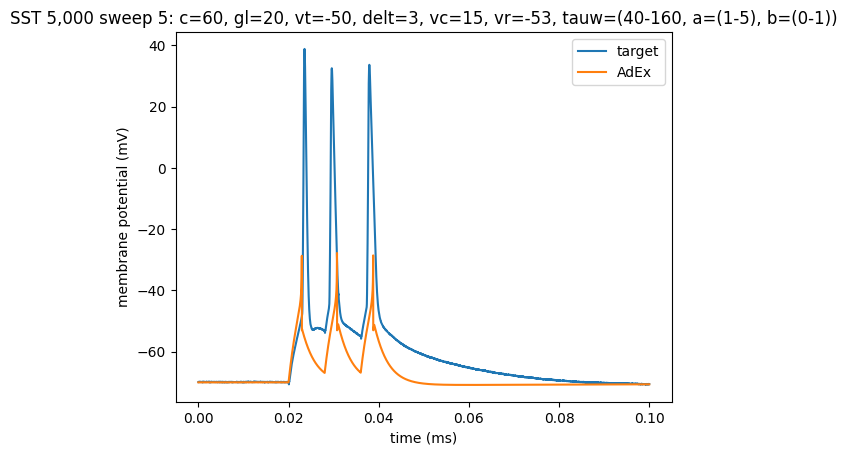

In [624]:
create_comparison_together(fastspikes_output_sliced[2], adex_sst_fast_6[2]*1000, d2_title='AdEx')
title('SST 5,000 sweep 5: c=60, gl=20, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160, a=(1-5), b=(0-1))')

***
# INDIVIDUAL SWEEP 5
***

In [ ]:
sst_hh_s5_0 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)

# tt: 23.1s


first fit:
Round 0: Best parameters g_kd=207.1076999 nS, g_na=3.91487345 uS, gl=4.64702354 nS (error: 916.55392845 mV^2)
Round 1: Best parameters g_kd=217.53342618 nS, g_na=2.15596234 uS, gl=6.03957503 nS (error: 756.2030042 mV^2)
Round 2: Best parameters g_kd=231.30134939 nS, g_na=1.88237776 uS, gl=3.18296582 nS (error: 693.01062876 mV^2)
Round 3: Best parameters g_kd=237.77376202 nS, g_na=1.71882467 uS, gl=8.15592968 nS (error: 428.91286525 mV^2)
Round 4: Best parameters g_kd=239.09703964 nS, g_na=1.53145498 uS, gl=8.25747832 nS (error: 121.55970882 mV^2)
Round 5: Best parameters g_kd=236.58724527 nS, g_na=1.32842365 uS, gl=8.27675361 nS (error: 52.98610049 mV^2)
Round 6: Best parameters g_kd=230.53898681 nS, g_na=1.33735614 uS, gl=8.82501709 nS (error: 50.74425694 mV^2)
Round 7: Best parameters g_kd=230.53898681 nS, g_na=1.33735614 uS, gl=8.82501709 nS (error: 50.74425694 mV^2)
Round 8: Best parameters g_kd=227.57652816 nS, g_na=1.21108632 uS, gl=8.77972885 nS (error: 49.58063234 mV

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

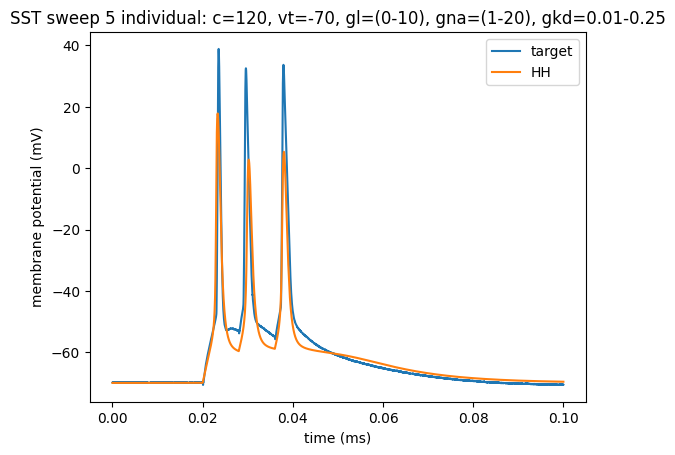

In [274]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_0[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, vt=-70, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

In [ ]:
sst_hh_s5_1 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-70, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)

# tt: 22.4s

first fit:
Round 0: Best parameters g_kd=201.25149645 nS, g_na=3.26999684 uS, gl=6.27365463 nS (error: 903.17097918 mV^2)
Round 1: Best parameters g_kd=210.52114286 nS, g_na=2.41132326 uS, gl=5.51236334 nS (error: 817.4701086 mV^2)
Round 2: Best parameters g_kd=226.63767867 nS, g_na=1.92264015 uS, gl=5.34128505 nS (error: 753.71265963 mV^2)
Round 3: Best parameters g_kd=223.01358847 nS, g_na=1.55532736 uS, gl=8.36520823 nS (error: 701.38033209 mV^2)
Round 4: Best parameters g_kd=225.06132023 nS, g_na=1.35082614 uS, gl=7.93509879 nS (error: 658.92301504 mV^2)
Round 5: Best parameters g_kd=229.71442109 nS, g_na=1.26254244 uS, gl=7.52924931 nS (error: 628.47423522 mV^2)
Round 6: Best parameters g_kd=234.40182122 nS, g_na=1.25208311 uS, gl=8.88731375 nS (error: 604.09082568 mV^2)
Round 7: Best parameters g_kd=240.58710565 nS, g_na=1.16034411 uS, gl=7.81286073 nS (error: 587.62637889 mV^2)
Round 8: Best parameters g_kd=240.87338682 nS, g_na=1.1061443 uS, gl=8.84060604 nS (error: 579.9020575

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-70, vt=-70, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

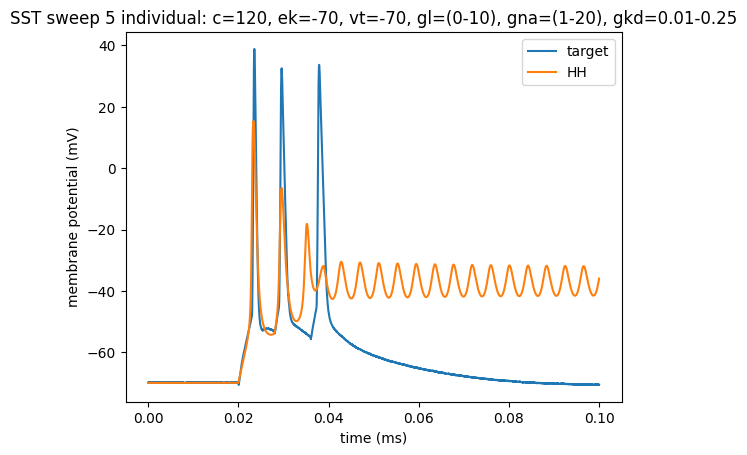

In [276]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_1[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-70, vt=-70, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

In [ ]:
sst_hh_s5_2 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)

# tt: 22.9s


first fit:
Round 0: Best parameters g_kd=163.39444996 nS, g_na=3.87207359 uS, gl=7.43608803 nS (error: 963.14242799 mV^2)
Round 1: Best parameters g_kd=198.56256528 nS, g_na=2.58545511 uS, gl=6.76911214 nS (error: 817.83348403 mV^2)
Round 2: Best parameters g_kd=213.31105469 nS, g_na=2.01590129 uS, gl=6.37414684 nS (error: 761.1467788 mV^2)
Round 3: Best parameters g_kd=227.42902407 nS, g_na=1.65243616 uS, gl=7.17966507 nS (error: 654.16730673 mV^2)
Round 4: Best parameters g_kd=219.76887467 nS, g_na=1.42566903 uS, gl=6.75857259 nS (error: 625.49931345 mV^2)
Round 5: Best parameters g_kd=228.32614661 nS, g_na=1.30390095 uS, gl=8.82981186 nS (error: 556.43482401 mV^2)
Round 6: Best parameters g_kd=235.82330994 nS, g_na=1.23030325 uS, gl=8.69428317 nS (error: 378.89807587 mV^2)
Round 7: Best parameters g_kd=238.88124955 nS, g_na=1.2004468 uS, gl=8.91866318 nS (error: 261.96964915 mV^2)
Round 8: Best parameters g_kd=236.35991781 nS, g_na=1.18084527 uS, gl=9.47401181 nS (error: 102.0735223

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, vt=-70, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

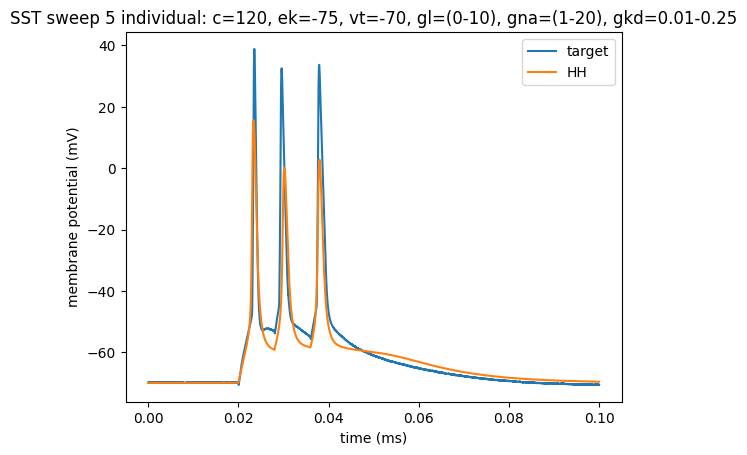

In [278]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_2[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, vt=-70, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

In [ ]:
sst_hh_s5_3 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-73, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)

# tt: 22.1s

first fit:
Round 0: Best parameters g_kd=147.09270441 nS, g_na=2.9640291 uS, gl=8.56530358 nS (error: 910.7420027 mV^2)
Round 1: Best parameters g_kd=171.21662452 nS, g_na=2.1341563 uS, gl=8.32513578 nS (error: 795.23518807 mV^2)
Round 2: Best parameters g_kd=221.10328779 nS, g_na=1.6895102 uS, gl=2.70064531 nS (error: 734.8745242 mV^2)
Round 3: Best parameters g_kd=226.65070029 nS, g_na=1.64230362 uS, gl=9.22977075 nS (error: 669.58890121 mV^2)
Round 4: Best parameters g_kd=231.91401158 nS, g_na=1.44300441 uS, gl=8.02399349 nS (error: 622.35761115 mV^2)
Round 5: Best parameters g_kd=224.01995527 nS, g_na=1.27822263 uS, gl=6.13974651 nS (error: 611.53270043 mV^2)
Round 6: Best parameters g_kd=235.90356092 nS, g_na=1.2807574 uS, gl=8.98138267 nS (error: 588.17802503 mV^2)
Round 7: Best parameters g_kd=237.65104906 nS, g_na=1.18551305 uS, gl=9.36226319 nS (error: 508.63455627 mV^2)
Round 8: Best parameters g_kd=239.54379557 nS, g_na=1.15598003 uS, gl=9.53076057 nS (error: 452.40559417 mV

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-73, vt=-70, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

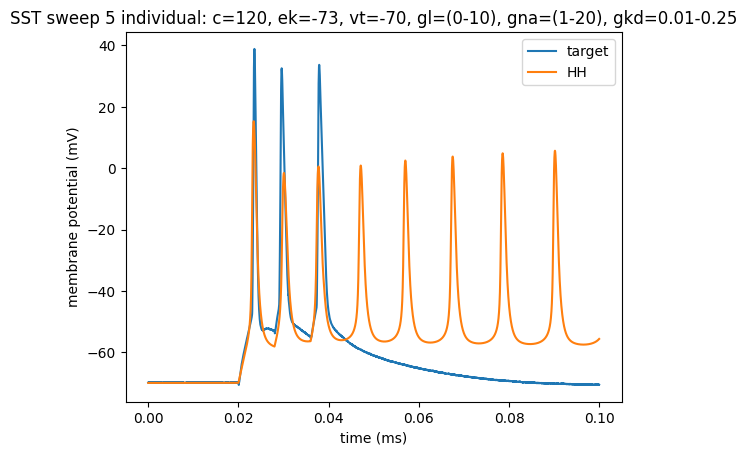

In [280]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_3[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-73, vt=-70, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

In [ ]:
sst_hh_s5_4 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-74, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)
# tt: 23.2s

first fit:
Round 0: Best parameters g_kd=187.60942605 nS, g_na=3.21290135 uS, gl=7.36234106 nS (error: 888.51534174 mV^2)
Round 1: Best parameters g_kd=187.13752185 nS, g_na=2.56814565 uS, gl=8.5004958 nS (error: 823.22790785 mV^2)
Round 2: Best parameters g_kd=179.039306 nS, g_na=2.03017606 uS, gl=8.30466079 nS (error: 772.73326254 mV^2)
Round 3: Best parameters g_kd=220.46707034 nS, g_na=1.86324933 uS, gl=8.84182129 nS (error: 723.84732531 mV^2)
Round 4: Best parameters g_kd=221.68208987 nS, g_na=1.53648414 uS, gl=7.96235885 nS (error: 645.32895525 mV^2)
Round 5: Best parameters g_kd=227.06841712 nS, g_na=1.38507134 uS, gl=7.55508759 nS (error: 618.98027759 mV^2)
Round 6: Best parameters g_kd=232.258832 nS, g_na=1.24355215 uS, gl=9.11035935 nS (error: 543.53280869 mV^2)
Round 7: Best parameters g_kd=237.3097537 nS, g_na=1.16710812 uS, gl=9.27998349 nS (error: 371.79025808 mV^2)
Round 8: Best parameters g_kd=239.39281253 nS, g_na=1.15160086 uS, gl=9.45470899 nS (error: 250.27709784 mV

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-73, vt=-74, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

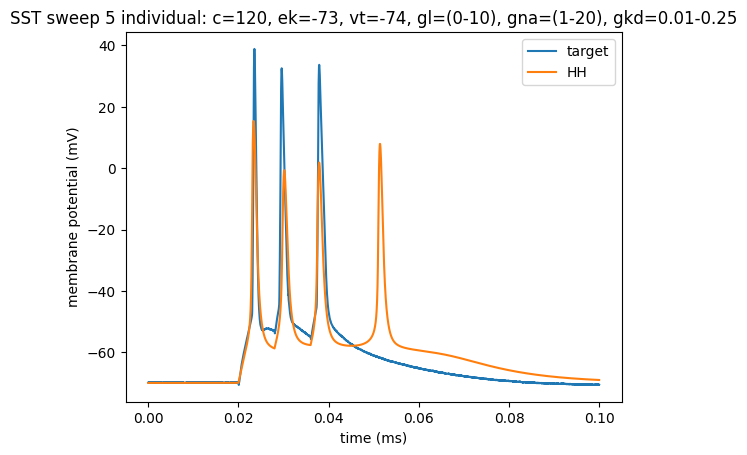

In [282]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_4[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-73, vt=-74, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

In [ ]:
sst_hh_s5_5 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)

# tt: 23.9s

first fit:
Round 0: Best parameters g_kd=177.13734174 nS, g_na=3.4728756 uS, gl=7.75143042 nS (error: 959.84908111 mV^2)
Round 1: Best parameters g_kd=201.18414063 nS, g_na=2.63262451 uS, gl=6.75076491 nS (error: 861.01546584 mV^2)
Round 2: Best parameters g_kd=218.48862642 nS, g_na=1.91561094 uS, gl=7.74621738 nS (error: 777.74979365 mV^2)
Round 3: Best parameters g_kd=233.27764878 nS, g_na=1.56261933 uS, gl=4.82461599 nS (error: 687.6321781 mV^2)
Round 4: Best parameters g_kd=215.95332179 nS, g_na=1.41717883 uS, gl=8.52800557 nS (error: 647.28114924 mV^2)
Round 5: Best parameters g_kd=234.708555 nS, g_na=1.35035658 uS, gl=8.71190407 nS (error: 607.35818887 mV^2)
Round 6: Best parameters g_kd=240.59886254 nS, g_na=1.28155089 uS, gl=8.87793193 nS (error: 416.92543104 mV^2)
Round 7: Best parameters g_kd=243.26182653 nS, g_na=1.20024177 uS, gl=9.12859377 nS (error: 110.6272388 mV^2)
Round 8: Best parameters g_kd=238.75904679 nS, g_na=1.13360217 uS, gl=9.06645018 nS (error: 109.03022582 m

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

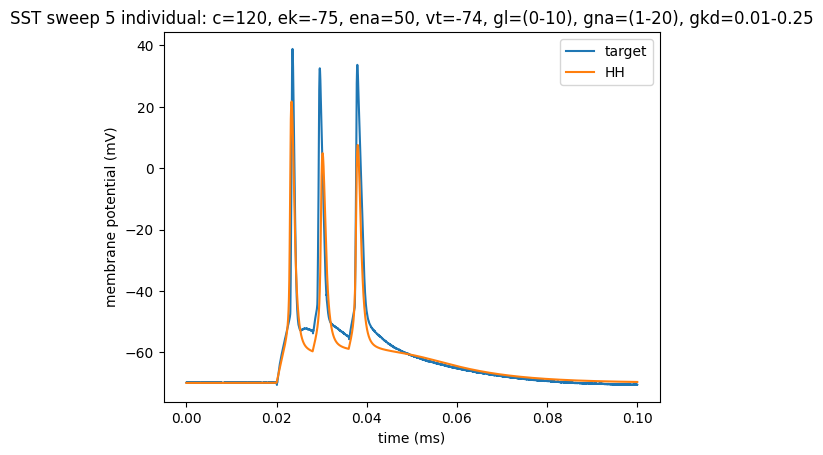

In [284]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_5[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

In [ ]:
sst_hh_s5_6 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=70, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)

# tt: 23.1s

first fit:
Round 0: Best parameters g_kd=126.17092854 nS, g_na=2.96858062 uS, gl=4.68856292 nS (error: 1097.5388444 mV^2)
Round 1: Best parameters g_kd=218.00962313 nS, g_na=2.43781047 uS, gl=7.56228581 nS (error: 896.77936642 mV^2)
Round 2: Best parameters g_kd=215.66363475 nS, g_na=1.85273464 uS, gl=8.47783369 nS (error: 832.54512833 mV^2)
Round 3: Best parameters g_kd=228.37999497 nS, g_na=1.63436965 uS, gl=8.82819561 nS (error: 749.08509915 mV^2)
Round 4: Best parameters g_kd=227.08496568 nS, g_na=1.48108113 uS, gl=8.63075078 nS (error: 705.47290646 mV^2)
Round 5: Best parameters g_kd=226.37500824 nS, g_na=1.39225883 uS, gl=7.14971226 nS (error: 696.91928403 mV^2)
Round 6: Best parameters g_kd=215.2936413 nS, g_na=1.30553469 uS, gl=8.50916021 nS (error: 680.17042524 mV^2)
Round 7: Best parameters g_kd=235.19469124 nS, g_na=1.23394949 uS, gl=9.1251607 nS (error: 575.34001506 mV^2)
Round 8: Best parameters g_kd=235.99504481 nS, g_na=1.17214081 uS, gl=9.00864639 nS (error: 461.6327692

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=70, vt=-74, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

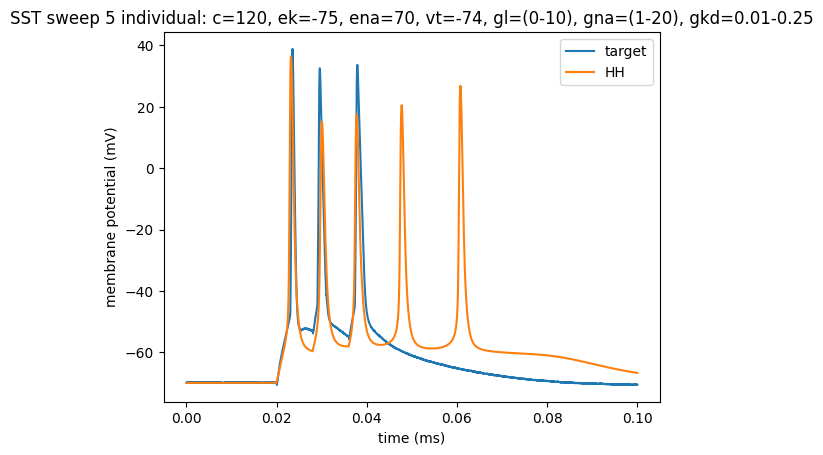

In [286]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_6[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=70, vt=-74, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

In [ ]:
sst_hh_s5_7 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=60, vt=-70, \
                           glmin=0, glmax=10, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)

# tt: 22.6s

first fit:
Round 0: Best parameters g_kd=173.74077313 nS, g_na=3.87036178 uS, gl=1.17033038 nS (error: 1073.7569805 mV^2)
Round 1: Best parameters g_kd=176.17567592 nS, g_na=2.56013017 uS, gl=6.80230326 nS (error: 916.83387266 mV^2)
Round 2: Best parameters g_kd=209.06698761 nS, g_na=2.05583928 uS, gl=7.05928822 nS (error: 823.50655794 mV^2)
Round 3: Best parameters g_kd=203.31050216 nS, g_na=1.62353793 uS, gl=9.13408886 nS (error: 766.49250037 mV^2)
Round 4: Best parameters g_kd=231.05830456 nS, g_na=1.55234119 uS, gl=8.60408299 nS (error: 687.1805328 mV^2)
Round 5: Best parameters g_kd=231.05830456 nS, g_na=1.55234119 uS, gl=8.60408299 nS (error: 687.1805328 mV^2)
Round 6: Best parameters g_kd=226.84703393 nS, g_na=1.51862206 uS, gl=8.99442812 nS (error: 682.78186472 mV^2)
Round 7: Best parameters g_kd=216.32001914 nS, g_na=1.34723911 uS, gl=9.35324522 nS (error: 666.92526241 mV^2)
Round 8: Best parameters g_kd=216.32001914 nS, g_na=1.34723911 uS, gl=8.26388751 nS (error: 662.4928730

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=60, vt=-74, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

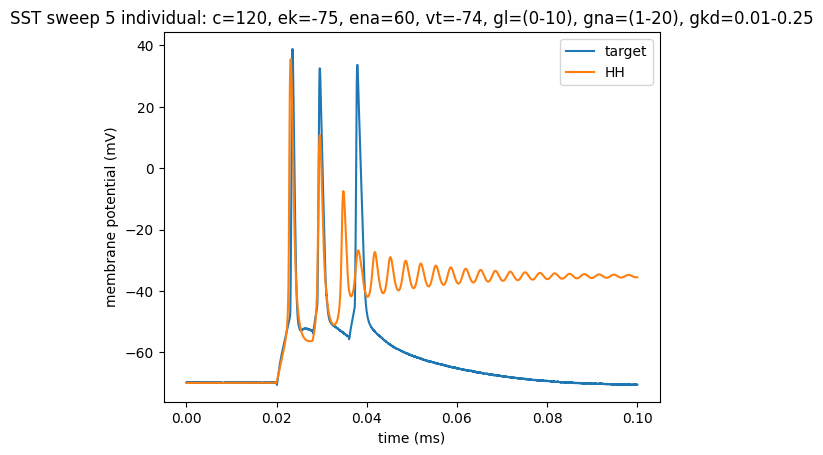

In [288]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_7[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=60, vt=-74, gl=(0-10), gna=(1-20), gkd=0.01-0.25')

In [ ]:
sst_hh_s5_8 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=8, gnamin=1, gnamax=20, gkdmin=0.01, gkdmax=0.25)

# tt: 22.9s

first fit:
Round 0: Best parameters g_kd=215.75322854 nS, g_na=3.82982159 uS, gl=6.10214846 nS (error: 953.77285338 mV^2)
Round 1: Best parameters g_kd=221.95653823 nS, g_na=2.57027274 uS, gl=4.90884294 nS (error: 843.93458005 mV^2)
Round 2: Best parameters g_kd=191.86445898 nS, g_na=1.84334386 uS, gl=6.42927345 nS (error: 780.75305211 mV^2)
Round 3: Best parameters g_kd=232.05820384 nS, g_na=1.62627074 uS, gl=5.64018403 nS (error: 698.94209528 mV^2)
Round 4: Best parameters g_kd=234.73352766 nS, g_na=1.42284319 uS, gl=7.16233966 nS (error: 662.66220522 mV^2)
Round 5: Best parameters g_kd=221.79850482 nS, g_na=1.28332545 uS, gl=5.94653194 nS (error: 635.59935777 mV^2)
Round 6: Best parameters g_kd=234.08666935 nS, g_na=1.20923134 uS, gl=7.20061482 nS (error: 573.8952096 mV^2)
Round 7: Best parameters g_kd=238.10647771 nS, g_na=1.17035248 uS, gl=7.28003563 nS (error: 487.3832701 mV^2)
Round 8: Best parameters g_kd=240.63959987 nS, g_na=1.1499078 uS, gl=7.3292283 nS (error: 446.80927949 

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-8), gna=(1-20), gkd=0.01-0.25')

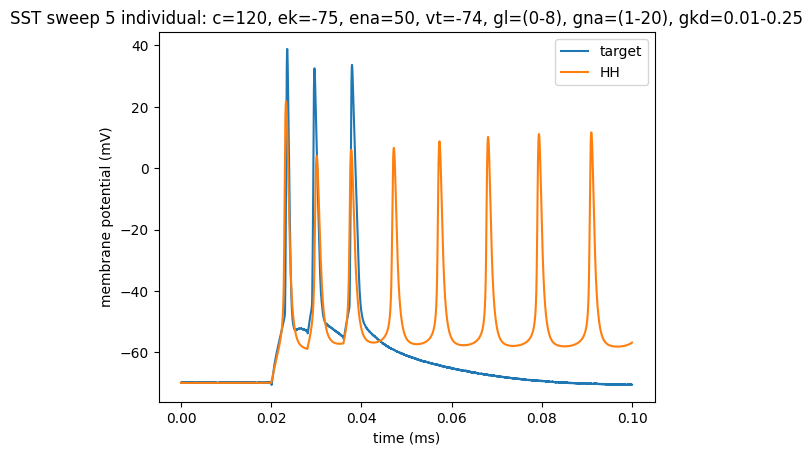

In [292]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_8[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-8), gna=(1-20), gkd=0.01-0.25')

In [293]:
sst_hh_s5_8 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=1)

first fit:
Round 0: Best parameters g_kd=0.58860428 uS, g_na=4.8670237 uS, gl=6.52500445 nS (error: 184.10166839 mV^2)
Round 1: Best parameters g_kd=0.38350251 uS, g_na=3.18211097 uS, gl=10.80242621 nS (error: 126.84435812 mV^2)
Round 2: Best parameters g_kd=0.38350251 uS, g_na=3.18211097 uS, gl=10.80242621 nS (error: 126.84435812 mV^2)
Round 3: Best parameters g_kd=0.35030807 uS, g_na=3.17769228 uS, gl=10.82964274 nS (error: 108.63730929 mV^2)
Round 4: Best parameters g_kd=307.90000272 nS, g_na=2.53851361 uS, gl=11.92974461 nS (error: 89.97861852 mV^2)
Round 5: Best parameters g_kd=307.90000272 nS, g_na=2.53851361 uS, gl=11.92974461 nS (error: 89.97861852 mV^2)
Round 6: Best parameters g_kd=303.96243982 nS, g_na=2.10996314 uS, gl=9.99877551 nS (error: 82.97934708 mV^2)
Round 7: Best parameters g_kd=281.53114292 nS, g_na=2.01955837 uS, gl=13.34873192 nS (error: 81.76200595 mV^2)
Round 8: Best parameters g_kd=281.53114292 nS, g_na=2.01955837 uS, gl=13.34873192 nS (error: 81.76200595 mV^

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-1')

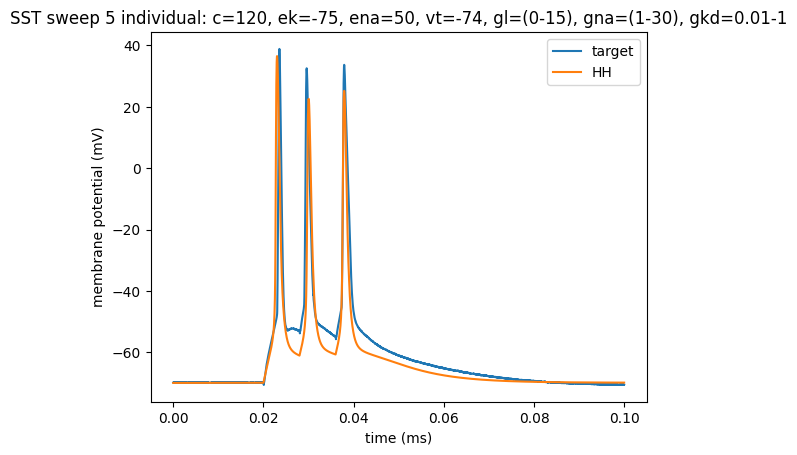

In [294]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_8[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-1')

In [ ]:
sst_hh_s5_9 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.02)

# tt:25s

first fit:
Round 0: Best parameters g_kd=18.48418459 nS, g_na=5.00222923 uS, gl=10.06702386 nS (error: 1897.70943309 mV^2)
Round 1: Best parameters g_kd=19.03466954 nS, g_na=3.02312933 uS, gl=11.24153229 nS (error: 1523.31764641 mV^2)
Round 2: Best parameters g_kd=18.08606422 nS, g_na=2.18540682 uS, gl=11.16108392 nS (error: 1360.9038678 mV^2)
Round 3: Best parameters g_kd=19.02808249 nS, g_na=1.85592226 uS, gl=12.85078832 nS (error: 1222.58806271 mV^2)
Round 4: Best parameters g_kd=19.20786636 nS, g_na=1.6399071 uS, gl=13.78122377 nS (error: 1143.35481531 mV^2)
Round 5: Best parameters g_kd=18.87867008 nS, g_na=1.43212607 uS, gl=13.42592921 nS (error: 1095.68893224 mV^2)
Round 6: Best parameters g_kd=19.03609477 nS, g_na=1.28274999 uS, gl=13.54303379 nS (error: 1046.87050378 mV^2)
Round 7: Best parameters g_kd=19.44512733 nS, g_na=1.19228069 uS, gl=13.59906094 nS (error: 1013.78669405 mV^2)
Round 8: Best parameters g_kd=19.59123972 nS, g_na=1.17315748 uS, gl=14.19711153 nS (error: 995

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.02')

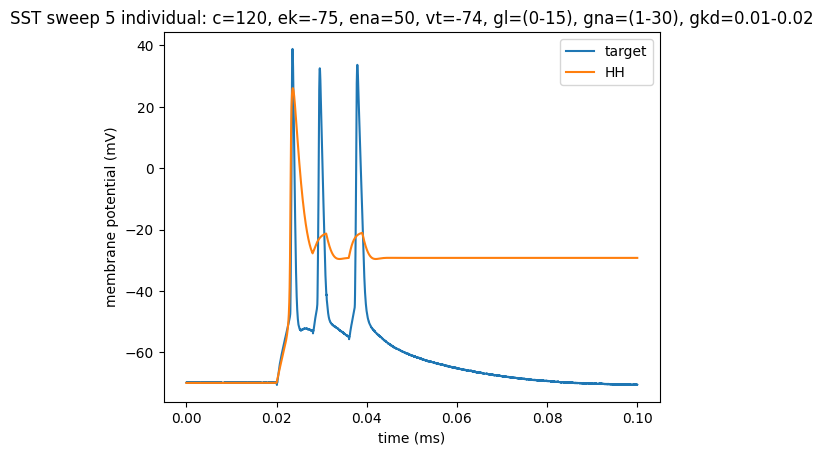

In [296]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_9[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.02')

In [ ]:
sst_hh_s5_10 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.03)

# tt: 23.6

first fit:
Round 0: Best parameters g_kd=15.74829905 nS, g_na=5.16500246 uS, gl=12.74146852 nS (error: 1893.51527851 mV^2)
Round 1: Best parameters g_kd=24.88409352 nS, g_na=2.95350783 uS, gl=11.89574889 nS (error: 1404.0443154 mV^2)
Round 2: Best parameters g_kd=25.90968737 nS, g_na=2.6160469 uS, gl=12.67150911 nS (error: 1312.09725676 mV^2)
Round 3: Best parameters g_kd=27.39265657 nS, g_na=2.15207089 uS, gl=13.54043775 nS (error: 1187.76551828 mV^2)
Round 4: Best parameters g_kd=25.77682716 nS, g_na=1.67007533 uS, gl=13.62399786 nS (error: 1091.40185712 mV^2)
Round 5: Best parameters g_kd=28.15161878 nS, g_na=1.60806605 uS, gl=13.8470086 nS (error: 1053.80315786 mV^2)
Round 6: Best parameters g_kd=27.56819177 nS, g_na=1.40759389 uS, gl=13.47503154 nS (error: 1013.00251006 mV^2)
Round 7: Best parameters g_kd=27.86866346 nS, g_na=1.30165159 uS, gl=13.72310671 nS (error: 978.81391505 mV^2)
Round 8: Best parameters g_kd=28.6435351 nS, g_na=1.20014897 uS, gl=12.88716542 nS (error: 957.53

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.03')

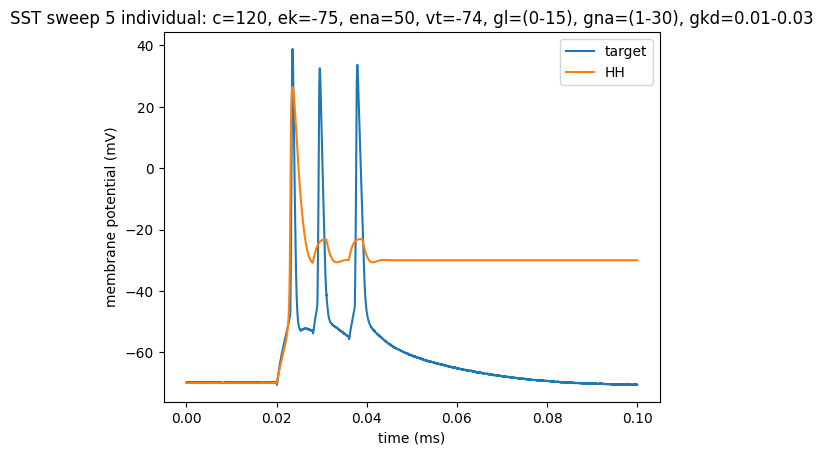

In [298]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_10[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.03')

In [ ]:
sst_hh_s5_11 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.04)

# tt: 23.6

first fit:
Round 0: Best parameters g_kd=16.91629804 nS, g_na=4.49361309 uS, gl=12.63911225 nS (error: 1773.15773881 mV^2)
Round 1: Best parameters g_kd=33.0754187 nS, g_na=3.37158133 uS, gl=13.33006438 nS (error: 1354.32896055 mV^2)
Round 2: Best parameters g_kd=35.6305725 nS, g_na=2.61678776 uS, gl=12.87614633 nS (error: 1217.34338347 mV^2)
Round 3: Best parameters g_kd=35.90553203 nS, g_na=1.92172999 uS, gl=13.65900414 nS (error: 1073.19176748 mV^2)
Round 4: Best parameters g_kd=36.21321143 nS, g_na=1.5664914 uS, gl=12.92400789 nS (error: 1003.66768289 mV^2)
Round 5: Best parameters g_kd=36.55145159 nS, g_na=1.51138 uS, gl=14.18878265 nS (error: 973.00375143 mV^2)
Round 6: Best parameters g_kd=38.19619289 nS, g_na=1.31416489 uS, gl=13.5906834 nS (error: 924.45358667 mV^2)
Round 7: Best parameters g_kd=37.21974474 nS, g_na=1.22610351 uS, gl=14.02894359 nS (error: 902.09532235 mV^2)
Round 8: Best parameters g_kd=37.38505159 nS, g_na=1.17765159 uS, gl=14.51911103 nS (error: 883.5339081

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.04')

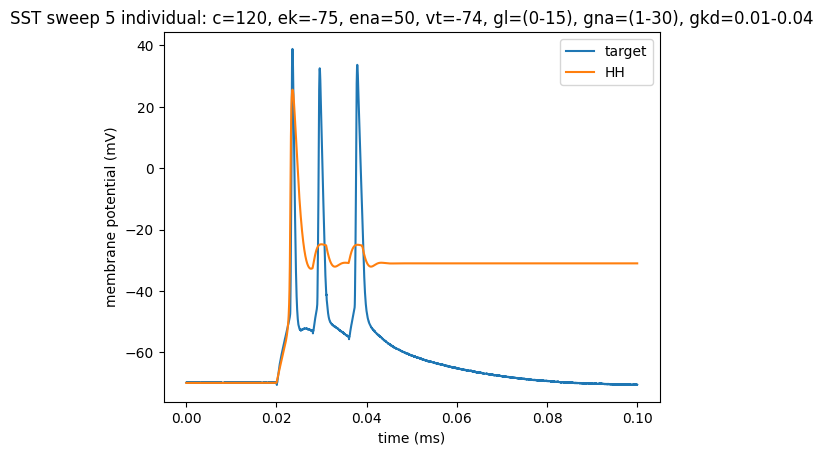

In [300]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_11[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.04')

In [ ]:
sst_hh_s5_12 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.1)

# tt: 22.8

first fit:
Round 0: Best parameters g_kd=75.0318434 nS, g_na=6.45414338 uS, gl=6.90210602 nS (error: 1472.71524888 mV^2)
Round 1: Best parameters g_kd=80.91605006 nS, g_na=4.688786 uS, gl=8.85751119 nS (error: 1270.87913817 mV^2)
Round 2: Best parameters g_kd=74.65915379 nS, g_na=3.32248574 uS, gl=8.2110634 nS (error: 1157.67454122 mV^2)
Round 3: Best parameters g_kd=88.74888421 nS, g_na=2.57369257 uS, gl=12.60674907 nS (error: 984.90926719 mV^2)
Round 4: Best parameters g_kd=85.78268094 nS, g_na=1.99662272 uS, gl=11.14810382 nS (error: 919.62225488 mV^2)
Round 5: Best parameters g_kd=93.99378561 nS, g_na=1.89825009 uS, gl=13.57084518 nS (error: 870.13683685 mV^2)
Round 6: Best parameters g_kd=93.25747463 nS, g_na=1.57023007 uS, gl=13.22126277 nS (error: 819.32607857 mV^2)
Round 7: Best parameters g_kd=94.00666308 nS, g_na=1.49509061 uS, gl=13.93052334 nS (error: 800.34664409 mV^2)
Round 8: Best parameters g_kd=93.81051054 nS, g_na=1.33560618 uS, gl=13.52885305 nS (error: 773.47342927 

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.1')

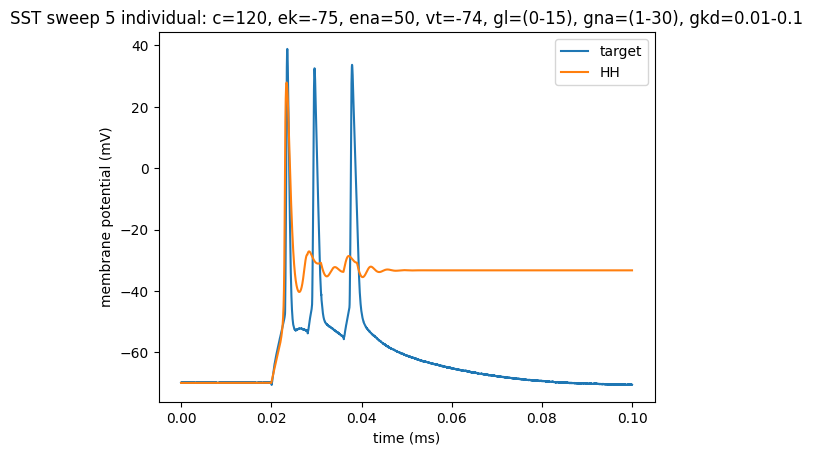

In [302]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_12[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.1')

In [ ]:
sst_hh_s5_13 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.2)

# tt: 23.6

first fit:
Round 0: Best parameters g_kd=146.11633878 nS, g_na=5.2454979 uS, gl=8.8851488 nS (error: 1135.3351702 mV^2)
Round 1: Best parameters g_kd=175.03081347 nS, g_na=3.65098919 uS, gl=11.32535439 nS (error: 961.76909337 mV^2)
Round 2: Best parameters g_kd=177.26281187 nS, g_na=2.80350137 uS, gl=11.32535439 nS (error: 881.80941234 mV^2)
Round 3: Best parameters g_kd=182.0810127 nS, g_na=2.20097727 uS, gl=13.28627174 nS (error: 800.36916677 mV^2)
Round 4: Best parameters g_kd=178.40994517 nS, g_na=1.83117457 uS, gl=14.19719111 nS (error: 761.02020684 mV^2)
Round 5: Best parameters g_kd=187.10739659 nS, g_na=1.51059782 uS, gl=13.50960105 nS (error: 677.28467083 mV^2)
Round 6: Best parameters g_kd=188.37260069 nS, g_na=1.40772973 uS, gl=14.30844513 nS (error: 641.42505656 mV^2)
Round 7: Best parameters g_kd=185.38070679 nS, g_na=1.33646708 uS, gl=14.28817641 nS (error: 636.63955342 mV^2)
Round 8: Best parameters g_kd=180.31080639 nS, g_na=1.2415417 uS, gl=13.60399869 nS (error: 626.9

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.2')

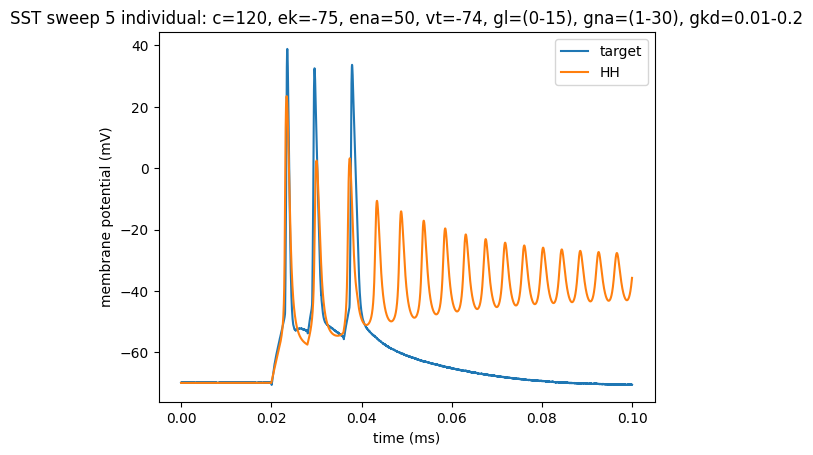

In [304]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_13[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.2')

In [ ]:
sst_hh_s5_14 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.3)

# tt: 23.8

first fit:
Round 0: Best parameters g_kd=271.38272569 nS, g_na=5.22172 uS, gl=4.75836454 nS (error: 994.35777234 mV^2)
Round 1: Best parameters g_kd=276.95536229 nS, g_na=3.54830522 uS, gl=12.62735679 nS (error: 866.34513622 mV^2)
Round 2: Best parameters g_kd=283.70823444 nS, g_na=2.31386925 uS, gl=7.00809663 nS (error: 733.03201462 mV^2)
Round 3: Best parameters g_kd=277.42002432 nS, g_na=2.066699 uS, gl=13.28265997 nS (error: 76.84599863 mV^2)
Round 4: Best parameters g_kd=261.05503803 nS, g_na=1.97288747 uS, gl=13.51429102 nS (error: 66.39893701 mV^2)
Round 5: Best parameters g_kd=253.20796666 nS, g_na=1.84109235 uS, gl=14.18656861 nS (error: 63.57194605 mV^2)
Round 6: Best parameters g_kd=253.56127475 nS, g_na=1.83620701 uS, gl=13.8928837 nS (error: 62.81173251 mV^2)
Round 7: Best parameters g_kd=237.75569219 nS, g_na=1.70009603 uS, gl=14.29042585 nS (error: 54.24950218 mV^2)
Round 8: Best parameters g_kd=229.12119464 nS, g_na=1.56700469 uS, gl=14.04611014 nS (error: 49.45326667 m

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.3')

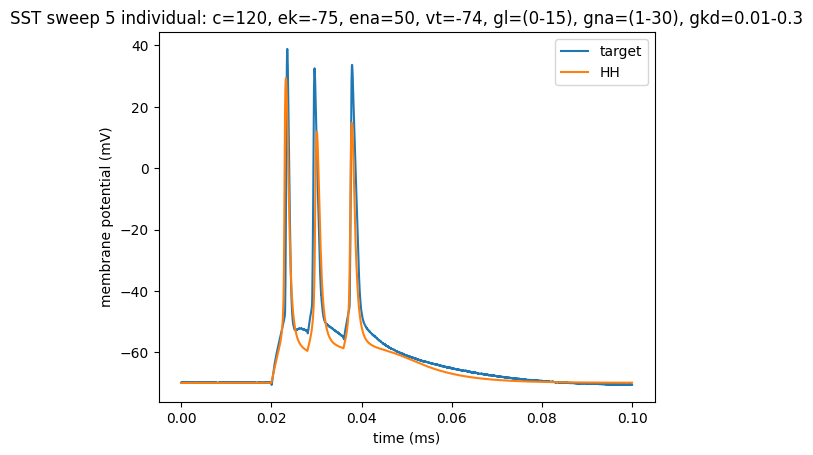

In [306]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_14[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.3')

In [ ]:
sst_hh_s5_15 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.4)

# tt: 23.6

first fit:
Round 0: Best parameters g_kd=0.321428 uS, g_na=5.00350784 uS, gl=4.48538712 nS (error: 949.42440906 mV^2)
Round 1: Best parameters g_kd=0.35403005 uS, g_na=3.29984208 uS, gl=5.87750053 nS (error: 832.41457346 mV^2)
Round 2: Best parameters g_kd=0.35346397 uS, g_na=2.80062178 uS, gl=11.41433865 nS (error: 115.96144244 mV^2)
Round 3: Best parameters g_kd=0.34125268 uS, g_na=3.2122679 uS, gl=12.32716203 nS (error: 106.60699814 mV^2)
Round 4: Best parameters g_kd=291.94321553 nS, g_na=2.04755167 uS, gl=11.22366371 nS (error: 79.44335098 mV^2)
Round 5: Best parameters g_kd=291.94321553 nS, g_na=2.04755167 uS, gl=11.22366371 nS (error: 79.44335098 mV^2)
Round 6: Best parameters g_kd=264.57912154 nS, g_na=1.97602783 uS, gl=12.81226101 nS (error: 67.23573987 mV^2)
Round 7: Best parameters g_kd=264.57912154 nS, g_na=1.97602783 uS, gl=12.81226101 nS (error: 67.23573987 mV^2)
Round 8: Best parameters g_kd=264.57912154 nS, g_na=1.97602783 uS, gl=12.81226101 nS (error: 67.23573987 mV^2)

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.4')

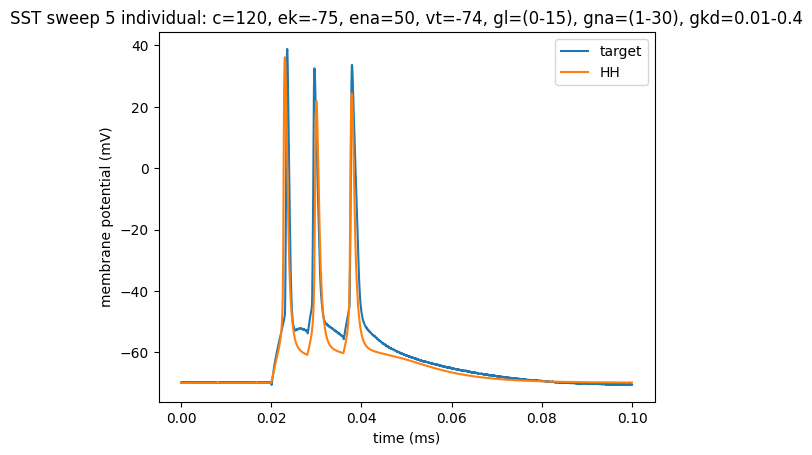

In [308]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_15[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.4')

In [ ]:
sst_hh_s5_16 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.5)

# tt: 22.9

first fit:
Round 0: Best parameters g_kd=0.40363739 uS, g_na=6.71998105 uS, gl=11.09084756 nS (error: 965.91613146 mV^2)
Round 1: Best parameters g_kd=0.42482447 uS, g_na=5.32878759 uS, gl=7.09581197 nS (error: 883.42371773 mV^2)
Round 2: Best parameters g_kd=0.40603883 uS, g_na=4.45971785 uS, gl=12.6643124 nS (error: 129.76340276 mV^2)
Round 3: Best parameters g_kd=0.38907723 uS, g_na=4.25825167 uS, gl=13.35793451 nS (error: 125.14448128 mV^2)
Round 4: Best parameters g_kd=0.33532102 uS, g_na=3.10205289 uS, gl=13.05992342 nS (error: 105.69312567 mV^2)
Round 5: Best parameters g_kd=0.32829281 uS, g_na=2.55825572 uS, gl=11.05500772 nS (error: 99.6193015 mV^2)
Round 6: Best parameters g_kd=0.32829281 uS, g_na=2.641284 uS, gl=11.05500772 nS (error: 98.87627168 mV^2)
Round 7: Best parameters g_kd=302.79143879 nS, g_na=2.27821007 uS, gl=13.32632318 nS (error: 95.95146972 mV^2)
Round 8: Best parameters g_kd=267.44278339 nS, g_na=2.18205373 uS, gl=14.01333365 nS (error: 71.64002735 mV^2)
Roun

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.5')

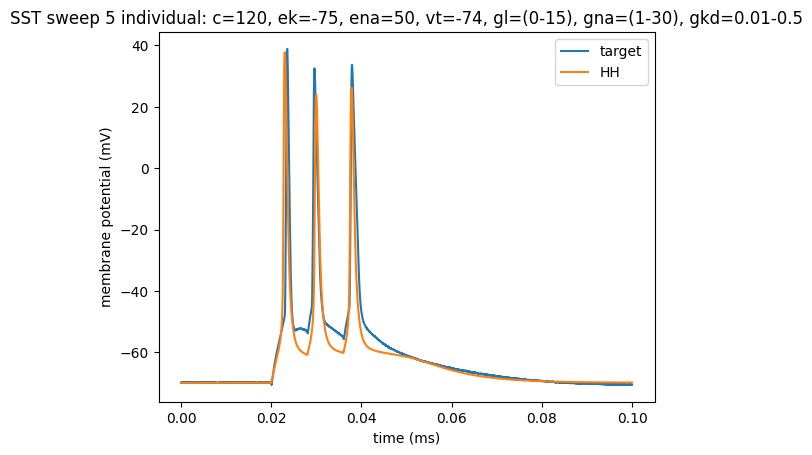

In [310]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_16[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.5')

In [ ]:
sst_hh_s5_17 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 22.6

first fit:
Round 0: Best parameters g_kd=0.47561629 uS, g_na=5.36468019 uS, gl=10.85102118 nS (error: 146.55591808 mV^2)
Round 1: Best parameters g_kd=0.47561629 uS, g_na=5.36468019 uS, gl=10.85102118 nS (error: 146.55591808 mV^2)
Round 2: Best parameters g_kd=0.38720053 uS, g_na=3.51856717 uS, gl=10.68103095 nS (error: 123.47516942 mV^2)
Round 3: Best parameters g_kd=0.35805328 uS, g_na=3.57045287 uS, gl=12.90229313 nS (error: 114.121131 mV^2)
Round 4: Best parameters g_kd=0.35805328 uS, g_na=3.57045287 uS, gl=12.90229313 nS (error: 114.121131 mV^2)
Round 5: Best parameters g_kd=0.31979982 uS, g_na=2.43930089 uS, gl=10.16356309 nS (error: 92.36539236 mV^2)
Round 6: Best parameters g_kd=306.42813074 nS, g_na=2.4141291 uS, gl=11.70064197 nS (error: 88.75548684 mV^2)
Round 7: Best parameters g_kd=306.42813074 nS, g_na=2.4141291 uS, gl=11.70064197 nS (error: 88.75548684 mV^2)
Round 8: Best parameters g_kd=306.42813074 nS, g_na=2.4141291 uS, gl=11.70064197 nS (error: 88.75548684 mV^2)
Roun

# BEST HH SWEEP 5 INDIVIDUAL? 17

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

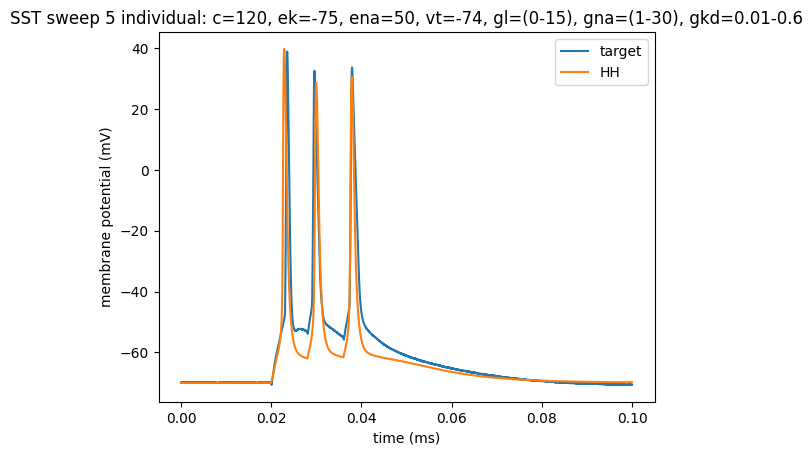

In [312]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

In [ ]:
sst_hh_s5_17_1 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 23.3

first fit:
Round 0: Best parameters g_kd=0.48488835 uS, g_na=4.98764169 uS, gl=12.1965202 nS (error: 161.91261354 mV^2)
Round 1: Best parameters g_kd=0.44145621 uS, g_na=4.41075081 uS, gl=9.03862111 nS (error: 137.13075586 mV^2)
Round 2: Best parameters g_kd=0.42392965 uS, g_na=4.10608989 uS, gl=9.92311033 nS (error: 133.48268227 mV^2)
Round 3: Best parameters g_kd=0.36561257 uS, g_na=3.6272377 uS, gl=13.27707198 nS (error: 118.83058275 mV^2)
Round 4: Best parameters g_kd=0.33738965 uS, g_na=2.67419122 uS, gl=12.00002246 nS (error: 109.40019363 mV^2)
Round 5: Best parameters g_kd=305.01557013 nS, g_na=2.24606578 uS, gl=14.02550649 nS (error: 103.21311779 mV^2)
Round 6: Best parameters g_kd=281.16489307 nS, g_na=2.25292805 uS, gl=14.25657854 nS (error: 81.71400165 mV^2)
Round 7: Best parameters g_kd=277.68632319 nS, g_na=2.21876913 uS, gl=14.35148436 nS (error: 79.65933956 mV^2)
Round 8: Best parameters g_kd=277.68632319 nS, g_na=2.21876913 uS, gl=14.35148436 nS (error: 79.65933956 mV^2

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

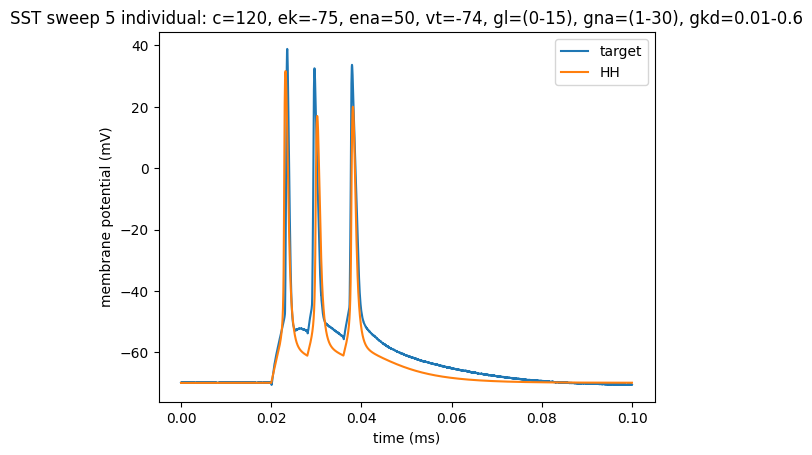

In [314]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17_1[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

In [ ]:
sst_hh_s5_17_2 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 23.3

first fit:
Round 0: Best parameters g_kd=0.46332993 uS, g_na=6.82461873 uS, gl=11.3867291 nS (error: 920.63078713 mV^2)
Round 1: Best parameters g_kd=0.39255695 uS, g_na=4.23278069 uS, gl=13.75722328 nS (error: 127.91041321 mV^2)
Round 2: Best parameters g_kd=0.39255695 uS, g_na=4.23278069 uS, gl=13.75722328 nS (error: 127.91041321 mV^2)
Round 3: Best parameters g_kd=0.35273759 uS, g_na=3.58974954 uS, gl=14.09000536 nS (error: 114.01226086 mV^2)
Round 4: Best parameters g_kd=303.12266393 nS, g_na=2.72739784 uS, gl=13.86864592 nS (error: 91.06604153 mV^2)
Round 5: Best parameters g_kd=262.93605778 nS, g_na=2.09334245 uS, gl=14.14088972 nS (error: 68.9587538 mV^2)
Round 6: Best parameters g_kd=262.93605778 nS, g_na=2.09334245 uS, gl=14.14088972 nS (error: 68.9587538 mV^2)
Round 7: Best parameters g_kd=262.93605778 nS, g_na=2.09334245 uS, gl=14.14088972 nS (error: 68.9587538 mV^2)
Round 8: Best parameters g_kd=262.93605778 nS, g_na=2.09334245 uS, gl=14.14088972 nS (error: 68.9587538 mV^2)

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

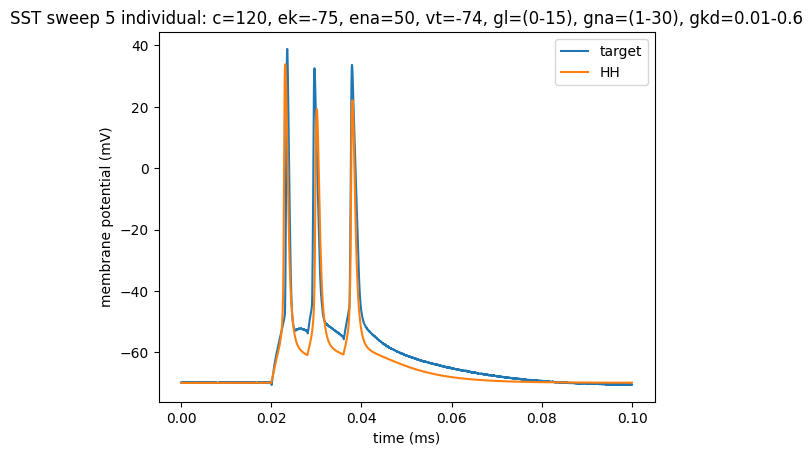

In [323]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17_2[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

In [ ]:
sst_hh_s5_17_3 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 23s

first fit:
Round 0: Best parameters g_kd=0.51652696 uS, g_na=4.96635203 uS, gl=7.02029414 nS (error: 155.76751562 mV^2)
Round 1: Best parameters g_kd=0.44023906 uS, g_na=4.06315832 uS, gl=8.97416335 nS (error: 138.34117671 mV^2)
Round 2: Best parameters g_kd=0.39252212 uS, g_na=4.01274101 uS, gl=11.96285901 nS (error: 125.32538618 mV^2)
Round 3: Best parameters g_kd=0.3220242 uS, g_na=2.5069741 uS, gl=10.87114702 nS (error: 95.2812065 mV^2)
Round 4: Best parameters g_kd=0.3220242 uS, g_na=2.5069741 uS, gl=10.87114702 nS (error: 95.2812065 mV^2)
Round 5: Best parameters g_kd=0.3220242 uS, g_na=2.5069741 uS, gl=10.87114702 nS (error: 95.2812065 mV^2)
Round 6: Best parameters g_kd=0.3220242 uS, g_na=2.5069741 uS, gl=10.87114702 nS (error: 95.2812065 mV^2)
Round 7: Best parameters g_kd=294.76522515 nS, g_na=2.36777046 uS, gl=12.13384316 nS (error: 83.32888511 mV^2)
Round 8: Best parameters g_kd=280.555033 nS, g_na=1.97713245 uS, gl=12.7740184 nS (error: 78.3888319 mV^2)
Round 9: Best param

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

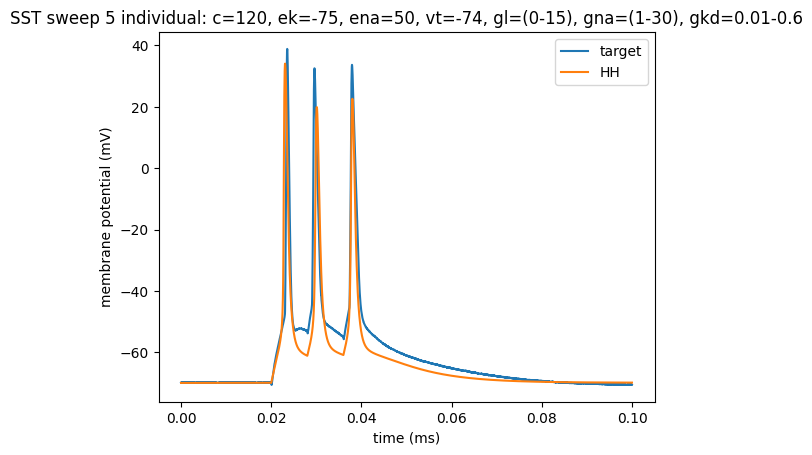

In [324]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17_3[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

In [ ]:
sst_hh_s5_17_4 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 23.4s

first fit:
Round 0: Best parameters g_kd=0.48364916 uS, g_na=4.98892213 uS, gl=5.92562742 nS (error: 420.75615512 mV^2)
Round 1: Best parameters g_kd=0.43389217 uS, g_na=3.60241072 uS, gl=7.86924927 nS (error: 136.23714133 mV^2)
Round 2: Best parameters g_kd=0.37891967 uS, g_na=2.55349549 uS, gl=9.88537769 nS (error: 128.33007977 mV^2)
Round 3: Best parameters g_kd=0.38564766 uS, g_na=1.99389769 uS, gl=8.22434816 nS (error: 126.41609604 mV^2)
Round 4: Best parameters g_kd=0.32090624 uS, g_na=2.44921747 uS, gl=12.65765709 nS (error: 104.19632831 mV^2)
Round 5: Best parameters g_kd=275.59903458 nS, g_na=2.04544431 uS, gl=13.96241609 nS (error: 79.21560332 mV^2)
Round 6: Best parameters g_kd=272.97340958 nS, g_na=2.09813848 uS, gl=13.58665346 nS (error: 74.09717164 mV^2)
Round 7: Best parameters g_kd=250.93382837 nS, g_na=1.8240451 uS, gl=14.2096416 nS (error: 62.0396423 mV^2)
Round 8: Best parameters g_kd=243.44218691 nS, g_na=1.79508102 uS, gl=14.00578176 nS (error: 57.44443822 mV^2)
Ro

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

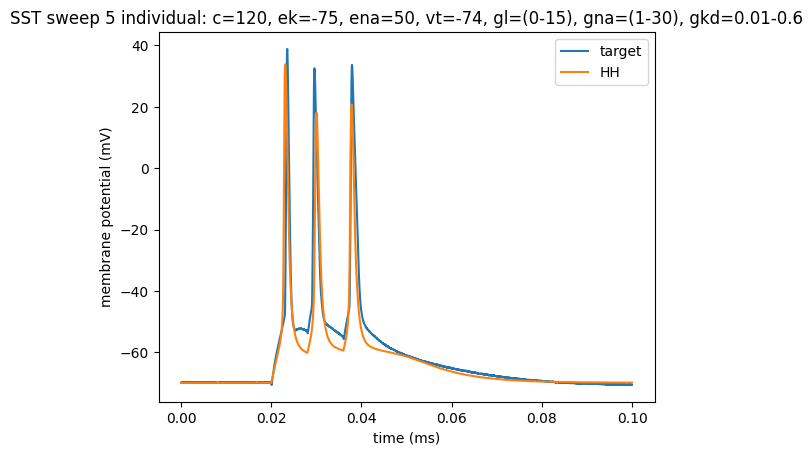

In [325]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17_4[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

In [ ]:
sst_hh_s5_17_5 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 22.4s

first fit:
Round 0: Best parameters g_kd=0.48232381 uS, g_na=5.80078939 uS, gl=9.84717289 nS (error: 225.58122877 mV^2)
Round 1: Best parameters g_kd=0.38109469 uS, g_na=3.76632192 uS, gl=12.44593999 nS (error: 123.26270242 mV^2)
Round 2: Best parameters g_kd=0.38109469 uS, g_na=3.76632192 uS, gl=12.44593999 nS (error: 123.26270242 mV^2)
Round 3: Best parameters g_kd=0.31986112 uS, g_na=2.51365409 uS, gl=10.90664464 nS (error: 94.0849436 mV^2)
Round 4: Best parameters g_kd=0.31986112 uS, g_na=2.51365409 uS, gl=10.90664464 nS (error: 94.0849436 mV^2)
Round 5: Best parameters g_kd=0.31986112 uS, g_na=2.51365409 uS, gl=10.90664464 nS (error: 94.0849436 mV^2)
Round 6: Best parameters g_kd=0.31986112 uS, g_na=2.51365409 uS, gl=10.90664464 nS (error: 94.0849436 mV^2)
Round 7: Best parameters g_kd=314.86776207 nS, g_na=2.60963112 uS, gl=11.28000922 nS (error: 92.63169758 mV^2)
Round 8: Best parameters g_kd=291.48039311 nS, g_na=2.13410477 uS, gl=10.95400392 nS (error: 78.6426072 mV^2)
Round 9

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

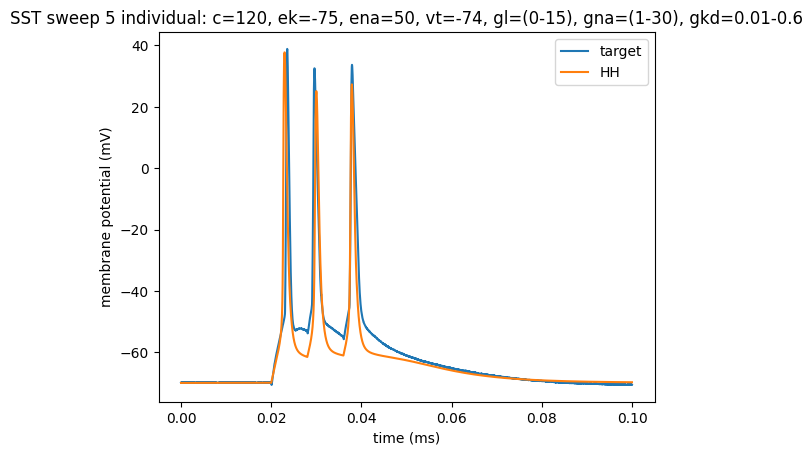

In [326]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17_5[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

In [ ]:
sst_hh_s5_17_6 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 21.6s

first fit:
Round 0: Best parameters g_kd=246.92026852 nS, g_na=4.95732989 uS, gl=12.63366018 nS (error: 975.8953535 mV^2)
Round 1: Best parameters g_kd=0.42258501 uS, g_na=3.88139192 uS, gl=11.14424043 nS (error: 140.9533537 mV^2)
Round 2: Best parameters g_kd=0.36504288 uS, g_na=3.63757922 uS, gl=13.15803787 nS (error: 117.89788162 mV^2)
Round 3: Best parameters g_kd=0.33158185 uS, g_na=3.02398855 uS, gl=12.19052583 nS (error: 102.17153033 mV^2)
Round 4: Best parameters g_kd=289.64954389 nS, g_na=2.16695945 uS, gl=12.56674979 nS (error: 82.22793963 mV^2)
Round 5: Best parameters g_kd=289.64954389 nS, g_na=2.16695945 uS, gl=12.56674979 nS (error: 82.22793963 mV^2)
Round 6: Best parameters g_kd=281.20548614 nS, g_na=2.06525445 uS, gl=11.74463092 nS (error: 74.36766066 mV^2)
Round 7: Best parameters g_kd=281.20548614 nS, g_na=2.06525445 uS, gl=11.74463092 nS (error: 74.36766066 mV^2)
Round 8: Best parameters g_kd=250.64345556 nS, g_na=1.62912199 uS, gl=12.63158569 nS (error: 57.89214586 

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

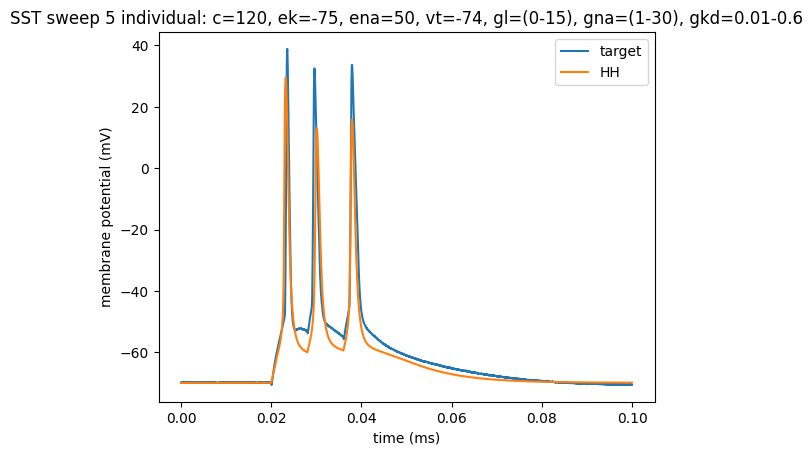

In [327]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17_6[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

In [ ]:
sst_hh_s5_17_7 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 22s

first fit:
Round 0: Best parameters g_kd=0.50368199 uS, g_na=7.00930104 uS, gl=12.99214966 nS (error: 259.90107191 mV^2)
Round 1: Best parameters g_kd=0.42842897 uS, g_na=4.7883434 uS, gl=11.44678596 nS (error: 135.42312102 mV^2)
Round 2: Best parameters g_kd=0.37954098 uS, g_na=2.74059664 uS, gl=7.47876269 nS (error: 115.15456512 mV^2)
Round 3: Best parameters g_kd=312.44909413 nS, g_na=2.35466425 uS, gl=13.1671858 nS (error: 101.99245302 mV^2)
Round 4: Best parameters g_kd=312.44909413 nS, g_na=2.35466425 uS, gl=13.1671858 nS (error: 101.99245302 mV^2)
Round 5: Best parameters g_kd=283.41945917 nS, g_na=2.22933062 uS, gl=12.89802515 nS (error: 78.39137338 mV^2)
Round 6: Best parameters g_kd=283.41945917 nS, g_na=2.22933062 uS, gl=12.89802515 nS (error: 78.39137338 mV^2)
Round 7: Best parameters g_kd=283.41945917 nS, g_na=2.22933062 uS, gl=12.89802515 nS (error: 78.39137338 mV^2)
Round 8: Best parameters g_kd=261.11571471 nS, g_na=1.90620344 uS, gl=13.46043055 nS (error: 66.38069545 m

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

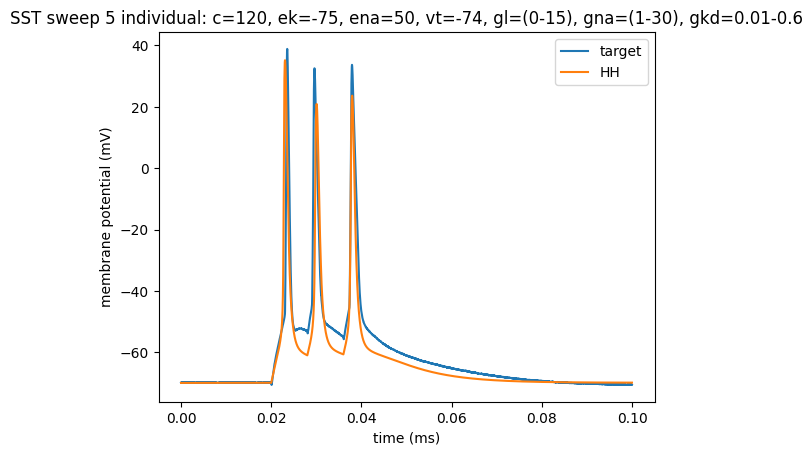

In [328]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17_7[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

In [ ]:
sst_hh_s5_17_8 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 21.7s

first fit:
Round 0: Best parameters g_kd=0.49519671 uS, g_na=5.46634252 uS, gl=12.42215361 nS (error: 159.84465367 mV^2)
Round 1: Best parameters g_kd=0.44036141 uS, g_na=4.84246821 uS, gl=10.45021858 nS (error: 139.34440545 mV^2)
Round 2: Best parameters g_kd=0.35502269 uS, g_na=2.4664803 uS, gl=11.99782603 nS (error: 126.13146259 mV^2)
Round 3: Best parameters g_kd=316.14296219 nS, g_na=2.77016297 uS, gl=11.99782603 nS (error: 94.89627223 mV^2)
Round 4: Best parameters g_kd=316.14296219 nS, g_na=2.77016297 uS, gl=11.99782603 nS (error: 94.89627223 mV^2)
Round 5: Best parameters g_kd=307.45861167 nS, g_na=2.30568726 uS, gl=12.47826707 nS (error: 94.42179308 mV^2)
Round 6: Best parameters g_kd=307.45861167 nS, g_na=2.30568726 uS, gl=12.47826707 nS (error: 94.42179308 mV^2)
Round 7: Best parameters g_kd=284.02654743 nS, g_na=2.19809683 uS, gl=11.96565404 nS (error: 77.16040775 mV^2)
Round 8: Best parameters g_kd=279.83745024 nS, g_na=2.00003331 uS, gl=12.41137599 nS (error: 75.71693244 

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

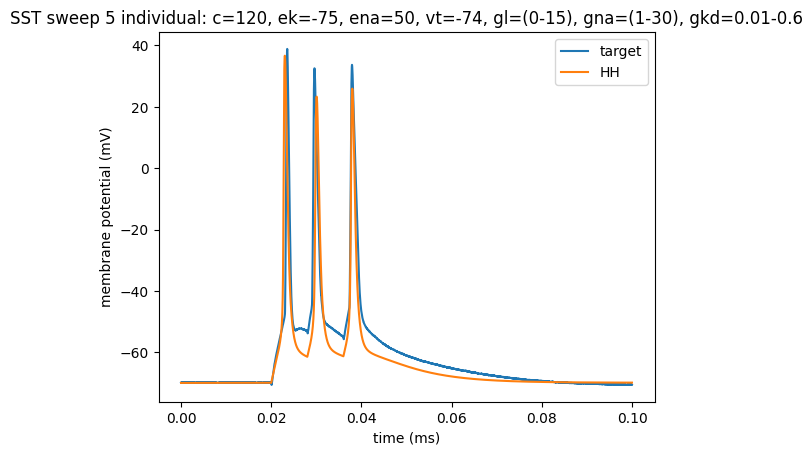

In [329]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17_8[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

In [ ]:
sst_hh_s5_17_9 = run_hh(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, ek=-75, ena=50, vt=-70, \
                           glmin=0, glmax=15, gnamin=1, gnamax=30, gkdmin=0.01, gkdmax=0.6)

# tt: 21.8s

first fit:
Round 0: Best parameters g_kd=0.39863939 uS, g_na=4.66309638 uS, gl=4.67294026 nS (error: 886.42571582 mV^2)
Round 1: Best parameters g_kd=0.51375935 uS, g_na=4.74452767 uS, gl=6.52407358 nS (error: 155.56793416 mV^2)
Round 2: Best parameters g_kd=0.50280337 uS, g_na=5.43149098 uS, gl=9.14598329 nS (error: 152.06780602 mV^2)
Round 3: Best parameters g_kd=0.45650056 uS, g_na=4.23946259 uS, gl=8.09970563 nS (error: 141.26508821 mV^2)
Round 4: Best parameters g_kd=0.31679093 uS, g_na=2.76484982 uS, gl=12.85757057 nS (error: 96.53443759 mV^2)
Round 5: Best parameters g_kd=0.31679093 uS, g_na=2.76484982 uS, gl=12.85757057 nS (error: 96.53443759 mV^2)
Round 6: Best parameters g_kd=303.84626063 nS, g_na=2.49039515 uS, gl=13.06548034 nS (error: 91.28688781 mV^2)
Round 7: Best parameters g_kd=0.31746157 uS, g_na=1.98965765 uS, gl=8.64871832 nS (error: 86.63768432 mV^2)
Round 8: Best parameters g_kd=263.53996848 nS, g_na=1.8713942 uS, gl=13.15751827 nS (error: 67.38641816 mV^2)
Round 

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

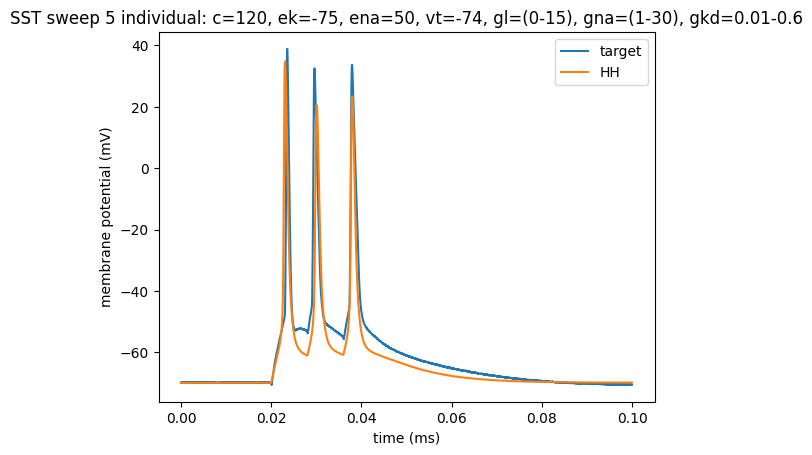

In [330]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_hh_s5_17_9[0]*1000, d2_title='HH')
title('SST sweep 5 individual: c=120, ek=-75, ena=50, vt=-74, gl=(0-15), gna=(1-30), gkd=0.01-0.6')

***

# LIF SWEEP 5 INDIVIDUAL

***

In [ ]:
sst_lif_s5_0 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# 7s

first fit:
Round 0: Best parameters R=208.44588622 Mohm, tau=13.39327272 ms (error: 132.0402589 mV^2)
Round 1: Best parameters R=191.74976249 Mohm, tau=12.01181239 ms (error: 127.95550663 mV^2)
Round 2: Best parameters R=190.5384011 Mohm, tau=11.62592936 ms (error: 126.49906223 mV^2)
Round 3: Best parameters R=186.58051348 Mohm, tau=11.06678745 ms (error: 124.69090054 mV^2)
Round 4: Best parameters R=186.58051348 Mohm, tau=11.06678745 ms (error: 124.69090054 mV^2)
Round 5: Best parameters R=184.67494432 Mohm, tau=11.03252255 ms (error: 124.61368882 mV^2)
Round 6: Best parameters R=184.21539129 Mohm, tau=10.83899816 ms (error: 124.10327826 mV^2)
Round 7: Best parameters R=182.67359488 Mohm, tau=10.62895103 ms (error: 123.33548281 mV^2)
Round 8: Best parameters R=182.67359488 Mohm, tau=10.53790052 ms (error: 123.25951474 mV^2)
Round 9: Best parameters R=182.67359488 Mohm, tau=10.53790052 ms (error: 123.25951474 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

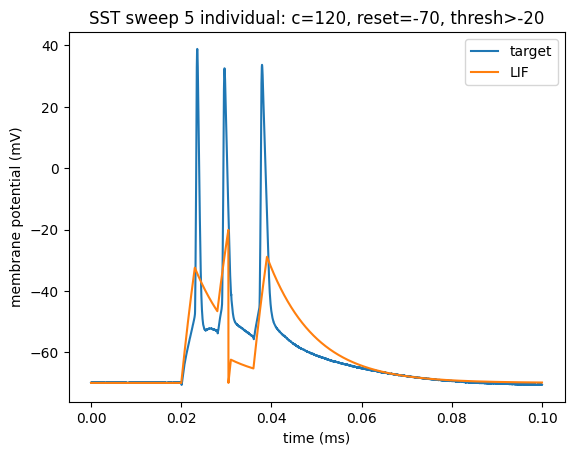

In [332]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_1 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 7.5s

first fit:
Round 0: Best parameters R=214.07424997 Mohm, tau=13.86009138 ms (error: 133.63502381 mV^2)
Round 1: Best parameters R=198.77746583 Mohm, tau=12.65461194 ms (error: 129.80509427 mV^2)
Round 2: Best parameters R=198.46548807 Mohm, tau=12.28663502 ms (error: 128.58064277 mV^2)
Round 3: Best parameters R=193.19687689 Mohm, tau=11.63257072 ms (error: 126.59573923 mV^2)
Round 4: Best parameters R=193.19687689 Mohm, tau=11.63257072 ms (error: 126.59573923 mV^2)
Round 5: Best parameters R=190.13318582 Mohm, tau=11.14916274 ms (error: 125.41798642 mV^2)
Round 6: Best parameters R=185.51562701 Mohm, tau=11.11429826 ms (error: 124.86735575 mV^2)
Round 7: Best parameters R=185.51562701 Mohm, tau=11.09734755 ms (error: 124.78690374 mV^2)
Round 8: Best parameters R=185.51562701 Mohm, tau=11.09734755 ms (error: 124.78690374 mV^2)
Round 9: Best parameters R=183.92763869 Mohm, tau=10.98353703 ms (error: 124.50260491 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

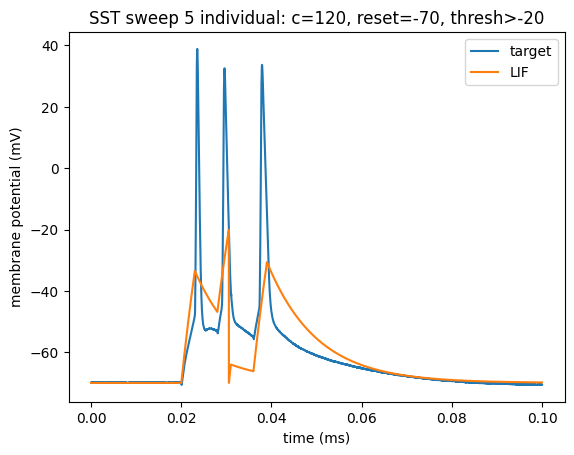

In [343]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_1[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_2 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 7.6s

first fit:
Round 0: Best parameters R=208.09459034 Mohm, tau=13.70903998 ms (error: 133.17105362 mV^2)
Round 1: Best parameters R=197.51423799 Mohm, tau=12.42541186 ms (error: 129.01512511 mV^2)
Round 2: Best parameters R=195.81305925 Mohm, tau=11.16463638 ms (error: 127.67583788 mV^2)
Round 3: Best parameters R=185.85312608 Mohm, tau=10.7362801 ms (error: 124.00996457 mV^2)
Round 4: Best parameters R=185.85312608 Mohm, tau=10.7362801 ms (error: 124.00996457 mV^2)
Round 5: Best parameters R=178.8639505 Mohm, tau=10.50503884 ms (error: 123.06221679 mV^2)
Round 6: Best parameters R=179.8669314 Mohm, tau=10.37070871 ms (error: 122.52724626 mV^2)
Round 7: Best parameters R=179.8669314 Mohm, tau=10.37070871 ms (error: 122.52724626 mV^2)
Round 8: Best parameters R=178.30559815 Mohm, tau=10.27855963 ms (error: 122.33384477 mV^2)
Round 9: Best parameters R=178.8639505 Mohm, tau=10.21875336 ms (error: 122.10450684 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

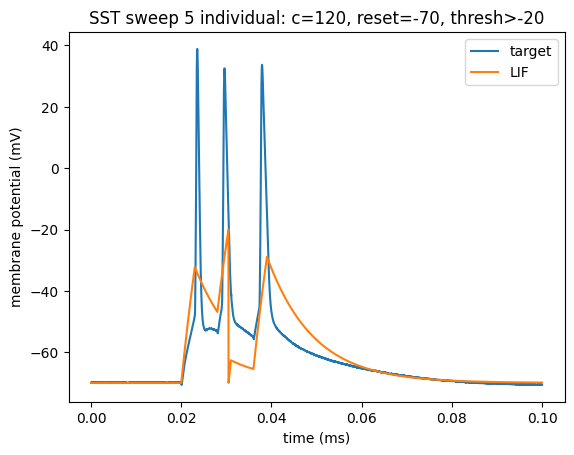

In [344]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_2[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_3 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 6.8s

first fit:
Round 0: Best parameters R=207.32169722 Mohm, tau=13.67499585 ms (error: 133.16310736 mV^2)
Round 1: Best parameters R=201.76350125 Mohm, tau=13.14899832 ms (error: 131.65931775 mV^2)
Round 2: Best parameters R=181.58312316 Mohm, tau=11.16273088 ms (error: 125.9129004 mV^2)
Round 3: Best parameters R=181.58312316 Mohm, tau=11.16273088 ms (error: 125.9129004 mV^2)
Round 4: Best parameters R=189.04953606 Mohm, tau=11.01191528 ms (error: 125.1765788 mV^2)
Round 5: Best parameters R=184.7679789 Mohm, tau=11.00661426 ms (error: 124.56127429 mV^2)
Round 6: Best parameters R=184.7679789 Mohm, tau=11.00661426 ms (error: 124.56127429 mV^2)
Round 7: Best parameters R=181.39160876 Mohm, tau=10.72195938 ms (error: 123.67087434 mV^2)
Round 8: Best parameters R=182.58732143 Mohm, tau=10.6152825 ms (error: 123.44586475 mV^2)
Round 9: Best parameters R=181.24988855 Mohm, tau=10.58598905 ms (error: 123.21557647 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

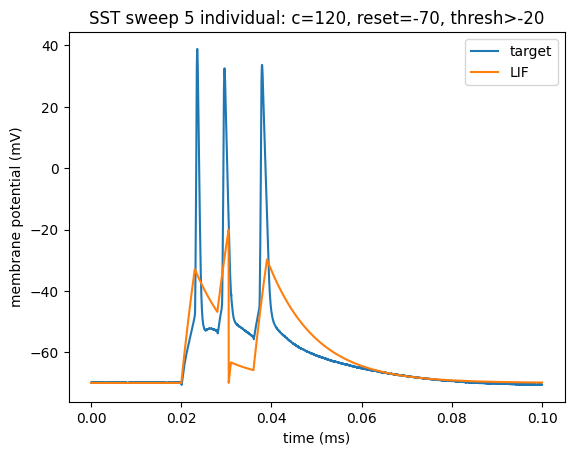

In [345]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_3[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_4 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 7.5s

first fit:
Round 0: Best parameters R=205.06186455 Mohm, tau=13.67796463 ms (error: 133.77510903 mV^2)
Round 1: Best parameters R=190.66896861 Mohm, tau=12.00302592 ms (error: 128.19038889 mV^2)
Round 2: Best parameters R=190.66896861 Mohm, tau=11.61862499 ms (error: 126.44700979 mV^2)
Round 3: Best parameters R=189.84307882 Mohm, tau=11.49526073 ms (error: 126.09621231 mV^2)
Round 4: Best parameters R=184.36394377 Mohm, tau=11.10096966 ms (error: 124.93586797 mV^2)
Round 5: Best parameters R=184.19263617 Mohm, tau=10.85151837 ms (error: 124.02629406 mV^2)
Round 6: Best parameters R=184.04183207 Mohm, tau=10.67560353 ms (error: 123.7227363 mV^2)
Round 7: Best parameters R=182.22163047 Mohm, tau=10.59862345 ms (error: 123.25821163 mV^2)
Round 8: Best parameters R=178.13976117 Mohm, tau=10.38464847 ms (error: 122.66798707 mV^2)
Round 9: Best parameters R=178.13976117 Mohm, tau=10.27391305 ms (error: 122.21503891 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

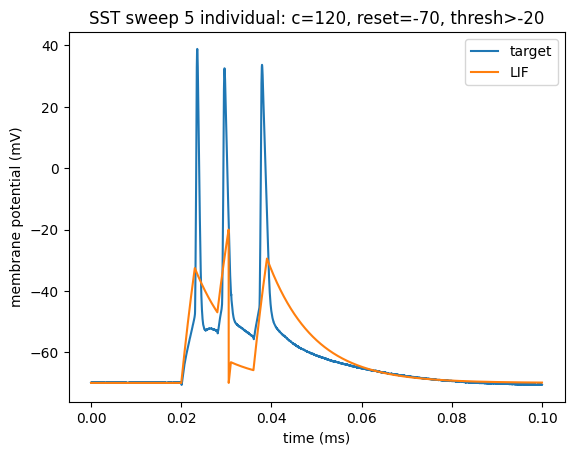

In [346]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_4[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_5 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 7.2

first fit:
Round 0: Best parameters R=200.32832603 Mohm, tau=12.93403603 ms (error: 130.86511899 mV^2)
Round 1: Best parameters R=190.23771008 Mohm, tau=11.49082165 ms (error: 126.02243253 mV^2)
Round 2: Best parameters R=188.29155654 Mohm, tau=11.27783201 ms (error: 125.43220941 mV^2)
Round 3: Best parameters R=188.29155654 Mohm, tau=11.27783201 ms (error: 125.43220941 mV^2)
Round 4: Best parameters R=182.92853427 Mohm, tau=10.85051161 ms (error: 124.02969274 mV^2)
Round 5: Best parameters R=182.92853427 Mohm, tau=10.85051161 ms (error: 124.02969274 mV^2)
Round 6: Best parameters R=182.27826298 Mohm, tau=10.53780882 ms (error: 123.12404522 mV^2)
Round 7: Best parameters R=182.27826298 Mohm, tau=10.53780882 ms (error: 123.12404522 mV^2)
Round 8: Best parameters R=180.2530118 Mohm, tau=10.33606948 ms (error: 122.64111006 mV^2)
Round 9: Best parameters R=177.3510363 Mohm, tau=10.25898897 ms (error: 122.18698144 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

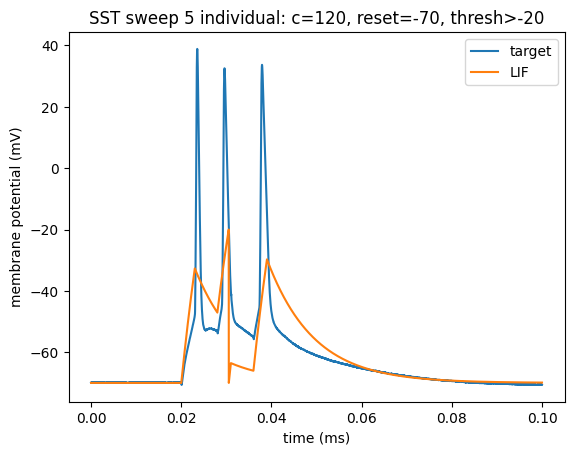

In [347]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_5[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_6 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 7.1s

first fit:
Round 0: Best parameters R=209.95420093 Mohm, tau=13.88402306 ms (error: 133.68338379 mV^2)
Round 1: Best parameters R=205.6466805 Mohm, tau=12.74019421 ms (error: 130.47398578 mV^2)
Round 2: Best parameters R=194.60483817 Mohm, tau=12.04338206 ms (error: 127.75639052 mV^2)
Round 3: Best parameters R=187.75171666 Mohm, tau=11.56972301 ms (error: 126.54767442 mV^2)
Round 4: Best parameters R=182.32893938 Mohm, tau=11.19680903 ms (error: 125.92216812 mV^2)
Round 5: Best parameters R=182.32893938 Mohm, tau=10.76273179 ms (error: 123.78698243 mV^2)
Round 6: Best parameters R=179.01803209 Mohm, tau=10.66362779 ms (error: 123.76415576 mV^2)
Round 7: Best parameters R=179.86872142 Mohm, tau=10.44589232 ms (error: 122.76324705 mV^2)
Round 8: Best parameters R=179.86872142 Mohm, tau=10.32648436 ms (error: 122.46966055 mV^2)
Round 9: Best parameters R=178.8660878 Mohm, tau=10.23903452 ms (error: 122.20216588 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

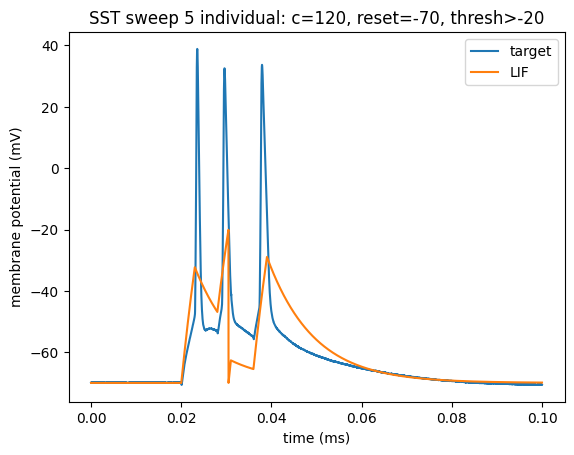

In [349]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_6[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_7 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 7.3s

first fit:
Round 0: Best parameters R=203.67360458 Mohm, tau=12.16106125 ms (error: 129.8080622 mV^2)
Round 1: Best parameters R=185.30880399 Mohm, tau=11.47846335 ms (error: 126.6956167 mV^2)
Round 2: Best parameters R=186.12805348 Mohm, tau=11.26993697 ms (error: 125.44560574 mV^2)
Round 3: Best parameters R=186.12805348 Mohm, tau=11.26993697 ms (error: 125.44560574 mV^2)
Round 4: Best parameters R=180.52549424 Mohm, tau=10.87591916 ms (error: 124.52904852 mV^2)
Round 5: Best parameters R=184.77375833 Mohm, tau=10.66440944 ms (error: 123.80354193 mV^2)
Round 6: Best parameters R=184.70804312 Mohm, tau=10.51806369 ms (error: 123.67386836 mV^2)
Round 7: Best parameters R=180.52549424 Mohm, tau=10.35122822 ms (error: 122.67428404 mV^2)
Round 8: Best parameters R=177.47554578 Mohm, tau=10.36382384 ms (error: 122.62094797 mV^2)
Round 9: Best parameters R=175.52958167 Mohm, tau=10.25399464 ms (error: 122.41743468 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

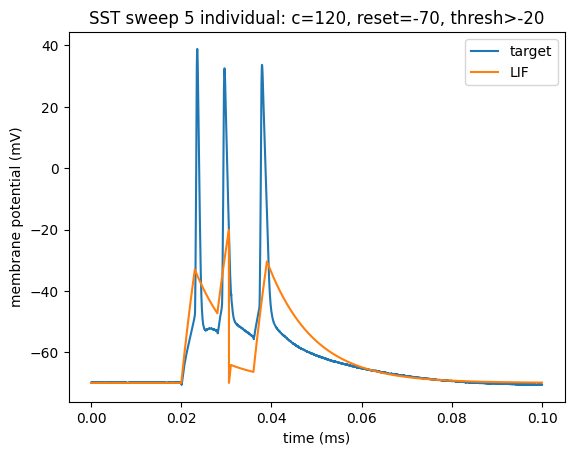

In [350]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_7[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_8 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 7.3s

first fit:
Round 0: Best parameters R=215.22653791 Mohm, tau=13.30186712 ms (error: 133.68414677 mV^2)
Round 1: Best parameters R=198.77957397 Mohm, tau=12.10297599 ms (error: 128.30757946 mV^2)
Round 2: Best parameters R=182.35885056 Mohm, tau=11.39750771 ms (error: 127.31198699 mV^2)
Round 3: Best parameters R=188.08594281 Mohm, tau=11.21118613 ms (error: 125.15322093 mV^2)
Round 4: Best parameters R=182.82294198 Mohm, tau=10.80385157 ms (error: 123.90367542 mV^2)
Round 5: Best parameters R=182.82294198 Mohm, tau=10.80385157 ms (error: 123.90367542 mV^2)
Round 6: Best parameters R=177.15467789 Mohm, tau=10.53348378 ms (error: 123.50509707 mV^2)
Round 7: Best parameters R=180.6833189 Mohm, tau=10.46330786 ms (error: 122.84545733 mV^2)
Round 8: Best parameters R=179.61403656 Mohm, tau=10.3631281 ms (error: 122.53082689 mV^2)
Round 9: Best parameters R=179.61403656 Mohm, tau=10.29573928 ms (error: 122.36056745 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

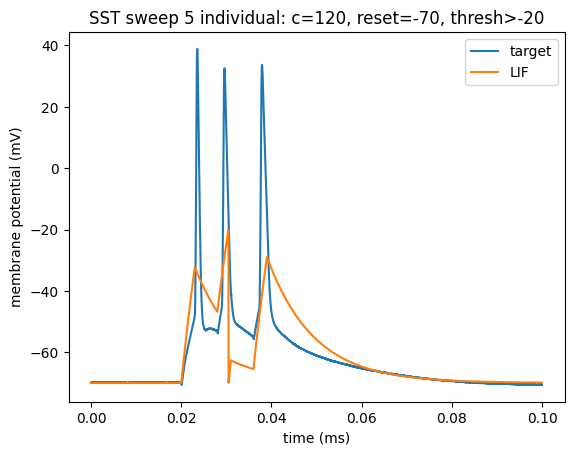

In [351]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_8[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_9 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 7.3s

first fit:
Round 0: Best parameters R=220.65882425 Mohm, tau=13.14783989 ms (error: 138.17345361 mV^2)
Round 1: Best parameters R=188.53185816 Mohm, tau=11.41993598 ms (error: 125.83851521 mV^2)
Round 2: Best parameters R=186.24590439 Mohm, tau=11.27884733 ms (error: 125.46841005 mV^2)
Round 3: Best parameters R=186.10089583 Mohm, tau=11.19017649 ms (error: 125.13397871 mV^2)
Round 4: Best parameters R=186.17646386 Mohm, tau=11.1313892 ms (error: 124.9342319 mV^2)
Round 5: Best parameters R=186.10089583 Mohm, tau=10.78549632 ms (error: 124.20488294 mV^2)
Round 6: Best parameters R=178.67996871 Mohm, tau=10.6794629 ms (error: 123.92224051 mV^2)
Round 7: Best parameters R=180.64892662 Mohm, tau=10.62497483 ms (error: 123.40357862 mV^2)
Round 8: Best parameters R=180.64892662 Mohm, tau=10.62497483 ms (error: 123.40357862 mV^2)
Round 9: Best parameters R=180.64892662 Mohm, tau=10.62497483 ms (error: 123.40357862 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

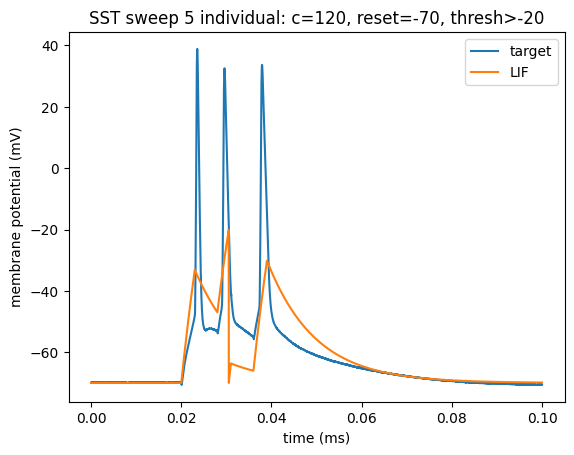

In [353]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_9[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

In [ ]:
sst_lif_s5_0_10 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-20*mV')

# tt: 7.4s

first fit:
Round 0: Best parameters R=222.20651375 Mohm, tau=14.26250839 ms (error: 135.81073589 mV^2)
Round 1: Best parameters R=208.88539988 Mohm, tau=13.03940697 ms (error: 131.50492474 mV^2)
Round 2: Best parameters R=202.62872609 Mohm, tau=12.60401417 ms (error: 129.69921304 mV^2)
Round 3: Best parameters R=193.23599998 Mohm, tau=12.0432015 ms (error: 127.86343175 mV^2)
Round 4: Best parameters R=194.43185384 Mohm, tau=11.67903602 ms (error: 126.86965308 mV^2)
Round 5: Best parameters R=190.9603371 Mohm, tau=11.36266722 ms (error: 125.82844976 mV^2)
Round 6: Best parameters R=190.01685695 Mohm, tau=11.11749089 ms (error: 125.29027072 mV^2)
Round 7: Best parameters R=185.85686137 Mohm, tau=10.73421173 ms (error: 124.00027058 mV^2)
Round 8: Best parameters R=182.57608052 Mohm, tau=10.59837971 ms (error: 123.36766078 mV^2)
Round 9: Best parameters R=182.4869482 Mohm, tau=10.55174776 ms (error: 123.16060392 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-20')

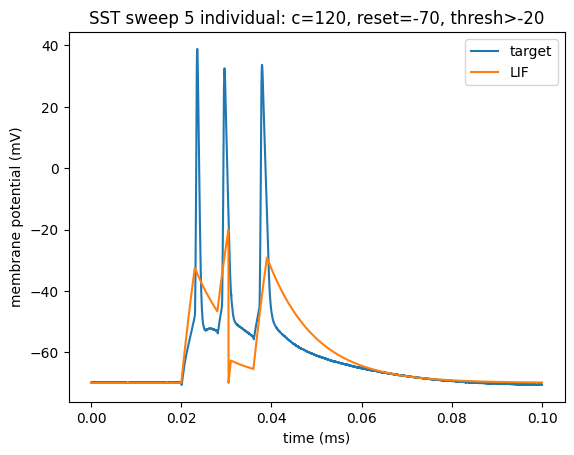

In [354]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_0_10[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-20')

No variance.  No dynamics in mathematical equations.  Interesting that quite different from fast spikes collection.  And individual result worse... interesting that same trace from fast spike hasn't been replicated on same params...

In [ ]:
sst_lif_s5_1 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>-0*mV')

# tt: 4s

first fit:
Round 0: Best parameters R=154.68592127 Mohm, tau=12.64338978 ms (error: 151.54090969 mV^2)
Round 1: Best parameters R=122.77850277 Mohm, tau=11.27997686 ms (error: 134.03839665 mV^2)
Round 2: Best parameters R=125.1605504 Mohm, tau=10.89007517 ms (error: 132.1404182 mV^2)
Round 3: Best parameters R=121.6660759 Mohm, tau=10.6342899 ms (error: 130.84789069 mV^2)
Round 4: Best parameters R=123.32218043 Mohm, tau=10.49885799 ms (error: 130.15980514 mV^2)
Round 5: Best parameters R=123.32218043 Mohm, tau=10.35560349 ms (error: 129.45411876 mV^2)
Round 6: Best parameters R=122.06615129 Mohm, tau=10.2738619 ms (error: 129.03505797 mV^2)
Round 7: Best parameters R=120.44545635 Mohm, tau=10.21148499 ms (error: 128.76708379 mV^2)
Round 8: Best parameters R=124.28134978 Mohm, tau=10.1378535 ms (error: 128.43703893 mV^2)
Round 9: Best parameters R=120.96858017 Mohm, tau=10.11460419 ms (error: 128.25632864 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>-0')

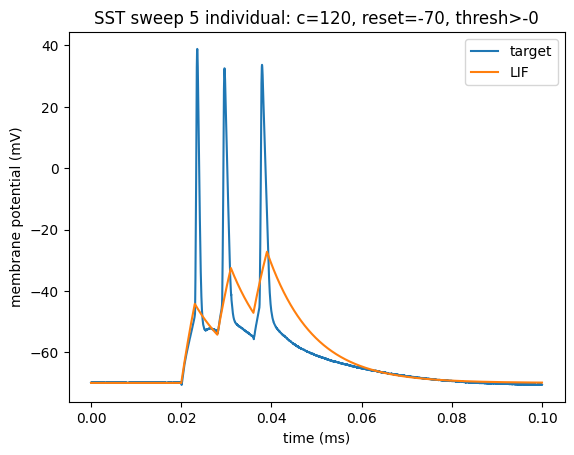

In [356]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_1[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>-0')

In [ ]:
sst_lif_s5_2 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV')

# tt: 4.1s

first fit:
Round 0: Best parameters R=143.23510277 Mohm, tau=13.12707415 ms (error: 146.45025546 mV^2)
Round 1: Best parameters R=127.42334593 Mohm, tau=11.88520836 ms (error: 137.06116109 mV^2)
Round 2: Best parameters R=112.62937613 Mohm, tau=10.9323115 ms (error: 134.00127261 mV^2)
Round 3: Best parameters R=121.03331184 Mohm, tau=10.74952572 ms (error: 131.45974316 mV^2)
Round 4: Best parameters R=118.33778857 Mohm, tau=10.5150567 ms (error: 130.51519287 mV^2)
Round 5: Best parameters R=121.26251681 Mohm, tau=10.37789964 ms (error: 129.57272389 mV^2)
Round 6: Best parameters R=118.46809026 Mohm, tau=10.25182025 ms (error: 129.13582626 mV^2)
Round 7: Best parameters R=121.26586383 Mohm, tau=10.20823153 ms (error: 128.71907135 mV^2)
Round 8: Best parameters R=120.34718364 Mohm, tau=10.14295696 ms (error: 128.42454785 mV^2)
Round 9: Best parameters R=122.63311819 Mohm, tau=10.10543164 ms (error: 128.20343939 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20')

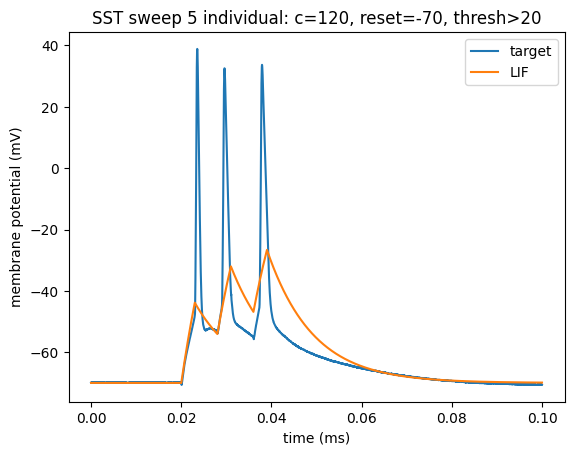

In [358]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_2[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20')

In [ ]:
sst_lif_s5_3 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 5.1s

first fit:
Round 0: Best parameters R=124.54481074 Mohm, tau=91.16362865 ms (error: 278.77020922 mV^2)
Round 1: Best parameters R=223.02159009 Mohm, tau=62.33323101 ms (error: 259.15153878 mV^2)
Round 2: Best parameters R=125.67762413 Mohm, tau=38.3060887 ms (error: 225.15577469 mV^2)
Round 3: Best parameters R=143.4589655 Mohm, tau=23.90052298 ms (error: 186.44455408 mV^2)
Round 4: Best parameters R=138.06599128 Mohm, tau=15.8988723 ms (error: 156.29658711 mV^2)
Round 5: Best parameters R=125.66635317 Mohm, tau=12.04885532 ms (error: 137.77908901 mV^2)
Round 6: Best parameters R=112.85717218 Mohm, tau=9.10151671 ms (error: 124.00162569 mV^2)
Round 7: Best parameters R=105.70422208 Mohm, tau=6.72801389 ms (error: 113.01345789 mV^2)
Round 8: Best parameters R=105.70422208 Mohm, tau=5.41689791 ms (error: 106.28188939 mV^2)
Round 9: Best parameters R=100.02844811 Mohm, tau=3.94906189 ms (error: 101.48076319 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

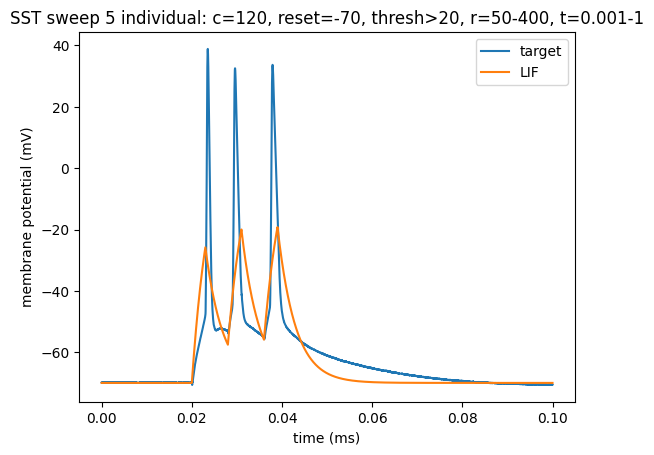

In [360]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_3_1 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 4.3

first fit:
Round 0: Best parameters R=225.54409952 Mohm, tau=146.60970781 ms (error: 279.99793242 mV^2)
Round 1: Best parameters R=192.89156064 Mohm, tau=82.85763872 ms (error: 262.21676082 mV^2)
Round 2: Best parameters R=173.45023843 Mohm, tau=57.54586109 ms (error: 246.25248841 mV^2)
Round 3: Best parameters R=151.03154673 Mohm, tau=39.94225475 ms (error: 224.37492418 mV^2)
Round 4: Best parameters R=170.87631417 Mohm, tau=25.55120402 ms (error: 199.2953858 mV^2)
Round 5: Best parameters R=131.70636686 Mohm, tau=20.33771862 ms (error: 173.90112811 mV^2)
Round 6: Best parameters R=97.26336467 Mohm, tau=11.40828505 ms (error: 145.0131804 mV^2)
Round 7: Best parameters R=127.3295977 Mohm, tau=9.27965899 ms (error: 124.85586541 mV^2)
Round 8: Best parameters R=122.95175384 Mohm, tau=7.27553739 ms (error: 115.09940028 mV^2)
Round 9: Best parameters R=114.66729022 Mohm, tau=5.91097357 ms (error: 108.02509175 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

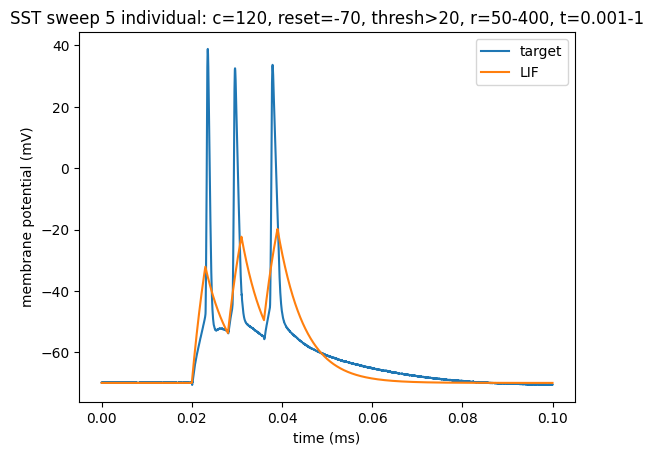

In [362]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3_1[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_3_2 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 4.1s


first fit:
Round 0: Best parameters R=221.06120566 Mohm, tau=122.46848802 ms (error: 274.56697481 mV^2)
Round 1: Best parameters R=190.2451596 Mohm, tau=72.70497265 ms (error: 257.22027132 mV^2)
Round 2: Best parameters R=178.68332086 Mohm, tau=40.09990477 ms (error: 228.6311543 mV^2)
Round 3: Best parameters R=140.17939883 Mohm, tau=35.4782211 ms (error: 216.5651847 mV^2)
Round 4: Best parameters R=130.42276797 Mohm, tau=31.40327106 ms (error: 208.71210675 mV^2)
Round 5: Best parameters R=130.42276797 Mohm, tau=31.40327106 ms (error: 208.71210675 mV^2)
Round 6: Best parameters R=120.91611618 Mohm, tau=29.13950598 ms (error: 205.26045985 mV^2)
Round 7: Best parameters R=120.91611618 Mohm, tau=29.13950598 ms (error: 205.26045985 mV^2)
Round 8: Best parameters R=120.91611618 Mohm, tau=29.13950598 ms (error: 205.26045985 mV^2)
Round 9: Best parameters R=120.91611618 Mohm, tau=29.13950598 ms (error: 205.26045985 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

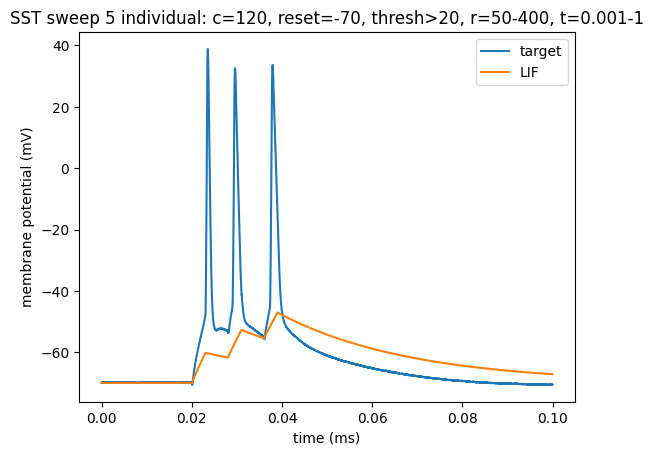

In [366]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3_2[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_3_3 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 4.1s


first fit:
Round 0: Best parameters R=162.92547909 Mohm, tau=117.93830363 ms (error: 280.49774025 mV^2)
Round 1: Best parameters R=173.14757618 Mohm, tau=60.76587022 ms (error: 248.89620998 mV^2)
Round 2: Best parameters R=145.95215476 Mohm, tau=42.48190676 ms (error: 228.78292933 mV^2)
Round 3: Best parameters R=130.25445478 Mohm, tau=30.16792437 ms (error: 205.57661066 mV^2)
Round 4: Best parameters R=145.32642733 Mohm, tau=21.27332999 ms (error: 177.98232992 mV^2)
Round 5: Best parameters R=109.24095638 Mohm, tau=16.18365946 ms (error: 162.34859058 mV^2)
Round 6: Best parameters R=112.18488302 Mohm, tau=11.26846472 ms (error: 135.96262738 mV^2)
Round 7: Best parameters R=98.33510247 Mohm, tau=9.01838916 ms (error: 130.21517583 mV^2)
Round 8: Best parameters R=113.69420327 Mohm, tau=6.45896002 ms (error: 110.35153998 mV^2)
Round 9: Best parameters R=113.69420327 Mohm, tau=4.83800971 ms (error: 104.19003017 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

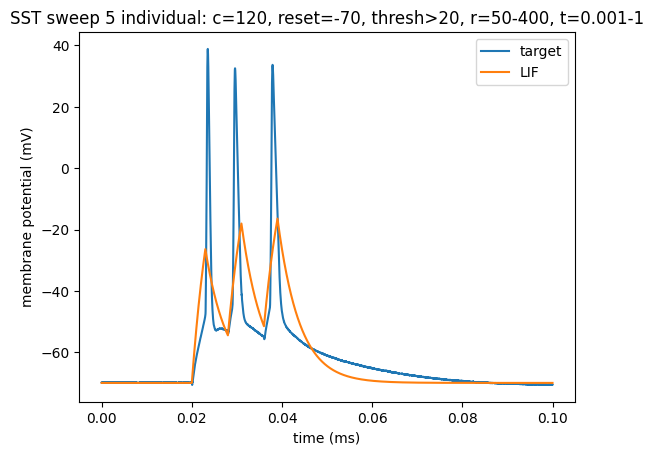

In [367]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3_3[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_3_4 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 3.9s


first fit:
Round 0: Best parameters R=227.75812363 Mohm, tau=124.70965445 ms (error: 274.83765488 mV^2)
Round 1: Best parameters R=174.3814072 Mohm, tau=70.18962867 ms (error: 255.66101914 mV^2)
Round 2: Best parameters R=141.65585587 Mohm, tau=37.76733562 ms (error: 220.97579964 mV^2)
Round 3: Best parameters R=115.41571747 Mohm, tau=25.36198154 ms (error: 195.91093783 mV^2)
Round 4: Best parameters R=142.43622993 Mohm, tau=19.37478276 ms (error: 170.71923862 mV^2)
Round 5: Best parameters R=98.91482304 Mohm, tau=12.71878972 ms (error: 151.06368393 mV^2)
Round 6: Best parameters R=95.74792764 Mohm, tau=8.32955812 ms (error: 127.9167455 mV^2)
Round 7: Best parameters R=120.90525503 Mohm, tau=6.87426094 ms (error: 112.96457881 mV^2)
Round 8: Best parameters R=105.68718783 Mohm, tau=4.98096228 ms (error: 104.34426102 mV^2)
Round 9: Best parameters R=103.05946292 Mohm, tau=4.4171311 ms (error: 102.51323178 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

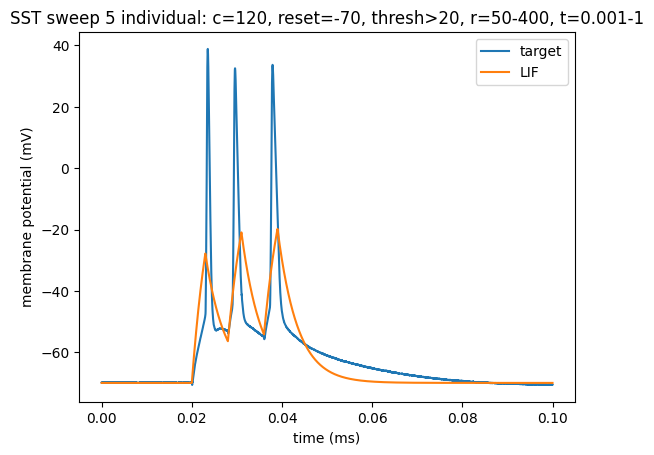

In [368]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3_4[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_3_5 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 4.1s

first fit:
Round 0: Best parameters R=205.04988901 Mohm, tau=139.83510097 ms (error: 280.48944153 mV^2)
Round 1: Best parameters R=160.42872133 Mohm, tau=80.16226867 ms (error: 263.31977726 mV^2)
Round 2: Best parameters R=141.06576912 Mohm, tau=56.23807142 ms (error: 247.47495168 mV^2)
Round 3: Best parameters R=138.43150928 Mohm, tau=33.40759579 ms (error: 212.25046265 mV^2)
Round 4: Best parameters R=138.43150928 Mohm, tau=22.81549039 ms (error: 182.63742627 mV^2)
Round 5: Best parameters R=138.76312458 Mohm, tau=16.54751917 ms (error: 159.08970329 mV^2)
Round 6: Best parameters R=130.70249034 Mohm, tau=12.35136288 ms (error: 139.57547864 mV^2)
Round 7: Best parameters R=127.33057883 Mohm, tau=8.82991807 ms (error: 122.85914484 mV^2)
Round 8: Best parameters R=119.49298814 Mohm, tau=6.84065873 ms (error: 112.54363494 mV^2)
Round 9: Best parameters R=111.4532888 Mohm, tau=5.25821487 ms (error: 105.22154379 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

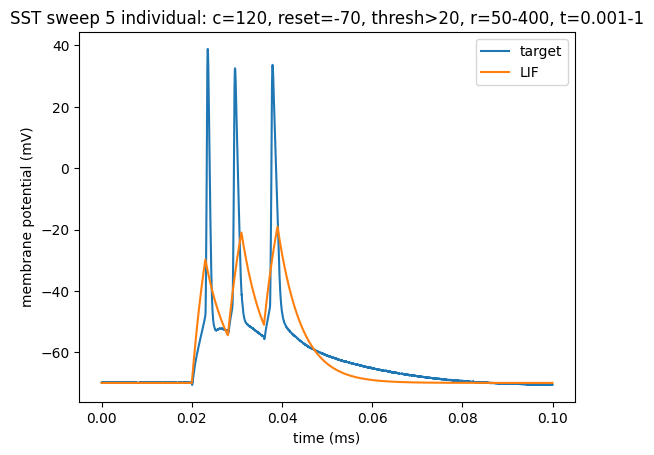

In [374]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3_5[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_3_6 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 4.6s

first fit:
Round 0: Best parameters R=297.52740101 Mohm, tau=135.47087661 ms (error: 279.0167535 mV^2)
Round 1: Best parameters R=216.20883417 Mohm, tau=70.80358614 ms (error: 259.70220745 mV^2)
Round 2: Best parameters R=109.57275038 Mohm, tau=45.36770146 ms (error: 243.57738627 mV^2)
Round 3: Best parameters R=148.79413425 Mohm, tau=36.95347142 ms (error: 219.03964791 mV^2)
Round 4: Best parameters R=125.98614233 Mohm, tau=26.61543172 ms (error: 196.43536501 mV^2)
Round 5: Best parameters R=118.35598106 Mohm, tau=18.01638868 ms (error: 166.972418 mV^2)
Round 6: Best parameters R=116.0622288 Mohm, tau=12.27084376 ms (error: 140.10514144 mV^2)
Round 7: Best parameters R=120.77295232 Mohm, tau=10.08764684 ms (error: 128.12672368 mV^2)
Round 8: Best parameters R=99.21614537 Mohm, tau=6.56235319 ms (error: 114.92049296 mV^2)
Round 9: Best parameters R=107.50536947 Mohm, tau=5.42631804 ms (error: 106.03726029 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

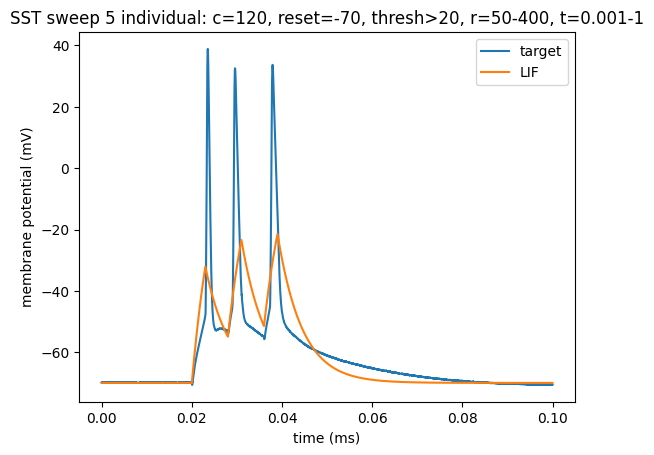

In [375]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3_6[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_3_7 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 4.1s

first fit:
Round 0: Best parameters R=258.4448874 Mohm, tau=155.79009741 ms (error: 279.78859721 mV^2)
Round 1: Best parameters R=231.72332077 Mohm, tau=68.49330959 ms (error: 263.38211491 mV^2)
Round 2: Best parameters R=166.94010856 Mohm, tau=57.48045452 ms (error: 246.06788831 mV^2)
Round 3: Best parameters R=158.28378704 Mohm, tau=39.0878787 ms (error: 223.20120618 mV^2)
Round 4: Best parameters R=134.79009629 Mohm, tau=26.84833526 ms (error: 195.62062086 mV^2)
Round 5: Best parameters R=111.09363169 Mohm, tau=19.57992629 ms (error: 176.51874526 mV^2)
Round 6: Best parameters R=136.90215575 Mohm, tau=14.67418445 ms (error: 150.91570274 mV^2)
Round 7: Best parameters R=125.85318482 Mohm, tau=11.69116435 ms (error: 136.05203859 mV^2)
Round 8: Best parameters R=101.92566392 Mohm, tau=8.51829521 ms (error: 124.98503419 mV^2)
Round 9: Best parameters R=111.86046606 Mohm, tau=6.41470242 ms (error: 110.20441006 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

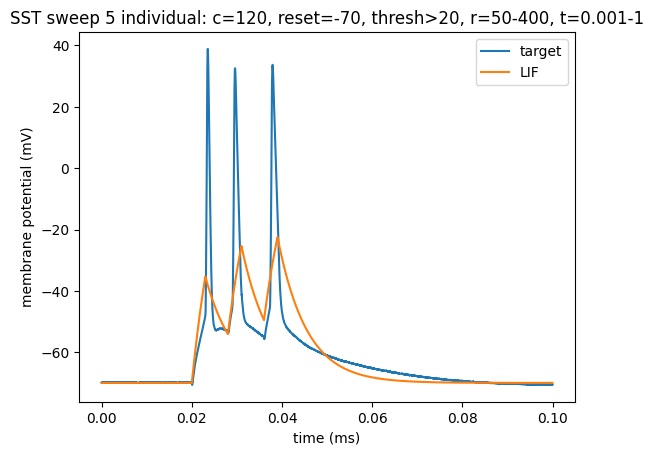

In [376]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3_7[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_3_8 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 4s

first fit:
Round 0: Best parameters R=287.474774 Mohm, tau=162.1394664 ms (error: 280.23777535 mV^2)
Round 1: Best parameters R=229.52663349 Mohm, tau=103.72308508 ms (error: 269.97789914 mV^2)
Round 2: Best parameters R=156.46832274 Mohm, tau=63.51038489 ms (error: 252.01394329 mV^2)
Round 3: Best parameters R=203.63796327 Mohm, tau=42.3327845 ms (error: 241.39761192 mV^2)
Round 4: Best parameters R=131.24504016 Mohm, tau=33.0777332 ms (error: 212.60034252 mV^2)
Round 5: Best parameters R=124.10128222 Mohm, tau=20.95315281 ms (error: 177.42477659 mV^2)
Round 6: Best parameters R=141.5158182 Mohm, tau=17.0244476 ms (error: 161.52999228 mV^2)
Round 7: Best parameters R=102.77255629 Mohm, tau=10.88426182 ms (error: 138.25058737 mV^2)
Round 8: Best parameters R=116.13055838 Mohm, tau=9.21191014 ms (error: 124.00270296 mV^2)
Round 9: Best parameters R=116.76563186 Mohm, tau=6.6645015 ms (error: 111.4186238 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

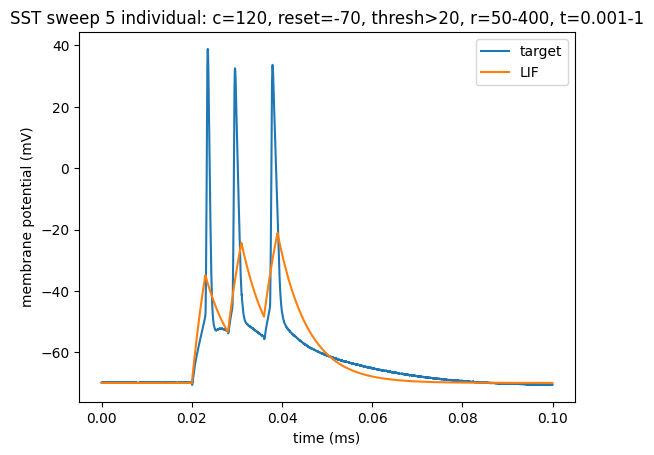

In [377]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3_8[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_3_9 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 3.9s

first fit:
Round 0: Best parameters R=310.62053066 Mohm, tau=151.45200503 ms (error: 280.4996824 mV^2)
Round 1: Best parameters R=189.81992886 Mohm, tau=73.95014073 ms (error: 257.8593906 mV^2)
Round 2: Best parameters R=213.19122717 Mohm, tau=40.67384134 ms (error: 246.00762297 mV^2)
Round 3: Best parameters R=121.3183683 Mohm, tau=31.906204 ms (error: 212.41006459 mV^2)
Round 4: Best parameters R=133.05975162 Mohm, tau=21.8488084 ms (error: 179.41316826 mV^2)
Round 5: Best parameters R=135.84018159 Mohm, tau=15.56197144 ms (error: 154.53723991 mV^2)
Round 6: Best parameters R=103.01600648 Mohm, tau=11.09185472 ms (error: 139.28130239 mV^2)
Round 7: Best parameters R=110.85977278 Mohm, tau=8.06221817 ms (error: 118.83599305 mV^2)
Round 8: Best parameters R=115.12922989 Mohm, tau=6.130435 ms (error: 108.9725117 mV^2)
Round 9: Best parameters R=100.48510559 Mohm, tau=5.11061878 ms (error: 106.27926622 mV^2)


Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

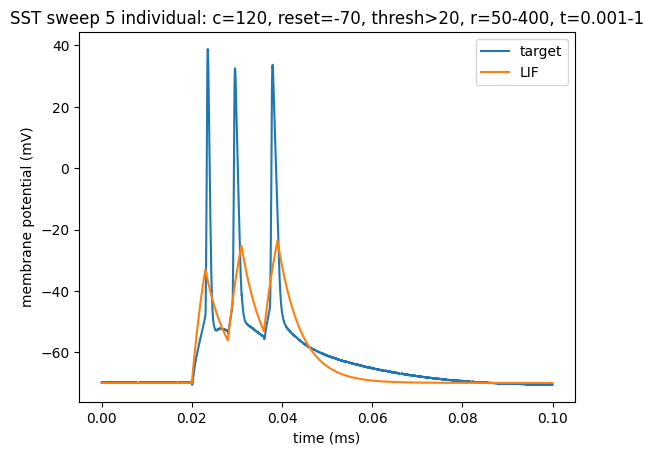

In [379]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_3_9[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

Text(0.5, 1.0, 'Comparison between low vs high error for LIF, sweep 5')

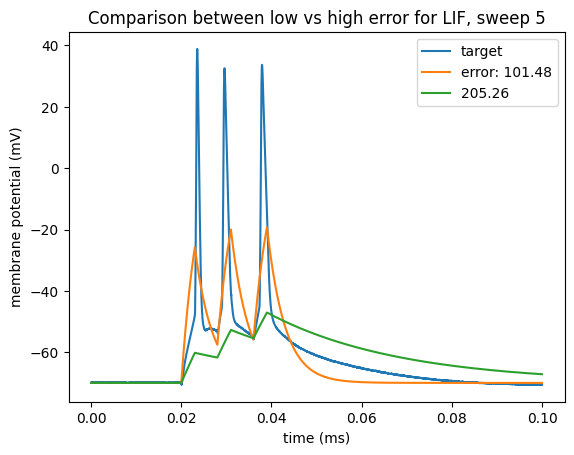

In [380]:
create_comparison_together_three(reshaped_sst_sweep5_out[0], sst_lif_s5_3[0]*1000, sst_lif_s5_3_2[0]*1000,\
                                 d2_title='error: 101.48', d3_title='205.26')
title('Comparison between low vs high error for LIF, sweep 5')

In [381]:
sst_lif_s5_4 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

first fit:
Round 0: Best parameters R=269.98439897 Mohm, tau=137.51342032 ms (error: 277.15746168 mV^2)
Round 1: Best parameters R=203.66921199 Mohm, tau=96.00917813 ms (error: 267.32323056 mV^2)
Round 2: Best parameters R=185.05719376 Mohm, tau=53.7810785 ms (error: 244.34597041 mV^2)
Round 3: Best parameters R=145.99910318 Mohm, tau=41.26070222 ms (error: 226.79883305 mV^2)
Round 4: Best parameters R=147.68729035 Mohm, tau=30.52745523 ms (error: 205.20166355 mV^2)
Round 5: Best parameters R=122.78587788 Mohm, tau=22.76255074 ms (error: 184.47732126 mV^2)
Round 6: Best parameters R=134.31270752 Mohm, tau=16.98190451 ms (error: 160.39833779 mV^2)
Round 7: Best parameters R=130.58674448 Mohm, tau=14.95368685 ms (error: 151.4520475 mV^2)
Round 8: Best parameters R=110.95012106 Mohm, tau=11.58705951 ms (error: 138.12986362 mV^2)
Round 9: Best parameters R=101.45326011 Mohm, tau=8.26170918 ms (error: 123.73305339 mV^2)
Round 10: Best parameters R=107.93119458 Mohm, tau=6.68511791 ms (error

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

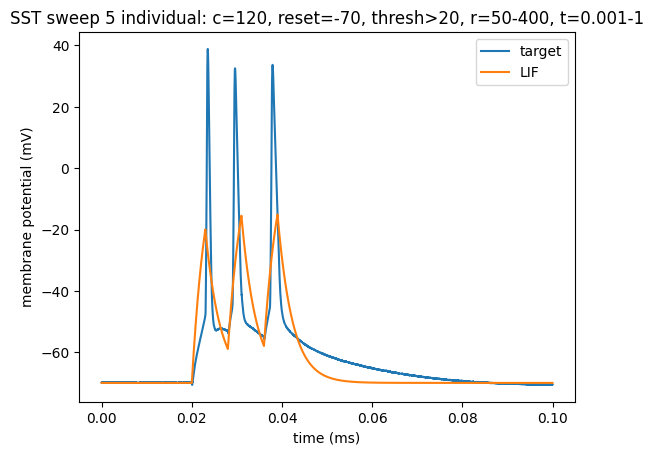

In [391]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_4_1 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 7.4s

first fit:
Round 0: Best parameters R=195.74401473 Mohm, tau=138.92509779 ms (error: 281.4817873 mV^2)
Round 1: Best parameters R=200.81354088 Mohm, tau=89.31727866 ms (error: 264.8941968 mV^2)
Round 2: Best parameters R=134.56111731 Mohm, tau=47.33913197 ms (error: 237.87790409 mV^2)
Round 3: Best parameters R=170.46936918 Mohm, tau=33.89568985 ms (error: 216.51015905 mV^2)
Round 4: Best parameters R=119.23264976 Mohm, tau=23.22777459 ms (error: 187.21993567 mV^2)
Round 5: Best parameters R=142.47133748 Mohm, tau=19.23203907 ms (error: 170.1945081 mV^2)
Round 6: Best parameters R=122.64122203 Mohm, tau=13.80958574 ms (error: 146.52788476 mV^2)
Round 7: Best parameters R=116.5347004 Mohm, tau=10.3218411 ms (error: 129.77944355 mV^2)
Round 8: Best parameters R=110.16960127 Mohm, tau=7.9531919 ms (error: 118.41230521 mV^2)
Round 9: Best parameters R=107.51154566 Mohm, tau=6.14484033 ms (error: 109.46762265 mV^2)
Round 10: Best parameters R=107.83022819 Mohm, tau=5.13108282 ms (error: 104

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

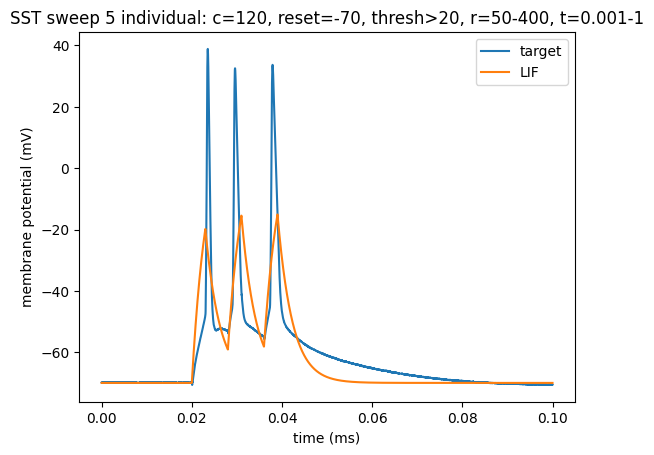

In [392]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_1[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_4_2 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 7.5s

first fit:
Round 0: Best parameters R=214.88318654 Mohm, tau=150.44896478 ms (error: 281.95674779 mV^2)
Round 1: Best parameters R=200.58375835 Mohm, tau=95.33322351 ms (error: 267.14753747 mV^2)
Round 2: Best parameters R=189.98751766 Mohm, tau=50.97680207 ms (error: 243.1012175 mV^2)
Round 3: Best parameters R=144.46328515 Mohm, tau=37.16362621 ms (error: 219.59203718 mV^2)
Round 4: Best parameters R=128.69324996 Mohm, tau=26.38699489 ms (error: 195.1420971 mV^2)
Round 5: Best parameters R=140.64261247 Mohm, tau=18.38772353 ms (error: 166.70260047 mV^2)
Round 6: Best parameters R=140.64261247 Mohm, tau=13.20234128 ms (error: 145.73754804 mV^2)
Round 7: Best parameters R=124.58709481 Mohm, tau=10.10007155 ms (error: 128.27737132 mV^2)
Round 8: Best parameters R=110.19880324 Mohm, tau=8.41564225 ms (error: 120.93382284 mV^2)
Round 9: Best parameters R=107.3038475 Mohm, tau=6.29688072 ms (error: 110.28537364 mV^2)
Round 10: Best parameters R=97.2115213 Mohm, tau=4.91549244 ms (error: 10

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

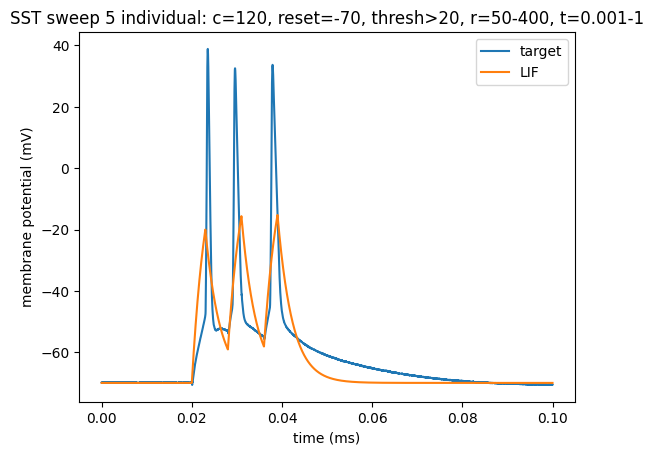

In [393]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_2[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_4_3 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 7.4s

first fit:
Round 0: Best parameters R=196.88927478 Mohm, tau=105.64616709 ms (error: 271.02925263 mV^2)
Round 1: Best parameters R=196.88927478 Mohm, tau=79.15578431 ms (error: 260.62694949 mV^2)
Round 2: Best parameters R=152.28955976 Mohm, tau=46.40414946 ms (error: 234.11886484 mV^2)
Round 3: Best parameters R=153.50199713 Mohm, tau=37.07835051 ms (error: 219.36929795 mV^2)
Round 4: Best parameters R=134.12429627 Mohm, tau=28.02784724 ms (error: 199.10891216 mV^2)
Round 5: Best parameters R=120.17444538 Mohm, tau=18.18272537 ms (error: 167.15148902 mV^2)
Round 6: Best parameters R=111.0209026 Mohm, tau=13.41267977 ms (error: 147.76670471 mV^2)
Round 7: Best parameters R=119.47693766 Mohm, tau=10.30265397 ms (error: 129.29775872 mV^2)
Round 8: Best parameters R=114.11612613 Mohm, tau=8.30241794 ms (error: 119.50637007 mV^2)
Round 9: Best parameters R=119.46074896 Mohm, tau=7.14763079 ms (error: 113.86265487 mV^2)
Round 10: Best parameters R=108.87675608 Mohm, tau=5.25851905 ms (error

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

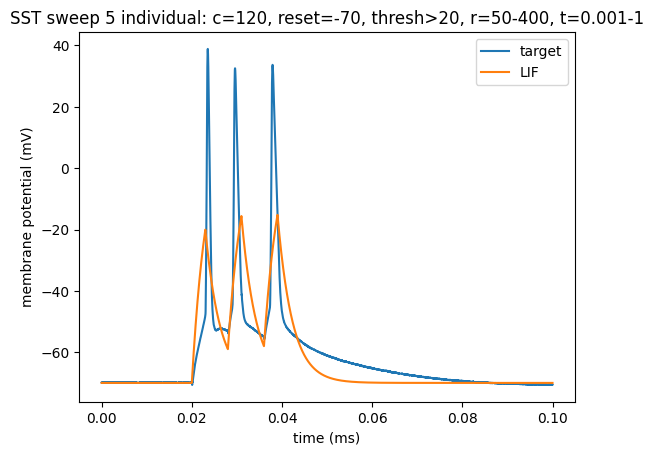

In [394]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_3[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_4_4 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 7.7s

first fit:
Round 0: Best parameters R=236.41726231 Mohm, tau=147.52452095 ms (error: 279.36951312 mV^2)
Round 1: Best parameters R=212.8551208 Mohm, tau=87.86806183 ms (error: 264.77247659 mV^2)
Round 2: Best parameters R=178.09405695 Mohm, tau=76.93548107 ms (error: 259.59591413 mV^2)
Round 3: Best parameters R=122.31608148 Mohm, tau=52.47099123 ms (error: 248.21034266 mV^2)
Round 4: Best parameters R=124.7879547 Mohm, tau=35.72326461 ms (error: 220.14278097 mV^2)
Round 5: Best parameters R=128.56204241 Mohm, tau=24.87684555 ms (error: 190.39419444 mV^2)
Round 6: Best parameters R=136.65969261 Mohm, tau=21.95139896 ms (error: 179.63937756 mV^2)
Round 7: Best parameters R=141.19390382 Mohm, tau=15.86537286 ms (error: 156.8164415 mV^2)
Round 8: Best parameters R=133.43370343 Mohm, tau=10.86101482 ms (error: 133.45282933 mV^2)
Round 9: Best parameters R=131.11878179 Mohm, tau=8.68217272 ms (error: 123.47917531 mV^2)
Round 10: Best parameters R=119.48479874 Mohm, tau=6.39500214 ms (error:

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

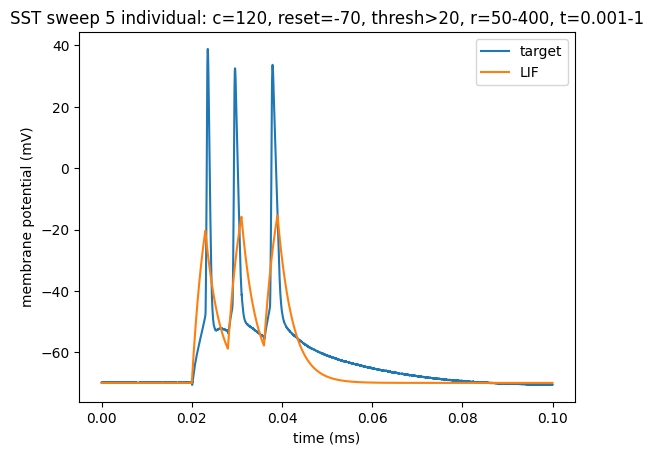

In [395]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_4[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_4_5 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 7.5s

first fit:
Round 0: Best parameters R=290.98626258 Mohm, tau=192.8894748 ms (error: 283.77468527 mV^2)
Round 1: Best parameters R=212.37539297 Mohm, tau=124.14789495 ms (error: 275.5440514 mV^2)
Round 2: Best parameters R=230.79089119 Mohm, tau=77.88369514 ms (error: 264.70169853 mV^2)
Round 3: Best parameters R=169.79299223 Mohm, tau=55.16431129 ms (error: 243.9771743 mV^2)
Round 4: Best parameters R=134.49978416 Mohm, tau=39.7794088 ms (error: 225.782844 mV^2)
Round 5: Best parameters R=114.67346637 Mohm, tau=25.55804173 ms (error: 196.85666873 mV^2)
Round 6: Best parameters R=122.52835955 Mohm, tau=19.7061118 ms (error: 172.88663882 mV^2)
Round 7: Best parameters R=133.61094583 Mohm, tau=16.01841668 ms (error: 156.27133533 mV^2)
Round 8: Best parameters R=115.42699273 Mohm, tau=10.47279381 ms (error: 130.79394617 mV^2)
Round 9: Best parameters R=127.51802658 Mohm, tau=8.02841427 ms (error: 119.52846051 mV^2)
Round 10: Best parameters R=122.39440172 Mohm, tau=5.92623719 ms (error: 11

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

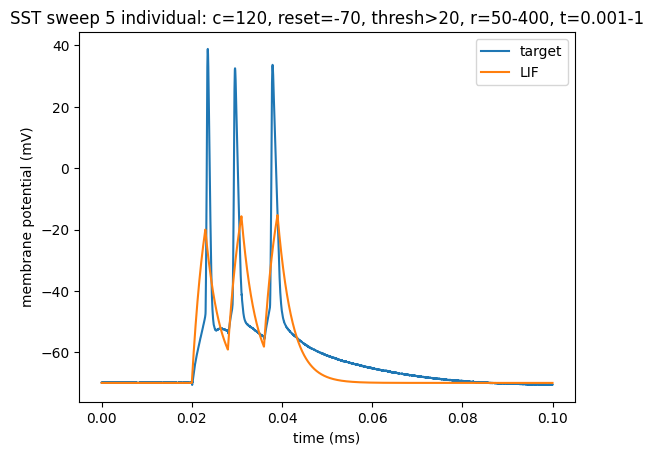

In [396]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_5[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_4_6 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 7.5s

first fit:
Round 0: Best parameters R=281.03404688 Mohm, tau=133.72625662 ms (error: 277.41705828 mV^2)
Round 1: Best parameters R=204.12636706 Mohm, tau=87.1694477 ms (error: 264.13026055 mV^2)
Round 2: Best parameters R=131.69408721 Mohm, tau=47.5088448 ms (error: 238.80581656 mV^2)
Round 3: Best parameters R=124.89923474 Mohm, tau=33.92133408 ms (error: 216.11557705 mV^2)
Round 4: Best parameters R=140.88721615 Mohm, tau=25.10092698 ms (error: 190.07569872 mV^2)
Round 5: Best parameters R=140.29426855 Mohm, tau=18.09950726 ms (error: 165.53171389 mV^2)
Round 6: Best parameters R=122.25907177 Mohm, tau=12.02603764 ms (error: 137.78948089 mV^2)
Round 7: Best parameters R=120.87741051 Mohm, tau=9.62177875 ms (error: 125.78429602 mV^2)
Round 8: Best parameters R=102.15870921 Mohm, tau=6.60850663 ms (error: 113.71432518 mV^2)
Round 9: Best parameters R=113.18139135 Mohm, tau=5.67088477 ms (error: 106.93156295 mV^2)
Round 10: Best parameters R=111.37827216 Mohm, tau=4.0507384 ms (error: 1

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

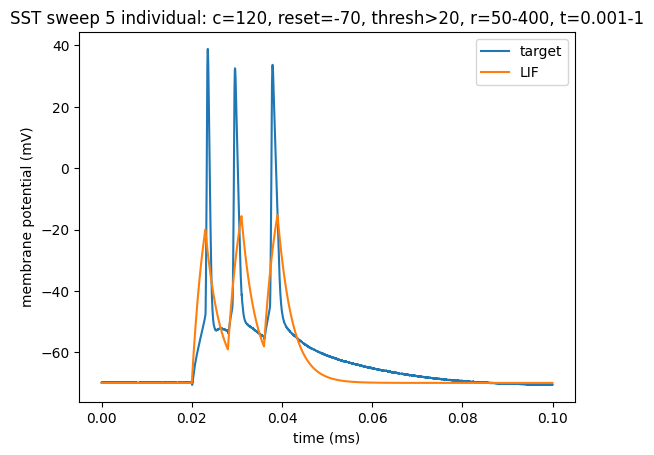

In [397]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_6[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_4_7 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 7.3s

first fit:
Round 0: Best parameters R=166.04477899 Mohm, tau=88.13767336 ms (error: 266.92809719 mV^2)
Round 1: Best parameters R=162.91824233 Mohm, tau=63.71330124 ms (error: 251.5656492 mV^2)
Round 2: Best parameters R=120.24951103 Mohm, tau=39.98112578 ms (error: 230.09229996 mV^2)
Round 3: Best parameters R=139.85681996 Mohm, tau=39.98112578 ms (error: 225.25691989 mV^2)
Round 4: Best parameters R=139.85681996 Mohm, tau=39.98112578 ms (error: 225.25691989 mV^2)
Round 5: Best parameters R=139.85681996 Mohm, tau=39.98112578 ms (error: 225.25691989 mV^2)
Round 6: Best parameters R=139.85681996 Mohm, tau=39.98112578 ms (error: 225.25691989 mV^2)
Round 7: Best parameters R=151.99597854 Mohm, tau=34.45395527 ms (error: 214.19398252 mV^2)
Round 8: Best parameters R=151.99597854 Mohm, tau=34.45395527 ms (error: 214.19398252 mV^2)
Round 9: Best parameters R=148.26405207 Mohm, tau=34.45395527 ms (error: 214.06109514 mV^2)
Round 10: Best parameters R=148.26405207 Mohm, tau=34.45395527 ms (err

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

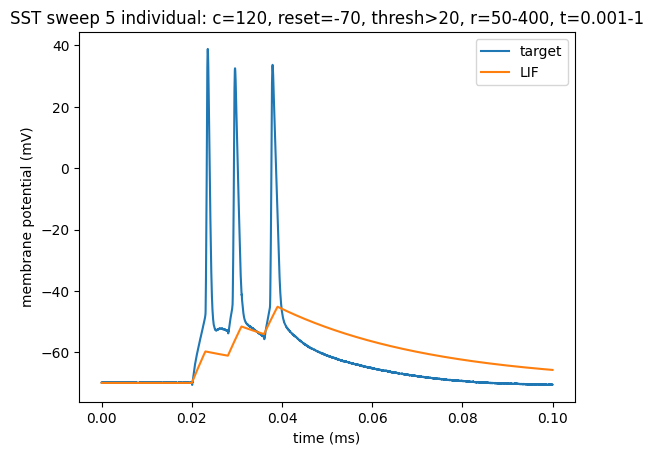

In [398]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_7[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_4_8 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# 7.4s

first fit:
Round 0: Best parameters R=239.53384179 Mohm, tau=140.56929735 ms (error: 277.79025024 mV^2)
Round 1: Best parameters R=213.72008091 Mohm, tau=82.50879488 ms (error: 263.11239244 mV^2)
Round 2: Best parameters R=151.99167636 Mohm, tau=51.41269819 ms (error: 240.4538759 mV^2)
Round 3: Best parameters R=106.41777026 Mohm, tau=35.99979087 ms (error: 228.27835718 mV^2)
Round 4: Best parameters R=106.41777026 Mohm, tau=28.0504371 ms (error: 208.54352715 mV^2)
Round 5: Best parameters R=159.1535993 Mohm, tau=21.045895 ms (error: 181.47852603 mV^2)
Round 6: Best parameters R=139.66012224 Mohm, tau=15.24001908 ms (error: 153.88660744 mV^2)
Round 7: Best parameters R=122.17828018 Mohm, tau=13.11040437 ms (error: 143.17377059 mV^2)
Round 8: Best parameters R=101.76575511 Mohm, tau=9.12488168 ms (error: 128.65378789 mV^2)
Round 9: Best parameters R=115.53877996 Mohm, tau=7.88108017 ms (error: 117.19469862 mV^2)
Round 10: Best parameters R=110.85573311 Mohm, tau=6.12067312 ms (error: 10

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

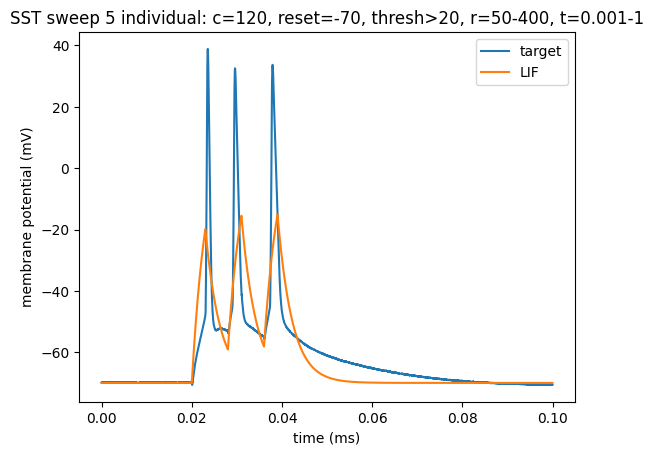

In [399]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_8[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

In [ ]:
sst_lif_s5_4_9 = run_lif(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, cm_var=120, reset_var='v=-70*mV', thresh_var='v>20*mV',\
                        round_num=20, r_min=50*10**6, r_max=400*10**6, t_min=0.001, t_max=1)

# tt: 7.1s

first fit:
Round 0: Best parameters R=287.03613434 Mohm, tau=141.11848959 ms (error: 278.33974097 mV^2)
Round 1: Best parameters R=224.31526716 Mohm, tau=60.90313629 ms (error: 259.28083146 mV^2)
Round 2: Best parameters R=127.64387594 Mohm, tau=45.50834216 ms (error: 236.9684106 mV^2)
Round 3: Best parameters R=115.01728834 Mohm, tau=29.31131263 ms (error: 207.95282031 mV^2)
Round 4: Best parameters R=99.27927905 Mohm, tau=25.60415455 ms (error: 205.48382691 mV^2)
Round 5: Best parameters R=145.10481659 Mohm, tau=27.98491608 ms (error: 198.55662723 mV^2)
Round 6: Best parameters R=101.45509267 Mohm, tau=19.71820987 ms (error: 182.63849657 mV^2)
Round 7: Best parameters R=101.45509267 Mohm, tau=19.71820987 ms (error: 182.63849657 mV^2)
Round 8: Best parameters R=137.69128305 Mohm, tau=20.52547381 ms (error: 174.50636746 mV^2)
Round 9: Best parameters R=137.69128305 Mohm, tau=20.52547381 ms (error: 174.50636746 mV^2)
Round 10: Best parameters R=128.20056785 Mohm, tau=19.00496836 ms (err

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

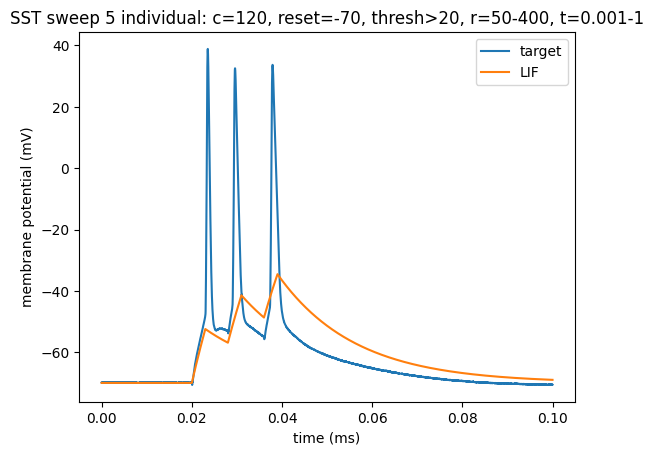

In [400]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_9[0]*1000, d2_title='LIF')
title('SST sweep 5 individual: c=120, reset=-70, thresh>20, r=50-400, t=0.001-1')

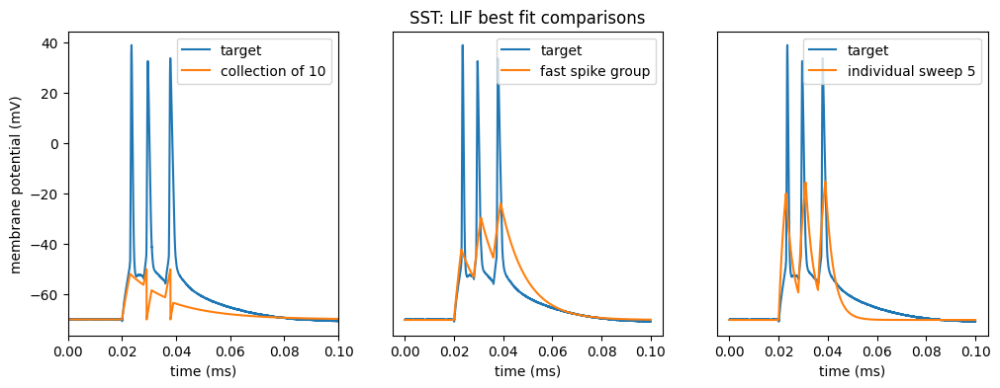

In [406]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(sliced_output_res[5], lif_sst_starters_0[5]*1000, d2_title='collection of 10')
xlim(0, 0.1)
ylabel('membrane potential (mV)')

subplot(1,3,2)
create_comparison_together(fastspikes_output_sliced[2], lif_sst_fast_5[2]*1000, d2_title='fast spike group')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('SST: LIF best fit comparisons')

subplot(1,3,3)
create_comparison_together(reshaped_sst_sweep5_out[0], sst_lif_s5_4_8[0]*1000, d2_title='individual sweep 5')
ax = plt.gca()
ax.yaxis.set_visible(False)

***
# ADEX INDIVIDUAL SWEEP 5
***

In [ ]:
sst_adex_s5_0 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out)

# tt: 4.3

first fit:
Round 0: Best parameters a=2.89928978 nS, b=60.60851011 pA, tauw=148.57128837 ms (error: 198.92574708 mV^2)
Round 1: Best parameters a=1.38696027 nS, b=36.76273001 pA, tauw=145.14964622 ms (error: 184.39073984 mV^2)
Round 2: Best parameters a=1.91136585 nS, b=24.09599922 pA, tauw=151.25271295 ms (error: 182.44115286 mV^2)
Round 3: Best parameters a=1.83160029 nS, b=22.59378956 pA, tauw=128.22027749 ms (error: 182.43468855 mV^2)
Round 4: Best parameters a=3.10529737 nS, b=19.91080353 pA, tauw=123.64405153 ms (error: 182.43391975 mV^2)
Round 5: Best parameters a=2.21582828 nS, b=22.12175217 pA, tauw=122.90762239 ms (error: 182.42009491 mV^2)
Round 6: Best parameters a=2.21582828 nS, b=22.12175217 pA, tauw=122.90762239 ms (error: 182.42009491 mV^2)
Round 7: Best parameters a=2.21582828 nS, b=22.12175217 pA, tauw=122.90762239 ms (error: 182.42009491 mV^2)
Round 8: Best parameters a=2.21582828 nS, b=22.12175217 pA, tauw=122.90762239 ms (error: 182.42009491 mV^2)
Round 9: Best par

Text(0.5, 1.0, 'SST sweep 5 individual: initial')

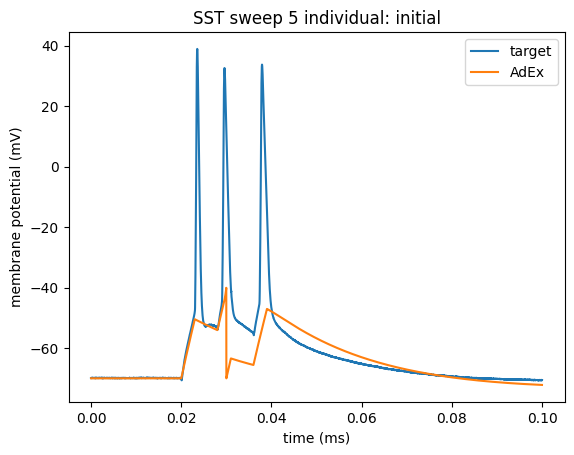

In [408]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_0[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: initial')

In [ ]:
sst_adex_s5_1 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_var=20)

# tt: 4.3

first fit:
Round 0: Best parameters a=1.42022828 nS, b=88.65084565 pA, tauw=148.35854508 ms (error: 182.88714702 mV^2)
Round 1: Best parameters a=1.24931025 nS, b=171.45729675 pA, tauw=154.52036479 ms (error: 182.78506304 mV^2)
Round 2: Best parameters a=1.1456891 nS, b=50.71796316 pA, tauw=155.82735509 ms (error: 182.73417301 mV^2)
Round 3: Best parameters a=1.09032475 nS, b=82.45798959 pA, tauw=156.43729111 ms (error: 182.70759389 mV^2)
Round 4: Best parameters a=1.06951974 nS, b=188.29426416 pA, tauw=157.18619088 ms (error: 182.69620751 mV^2)
Round 5: Best parameters a=1.04577413 nS, b=0.45678387 nA, tauw=157.02141671 ms (error: 182.6861075 mV^2)
Round 6: Best parameters a=1.03784357 nS, b=0.46292696 nA, tauw=157.94546332 ms (error: 182.68009003 mV^2)
Round 7: Best parameters a=1.02761101 nS, b=0.48215392 nA, tauw=158.27277623 ms (error: 182.67469887 mV^2)
Round 8: Best parameters a=1.02097056 nS, b=0.47871598 nA, tauw=158.19622247 ms (error: 182.67197041 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'SST sweep 5 individual: gl=20')

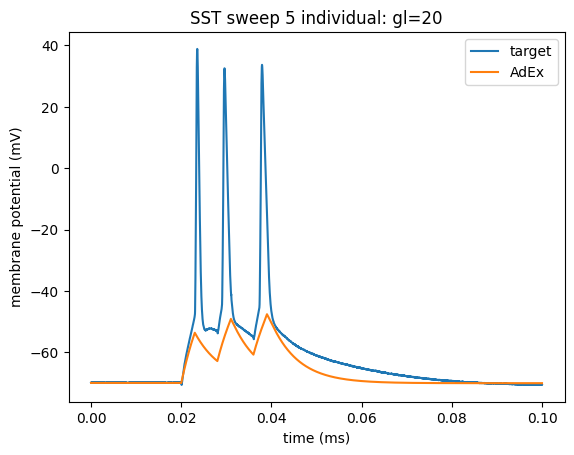

In [411]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_1[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: gl=20')

In [ ]:
sst_adex_s5_2 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_var=15)

# tt: 4.3

first fit:
Round 0: Best parameters a=1.99828901 nS, b=55.70540398 pA, tauw=126.82380668 ms (error: 215.67983373 mV^2)
Round 1: Best parameters a=1.56404371 nS, b=29.92212535 pA, tauw=125.51321724 ms (error: 207.37387372 mV^2)
Round 2: Best parameters a=1.96671591 nS, b=18.19949607 pA, tauw=125.57097023 ms (error: 204.24321352 mV^2)
Round 3: Best parameters a=2.05374809 nS, b=12.02459556 pA, tauw=132.59655393 ms (error: 202.74235543 mV^2)
Round 4: Best parameters a=2.8304647 nS, b=7.68432053 pA, tauw=150.56266407 ms (error: 201.77754431 mV^2)
Round 5: Best parameters a=1.4435113 nS, b=6.11101796 pA, tauw=128.16941179 ms (error: 201.29100273 mV^2)
Round 6: Best parameters a=2.13824918 nS, b=4.33775687 pA, tauw=148.91628521 ms (error: 200.89291351 mV^2)
Round 7: Best parameters a=1.80583232 nS, b=3.77241641 pA, tauw=123.30381584 ms (error: 200.76295818 mV^2)
Round 8: Best parameters a=1.44898294 nS, b=2.78366828 pA, tauw=128.36896772 ms (error: 200.59010202 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'SST sweep 5 individual: gl=15')

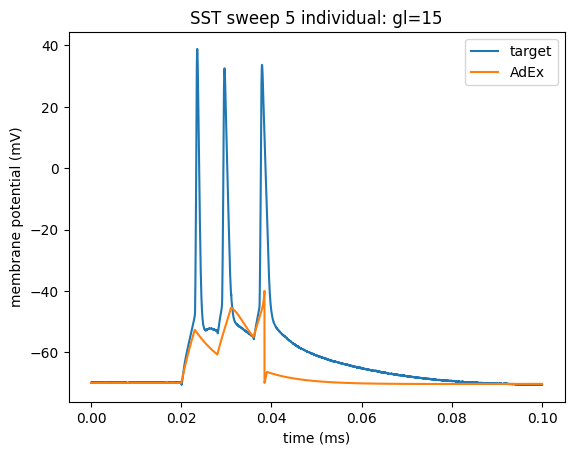

In [413]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_2[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: gl=15')

In [ ]:
sst_adex_s5_3 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_var=30)

# tt: 4.3

first fit:
Round 0: Best parameters a=1.3826485 nS, b=0.42231036 nA, tauw=151.55771966 ms (error: 219.05174595 mV^2)
Round 1: Best parameters a=1.21039692 nS, b=256.44519302 pA, tauw=154.96180474 ms (error: 218.99290172 mV^2)
Round 2: Best parameters a=1.12671203 nS, b=0.43427677 nA, tauw=156.31289943 ms (error: 218.96575869 mV^2)
Round 3: Best parameters a=1.09937459 nS, b=0.33344319 nA, tauw=157.28886776 ms (error: 218.95598889 mV^2)
Round 4: Best parameters a=1.06880431 nS, b=0.4498281 nA, tauw=157.96815252 ms (error: 218.94593414 mV^2)
Round 5: Best parameters a=1.04603403 nS, b=0.36435106 nA, tauw=158.59363796 ms (error: 218.93828863 mV^2)
Round 6: Best parameters a=1.03600797 nS, b=0.42189349 nA, tauw=158.7593128 ms (error: 218.93512902 mV^2)
Round 7: Best parameters a=1.02326478 nS, b=0.3307219 nA, tauw=158.79433523 ms (error: 218.93142048 mV^2)
Round 8: Best parameters a=1.01702001 nS, b=59.5402515 pA, tauw=158.77732463 ms (error: 218.92966152 mV^2)
Round 9: Best parameters a=1

Text(0.5, 1.0, 'SST sweep 5 individual: gl=30')

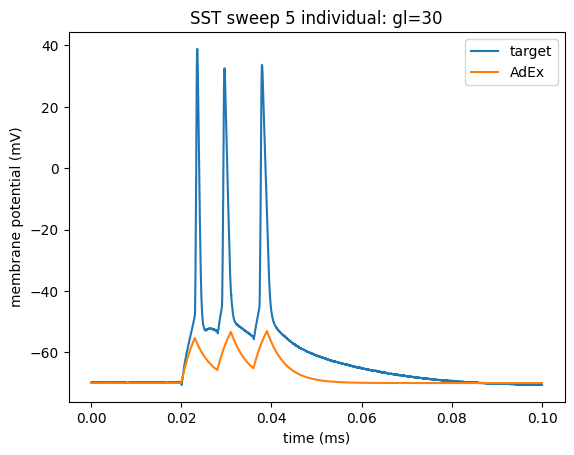

In [415]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_3[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: gl=30')

In [ ]:
sst_adex_s5_4 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_var=40)

# tt: 4.4

first fit:
Round 0: Best parameters a=1.4187282 nS, b=0.38339753 nA, tauw=151.31462243 ms (error: 242.37560274 mV^2)
Round 1: Best parameters a=1.25939247 nS, b=0.39253417 nA, tauw=155.31630613 ms (error: 242.33717745 mV^2)
Round 2: Best parameters a=1.14813904 nS, b=0.4306198 nA, tauw=154.00065592 ms (error: 242.31691015 mV^2)
Round 3: Best parameters a=1.09850189 nS, b=0.35086273 nA, tauw=155.71662364 ms (error: 242.30476438 mV^2)
Round 4: Best parameters a=1.0651189 nS, b=0.44404298 nA, tauw=157.35270232 ms (error: 242.29614276 mV^2)
Round 5: Best parameters a=1.04559347 nS, b=0.43988697 nA, tauw=158.23726769 ms (error: 242.29126211 mV^2)
Round 6: Best parameters a=1.032493 nS, b=292.21882627 pA, tauw=158.23726769 ms (error: 242.2887092 mV^2)
Round 7: Best parameters a=1.02149925 nS, b=114.41199837 pA, tauw=158.67743936 ms (error: 242.28605744 mV^2)
Round 8: Best parameters a=1.01718784 nS, b=0.35284166 nA, tauw=158.96034767 ms (error: 242.28489476 mV^2)
Round 9: Best parameters a=1

Text(0.5, 1.0, 'SST sweep 5 individual: gl=40')

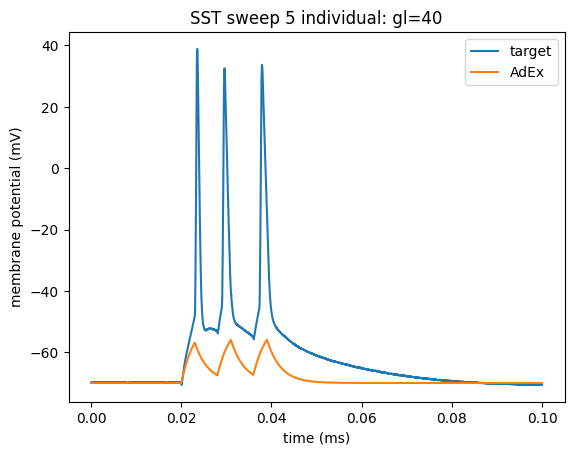

In [417]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_4[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: gl=40')

In [ ]:
sst_adex_s5_5 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_var=40, vt_var= -50, vr=-53)

# tt: 4.3

first fit:
Round 0: Best parameters a=1.29663344 nS, b=0.40804405 nA, tauw=146.73941717 ms (error: 242.35833115 mV^2)
Round 1: Best parameters a=1.23040959 nS, b=86.68432136 pA, tauw=153.13014184 ms (error: 242.33463442 mV^2)
Round 2: Best parameters a=1.13167585 nS, b=310.65919091 pA, tauw=156.43891491 ms (error: 242.31037341 mV^2)
Round 3: Best parameters a=1.07889487 nS, b=167.18662346 pA, tauw=157.90486334 ms (error: 242.2981598 mV^2)
Round 4: Best parameters a=1.06450661 nS, b=0.36054442 nA, tauw=158.4834567 ms (error: 242.29465054 mV^2)
Round 5: Best parameters a=1.03947877 nS, b=195.26933257 pA, tauw=158.53916592 ms (error: 242.28971471 mV^2)
Round 6: Best parameters a=1.02664788 nS, b=0.42777382 nA, tauw=158.94527684 ms (error: 242.28674794 mV^2)
Round 7: Best parameters a=1.01897476 nS, b=0.42777382 nA, tauw=159.27546857 ms (error: 242.28488051 mV^2)
Round 8: Best parameters a=1.01267281 nS, b=0.47796853 nA, tauw=159.26870436 ms (error: 242.28366752 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'SST sweep 5 individual: gl=40, vt=-50, vr=-53')

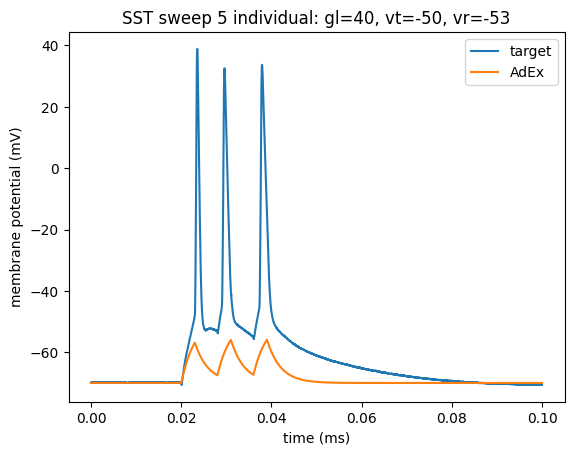

In [419]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_5[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: gl=40, vt=-50, vr=-53')

In [ ]:
sst_adex_s5_6 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=200, gl_var=40, vt_var= -50, vr=-53)

# tt: 4.4

first fit:
Round 0: Best parameters a=1.36042279 nS, b=266.80485587 pA, tauw=138.71210639 ms (error: 253.10992808 mV^2)
Round 1: Best parameters a=1.20415297 nS, b=136.03450974 pA, tauw=147.17467917 ms (error: 253.07190241 mV^2)
Round 2: Best parameters a=1.12480587 nS, b=227.51596938 pA, tauw=153.11274214 ms (error: 253.05232401 mV^2)
Round 3: Best parameters a=1.08844296 nS, b=212.35032604 pA, tauw=154.2714993 ms (error: 253.04539553 mV^2)
Round 4: Best parameters a=1.06818709 nS, b=0.43125422 nA, tauw=155.84608578 ms (error: 253.04065832 mV^2)
Round 5: Best parameters a=1.05163205 nS, b=178.43257861 pA, tauw=156.61142295 ms (error: 253.03735124 mV^2)
Round 6: Best parameters a=1.04444443 nS, b=309.13112598 pA, tauw=157.88737738 ms (error: 253.03503335 mV^2)
Round 7: Best parameters a=1.02836759 nS, b=223.96483406 pA, tauw=158.10129675 ms (error: 253.03237106 mV^2)
Round 8: Best parameters a=1.02024554 nS, b=0.37898234 nA, tauw=158.34516182 ms (error: 253.03090459 mV^2)
Round 9: Best

Text(0.5, 1.0, 'SST sweep 5 individual: c=200, gl=40, vt=-50, vr=-53')

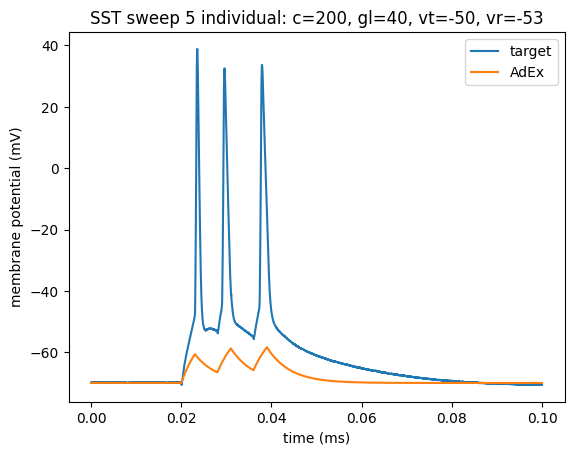

In [421]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_6[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=200, gl=40, vt=-50, vr=-53')

In [422]:
sst_adex_s5_7 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=100, gl_var=40, vt_var= -50, vr=-53)

first fit:
Round 0: Best parameters a=1.37541461 nS, b=174.38938325 pA, tauw=145.06846556 ms (error: 238.8103645 mV^2)
Round 1: Best parameters a=1.21636307 nS, b=151.80021301 pA, tauw=152.69010526 ms (error: 238.76217456 mV^2)
Round 2: Best parameters a=1.125236 nS, b=166.87263986 pA, tauw=156.15065821 ms (error: 238.73775533 mV^2)
Round 3: Best parameters a=1.09259815 nS, b=161.43708064 pA, tauw=157.18825403 ms (error: 238.7295185 mV^2)
Round 4: Best parameters a=1.05903756 nS, b=38.60258227 pA, tauw=157.32121757 ms (error: 238.72235149 mV^2)
Round 5: Best parameters a=1.04162975 nS, b=20.9648282 pA, tauw=157.61995401 ms (error: 238.71834727 mV^2)
Round 6: Best parameters a=1.03318573 nS, b=45.67505565 pA, tauw=157.81064191 ms (error: 238.71635263 mV^2)
Round 7: Best parameters a=1.02088986 nS, b=34.27516635 pA, tauw=158.55959119 ms (error: 238.71287641 mV^2)
Round 8: Best parameters a=1.01753346 nS, b=20.0489097 pA, tauw=158.57766745 ms (error: 238.71216029 mV^2)
Round 9: Best param

Text(0.5, 1.0, 'SST sweep 5 individual: c=100, gl=40, vt=-50, vr=-53')

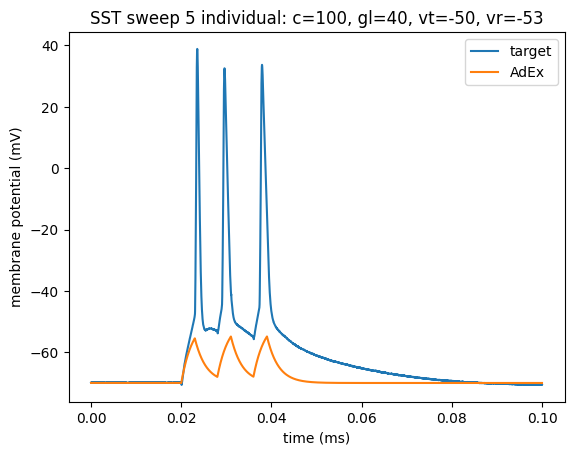

In [423]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_7[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=100, gl=40, vt=-50, vr=-53')

In [ ]:
sst_adex_s5_8 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=40, vt_var= -50, vr=-53)

# tt: 5.1

first fit:
Round 0: Best parameters a=1.39824031 nS, b=208.25584301 pA, tauw=153.31417129 ms (error: 234.64819433 mV^2)
Round 1: Best parameters a=1.26014317 nS, b=236.648921 pA, tauw=151.4459426 ms (error: 234.62003586 mV^2)
Round 2: Best parameters a=1.15516379 nS, b=142.38779093 pA, tauw=153.70948561 ms (error: 234.59230786 mV^2)
Round 3: Best parameters a=1.08979788 nS, b=73.48160594 pA, tauw=153.87370455 ms (error: 234.57723801 mV^2)
Round 4: Best parameters a=1.05665558 nS, b=71.08096245 pA, tauw=155.36030426 ms (error: 234.56762251 mV^2)
Round 5: Best parameters a=1.05171798 nS, b=158.99374857 pA, tauw=157.72063765 ms (error: 234.56326176 mV^2)
Round 6: Best parameters a=1.04025849 nS, b=225.58595157 pA, tauw=158.07580011 ms (error: 234.56024662 mV^2)
Round 7: Best parameters a=1.02479321 nS, b=312.18242185 pA, tauw=158.08005982 ms (error: 234.55682176 mV^2)
Round 8: Best parameters a=1.01956125 nS, b=75.39817839 pA, tauw=158.517901 ms (error: 234.55509219 mV^2)
Round 9: Best pa

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=40, vt=-50, vr=-53')

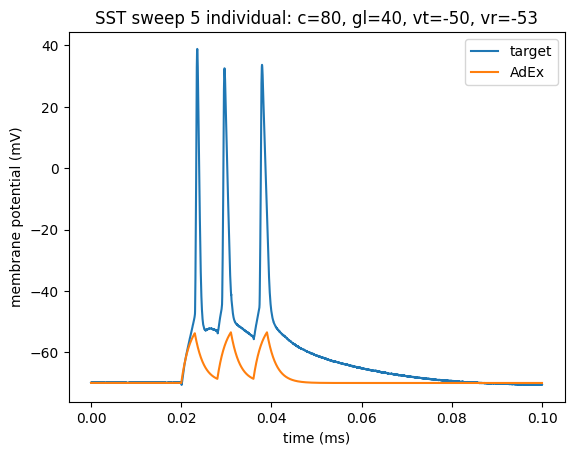

In [425]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_8[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=40, vt=-50, vr=-53')

In [ ]:
sst_adex_s5_9 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=40, vt_var= -50, vr=-53)

# tt: 4.4

first fit:
Round 0: Best parameters a=1.3884788 nS, b=0.37346252 nA, tauw=143.79147134 ms (error: 229.88340449 mV^2)
Round 1: Best parameters a=1.30314592 nS, b=304.67005118 pA, tauw=154.57375863 ms (error: 229.8394322 mV^2)
Round 2: Best parameters a=1.13421568 nS, b=153.02284761 pA, tauw=150.66260697 ms (error: 229.80478213 mV^2)
Round 3: Best parameters a=1.09528276 nS, b=0.41325017 nA, tauw=156.02814832 ms (error: 229.78641575 mV^2)
Round 4: Best parameters a=1.05921618 nS, b=0.32913377 nA, tauw=156.35624576 ms (error: 229.77719405 mV^2)
Round 5: Best parameters a=1.04207573 nS, b=153.02284761 pA, tauw=157.79070919 ms (error: 229.77095159 mV^2)
Round 6: Best parameters a=1.0340073 nS, b=0.4266637 nA, tauw=158.62530782 ms (error: 229.76782115 mV^2)
Round 7: Best parameters a=1.02447473 nS, b=0.45105561 nA, tauw=158.93933821 ms (error: 229.7651053 mV^2)
Round 8: Best parameters a=1.01725406 nS, b=304.6698641 pA, tauw=159.04994996 ms (error: 229.76323247 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=40, vt=-50, vr=-53')

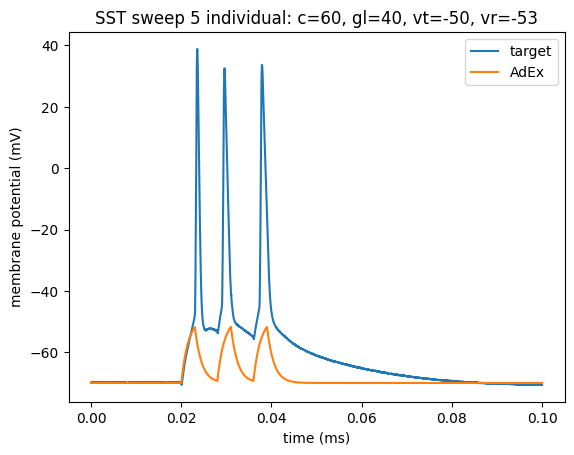

In [427]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_9[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=40, vt=-50, vr=-53')

In [ ]:
sst_adex_s5_10 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=40, gl_var=40, vt_var= -50, vr=-53)

# tt: 4.4

first fit:
Round 0: Best parameters a=1.33194105 nS, b=0.33562593 nA, tauw=130.51469528 ms (error: 224.12991693 mV^2)
Round 1: Best parameters a=1.26229039 nS, b=145.63874418 pA, tauw=151.59587395 ms (error: 224.05029526 mV^2)
Round 2: Best parameters a=1.14855184 nS, b=243.69948401 pA, tauw=155.62475881 ms (error: 224.0077839 mV^2)
Round 3: Best parameters a=1.0916866 nS, b=171.36131856 pA, tauw=154.58300339 ms (error: 223.99304253 mV^2)
Round 4: Best parameters a=1.05819049 nS, b=70.37497811 pA, tauw=156.99884255 ms (error: 223.97868463 mV^2)
Round 5: Best parameters a=1.04427732 nS, b=0.37245021 nA, tauw=156.47120551 ms (error: 223.97556893 mV^2)
Round 6: Best parameters a=1.03560976 nS, b=289.10428993 pA, tauw=158.27511499 ms (error: 223.96984555 mV^2)
Round 7: Best parameters a=1.01983101 nS, b=0.33314387 nA, tauw=158.27511499 ms (error: 223.96527252 mV^2)
Round 8: Best parameters a=1.0167863 nS, b=64.38628735 pA, tauw=158.4967056 ms (error: 223.96401042 mV^2)
Round 9: Best parame

Text(0.5, 1.0, 'SST sweep 5 individual: c=40, gl=40, vt=-50, vr=-53')

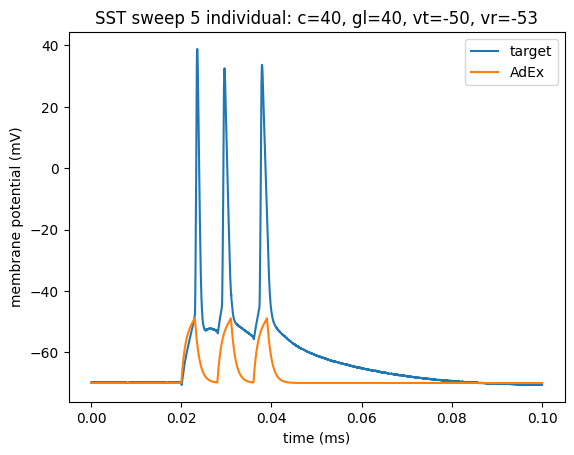

In [429]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_10[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=40, gl=40, vt=-50, vr=-53')

In [430]:
sst_adex_s5_11 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, vr=-53)

# tt: 

first fit:
Round 0: Best parameters a=2.08245154 nS, b=77.62776 pA, tauw=129.07884853 ms (error: 253.33596245 mV^2)
Round 1: Best parameters a=2.36716022 nS, b=34.86997541 pA, tauw=152.97674698 ms (error: 245.78636061 mV^2)
Round 2: Best parameters a=2.30982419 nS, b=21.11985817 pA, tauw=150.11316533 ms (error: 242.30670377 mV^2)
Round 3: Best parameters a=1.86088112 nS, b=13.95373908 pA, tauw=129.5181879 ms (error: 236.34894864 mV^2)
Round 4: Best parameters a=2.50299605 nS, b=8.79645011 pA, tauw=125.99069205 ms (error: 222.77676337 mV^2)
Round 5: Best parameters a=2.50299605 nS, b=8.79645011 pA, tauw=125.99069205 ms (error: 222.77676337 mV^2)
Round 6: Best parameters a=3.36491816 nS, b=8.52934895 pA, tauw=127.07770033 ms (error: 222.4540537 mV^2)
Round 7: Best parameters a=3.36491816 nS, b=8.52934895 pA, tauw=127.07770033 ms (error: 222.4540537 mV^2)
Round 8: Best parameters a=3.36491816 nS, b=8.52934895 pA, tauw=127.07770033 ms (error: 222.4540537 mV^2)
Round 9: Best parameters a=3.

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, vr=-53')

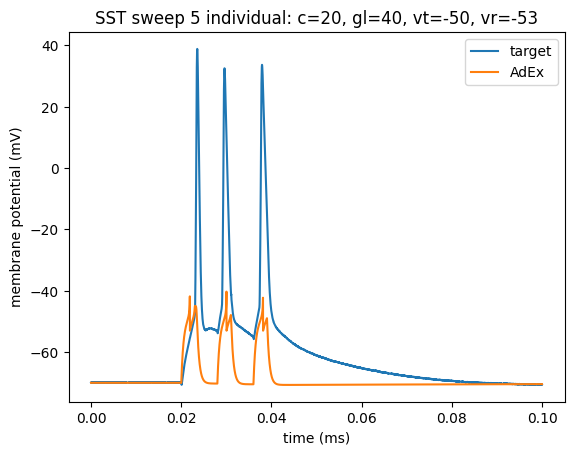

In [431]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_11[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, vr=-53')

In [ ]:
sst_adex_s5_12 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -40, vr=-53)

# tt: 4.5

first fit:
Round 0: Best parameters a=1.31993169 nS, b=237.60429489 pA, tauw=150.92887074 ms (error: 233.19593155 mV^2)
Round 1: Best parameters a=1.1745833 nS, b=0.32071636 nA, tauw=150.9160598 ms (error: 233.15595554 mV^2)
Round 2: Best parameters a=1.12760246 nS, b=93.39932609 pA, tauw=156.69650472 ms (error: 233.13253471 mV^2)
Round 3: Best parameters a=1.07986007 nS, b=58.30005798 pA, tauw=156.11648438 ms (error: 233.12081254 mV^2)
Round 4: Best parameters a=1.06112547 nS, b=37.26750116 pA, tauw=157.66416585 ms (error: 233.11326375 mV^2)
Round 5: Best parameters a=1.04933757 nS, b=127.2325905 pA, tauw=157.73765064 ms (error: 233.11002705 mV^2)
Round 6: Best parameters a=1.02897832 nS, b=106.95059534 pA, tauw=157.01888959 ms (error: 233.10578487 mV^2)
Round 7: Best parameters a=1.02089968 nS, b=193.4298073 pA, tauw=158.47577452 ms (error: 233.10135466 mV^2)
Round 8: Best parameters a=1.0146413 nS, b=89.56456471 pA, tauw=158.73838317 ms (error: 233.09930154 mV^2)
Round 9: Best param

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-40, vr=-53')

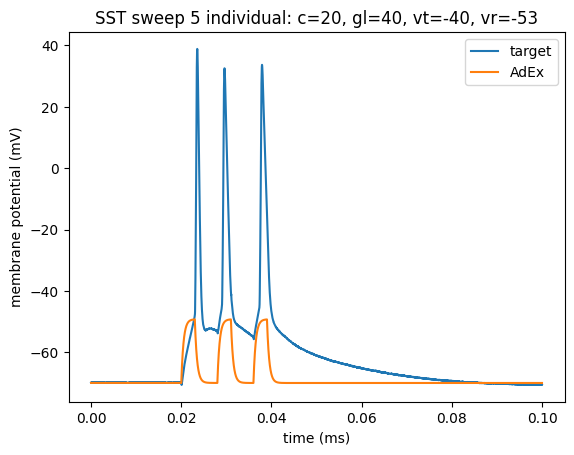

In [433]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_12[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-40, vr=-53')

In [ ]:
sst_adex_s5_13 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=5, vr=-53)

# tt: 4.4

first fit:
Round 0: Best parameters a=1.55502254 nS, b=42.99255643 pA, tauw=141.31319147 ms (error: 262.91627602 mV^2)
Round 1: Best parameters a=1.70010758 nS, b=27.12651671 pA, tauw=146.68422291 ms (error: 242.69751285 mV^2)
Round 2: Best parameters a=1.92082439 nS, b=16.00959723 pA, tauw=153.94287749 ms (error: 235.07564469 mV^2)
Round 3: Best parameters a=1.26263106 nS, b=12.96038143 pA, tauw=154.79597042 ms (error: 227.28963751 mV^2)
Round 4: Best parameters a=2.43513734 nS, b=12.51364451 pA, tauw=138.80809389 ms (error: 225.96677925 mV^2)
Round 5: Best parameters a=2.43513734 nS, b=12.51364451 pA, tauw=138.80809389 ms (error: 225.96677925 mV^2)
Round 6: Best parameters a=1.33478091 nS, b=12.68872059 pA, tauw=153.95198767 ms (error: 225.58098768 mV^2)
Round 7: Best parameters a=1.33478091 nS, b=12.68872059 pA, tauw=153.95198767 ms (error: 225.58098768 mV^2)
Round 8: Best parameters a=1.33478091 nS, b=12.68872059 pA, tauw=153.95198767 ms (error: 225.58098768 mV^2)
Round 9: Best par

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vr=-53')

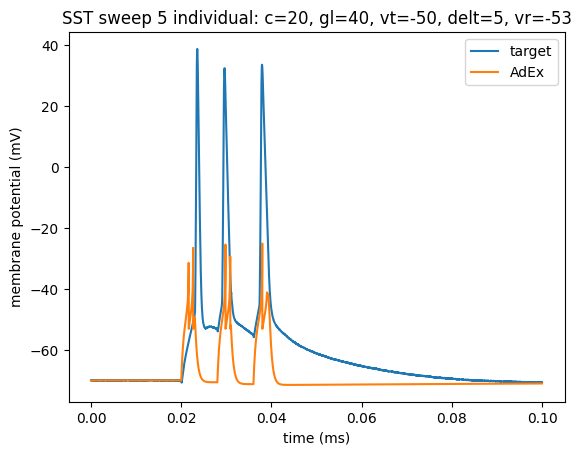

In [435]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_13[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vr=-53')

In [ ]:
sst_adex_s5_14 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=5, vc_var=18, vr=-53)

# tt: 4.4

first fit:
Round 0: Best parameters a=3.52272852 nS, b=160.36948002 pA, tauw=144.59850386 ms (error: 267.28200867 mV^2)
Round 1: Best parameters a=3.7223879 nS, b=40.51021691 pA, tauw=139.86908779 ms (error: 260.71913104 mV^2)
Round 2: Best parameters a=3.62066089 nS, b=22.29035057 pA, tauw=153.09206913 ms (error: 237.68672248 mV^2)
Round 3: Best parameters a=3.62066089 nS, b=14.72671605 pA, tauw=155.22804747 ms (error: 234.6220741 mV^2)
Round 4: Best parameters a=3.6762793 nS, b=12.06021509 pA, tauw=126.59263867 ms (error: 227.3116015 mV^2)
Round 5: Best parameters a=2.48405093 nS, b=12.37072467 pA, tauw=124.10669303 ms (error: 227.12766542 mV^2)
Round 6: Best parameters a=3.56993376 nS, b=11.93768745 pA, tauw=124.06147238 ms (error: 226.6048733 mV^2)
Round 7: Best parameters a=3.56993376 nS, b=11.93768745 pA, tauw=124.06147238 ms (error: 226.6048733 mV^2)
Round 8: Best parameters a=3.82426798 nS, b=11.85813168 pA, tauw=122.76604144 ms (error: 226.57889881 mV^2)
Round 9: Best paramete

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53')

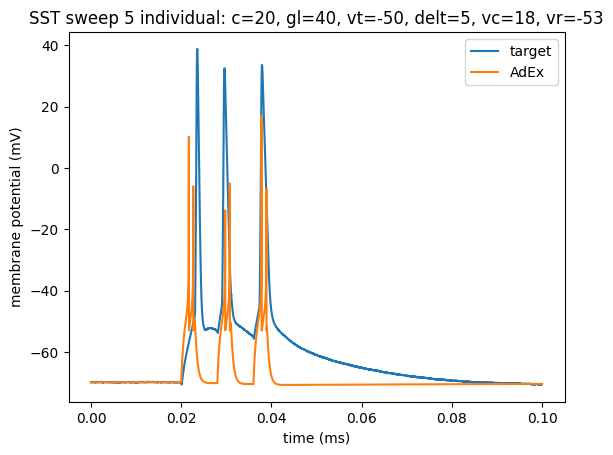

In [437]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_14[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53')

In [ ]:
sst_adex_s5_15 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=5, vc_var=18, vr=-53, b_max=2)

# tt: 4.3

first fit:
Round 0: Best parameters a=3.12224389 nS, b=284.09308503 pA, tauw=147.14317991 ms (error: 338.16392781 mV^2)
Round 1: Best parameters a=1.65594448 nS, b=162.50774921 pA, tauw=146.80779206 ms (error: 268.46148021 mV^2)
Round 2: Best parameters a=1.29072241 nS, b=104.67374338 pA, tauw=154.17648697 ms (error: 258.34038102 mV^2)
Round 3: Best parameters a=1.39135684 nS, b=104.59344628 pA, tauw=155.2380911 ms (error: 253.20393233 mV^2)
Round 4: Best parameters a=1.39135684 nS, b=104.59344628 pA, tauw=155.2380911 ms (error: 253.20393233 mV^2)
Round 5: Best parameters a=1.39135684 nS, b=104.59344628 pA, tauw=155.2380911 ms (error: 253.20393233 mV^2)
Round 6: Best parameters a=1.39135684 nS, b=104.59344628 pA, tauw=155.2380911 ms (error: 253.20393233 mV^2)
Round 7: Best parameters a=1.39135684 nS, b=104.59344628 pA, tauw=155.2380911 ms (error: 253.20393233 mV^2)
Round 8: Best parameters a=1.39135684 nS, b=104.59344628 pA, tauw=154.25520258 ms (error: 253.15546285 mV^2)
Round 9: Best

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, b=(0-2)')

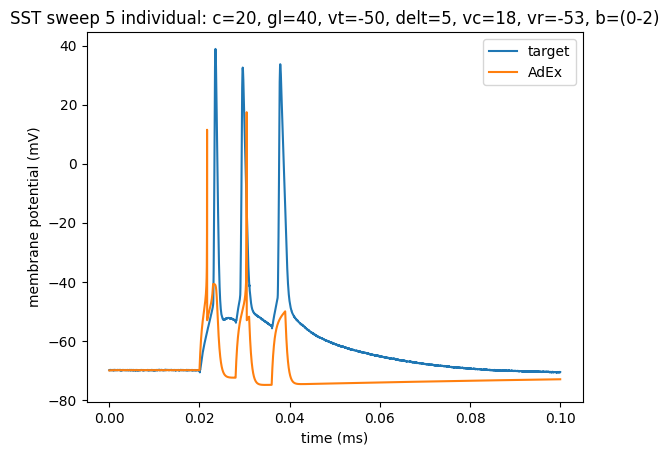

In [439]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_15[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, b=(0-2)')

In [ ]:
# changing el:

def run_adex_el(input_data, output_data, c_var=120, gl_var=5, el=-50, vt_var=-50, delt_var=2, vc_var=5, vr=-70, round_num=10,
             tauw_min=120, tauw_max=160, a_min=1, a_max=4, b_min=0, b_max=0.5):

    # Parameters
    C = c_var * pF
    gL = gl_var * nS
    # taum = C / gL
    El = el * mV
    VT = vt_var * mV
    DeltaT = delt_var * mV
    Vcut = VT + vc_var * DeltaT
    Vr = vr*mV

    model = """
    dv/dt = (gL*(El - v) + gL*DeltaT*exp((v - VT)/DeltaT) + I - w)/C : volt
    dw/dt = (a*(v - El) - w)/tauw : amp

    tauw : second (constant)
    a : siemens (constant)
    b : amp (constant)
    """

    opt = NevergradOptimizer()
    metric = MSEMetric()

    fitter = TraceFitter(model=model,
                        input_var='I',
                        output_var='v',
                        input = input_data * amp,
                        output = output_data * mV,
                        dt= 0.02 * ms,
                        n_samples=100,
                        method='exponential_euler',
                        reset='v=Vr; w+=b',
                        threshold='v>Vcut',
                        # refractory=refrac*ms,
                        param_init={'v': -70*mV})

    np.float = float

    print('first fit:')
    res, error = fitter.fit(n_rounds=round_num,
                            optimizer=opt,
                            metric=metric,
                            tauw=[tauw_min*ms, tauw_max*ms],
                            a=[a_min*nsiemens, a_max*nsiemens],
                            b=[b_min*nA, b_max*nA])

    traces = fitter.generate_traces()

    
    return traces

In [ ]:
sst_adex_s5_16 = run_adex_el(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=5, vc_var=18, vr=-53, b_max=2)

# tt: 7.8

first fit:
Round 0: Best parameters a=1.67775425 nS, b=0.58214432 nA, tauw=129.9856587 ms (error: 297.21379417 mV^2)
Round 1: Best parameters a=1.67775425 nS, b=0.58214432 nA, tauw=129.9856587 ms (error: 297.21379417 mV^2)
Round 2: Best parameters a=1.67775425 nS, b=0.58214432 nA, tauw=129.9856587 ms (error: 297.21379417 mV^2)
Round 3: Best parameters a=1.67775425 nS, b=0.58214432 nA, tauw=129.9856587 ms (error: 297.21379417 mV^2)
Round 4: Best parameters a=1.79026784 nS, b=0.58392298 nA, tauw=126.42883559 ms (error: 295.02123755 mV^2)
Round 5: Best parameters a=1.79026784 nS, b=0.58392298 nA, tauw=126.42883559 ms (error: 295.02123755 mV^2)
Round 6: Best parameters a=1.6300282 nS, b=1.25465252 nA, tauw=129.81531512 ms (error: 291.15071259 mV^2)
Round 7: Best parameters a=1.6300282 nS, b=1.25465252 nA, tauw=129.81531512 ms (error: 291.15071259 mV^2)
Round 8: Best parameters a=1.6300282 nS, b=1.25465252 nA, tauw=129.81531512 ms (error: 291.15071259 mV^2)
Round 9: Best parameters a=1.6300

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, el=-50, gl=40, vt=-50, delt=5, vc=18, vr=-53, b=(0-2)')

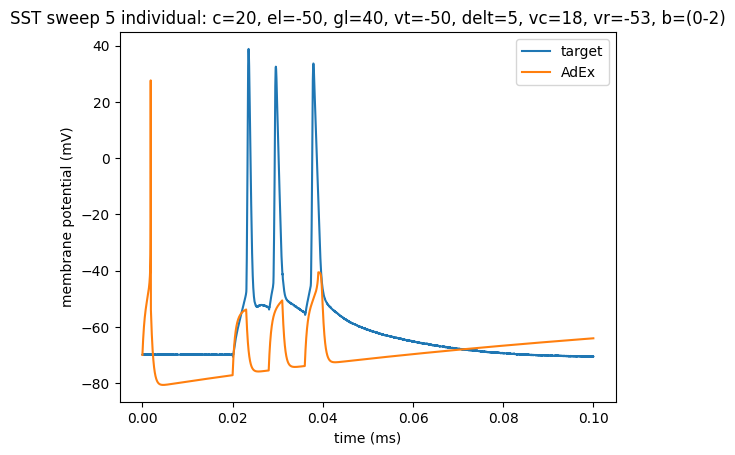

In [442]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_16[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, el=-50, gl=40, vt=-50, delt=5, vc=18, vr=-53, b=(0-2)')

In [ ]:
sst_adex_s5_17 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=5, vc_var=18, vr=-53, a_max=10, b_max=2)

# tt: 8.2

first fit:
Round 0: Best parameters a=2.05691004 nS, b=207.01663791 pA, tauw=154.29264293 ms (error: 297.58484806 mV^2)
Round 1: Best parameters a=2.3471852 nS, b=161.07314755 pA, tauw=132.60489224 ms (error: 265.23038847 mV^2)
Round 2: Best parameters a=6.30883699 nS, b=154.08371679 pA, tauw=156.59109231 ms (error: 261.27086385 mV^2)
Round 3: Best parameters a=6.30883699 nS, b=154.08371679 pA, tauw=156.59109231 ms (error: 261.27086385 mV^2)
Round 4: Best parameters a=6.30883699 nS, b=154.08371679 pA, tauw=156.59109231 ms (error: 261.27086385 mV^2)
Round 5: Best parameters a=6.30883699 nS, b=154.08371679 pA, tauw=156.59109231 ms (error: 261.27086385 mV^2)
Round 6: Best parameters a=8.25377336 nS, b=102.71545302 pA, tauw=152.74956671 ms (error: 260.05804356 mV^2)
Round 7: Best parameters a=8.25377336 nS, b=102.71545302 pA, tauw=152.74956671 ms (error: 260.05804356 mV^2)
Round 8: Best parameters a=1.69683353 nS, b=104.50168147 pA, tauw=157.25077333 ms (error: 251.24867706 mV^2)
Round 9: 

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, a= (1-10), b=(0-2)')

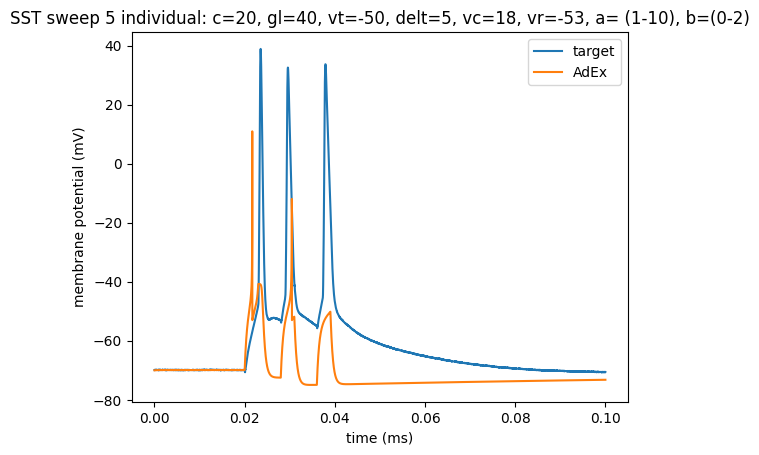

In [444]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_17[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, a= (1-10), b=(0-2)')

In [ ]:
sst_adex_s5_18 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=4, vc_var=22, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 8s

first fit:
Round 0: Best parameters a=5.1758264 nS, b=0.56890674 nA, tauw=132.81236467 ms (error: 498.17558331 mV^2)
Round 1: Best parameters a=4.96001925 nS, b=0.33247461 nA, tauw=86.33244037 ms (error: 352.38864573 mV^2)
Round 2: Best parameters a=5.17524595 nS, b=189.6065149 pA, tauw=113.93955597 ms (error: 293.54892775 mV^2)
Round 3: Best parameters a=3.37861236 nS, b=140.68946694 pA, tauw=68.05798021 ms (error: 259.62633395 mV^2)
Round 4: Best parameters a=2.3443166 nS, b=127.68835308 pA, tauw=138.77318372 ms (error: 257.83994112 mV^2)
Round 5: Best parameters a=2.3443166 nS, b=127.68835308 pA, tauw=138.77318372 ms (error: 257.83994112 mV^2)
Round 6: Best parameters a=1.52966333 nS, b=70.13782983 pA, tauw=96.78511801 ms (error: 248.90912963 mV^2)
Round 7: Best parameters a=2.27464714 nS, b=68.38648816 pA, tauw=132.44917089 ms (error: 240.01259752 mV^2)
Round 8: Best parameters a=2.27464714 nS, b=68.38648816 pA, tauw=132.44917089 ms (error: 240.01259752 mV^2)
Round 9: Best paramete

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=4, vc=22, vr=-53, tauw=(10-160), a= (1-10), b=(0-5)')

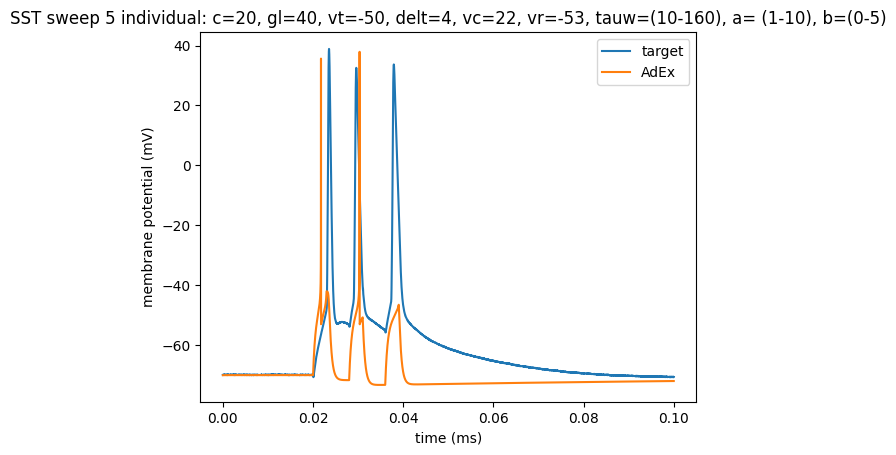

In [450]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_18[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=4, vc=22, vr=-53, tauw=(10-160), a= (1-10), b=(0-5)')

In [ ]:
sst_adex_s5_18_1 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=4, vc_var=22, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 8.1s

first fit:
Round 0: Best parameters a=8.82273358 nS, b=0.5413611 nA, tauw=76.62305978 ms (error: 442.10412766 mV^2)
Round 1: Best parameters a=8.43493334 nS, b=242.34278482 pA, tauw=141.14142572 ms (error: 321.90613827 mV^2)
Round 2: Best parameters a=9.1310452 nS, b=160.00718896 pA, tauw=65.5014025 ms (error: 274.25970968 mV^2)
Round 3: Best parameters a=8.82273358 nS, b=137.1565267 pA, tauw=60.05704871 ms (error: 261.68226332 mV^2)
Round 4: Best parameters a=8.06845402 nS, b=125.0803579 pA, tauw=108.29365177 ms (error: 258.06612586 mV^2)
Round 5: Best parameters a=3.27187583 nS, b=73.59289567 pA, tauw=30.54887892 ms (error: 252.87888914 mV^2)
Round 6: Best parameters a=9.05916376 nS, b=63.17144657 pA, tauw=64.60427988 ms (error: 246.18062196 mV^2)
Round 7: Best parameters a=8.63355928 nS, b=61.58595397 pA, tauw=41.83970119 ms (error: 234.63782309 mV^2)
Round 8: Best parameters a=8.63355928 nS, b=61.58595397 pA, tauw=41.83970119 ms (error: 234.63782309 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a= (1-10), b=(0-2)')

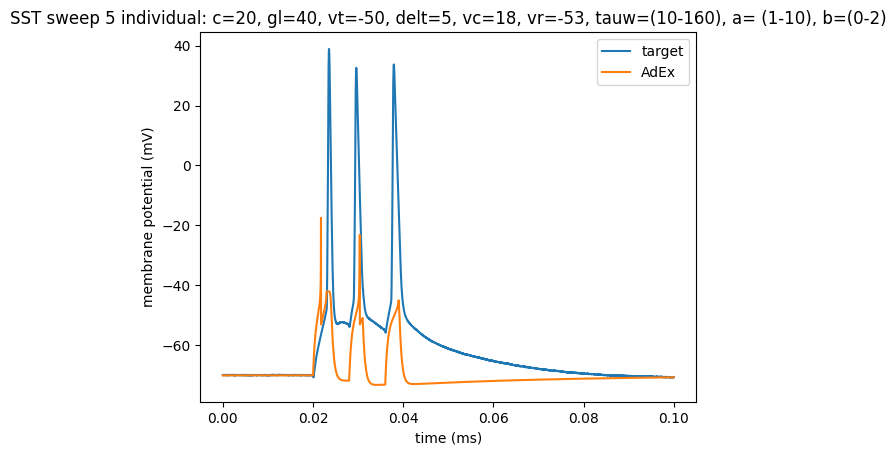

In [460]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_18_1[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a= (1-10), b=(0-2)')

In [ ]:
sst_adex_s5_18_2 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=4, vc_var=22, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 7.8s

first fit:
Round 0: Best parameters a=2.54684869 nS, b=0.52000326 nA, tauw=50.29366958 ms (error: 407.09023834 mV^2)
Round 1: Best parameters a=3.72932251 nS, b=0.39224038 nA, tauw=25.36306122 ms (error: 322.17898626 mV^2)
Round 2: Best parameters a=2.08929561 nS, b=193.79969758 pA, tauw=45.94547193 ms (error: 278.55497704 mV^2)
Round 3: Best parameters a=2.71070509 nS, b=217.15239353 pA, tauw=23.13738015 ms (error: 265.9012515 mV^2)
Round 4: Best parameters a=7.62760822 nS, b=156.67609019 pA, tauw=38.82080558 ms (error: 263.66110952 mV^2)
Round 5: Best parameters a=8.93926764 nS, b=133.93235815 pA, tauw=54.70168093 ms (error: 257.54802969 mV^2)
Round 6: Best parameters a=6.09593341 nS, b=90.95207581 pA, tauw=21.26022889 ms (error: 253.34753383 mV^2)
Round 7: Best parameters a=1.75727539 nS, b=69.93979781 pA, tauw=24.87126832 ms (error: 244.91944341 mV^2)
Round 8: Best parameters a=2.60748108 nS, b=65.34387441 pA, tauw=17.49457446 ms (error: 233.5577064 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a= (1-10), b=(0-2)')

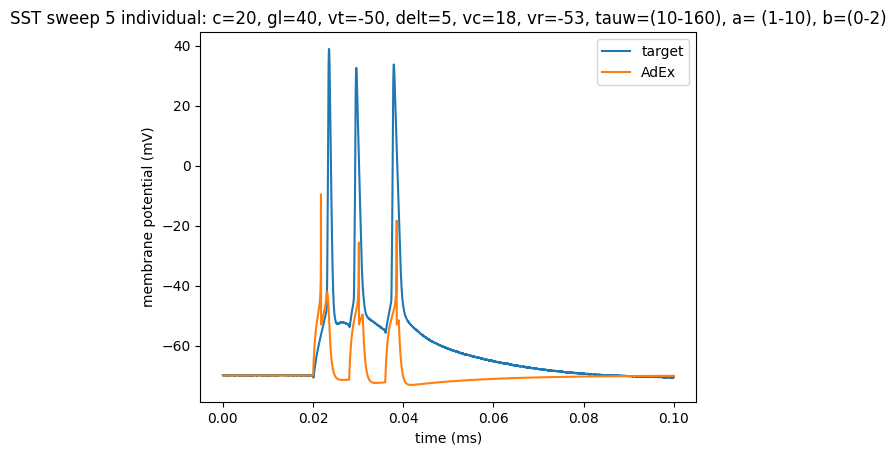

In [461]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_18_2[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a= (1-10), b=(0-2)')

In [ ]:
sst_adex_s5_18_3 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=4, vc_var=22, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 7.9s

first fit:
Round 0: Best parameters a=6.00200697 nS, b=0.51026119 nA, tauw=34.73635629 ms (error: 375.94894316 mV^2)
Round 1: Best parameters a=4.54331096 nS, b=283.40959735 pA, tauw=25.55188498 ms (error: 292.70307171 mV^2)
Round 2: Best parameters a=5.29490992 nS, b=242.35280546 pA, tauw=18.93915419 ms (error: 270.73938261 mV^2)
Round 3: Best parameters a=3.00143612 nS, b=168.02665672 pA, tauw=19.28601163 ms (error: 269.83566513 mV^2)
Round 4: Best parameters a=1.80420596 nS, b=108.36558672 pA, tauw=17.60987661 ms (error: 251.24928179 mV^2)
Round 5: Best parameters a=4.12436306 nS, b=85.89270245 pA, tauw=21.2758596 ms (error: 245.52806671 mV^2)
Round 6: Best parameters a=1.86528854 nS, b=69.09499414 pA, tauw=18.08867721 ms (error: 239.59234254 mV^2)
Round 7: Best parameters a=1.34233845 nS, b=67.58762433 pA, tauw=13.82993599 ms (error: 224.46178215 mV^2)
Round 8: Best parameters a=1.34233845 nS, b=67.58762433 pA, tauw=13.82993599 ms (error: 224.46178215 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

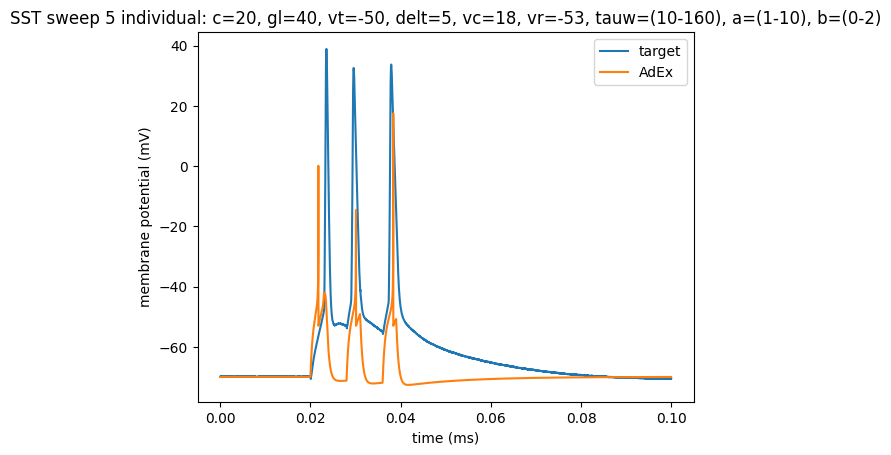

In [462]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_18_3[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

In [ ]:
sst_adex_s5_18_4 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=4, vc_var=22, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 7.9s

first fit:
Round 0: Best parameters a=7.48406185 nS, b=0.54857356 nA, tauw=65.71098022 ms (error: 435.36740406 mV^2)
Round 1: Best parameters a=7.39347965 nS, b=0.44877204 nA, tauw=26.02974049 ms (error: 339.63348874 mV^2)
Round 2: Best parameters a=2.81265248 nS, b=234.91618709 pA, tauw=25.73723828 ms (error: 277.30322815 mV^2)
Round 3: Best parameters a=2.30556829 nS, b=193.3797128 pA, tauw=28.03013744 ms (error: 261.29354816 mV^2)
Round 4: Best parameters a=1.87477003 nS, b=110.12063204 pA, tauw=23.40347617 ms (error: 260.23083328 mV^2)
Round 5: Best parameters a=1.49441535 nS, b=80.73580091 pA, tauw=30.30298502 ms (error: 242.56899856 mV^2)
Round 6: Best parameters a=1.87831572 nS, b=67.09420273 pA, tauw=21.71338407 ms (error: 233.22413096 mV^2)
Round 7: Best parameters a=1.87831572 nS, b=67.09420273 pA, tauw=21.71338407 ms (error: 233.22413096 mV^2)
Round 8: Best parameters a=1.87831572 nS, b=67.09420273 pA, tauw=21.71338407 ms (error: 233.22413096 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a= (1-10), b=(0-2)')

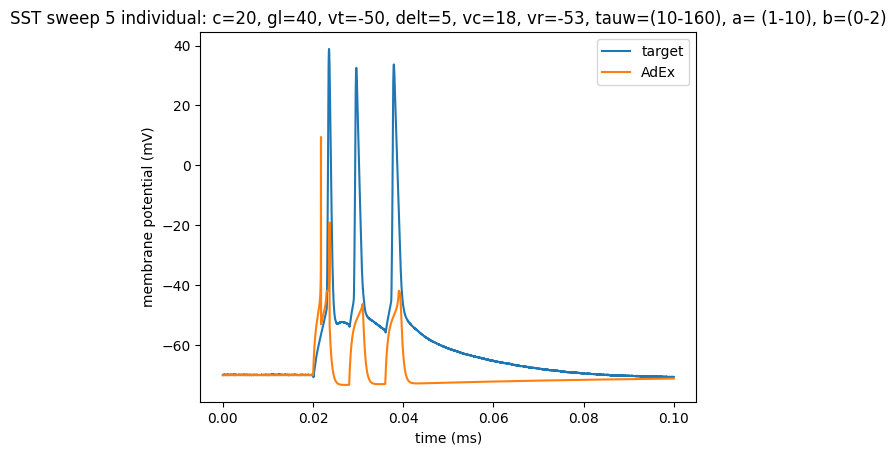

In [463]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_18_4[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a= (1-10), b=(0-2)')

In [ ]:
sst_adex_s5_18_4 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=4, vc_var=22, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 8s

first fit:
Round 0: Best parameters a=4.17591786 nS, b=0.69248911 nA, tauw=52.5986575 ms (error: 484.62348232 mV^2)
Round 1: Best parameters a=4.0762875 nS, b=0.5114082 nA, tauw=35.94790942 ms (error: 379.34074751 mV^2)
Round 2: Best parameters a=8.93652941 nS, b=295.14836928 pA, tauw=34.03222862 ms (error: 308.02393549 mV^2)
Round 3: Best parameters a=7.89169113 nS, b=193.13443935 pA, tauw=26.16085364 ms (error: 269.49802634 mV^2)
Round 4: Best parameters a=9.12478484 nS, b=147.65201427 pA, tauw=38.49120408 ms (error: 260.86664547 mV^2)
Round 5: Best parameters a=8.08057849 nS, b=135.53813482 pA, tauw=53.74094098 ms (error: 255.00498832 mV^2)
Round 6: Best parameters a=8.08057849 nS, b=135.53813482 pA, tauw=53.74094098 ms (error: 255.00498832 mV^2)
Round 7: Best parameters a=7.09562904 nS, b=66.24637962 pA, tauw=41.15946388 ms (error: 243.1209752 mV^2)
Round 8: Best parameters a=4.17056338 nS, b=66.42053813 pA, tauw=50.44205886 ms (error: 242.94055485 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

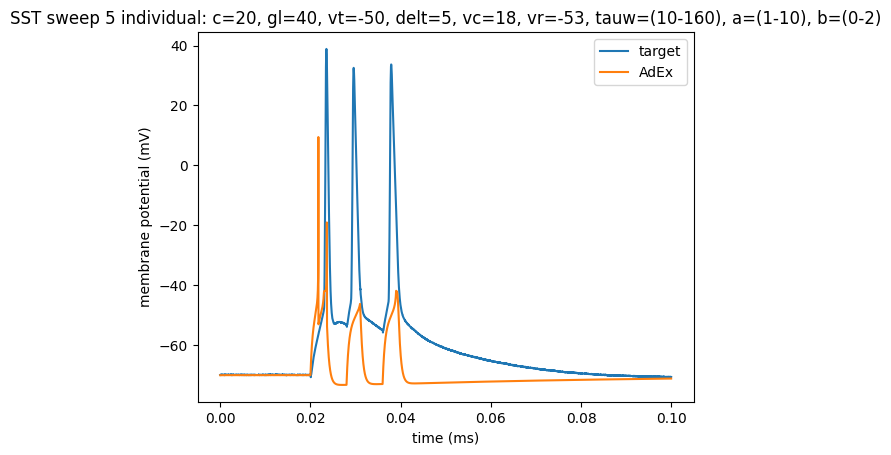

In [464]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_18_4[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=5, vc=18, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

In [ ]:
sst_adex_s5_18_5 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=4, vc_var=22, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 8s

first fit:
Round 0: Best parameters a=8.28315359 nS, b=0.53491332 nA, tauw=128.05301667 ms (error: 472.89368907 mV^2)
Round 1: Best parameters a=8.28315359 nS, b=286.50598919 pA, tauw=139.41469995 ms (error: 343.1417701 mV^2)
Round 2: Best parameters a=8.99782784 nS, b=190.27739476 pA, tauw=42.43043285 ms (error: 279.64309548 mV^2)
Round 3: Best parameters a=9.26492801 nS, b=122.79714906 pA, tauw=139.17733029 ms (error: 259.45493282 mV^2)
Round 4: Best parameters a=9.26492801 nS, b=122.79714906 pA, tauw=139.17733029 ms (error: 259.45493282 mV^2)
Round 5: Best parameters a=9.54079178 nS, b=66.45399913 pA, tauw=141.63765809 ms (error: 245.34016717 mV^2)
Round 6: Best parameters a=8.57249687 nS, b=62.64203169 pA, tauw=45.41304705 ms (error: 238.72750517 mV^2)
Round 7: Best parameters a=8.57249687 nS, b=62.64203169 pA, tauw=45.41304705 ms (error: 238.72750517 mV^2)
Round 8: Best parameters a=8.57249687 nS, b=62.64203169 pA, tauw=45.41304705 ms (error: 238.72750517 mV^2)
Round 9: Best param

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=4, vc=22, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

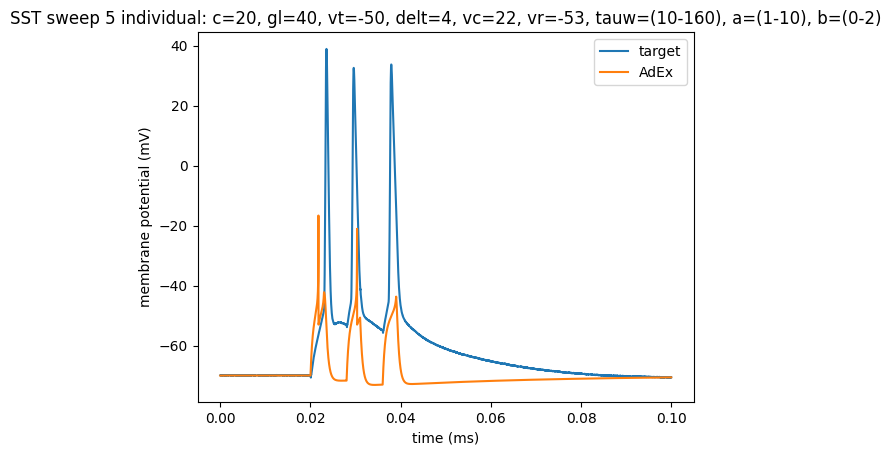

In [466]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_18_5[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=4, vc=22, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

In [ ]:
sst_adex_s5_19 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=3, vc_var=30, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 7.9s

first fit:
Round 0: Best parameters a=6.69285266 nS, b=0.56044201 nA, tauw=120.29824932 ms (error: 485.01307142 mV^2)
Round 1: Best parameters a=6.69285266 nS, b=0.32861444 nA, tauw=114.21669397 ms (error: 360.38365034 mV^2)
Round 2: Best parameters a=3.64562372 nS, b=295.16600892 pA, tauw=25.41641938 ms (error: 299.38952316 mV^2)
Round 3: Best parameters a=1.84448349 nS, b=170.2405309 pA, tauw=28.43099811 ms (error: 266.05333027 mV^2)
Round 4: Best parameters a=2.52109239 nS, b=98.62680226 pA, tauw=130.84164994 ms (error: 253.7332302 mV^2)
Round 5: Best parameters a=5.02890165 nS, b=94.31448113 pA, tauw=150.34957479 ms (error: 251.66235275 mV^2)
Round 6: Best parameters a=1.42153833 nS, b=69.34802208 pA, tauw=27.61173567 ms (error: 248.93735379 mV^2)
Round 7: Best parameters a=1.81551358 nS, b=52.30720275 pA, tauw=56.43298116 ms (error: 243.19054672 mV^2)
Round 8: Best parameters a=2.17509152 nS, b=36.5369382 pA, tauw=19.71064949 ms (error: 235.76365297 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a= (1-10), b=(0-2)')

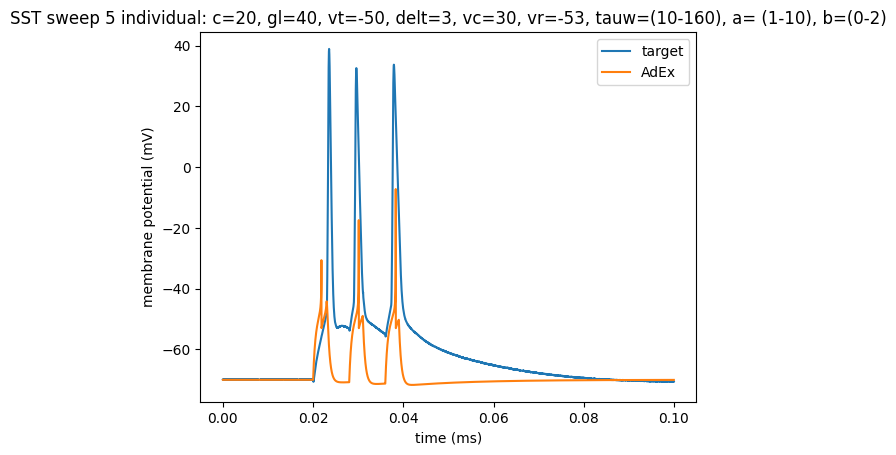

In [467]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_19[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a= (1-10), b=(0-2)')

In [ ]:
sst_adex_s5_20 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=20, vt_var= -50, delt_var=3, vc_var=30, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 7.8s

first fit:
Round 0: Best parameters a=3.0735225 nS, b=0.674858 nA, tauw=49.02697946 ms (error: 642.23939341 mV^2)
Round 1: Best parameters a=2.88831083 nS, b=0.56067665 nA, tauw=38.72675056 ms (error: 472.4032638 mV^2)
Round 2: Best parameters a=2.88831083 nS, b=0.56067665 nA, tauw=38.72675056 ms (error: 472.4032638 mV^2)
Round 3: Best parameters a=3.58536799 nS, b=259.581902 pA, tauw=22.43159628 ms (error: 449.70967837 mV^2)
Round 4: Best parameters a=6.29107641 nS, b=228.72561887 pA, tauw=21.20507123 ms (error: 406.87757301 mV^2)
Round 5: Best parameters a=2.74537974 nS, b=221.62778555 pA, tauw=20.92057703 ms (error: 394.33037013 mV^2)
Round 6: Best parameters a=8.3775191 nS, b=113.87695076 pA, tauw=16.02898695 ms (error: 353.37374853 mV^2)
Round 7: Best parameters a=8.4463954 nS, b=97.75451036 pA, tauw=15.15296175 ms (error: 317.1372132 mV^2)
Round 8: Best parameters a=7.20838896 nS, b=77.84230415 pA, tauw=15.79206831 ms (error: 297.44365355 mV^2)
Round 9: Best parameters a=8.982389

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=20, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

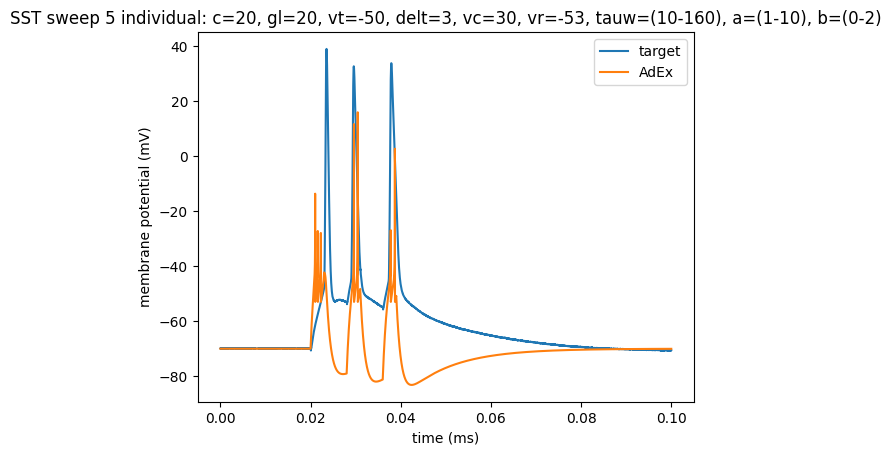

In [469]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_20[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=20, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

In [ ]:
sst_adex_s5_21 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=60, vt_var= -50, delt_var=3, vc_var=30, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 7.9

first fit:
Round 0: Best parameters a=2.11913637 nS, b=3.92873551 nA, tauw=134.25733559 ms (error: 267.82057383 mV^2)
Round 1: Best parameters a=1.50719354 nS, b=1.57475161 nA, tauw=136.55016671 ms (error: 267.72037879 mV^2)
Round 2: Best parameters a=1.30139623 nS, b=3.85534185 nA, tauw=137.09611031 ms (error: 267.68763775 mV^2)
Round 3: Best parameters a=1.19233913 nS, b=2.0235546 nA, tauw=143.50972173 ms (error: 267.66319296 mV^2)
Round 4: Best parameters a=1.17142526 nS, b=2.80019606 nA, tauw=150.45674686 ms (error: 267.65271051 mV^2)
Round 5: Best parameters a=1.12877833 nS, b=1.37144489 nA, tauw=151.8417646 ms (error: 267.64528949 mV^2)
Round 6: Best parameters a=1.09278617 nS, b=1.92967969 nA, tauw=153.01210068 ms (error: 267.6391205 mV^2)
Round 7: Best parameters a=1.05713186 nS, b=1.08168665 nA, tauw=152.25013948 ms (error: 267.63479888 mV^2)
Round 8: Best parameters a=1.05134945 nS, b=1.92465699 nA, tauw=154.72810505 ms (error: 267.63180382 mV^2)
Round 9: Best parameters a=1.

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=60, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

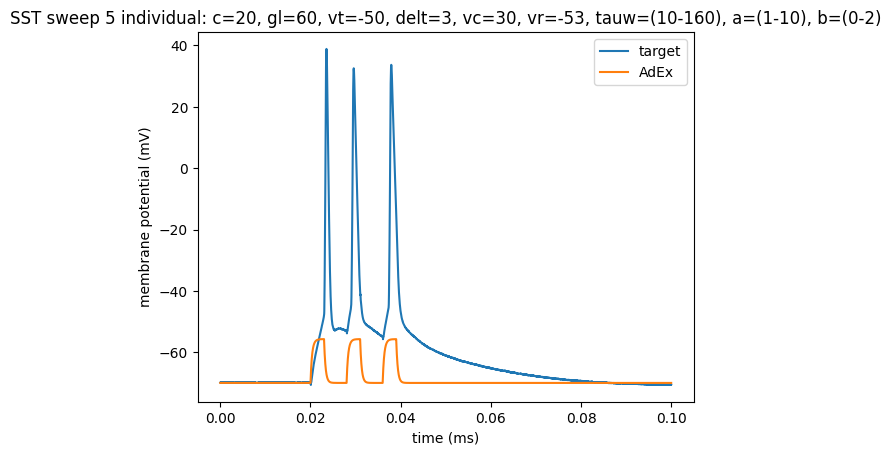

In [471]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_21[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=60, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-2)')

In [472]:
sst_adex_s5_22 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=50, vt_var= -50, delt_var=3, vc_var=30, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

first fit:
Round 0: Best parameters a=3.11033494 nS, b=3.85915959 nA, tauw=132.127725 ms (error: 249.37115981 mV^2)
Round 1: Best parameters a=2.13940345 nS, b=0.6140741 nA, tauw=132.63637031 ms (error: 249.12237636 mV^2)
Round 2: Best parameters a=1.80139764 nS, b=3.61264389 nA, tauw=144.2878558 ms (error: 249.00268263 mV^2)
Round 3: Best parameters a=1.50788671 nS, b=3.81781829 nA, tauw=147.56567742 ms (error: 248.92627708 mV^2)
Round 4: Best parameters a=1.35601365 nS, b=4.56133515 nA, tauw=149.95834183 ms (error: 248.88659598 mV^2)
Round 5: Best parameters a=1.26817564 nS, b=2.69818562 nA, tauw=152.6185368 ms (error: 248.86195874 mV^2)
Round 6: Best parameters a=1.20263097 nS, b=3.93653112 nA, tauw=154.19471195 ms (error: 248.8447274 mV^2)
Round 7: Best parameters a=1.16523958 nS, b=4.21120871 nA, tauw=155.84425407 ms (error: 248.833898 mV^2)
Round 8: Best parameters a=1.1161684 nS, b=1.49508207 nA, tauw=155.48655643 ms (error: 248.82362255 mV^2)
Round 9: Best parameters a=1.077680

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=50, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

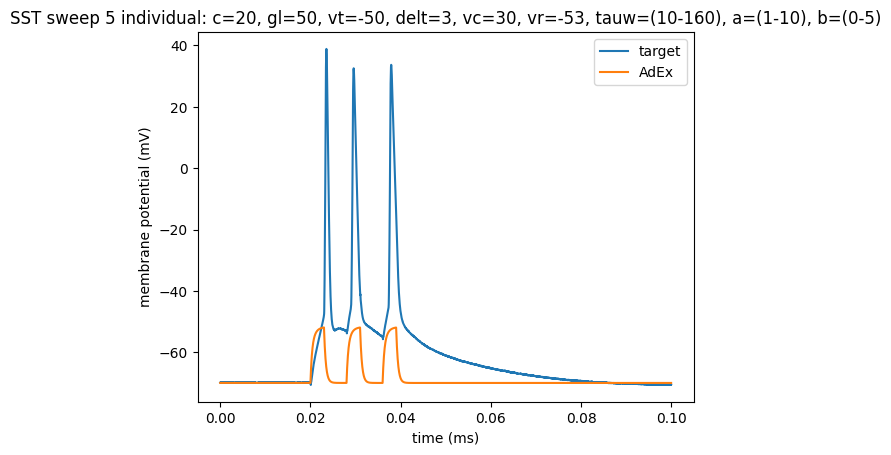

In [485]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_22[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=50, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [ ]:
sst_adex_s5_23 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=30, vt_var= -50, delt_var=3, vc_var=30, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 7.6

first fit:
Round 0: Best parameters a=3.76239503 nS, b=0.72165881 nA, tauw=38.15677649 ms (error: 504.52450855 mV^2)
Round 1: Best parameters a=2.98466892 nS, b=0.46414738 nA, tauw=24.17596074 ms (error: 327.03164265 mV^2)
Round 2: Best parameters a=2.98466892 nS, b=0.46414738 nA, tauw=24.17596074 ms (error: 327.03164265 mV^2)
Round 3: Best parameters a=2.58639776 nS, b=252.97931962 pA, tauw=22.69654428 ms (error: 315.119222 mV^2)
Round 4: Best parameters a=3.44482521 nS, b=250.16211378 pA, tauw=19.66889788 ms (error: 303.64765355 mV^2)
Round 5: Best parameters a=3.21551149 nS, b=277.62117837 pA, tauw=14.11965551 ms (error: 298.16488929 mV^2)
Round 6: Best parameters a=6.199938 nS, b=245.96303731 pA, tauw=14.84463505 ms (error: 283.6508605 mV^2)
Round 7: Best parameters a=6.199938 nS, b=245.96303731 pA, tauw=14.84463505 ms (error: 283.6508605 mV^2)
Round 8: Best parameters a=8.07419476 nS, b=241.68376032 pA, tauw=14.42267295 ms (error: 280.47347051 mV^2)
Round 9: Best parameters a=8.07

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=30, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

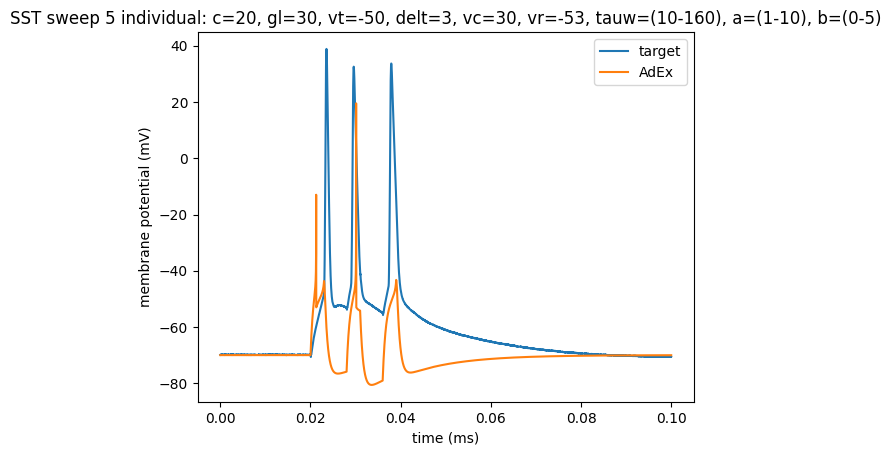

In [484]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_23[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=30, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [ ]:
sst_adex_s5_24 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=35, vt_var= -50, delt_var=3, vc_var=30, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 8.1s

first fit:
Round 0: Best parameters a=8.64247769 nS, b=0.61827202 nA, tauw=99.62777561 ms (error: 530.70789499 mV^2)
Round 1: Best parameters a=9.08677831 nS, b=0.32600113 nA, tauw=55.65273313 ms (error: 334.53657944 mV^2)
Round 2: Best parameters a=9.2125215 nS, b=241.06096373 pA, tauw=33.06990091 ms (error: 280.7369476 mV^2)
Round 3: Best parameters a=7.85522423 nS, b=147.4337428 pA, tauw=30.20849286 ms (error: 279.40374821 mV^2)
Round 4: Best parameters a=9.43465396 nS, b=144.81357618 pA, tauw=30.72820081 ms (error: 275.53512427 mV^2)
Round 5: Best parameters a=9.36326225 nS, b=141.43847517 pA, tauw=16.40108162 ms (error: 263.68280231 mV^2)
Round 6: Best parameters a=7.80903729 nS, b=142.79361016 pA, tauw=17.0897797 ms (error: 262.58025741 mV^2)
Round 7: Best parameters a=9.294832 nS, b=139.1265363 pA, tauw=16.62515805 ms (error: 261.62694952 mV^2)
Round 8: Best parameters a=3.35423307 nS, b=157.330025 pA, tauw=15.88726701 ms (error: 259.15529319 mV^2)
Round 9: Best parameters a=3.3

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=35, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

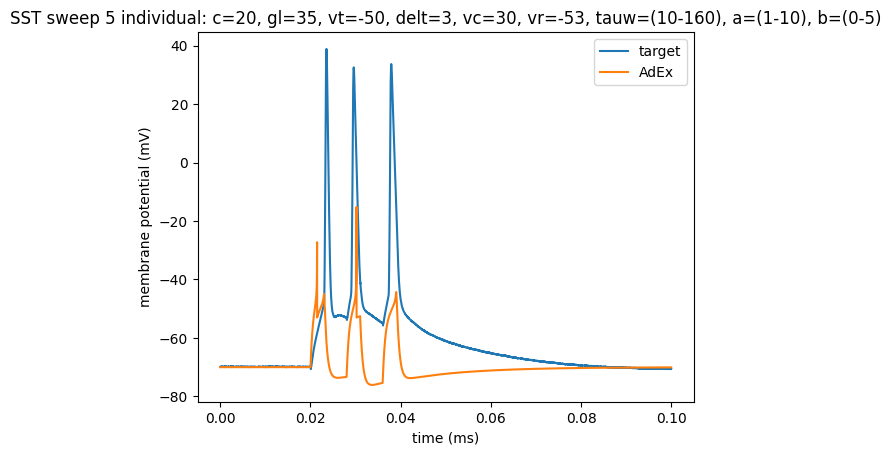

In [483]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_24[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=35, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [ ]:
sst_adex_s5_25 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=45, vt_var= -50, delt_var=3, vc_var=30, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 7.7

first fit:
Round 0: Best parameters a=3.40364836 nS, b=0.44916903 nA, tauw=84.41410212 ms (error: 397.0594055 mV^2)
Round 1: Best parameters a=8.23504475 nS, b=0.32935299 nA, tauw=44.986896 ms (error: 332.72183988 mV^2)
Round 2: Best parameters a=2.79201393 nS, b=219.64887599 pA, tauw=102.10401186 ms (error: 312.88212908 mV^2)
Round 3: Best parameters a=1.99027069 nS, b=184.3961543 pA, tauw=77.4557163 ms (error: 296.9832194 mV^2)
Round 4: Best parameters a=3.06809894 nS, b=197.13789907 pA, tauw=36.06913628 ms (error: 291.3144733 mV^2)
Round 5: Best parameters a=3.9849457 nS, b=173.93357478 pA, tauw=52.20538768 ms (error: 289.45598395 mV^2)
Round 6: Best parameters a=3.9849457 nS, b=173.93357478 pA, tauw=52.20538768 ms (error: 289.45598395 mV^2)
Round 7: Best parameters a=3.9849457 nS, b=173.93357478 pA, tauw=52.20538768 ms (error: 289.45598395 mV^2)
Round 8: Best parameters a=4.40460436 nS, b=160.28771537 pA, tauw=45.08464443 ms (error: 284.19611419 mV^2)
Round 9: Best parameters a=4.4

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=45, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

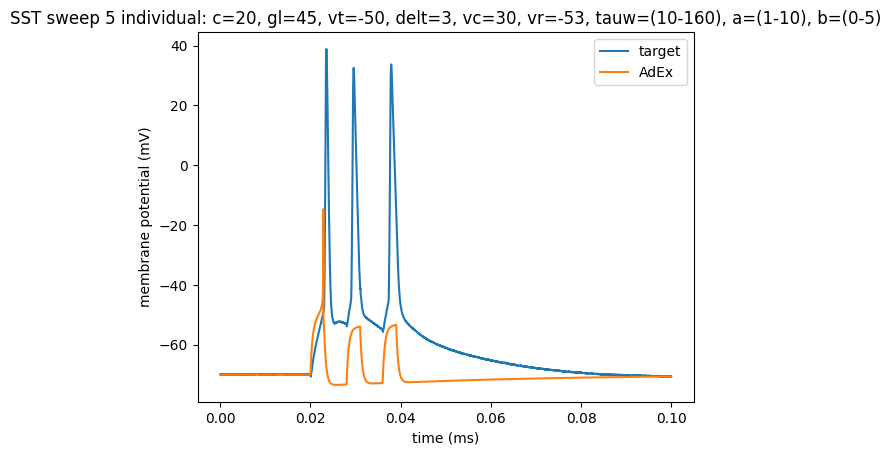

In [482]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_25[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=45, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [ ]:
sst_adex_s5_26 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=3, vc_var=30, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 7.5s

first fit:
Round 0: Best parameters a=5.50399403 nS, b=0.70050266 nA, tauw=27.52098868 ms (error: 419.77246398 mV^2)
Round 1: Best parameters a=8.72451587 nS, b=0.44325442 nA, tauw=25.90596746 ms (error: 340.51158372 mV^2)
Round 2: Best parameters a=8.05207211 nS, b=268.36096359 pA, tauw=27.18058455 ms (error: 297.31294251 mV^2)
Round 3: Best parameters a=8.63408042 nS, b=168.16931392 pA, tauw=30.54468895 ms (error: 273.38604103 mV^2)
Round 4: Best parameters a=7.18592709 nS, b=121.01892983 pA, tauw=33.38318125 ms (error: 258.40926082 mV^2)
Round 5: Best parameters a=9.09771065 nS, b=93.32115399 pA, tauw=67.07370049 ms (error: 248.94744589 mV^2)
Round 6: Best parameters a=5.76952083 nS, b=64.98555606 pA, tauw=19.05731727 ms (error: 248.92259513 mV^2)
Round 7: Best parameters a=5.42319649 nS, b=59.90384238 pA, tauw=18.9033929 ms (error: 243.62789358 mV^2)
Round 8: Best parameters a=1.57288948 nS, b=44.31573711 pA, tauw=16.85084367 ms (error: 238.35911038 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

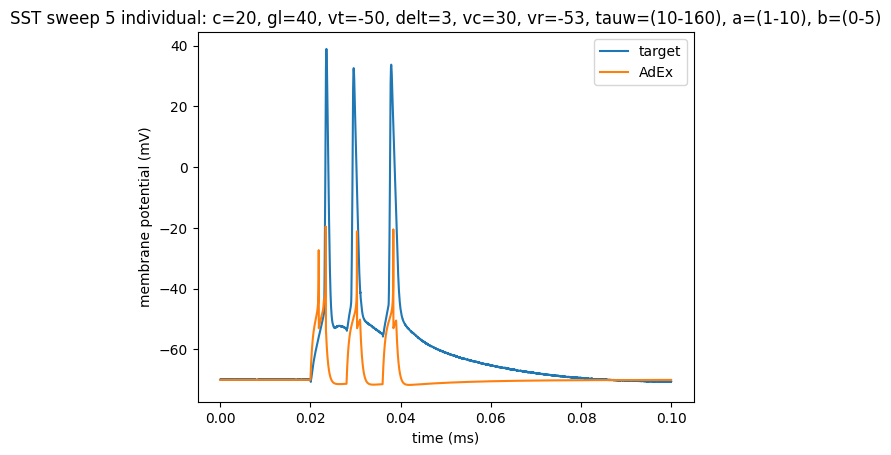

In [492]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_26[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=3, vc=30, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [ ]:
sst_adex_s5_27 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=2, vc_var=20, round_num=20, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# 14.9s

first fit:
Round 0: Best parameters a=7.01078214 nS, b=0.50507513 nA, tauw=86.64192471 ms (error: 434.2235898 mV^2)
Round 1: Best parameters a=8.58587027 nS, b=0.36792783 nA, tauw=24.29567417 ms (error: 320.35165197 mV^2)
Round 2: Best parameters a=9.34154022 nS, b=228.20552226 pA, tauw=25.64326795 ms (error: 289.50525338 mV^2)
Round 3: Best parameters a=9.139982 nS, b=145.11202128 pA, tauw=33.40606055 ms (error: 272.72959633 mV^2)
Round 4: Best parameters a=9.54846173 nS, b=91.43665623 pA, tauw=19.89975521 ms (error: 256.31337942 mV^2)
Round 5: Best parameters a=9.347411 nS, b=63.49179074 pA, tauw=24.2395704 ms (error: 249.11614164 mV^2)
Round 6: Best parameters a=9.42147574 nS, b=53.90861475 pA, tauw=25.74372872 ms (error: 245.2355422 mV^2)
Round 7: Best parameters a=8.94654941 nS, b=54.926901 pA, tauw=18.59121812 ms (error: 243.94538811 mV^2)
Round 8: Best parameters a=8.94654941 nS, b=54.926901 pA, tauw=18.59121812 ms (error: 243.94538811 mV^2)
Round 9: Best parameters a=4.48601304

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

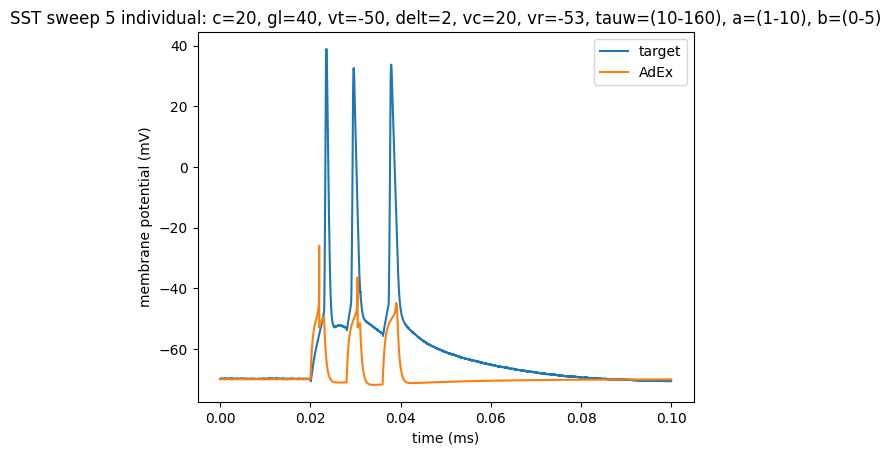

In [493]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_27[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [491]:
sst_adex_s5_27_1 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=2, vc_var=20, round_num=20, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

first fit:
Round 0: Best parameters a=7.05698975 nS, b=0.49219057 nA, tauw=113.48376214 ms (error: 443.02807186 mV^2)
Round 1: Best parameters a=7.83120436 nS, b=0.34375008 nA, tauw=40.06468371 ms (error: 332.89632061 mV^2)
Round 2: Best parameters a=3.13791146 nS, b=210.34948011 pA, tauw=45.18206675 ms (error: 292.88034505 mV^2)
Round 3: Best parameters a=6.24443356 nS, b=175.16533875 pA, tauw=24.06819238 ms (error: 273.5701327 mV^2)
Round 4: Best parameters a=6.24443356 nS, b=118.49748776 pA, tauw=23.47457134 ms (error: 259.70757717 mV^2)
Round 5: Best parameters a=7.83256884 nS, b=78.31111535 pA, tauw=18.89502307 ms (error: 249.9514097 mV^2)
Round 6: Best parameters a=8.2745786 nS, b=65.17659509 pA, tauw=18.21452527 ms (error: 245.88936974 mV^2)
Round 7: Best parameters a=2.75017716 nS, b=46.08156102 pA, tauw=23.23496575 ms (error: 245.01472283 mV^2)
Round 8: Best parameters a=2.59729049 nS, b=48.44301327 pA, tauw=17.66325957 ms (error: 242.15853153 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

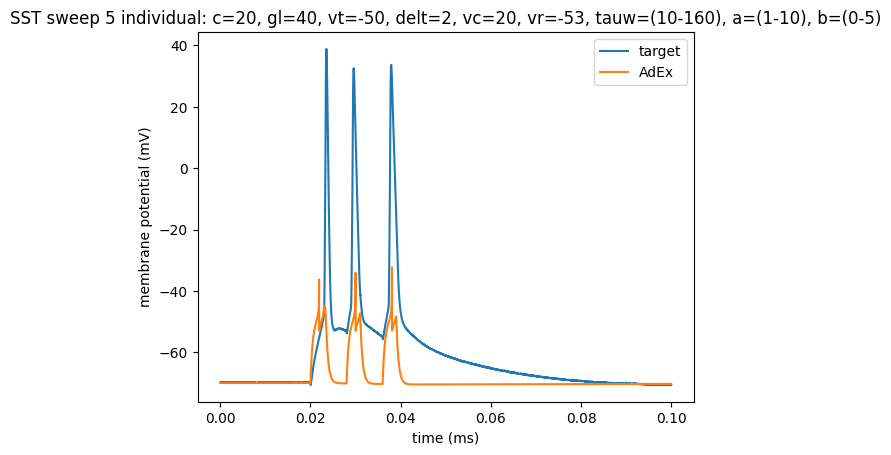

In [494]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_27_1[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [490]:
sst_adex_s5_27_2 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=2, vc_var=20, round_num=20, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

first fit:
Round 0: Best parameters a=1.90355066 nS, b=0.49259174 nA, tauw=117.02353657 ms (error: 447.4208163 mV^2)
Round 1: Best parameters a=1.6633615 nS, b=288.08005761 pA, tauw=137.69099413 ms (error: 346.58103786 mV^2)
Round 2: Best parameters a=1.66715372 nS, b=207.97688879 pA, tauw=58.28489073 ms (error: 296.21835315 mV^2)
Round 3: Best parameters a=1.41890484 nS, b=111.21736166 pA, tauw=64.83327974 ms (error: 263.26800757 mV^2)
Round 4: Best parameters a=1.41890484 nS, b=75.57231823 pA, tauw=133.88899667 ms (error: 252.16453503 mV^2)
Round 5: Best parameters a=1.96142535 nS, b=80.92638233 pA, tauw=52.77789546 ms (error: 248.8810658 mV^2)
Round 6: Best parameters a=1.4935982 nS, b=52.88848268 pA, tauw=21.41003469 ms (error: 245.88343942 mV^2)
Round 7: Best parameters a=1.24634935 nS, b=54.46275212 pA, tauw=17.35621623 ms (error: 242.01384226 mV^2)
Round 8: Best parameters a=1.21558958 nS, b=54.46275212 pA, tauw=17.35621623 ms (error: 241.43024059 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

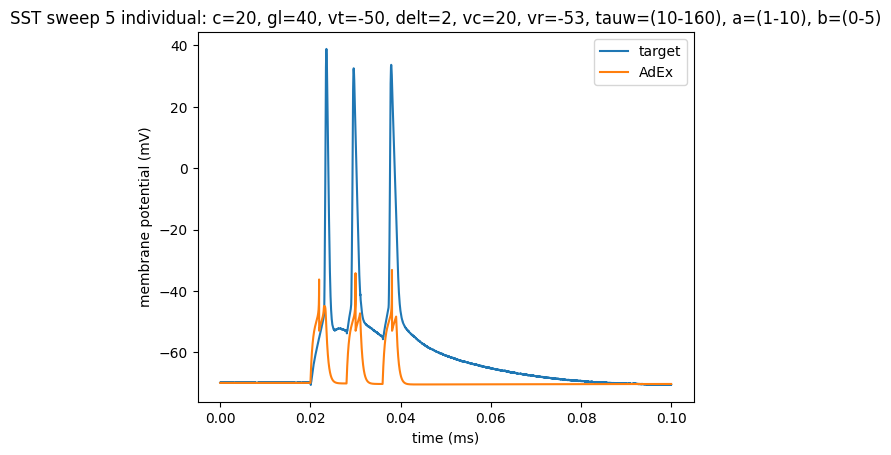

In [495]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_27_2[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [489]:
sst_adex_s5_27_3 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=2, vc_var=20, round_num=20, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

first fit:
Round 0: Best parameters a=8.06937546 nS, b=0.55455903 nA, tauw=32.82975764 ms (error: 387.66131282 mV^2)
Round 1: Best parameters a=8.94774563 nS, b=283.6259841 pA, tauw=23.79835115 ms (error: 300.14089338 mV^2)
Round 2: Best parameters a=8.09583305 nS, b=204.97935599 pA, tauw=21.39376975 ms (error: 279.78383311 mV^2)
Round 3: Best parameters a=3.04159931 nS, b=179.87115063 pA, tauw=15.73649548 ms (error: 263.55473794 mV^2)
Round 4: Best parameters a=3.04159931 nS, b=149.06147172 pA, tauw=14.78788026 ms (error: 254.84721195 mV^2)
Round 5: Best parameters a=4.46005583 nS, b=123.89444063 pA, tauw=15.21082555 ms (error: 251.41351702 mV^2)
Round 6: Best parameters a=4.46005583 nS, b=123.89444063 pA, tauw=15.21082555 ms (error: 251.41351702 mV^2)
Round 7: Best parameters a=8.06937546 nS, b=82.34087189 pA, tauw=12.1478202 ms (error: 248.20631799 mV^2)
Round 8: Best parameters a=1.61655555 nS, b=67.89929723 pA, tauw=12.32884842 ms (error: 244.5329112 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

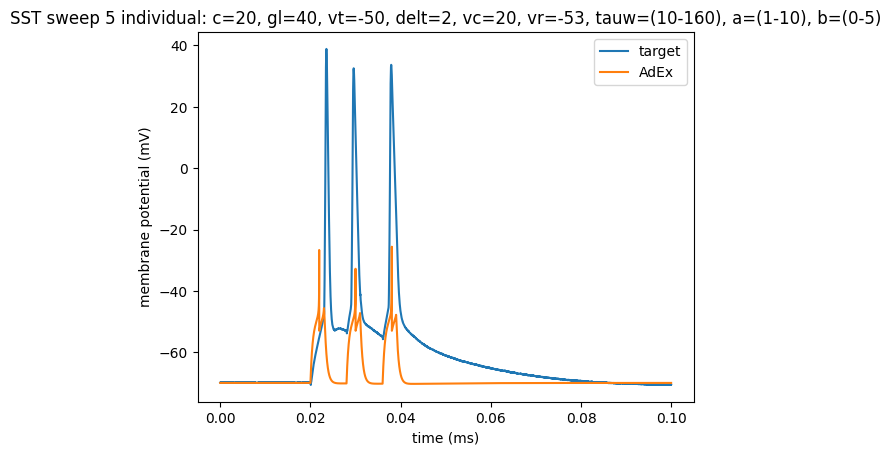

In [496]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_27_3[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [488]:
sst_adex_s5_27_4 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=20, gl_var=40, vt_var= -50, delt_var=2, vc_var=20, round_num=20, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

first fit:
Round 0: Best parameters a=5.77350962 nS, b=0.66045211 nA, tauw=42.91152568 ms (error: 448.67254861 mV^2)
Round 1: Best parameters a=6.32997454 nS, b=0.39400178 nA, tauw=34.27154396 ms (error: 341.1801972 mV^2)
Round 2: Best parameters a=6.21241917 nS, b=266.2151661 pA, tauw=25.28062155 ms (error: 296.12756049 mV^2)
Round 3: Best parameters a=4.49398321 nS, b=172.28539121 pA, tauw=22.98049862 ms (error: 270.79485261 mV^2)
Round 4: Best parameters a=3.32246917 nS, b=117.86125708 pA, tauw=23.29240794 ms (error: 255.72550765 mV^2)
Round 5: Best parameters a=2.01024296 nS, b=90.24778499 pA, tauw=35.27182417 ms (error: 247.90148241 mV^2)
Round 6: Best parameters a=2.01024296 nS, b=90.24778499 pA, tauw=35.27182417 ms (error: 247.90148241 mV^2)
Round 7: Best parameters a=2.01024296 nS, b=90.24778499 pA, tauw=35.27182417 ms (error: 247.90148241 mV^2)
Round 8: Best parameters a=2.13809287 nS, b=56.38848828 pA, tauw=17.75188607 ms (error: 246.43236636 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

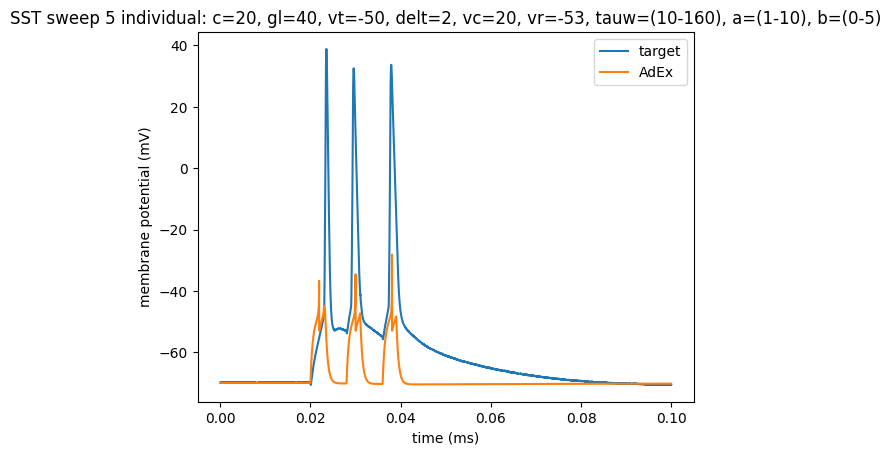

In [497]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_27_4[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=20, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [ ]:
sst_adex_s5_28 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=40, gl_var=40, vt_var= -50, delt_var=2, vc_var=20, round_num=20, \
                          tauw_min=10 , vr=-53, a_max=10, b_max=5)

# tt: 14.8s

first fit:
Round 0: Best parameters a=2.31629166 nS, b=0.65583858 nA, tauw=129.93387856 ms (error: 224.4718509 mV^2)
Round 1: Best parameters a=1.85710193 nS, b=3.54153879 nA, tauw=132.5747353 ms (error: 224.30181779 mV^2)
Round 2: Best parameters a=1.53886026 nS, b=4.56419823 nA, tauw=150.76620892 ms (error: 224.13589581 mV^2)
Round 3: Best parameters a=1.34983047 nS, b=2.22001662 nA, tauw=150.08930716 ms (error: 224.08040099 mV^2)
Round 4: Best parameters a=1.2651714 nS, b=0.8352629 nA, tauw=154.01031778 ms (error: 224.0456717 mV^2)
Round 5: Best parameters a=1.19568298 nS, b=171.03613882 pA, tauw=153.92971102 ms (error: 224.02520891 mV^2)
Round 6: Best parameters a=1.13617127 nS, b=0.38869344 nA, tauw=153.95184865 ms (error: 224.00748022 mV^2)
Round 7: Best parameters a=1.08722387 nS, b=3.85326189 nA, tauw=155.35185459 ms (error: 223.99025559 mV^2)
Round 8: Best parameters a=1.07049889 nS, b=236.44670372 pA, tauw=156.95899249 ms (error: 223.98235101 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=40, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

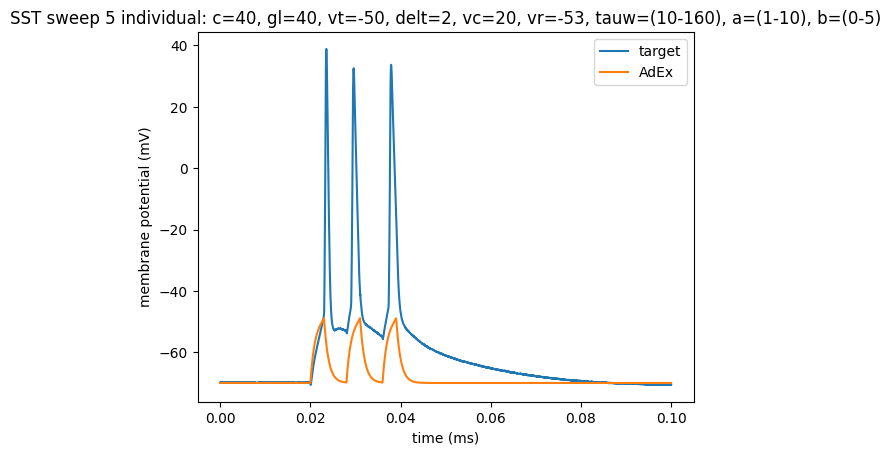

In [499]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=40, gl=40, vt=-50, delt=2, vc=20, vr=-53, tauw=(10-160), a=(1-10), b=(0-5)')

In [502]:
# changing el:

def run_adex_all_params(input_data, output_data, c_min=10, c_max=300, gl_min=5, gl_max=40, el=-50, vt_var=-50, delt_var=2, vc_var=5, vr=-70, round_num=20,
             tauw_min=120, tauw_max=160, a_min=1, a_max=4, b_min=0, b_max=0.5):

    # Parameters
    # C = c_var * pF
    # gL = gl_var * nS
    # taum = C / gL
    El = el * mV
    VT = vt_var * mV
    DeltaT = delt_var * mV
    Vcut = VT + vc_var * DeltaT
    Vr = vr*mV

    model = """
    dv/dt = (gL*(El - v) + gL*DeltaT*exp((v - VT)/DeltaT) + I - w)/C : volt
    dw/dt = (a*(v - El) - w)/tauw : amp

    C : farad (constant)
    gL : siemens (constant)
    tauw : second (constant)
    a : siemens (constant)
    b : amp (constant)
    """

    opt = NevergradOptimizer()
    metric = MSEMetric()

    fitter = TraceFitter(model=model,
                        input_var='I',
                        output_var='v',
                        input = input_data * amp,
                        output = output_data * mV,
                        dt= 0.02 * ms,
                        n_samples=100,
                        method='exponential_euler',
                        reset='v=Vr; w+=b',
                        threshold='v>Vcut',
                        # refractory=refrac*ms,
                        param_init={'v': -70*mV})

    np.float = float

    print('first fit:')
    res, error = fitter.fit(n_rounds=round_num,
                            optimizer=opt,
                            metric=metric,
                            C=[c_min*pF, c_max*pF],
                            gL=[gl_min*nS, gl_max*nS],
                            # VT=[vt_min*mV, vt_max*mV],
                            tauw=[tauw_min*ms, tauw_max*ms],
                            a=[a_min*nsiemens, a_max*nsiemens],
                            b=[b_min*nA, b_max*nA])

    traces = fitter.generate_traces()

    
    return traces

In [ ]:
sst_adex_s5_28 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out)

# tt: 15.4s

first fit:
Round 0: Best parameters C=260.91724843 pF, a=1.45390982 nS, b=0.35247669 nA, gL=13.04785894 nS, tauw=151.3803033 ms (error: 248.19263696 mV^2)
Round 1: Best parameters C=195.21899467 pF, a=1.41432318 nS, b=250.25753747 pA, gL=8.71446133 nS, tauw=150.88361652 ms (error: 225.81760824 mV^2)
Round 2: Best parameters C=195.21899467 pF, a=1.41432318 nS, b=250.25753747 pA, gL=8.71446133 nS, tauw=150.88361652 ms (error: 225.81760824 mV^2)
Round 3: Best parameters C=203.39604254 pF, a=1.48678084 nS, b=210.64074028 pA, gL=8.60586917 nS, tauw=155.70642251 ms (error: 221.31535083 mV^2)
Round 4: Best parameters C=251.12276403 pF, a=1.3688313 nS, b=204.34340765 pA, gL=8.19265089 nS, tauw=153.41129831 ms (error: 219.61082602 mV^2)
Round 5: Best parameters C=251.12276403 pF, a=1.3688313 nS, b=204.34340765 pA, gL=8.19265089 nS, tauw=153.41129831 ms (error: 219.61082602 mV^2)
Round 6: Best parameters C=251.12276403 pF, a=1.3688313 nS, b=204.34340765 pA, gL=8.19265089 nS, tauw=153.41129831 ms

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(5-40), el=-50, vt=-50, delt=2, vc=5, vr=-70, tauw=(120-160), a=(1-4), b=(0-0.5)')

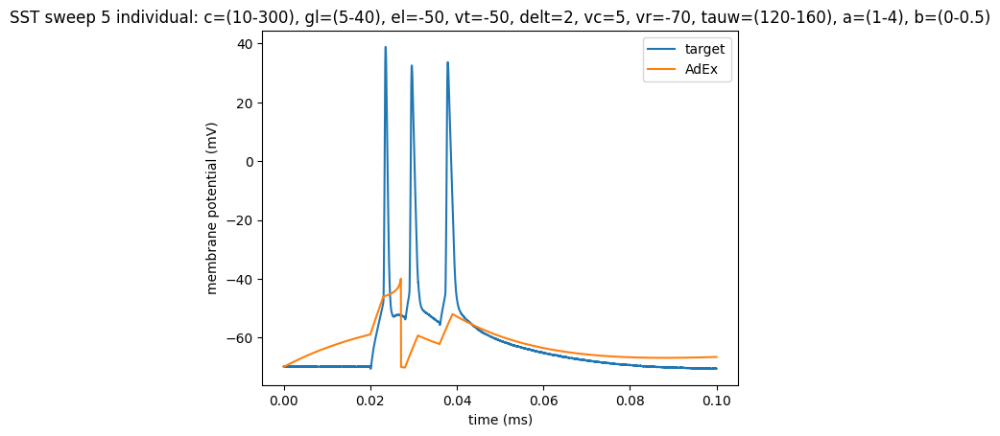

In [504]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(5-40), el=-50, vt=-50, delt=2, vc=5, vr=-70, tauw=(120-160), a=(1-4), b=(0-0.5)')

In [ ]:
sst_adex_s5_28_1 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 15.7s

first fit:
Round 0: Best parameters C=127.99320902 pF, a=1.86892815 nS, b=0.51293041 nA, gL=16.88943838 nS, tauw=38.95888032 ms (error: 173.04479286 mV^2)
Round 1: Best parameters C=127.99320902 pF, a=1.86892815 nS, b=0.51293041 nA, gL=16.88943838 nS, tauw=38.95888032 ms (error: 173.04479286 mV^2)
Round 2: Best parameters C=127.99320902 pF, a=1.86892815 nS, b=0.51293041 nA, gL=16.88943838 nS, tauw=38.95888032 ms (error: 173.04479286 mV^2)
Round 3: Best parameters C=127.99320902 pF, a=1.86892815 nS, b=0.51293041 nA, gL=16.88943838 nS, tauw=38.95888032 ms (error: 173.04479286 mV^2)
Round 4: Best parameters C=127.99320902 pF, a=1.86892815 nS, b=0.51293041 nA, gL=16.88943838 nS, tauw=38.95888032 ms (error: 173.04479286 mV^2)
Round 5: Best parameters C=127.99320902 pF, a=1.86892815 nS, b=0.51293041 nA, gL=16.88943838 nS, tauw=38.95888032 ms (error: 173.04479286 mV^2)
Round 6: Best parameters C=123.65916978 pF, a=3.05149688 nS, b=0.43337221 nA, gL=16.77471668 nS, tauw=35.78582475 ms (error: 

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

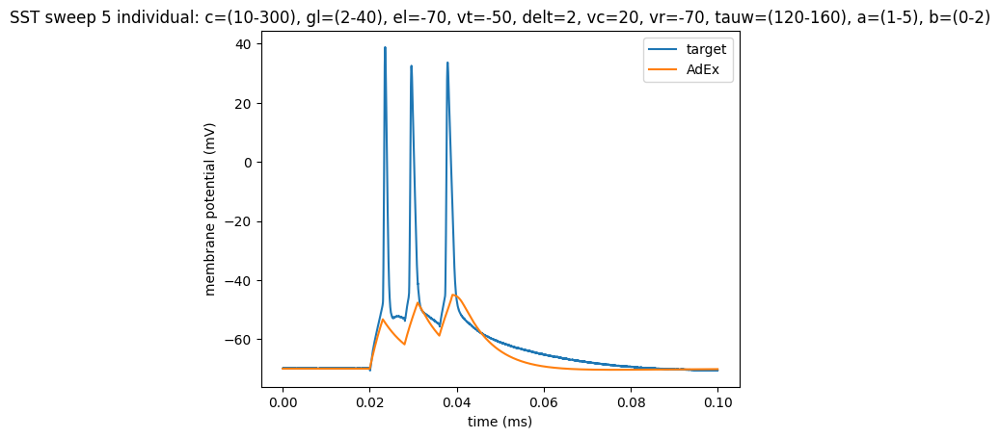

In [514]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28_1[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_28_2 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 14.8s

first fit:
Round 0: Best parameters C=101.59979536 pF, a=2.38068791 nS, b=1.53640864 nA, gL=20.19818824 nS, tauw=136.56482316 ms (error: 175.88409221 mV^2)
Round 1: Best parameters C=129.3971619 pF, a=3.60276148 nS, b=1.33328729 nA, gL=16.32937285 nS, tauw=59.33698017 ms (error: 172.42617614 mV^2)
Round 2: Best parameters C=129.3971619 pF, a=3.60276148 nS, b=1.33328729 nA, gL=16.32937285 nS, tauw=59.33698017 ms (error: 172.42617614 mV^2)
Round 3: Best parameters C=129.3971619 pF, a=3.60276148 nS, b=1.33328729 nA, gL=16.32937285 nS, tauw=59.33698017 ms (error: 172.42617614 mV^2)
Round 4: Best parameters C=129.3971619 pF, a=3.60276148 nS, b=1.33328729 nA, gL=16.32937285 nS, tauw=59.33698017 ms (error: 172.42617614 mV^2)
Round 5: Best parameters C=129.3971619 pF, a=3.60276148 nS, b=1.33328729 nA, gL=16.32937285 nS, tauw=59.33698017 ms (error: 172.42617614 mV^2)
Round 6: Best parameters C=129.3971619 pF, a=3.60276148 nS, b=1.33328729 nA, gL=16.32937285 nS, tauw=59.33698017 ms (error: 172.4

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

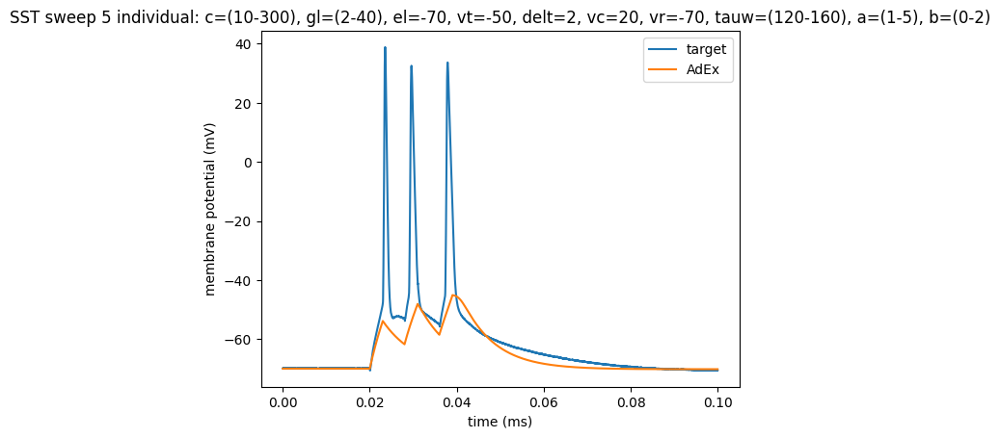

In [515]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28_2[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_28_3 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 15.1s

first fit:
Round 0: Best parameters C=130.03374957 pF, a=3.24566303 nS, b=0.86202024 nA, gL=16.50289305 nS, tauw=92.14102956 ms (error: 172.30716383 mV^2)
Round 1: Best parameters C=130.03374957 pF, a=3.24566303 nS, b=0.86202024 nA, gL=16.50289305 nS, tauw=92.14102956 ms (error: 172.30716383 mV^2)
Round 2: Best parameters C=130.03374957 pF, a=3.24566303 nS, b=0.86202024 nA, gL=16.50289305 nS, tauw=92.14102956 ms (error: 172.30716383 mV^2)
Round 3: Best parameters C=130.03374957 pF, a=3.24566303 nS, b=0.86202024 nA, gL=16.50289305 nS, tauw=92.14102956 ms (error: 172.30716383 mV^2)
Round 4: Best parameters C=130.03374957 pF, a=3.24566303 nS, b=0.86202024 nA, gL=16.50289305 nS, tauw=92.14102956 ms (error: 172.30716383 mV^2)
Round 5: Best parameters C=130.03374957 pF, a=3.24566303 nS, b=0.86202024 nA, gL=16.50289305 nS, tauw=92.14102956 ms (error: 172.30716383 mV^2)
Round 6: Best parameters C=130.03374957 pF, a=3.24566303 nS, b=0.86202024 nA, gL=16.50289305 nS, tauw=92.14102956 ms (error: 

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

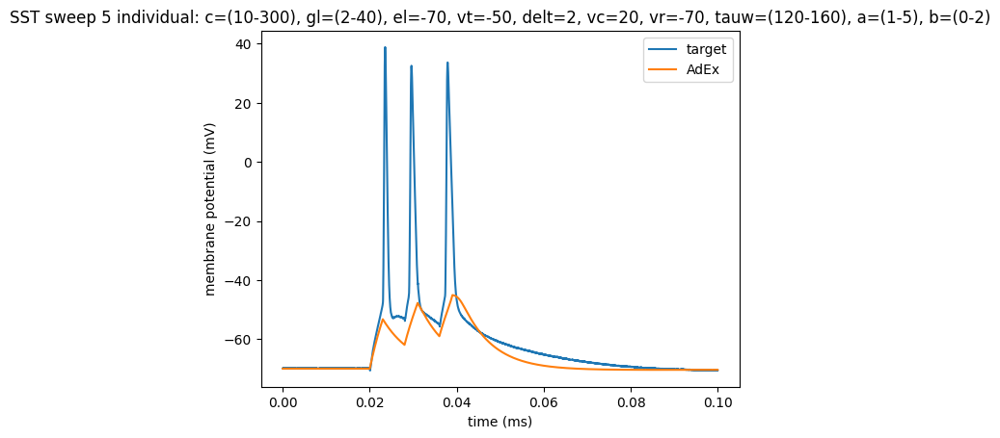

In [516]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28_3[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_28_4 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 13.9s

first fit:
Round 0: Best parameters C=178.44180515 pF, a=4.25974923 nS, b=1.13615633 nA, gL=12.32388001 nS, tauw=74.13637178 ms (error: 178.62420614 mV^2)
Round 1: Best parameters C=137.3356184 pF, a=2.87210973 nS, b=0.7768098 nA, gL=16.22371374 nS, tauw=53.3911128 ms (error: 174.66779577 mV^2)
Round 2: Best parameters C=99.75092913 pF, a=4.45802736 nS, b=0.77439139 nA, gL=19.79774469 nS, tauw=106.36549519 ms (error: 173.72273282 mV^2)
Round 3: Best parameters C=125.00358236 pF, a=2.02670741 nS, b=1.50341501 nA, gL=17.52883617 nS, tauw=119.85541632 ms (error: 173.24826174 mV^2)
Round 4: Best parameters C=112.26424149 pF, a=2.20907317 nS, b=0.96668452 nA, gL=18.54416976 nS, tauw=119.82694015 ms (error: 172.05071194 mV^2)
Round 5: Best parameters C=112.26424149 pF, a=2.20907317 nS, b=0.96668452 nA, gL=18.54416976 nS, tauw=119.82694015 ms (error: 172.05071194 mV^2)
Round 6: Best parameters C=116.27064279 pF, a=1.71427856 nS, b=1.01969552 nA, gL=18.15810415 nS, tauw=124.92174591 ms (error:

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

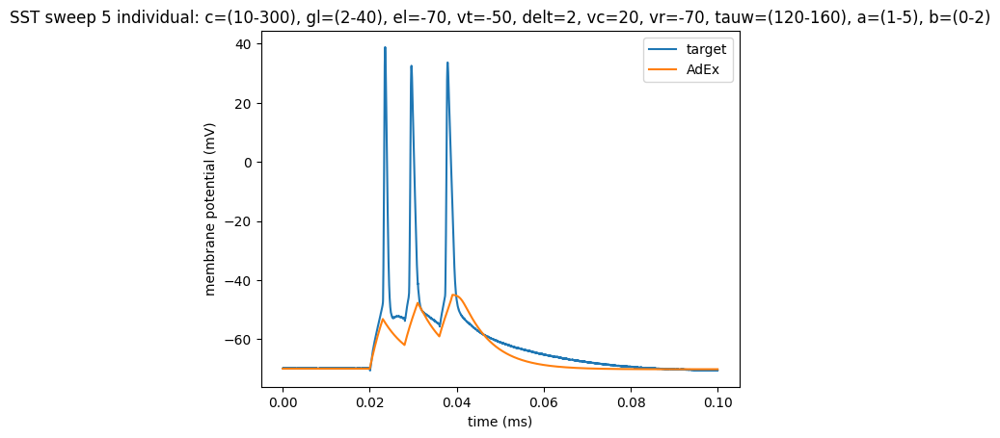

In [517]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28_4[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_28_5 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 15.1s

first fit:
Round 0: Best parameters C=154.69388117 pF, a=2.8322083 nS, b=1.41493186 nA, gL=15.35547819 nS, tauw=124.99964988 ms (error: 176.81019396 mV^2)
Round 1: Best parameters C=144.79423941 pF, a=1.77789874 nS, b=0.50352296 nA, gL=15.77991874 nS, tauw=136.28589815 ms (error: 174.01645919 mV^2)
Round 2: Best parameters C=144.79423941 pF, a=1.77211128 nS, b=0.59604269 nA, gL=15.77991874 nS, tauw=145.21943087 ms (error: 173.98293725 mV^2)
Round 3: Best parameters C=144.79423941 pF, a=1.77211128 nS, b=0.59604269 nA, gL=15.77991874 nS, tauw=145.21943087 ms (error: 173.98293725 mV^2)
Round 4: Best parameters C=120.88210614 pF, a=3.35331763 nS, b=0.38426548 nA, gL=17.71757185 nS, tauw=152.95075559 ms (error: 172.55620096 mV^2)
Round 5: Best parameters C=120.88210614 pF, a=3.35331763 nS, b=0.38426548 nA, gL=17.71757185 nS, tauw=152.95075559 ms (error: 172.55620096 mV^2)
Round 6: Best parameters C=124.40333107 pF, a=1.2881887 nS, b=1.69222117 nA, gL=17.43585513 nS, tauw=154.32281737 ms (er

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

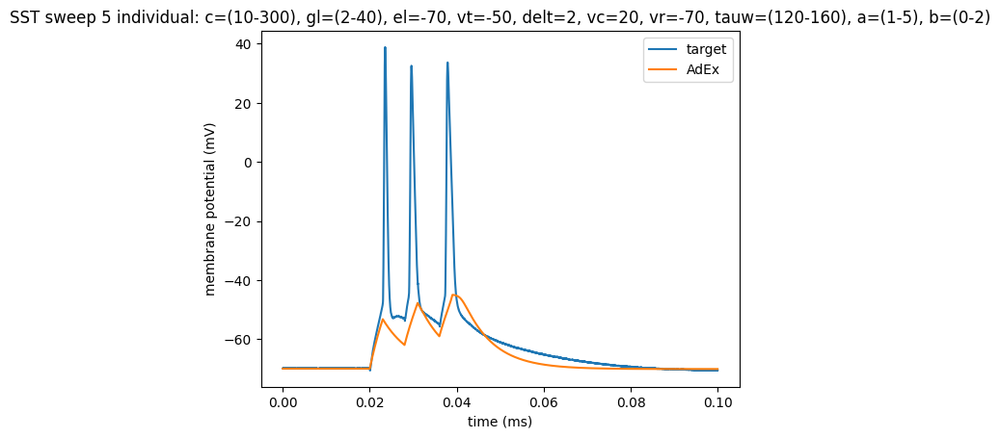

In [518]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28_5[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_28_6 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 14.7s

first fit:
Round 0: Best parameters C=121.25491076 pF, a=2.33314795 nS, b=1.54114188 nA, gL=17.75330166 nS, tauw=97.34961932 ms (error: 173.03179645 mV^2)
Round 1: Best parameters C=121.25491076 pF, a=2.33314795 nS, b=1.54114188 nA, gL=17.75330166 nS, tauw=97.34961932 ms (error: 173.03179645 mV^2)
Round 2: Best parameters C=121.25491076 pF, a=2.33314795 nS, b=1.54114188 nA, gL=17.75330166 nS, tauw=97.34961932 ms (error: 173.03179645 mV^2)
Round 3: Best parameters C=115.69256494 pF, a=3.07449786 nS, b=1.64566212 nA, gL=18.18638542 nS, tauw=114.31366593 ms (error: 172.70926989 mV^2)
Round 4: Best parameters C=115.69256494 pF, a=3.07449786 nS, b=1.64566212 nA, gL=18.18638542 nS, tauw=114.31366593 ms (error: 172.70926989 mV^2)
Round 5: Best parameters C=115.69256494 pF, a=3.07449786 nS, b=1.64566212 nA, gL=18.18638542 nS, tauw=114.31366593 ms (error: 172.70926989 mV^2)
Round 6: Best parameters C=115.69256494 pF, a=3.07449786 nS, b=1.64566212 nA, gL=18.18638542 nS, tauw=114.31366593 ms (err

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

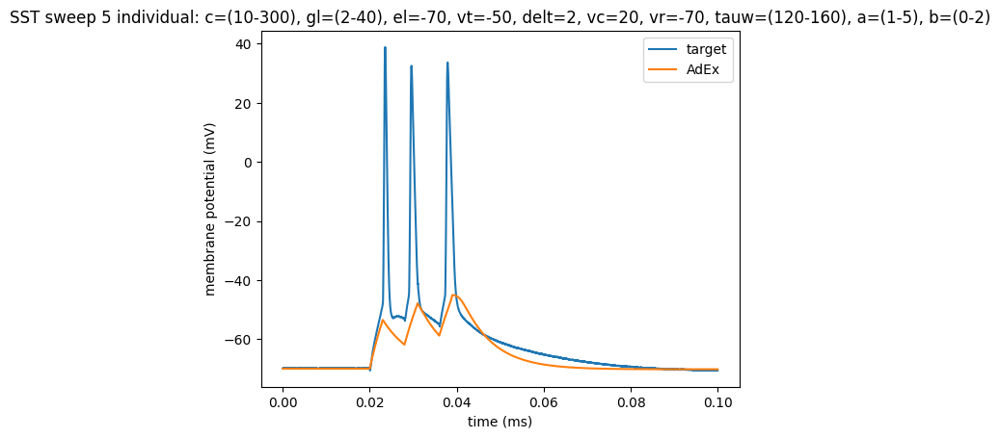

In [519]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28_6[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_28_7 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 14s

first fit:
Round 0: Best parameters C=157.56628701 pF, a=3.17095709 nS, b=0.95028519 nA, gL=14.16878228 nS, tauw=132.2765277 ms (error: 175.06386137 mV^2)
Round 1: Best parameters C=137.7588234 pF, a=3.29998294 nS, b=0.44198194 nA, gL=16.0427564 nS, tauw=65.35927861 ms (error: 173.98045267 mV^2)
Round 2: Best parameters C=137.7588234 pF, a=3.29998294 nS, b=0.44198194 nA, gL=16.0427564 nS, tauw=65.35927861 ms (error: 173.98045267 mV^2)
Round 3: Best parameters C=137.7588234 pF, a=3.29998294 nS, b=0.44198194 nA, gL=16.0427564 nS, tauw=65.35927861 ms (error: 173.98045267 mV^2)
Round 4: Best parameters C=137.7588234 pF, a=3.29998294 nS, b=0.44198194 nA, gL=16.0427564 nS, tauw=65.35927861 ms (error: 173.98045267 mV^2)
Round 5: Best parameters C=148.16794883 pF, a=2.32870364 nS, b=0.39230575 nA, gL=15.1756868 nS, tauw=134.558429 ms (error: 173.64224098 mV^2)
Round 6: Best parameters C=133.81997632 pF, a=3.09679848 nS, b=0.65671258 nA, gL=16.33287554 nS, tauw=147.45090734 ms (error: 172.29680

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

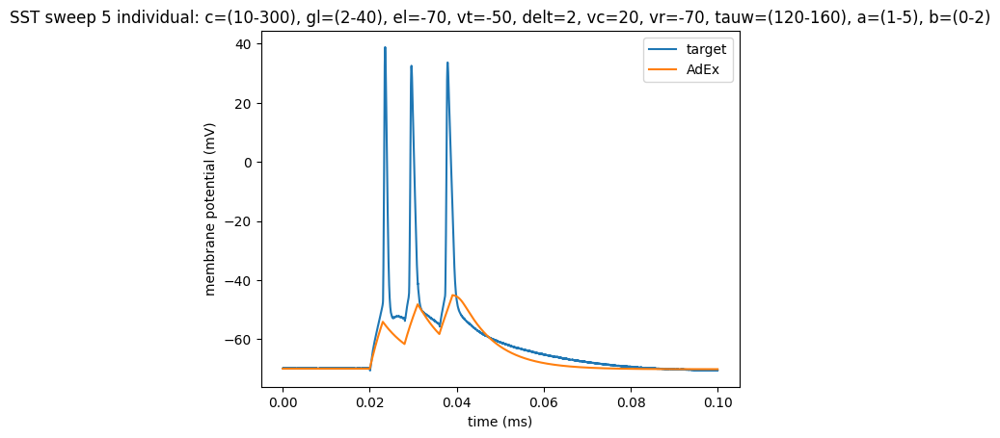

In [520]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28_7[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_28_8 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 14.1s

first fit:
Round 0: Best parameters C=163.42420069 pF, a=3.45731989 nS, b=1.57868119 nA, gL=13.87501247 nS, tauw=103.00004124 ms (error: 175.99702054 mV^2)
Round 1: Best parameters C=163.42420069 pF, a=3.45731989 nS, b=1.57868119 nA, gL=13.87501247 nS, tauw=103.00004124 ms (error: 175.99702054 mV^2)
Round 2: Best parameters C=163.42420069 pF, a=3.45731989 nS, b=1.57868119 nA, gL=13.87501247 nS, tauw=123.94637505 ms (error: 175.94395047 mV^2)
Round 3: Best parameters C=163.42420069 pF, a=3.45731989 nS, b=1.57868119 nA, gL=13.87501247 nS, tauw=123.94637505 ms (error: 175.94395047 mV^2)
Round 4: Best parameters C=154.12048759 pF, a=3.16330349 nS, b=1.72899931 nA, gL=13.94024824 nS, tauw=30.50077623 ms (error: 174.32787443 mV^2)
Round 5: Best parameters C=154.12048759 pF, a=3.16330349 nS, b=1.72899931 nA, gL=13.94024824 nS, tauw=30.50077623 ms (error: 174.32787443 mV^2)
Round 6: Best parameters C=154.12048759 pF, a=3.16330349 nS, b=1.72899931 nA, gL=13.94024824 nS, tauw=30.50077623 ms (err

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

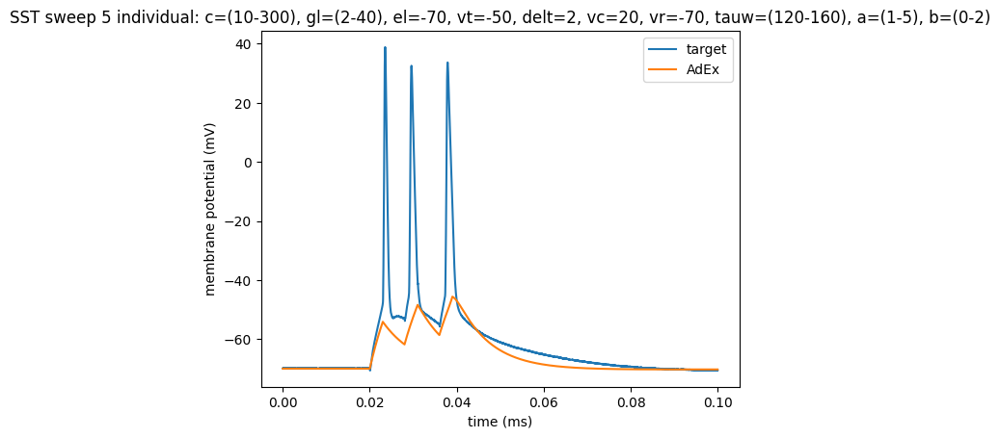

In [521]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28_8[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_28_9 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 14.5s

first fit:
Round 0: Best parameters C=169.38092615 pF, a=3.81226873 nS, b=1.11421889 nA, gL=13.3889866 nS, tauw=118.19520121 ms (error: 177.02796993 mV^2)
Round 1: Best parameters C=130.77362523 pF, a=3.85660435 nS, b=1.16109468 nA, gL=16.61732234 nS, tauw=134.98914296 ms (error: 172.42059177 mV^2)
Round 2: Best parameters C=130.77362523 pF, a=3.85660435 nS, b=1.16109468 nA, gL=16.61732234 nS, tauw=134.98914296 ms (error: 172.42059177 mV^2)
Round 3: Best parameters C=130.77362523 pF, a=3.85660435 nS, b=1.16109468 nA, gL=16.61732234 nS, tauw=134.98914296 ms (error: 172.42059177 mV^2)
Round 4: Best parameters C=130.77362523 pF, a=3.85660435 nS, b=1.16109468 nA, gL=16.61732234 nS, tauw=134.98914296 ms (error: 172.42059177 mV^2)
Round 5: Best parameters C=115.38317328 pF, a=2.70614437 nS, b=0.46160839 nA, gL=18.16039123 nS, tauw=133.08577376 ms (error: 171.91617268 mV^2)
Round 6: Best parameters C=115.38317328 pF, a=2.70614437 nS, b=0.46160839 nA, gL=18.16039123 nS, tauw=133.08577376 ms (e

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

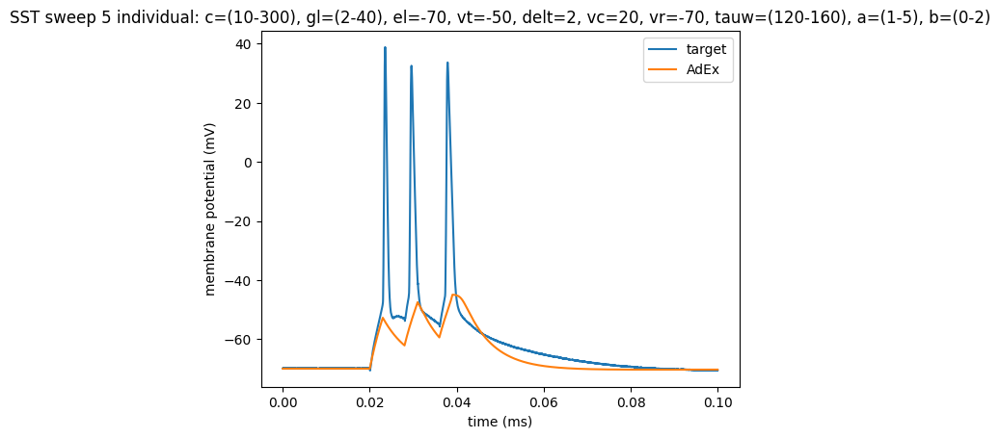

In [522]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_28_9[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_29 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vt_var=-58, vc_var=20, tauw_min=10, a_max=5, b_max=2)

# tt: 16s

first fit:
Round 0: Best parameters C=198.97419618 pF, a=2.64300161 nS, b=0.35475314 nA, gL=29.45904735 nS, tauw=123.94582484 ms (error: 223.9423386 mV^2)
Round 1: Best parameters C=219.36301801 pF, a=1.63700284 nS, b=1.21502229 nA, gL=27.59396112 nS, tauw=108.30325662 ms (error: 223.73250978 mV^2)
Round 2: Best parameters C=231.48146288 pF, a=1.59778315 nS, b=1.20445679 nA, gL=25.69737616 nS, tauw=68.58176248 ms (error: 220.96685972 mV^2)
Round 3: Best parameters C=231.48146288 pF, a=1.59778315 nS, b=1.20445679 nA, gL=25.69737616 nS, tauw=68.58176248 ms (error: 220.96685972 mV^2)
Round 4: Best parameters C=231.48146288 pF, a=1.59778315 nS, b=1.20445679 nA, gL=25.69737616 nS, tauw=68.58176248 ms (error: 220.96685972 mV^2)
Round 5: Best parameters C=262.16092051 pF, a=1.39510156 nS, b=1.33312478 nA, gL=22.57445732 nS, tauw=136.16880905 ms (error: 220.48402043 mV^2)
Round 6: Best parameters C=262.16092051 pF, a=1.39510156 nS, b=1.33312478 nA, gL=22.57445732 nS, tauw=136.16880905 ms (erro

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-58, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

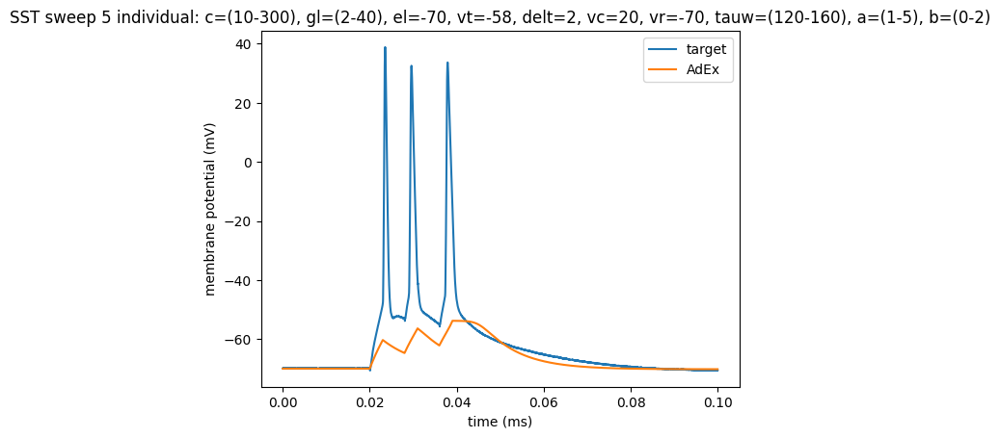

In [524]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_29[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-58, delt=2, vc=20, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_30 = run_adex_all_params(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_min=2, el=-70, vt_var=-50,\
                                     delt_var=3, vc_var=15, tauw_min=10, a_max=5, b_max=2)

# tt: 15.7s

first fit:
Round 0: Best parameters C=95.18913312 pF, a=3.86721118 nS, b=0.76531856 nA, gL=20.27899234 nS, tauw=122.73457079 ms (error: 170.52281088 mV^2)
Round 1: Best parameters C=137.66773766 pF, a=4.07826089 nS, b=1.21432247 nA, gL=15.20250255 nS, tauw=95.09860245 ms (error: 170.20718522 mV^2)
Round 2: Best parameters C=137.66773766 pF, a=4.07826089 nS, b=1.21432247 nA, gL=15.20250255 nS, tauw=95.09860245 ms (error: 170.20718522 mV^2)
Round 3: Best parameters C=137.66773766 pF, a=4.07826089 nS, b=1.21432247 nA, gL=15.3102081 nS, tauw=95.09860245 ms (error: 169.96067948 mV^2)
Round 4: Best parameters C=137.66773766 pF, a=4.07826089 nS, b=1.21432247 nA, gL=15.3102081 nS, tauw=95.09860245 ms (error: 169.96067948 mV^2)
Round 5: Best parameters C=137.66773766 pF, a=4.07826089 nS, b=1.21432247 nA, gL=15.3102081 nS, tauw=95.09860245 ms (error: 169.96067948 mV^2)
Round 6: Best parameters C=137.66773766 pF, a=4.07826089 nS, b=1.21432247 nA, gL=15.3102081 nS, tauw=95.09860245 ms (error: 169.

Text(0.5, 1.0, 'SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=3, vc=15, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

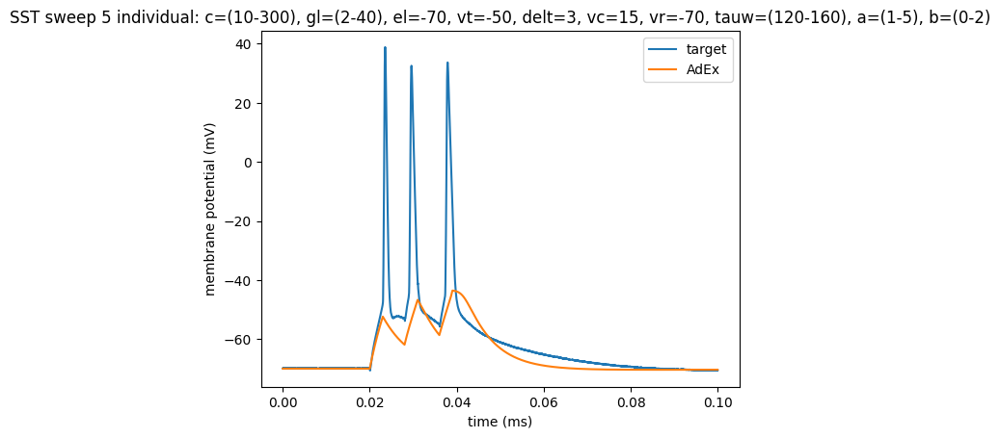

In [526]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_30[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=(10-300), gl=(2-40), el=-70, vt=-50, delt=3, vc=15, vr=-70, tauw=(120-160), a=(1-5), b=(0-2)')

In [ ]:
sst_adex_s5_31 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_var=15, vt_var=-50,\
                                     delt_var=3, vc_var=15, a_max=3, b_max=0.001)

# tt: 7.7s

first fit:
Round 0: Best parameters a=1.18624814 nS, b=0.57502616 pA, tauw=147.41030141 ms (error: 190.70385351 mV^2)
Round 1: Best parameters a=1.16249292 nS, b=126.08846134 fA, tauw=153.31391816 ms (error: 190.54656538 mV^2)
Round 2: Best parameters a=1.06420871 nS, b=0.32836666 pA, tauw=155.6248502 ms (error: 190.48515829 mV^2)
Round 3: Best parameters a=1.07368562 nS, b=90.45398329 fA, tauw=157.48280389 ms (error: 190.43390298 mV^2)
Round 4: Best parameters a=1.03693877 nS, b=106.27869615 fA, tauw=157.17759927 ms (error: 190.40846032 mV^2)
Round 5: Best parameters a=1.02656073 nS, b=78.88626619 fA, tauw=157.89229693 ms (error: 190.39129372 mV^2)
Round 6: Best parameters a=1.02067402 nS, b=60.17411714 fA, tauw=158.53380065 ms (error: 190.38010252 mV^2)
Round 7: Best parameters a=1.01304355 nS, b=43.76346811 fA, tauw=158.77642769 ms (error: 190.37010459 mV^2)
Round 8: Best parameters a=1.01218046 nS, b=31.79031079 fA, tauw=159.07108597 ms (error: 190.36578095 mV^2)
Round 9: Best para

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, gl=15, el=-70, vt=-50, delt=3, vc=15, vr=-70, tauw=(120-160), a=(1-3), b=(0-0.001)')

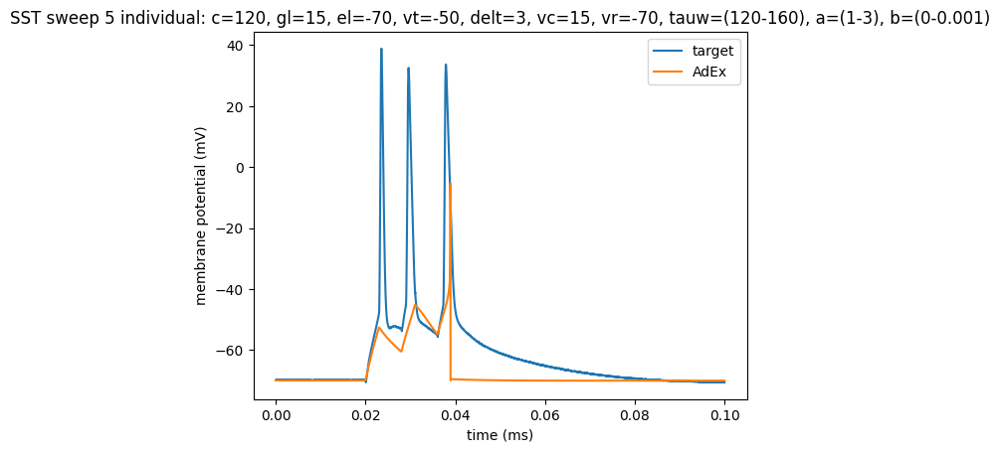

In [529]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_31[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=120, gl=15, el=-70, vt=-50, delt=3, vc=15, vr=-70, tauw=(120-160), a=(1-3), b=(0-0.001)')

In [ ]:
sst_adex_s5_32 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_var=15, vt_var=-50,\
                                     delt_var=3, vc_var=15, a_max=4, b_max=0.05)

# tt: 8.2s


first fit:
Round 0: Best parameters a=1.53633803 nS, b=9.43239633 pA, tauw=129.53266613 ms (error: 192.83816431 mV^2)
Round 1: Best parameters a=1.36190069 nS, b=4.74509897 pA, tauw=141.5598267 ms (error: 191.82196116 mV^2)
Round 2: Best parameters a=1.54529333 nS, b=2.19755416 pA, tauw=140.76233613 ms (error: 191.45743541 mV^2)
Round 3: Best parameters a=1.65152295 nS, b=1.79410733 pA, tauw=144.70508282 ms (error: 191.09487253 mV^2)
Round 4: Best parameters a=1.31438655 nS, b=1.30116675 pA, tauw=154.90770598 ms (error: 190.92502102 mV^2)
Round 5: Best parameters a=1.22043813 nS, b=0.93637815 pA, tauw=157.22355533 ms (error: 190.74397421 mV^2)
Round 6: Best parameters a=1.16582508 nS, b=0.71619198 pA, tauw=158.02812692 ms (error: 190.64242544 mV^2)
Round 7: Best parameters a=1.1305437 nS, b=0.54223867 pA, tauw=158.52973999 ms (error: 190.57134436 mV^2)
Round 8: Best parameters a=1.09230872 nS, b=0.4259453 pA, tauw=158.32364867 ms (error: 190.51486916 mV^2)
Round 9: Best parameters a=1.

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, gl=15, el=-70, vt=-50, delt=3, vc=15, vr=-70, tauw=(120-160), a=(1-4), b=(0-0.05)')

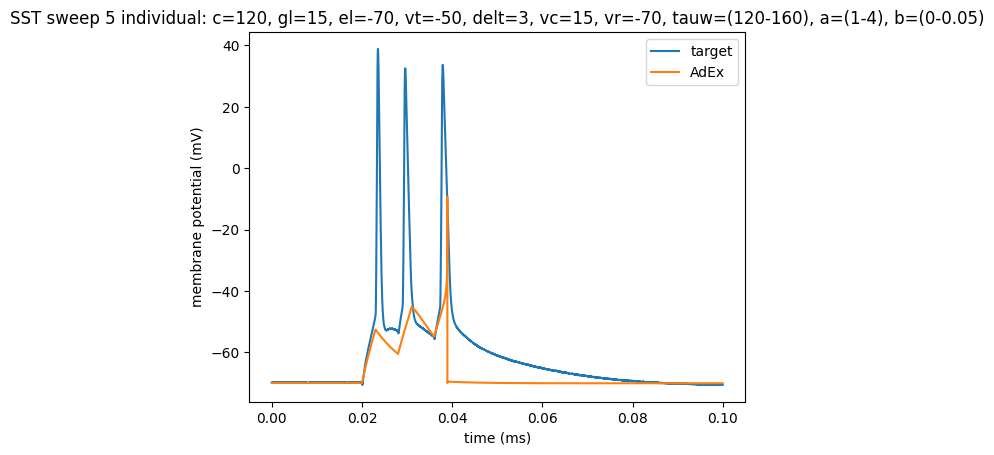

In [534]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_32[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=120, gl=15, el=-70, vt=-50, delt=3, vc=15, vr=-70, tauw=(120-160), a=(1-4), b=(0-0.05)')

In [ ]:
sst_adex_s5_33 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=4, b_max=0.05)

# tt: 7.9s

first fit:
Round 0: Best parameters a=1.29368686 nS, b=23.99100672 pA, tauw=118.28990427 ms (error: 180.65547924 mV^2)
Round 1: Best parameters a=1.13088023 nS, b=16.53186298 pA, tauw=122.67284446 ms (error: 180.53760023 mV^2)
Round 2: Best parameters a=1.14577305 nS, b=15.1267849 pA, tauw=151.09896053 ms (error: 180.43298353 mV^2)
Round 3: Best parameters a=1.055654 nS, b=10.53941972 pA, tauw=151.66112588 ms (error: 180.38887167 mV^2)
Round 4: Best parameters a=1.0399796 nS, b=6.31080654 pA, tauw=152.45551697 ms (error: 180.37918802 mV^2)
Round 5: Best parameters a=1.03489198 nS, b=14.21731607 pA, tauw=155.61252479 ms (error: 180.36778551 mV^2)
Round 6: Best parameters a=1.03113117 nS, b=37.41662643 pA, tauw=157.10654753 ms (error: 180.36192482 mV^2)
Round 7: Best parameters a=1.02706545 nS, b=8.75270875 pA, tauw=157.82821928 ms (error: 180.35811604 mV^2)
Round 8: Best parameters a=1.01675258 nS, b=40.85824058 pA, tauw=157.72194158 ms (error: 180.35374847 mV^2)
Round 9: Best parameter

Text(0.5, 1.0, 'SST sweep 5 individual: c=120, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-4), b=(0-0.05)')

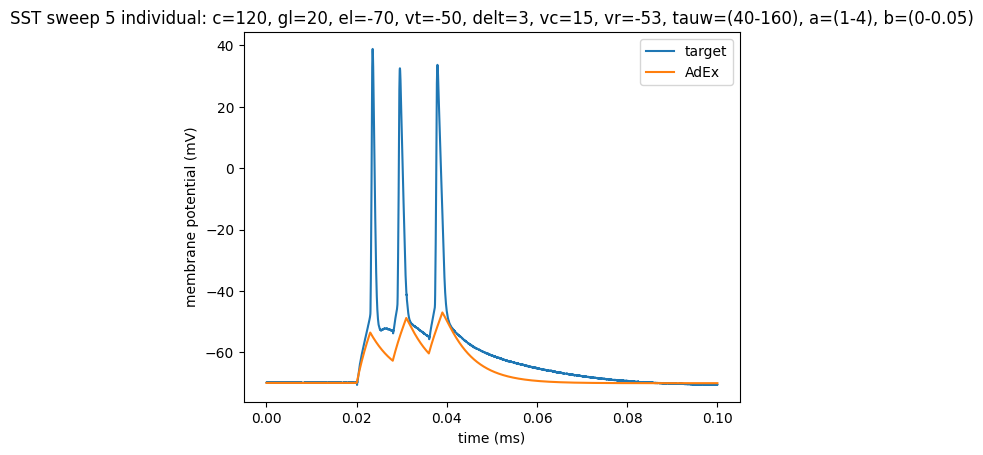

In [533]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_33[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=120, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-4), b=(0-0.05)')

In [ ]:
sst_adex_s5_34 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=100, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 7.4s

first fit:
Round 0: Best parameters a=1.70215583 nS, b=126.73614612 pA, tauw=143.00633025 ms (error: 170.39999899 mV^2)
Round 1: Best parameters a=1.35580505 nS, b=0.67356721 nA, tauw=148.32465958 ms (error: 170.13150193 mV^2)
Round 2: Best parameters a=1.23266389 nS, b=0.93818052 nA, tauw=151.88213289 ms (error: 170.0324311 mV^2)
Round 3: Best parameters a=1.15648181 nS, b=0.89034791 nA, tauw=154.09542028 ms (error: 169.97331112 mV^2)
Round 4: Best parameters a=1.11384522 nS, b=0.88811462 nA, tauw=154.30556792 ms (error: 169.94528175 mV^2)
Round 5: Best parameters a=1.08571177 nS, b=0.34254411 nA, tauw=153.51571012 ms (error: 169.93069375 mV^2)
Round 6: Best parameters a=1.07525306 nS, b=0.77599685 nA, tauw=156.63084316 ms (error: 169.91137449 mV^2)
Round 7: Best parameters a=1.05638445 nS, b=0.3963046 nA, tauw=157.10914051 ms (error: 169.89769681 mV^2)
Round 8: Best parameters a=1.03606116 nS, b=0.85491497 nA, tauw=157.40205465 ms (error: 169.88390036 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST sweep 5 individual: c=100, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

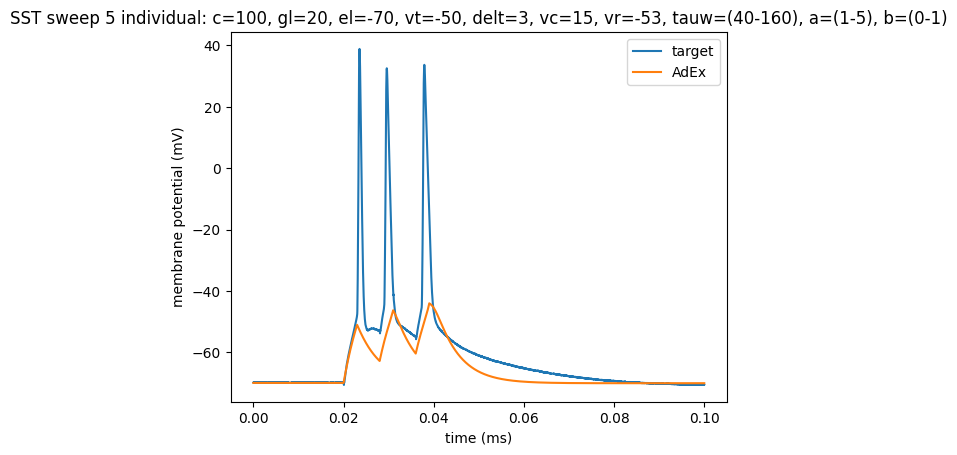

In [536]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_34[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=100, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 7.9s

first fit:
Round 0: Best parameters a=4.33663056 nS, b=150.32059355 pA, tauw=72.27601592 ms (error: 226.57491764 mV^2)
Round 1: Best parameters a=2.17079478 nS, b=76.29104984 pA, tauw=58.38218322 ms (error: 193.44404094 mV^2)
Round 2: Best parameters a=1.41704828 nS, b=43.29088224 pA, tauw=50.53884447 ms (error: 181.17928692 mV^2)
Round 3: Best parameters a=1.43926053 nS, b=31.04546776 pA, tauw=54.93070574 ms (error: 177.58764833 mV^2)
Round 4: Best parameters a=1.26545488 nS, b=21.97772951 pA, tauw=48.17347198 ms (error: 174.56405831 mV^2)
Round 5: Best parameters a=1.13688623 nS, b=13.61204898 pA, tauw=46.31005884 ms (error: 171.86195243 mV^2)
Round 6: Best parameters a=1.17812002 nS, b=10.18152057 pA, tauw=44.58040904 ms (error: 170.89968439 mV^2)
Round 7: Best parameters a=1.15588627 nS, b=7.68019112 pA, tauw=84.58477193 ms (error: 169.49378626 mV^2)
Round 8: Best parameters a=1.63229119 nS, b=5.59840671 pA, tauw=151.12892856 ms (error: 168.62391124 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

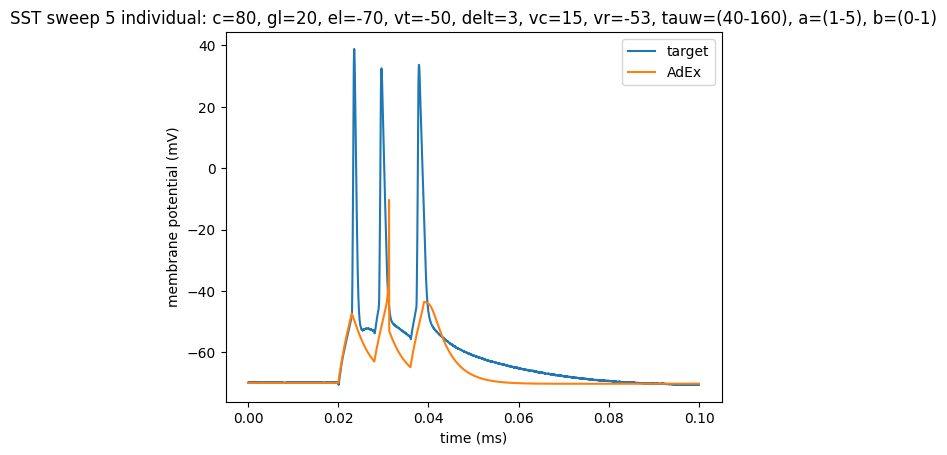

In [538]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35_1 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8s

first fit:
Round 0: Best parameters a=2.15949562 nS, b=124.52985253 pA, tauw=74.12573677 ms (error: 213.31371277 mV^2)
Round 1: Best parameters a=3.61581966 nS, b=71.79427922 pA, tauw=63.28389001 ms (error: 193.92896803 mV^2)
Round 2: Best parameters a=1.92712923 nS, b=50.94786486 pA, tauw=51.57808943 ms (error: 184.32009268 mV^2)
Round 3: Best parameters a=1.76936664 nS, b=35.99178248 pA, tauw=48.63568027 ms (error: 179.50054039 mV^2)
Round 4: Best parameters a=2.00469957 nS, b=23.53362268 pA, tauw=50.00968035 ms (error: 176.24209312 mV^2)
Round 5: Best parameters a=1.77934171 nS, b=17.0449795 pA, tauw=56.17244937 ms (error: 173.81584572 mV^2)
Round 6: Best parameters a=1.58824752 nS, b=15.33788831 pA, tauw=135.01871545 ms (error: 172.39125762 mV^2)
Round 7: Best parameters a=1.48288756 nS, b=12.4794267 pA, tauw=143.12783197 ms (error: 171.25746109 mV^2)
Round 8: Best parameters a=1.49703414 nS, b=8.95456868 pA, tauw=147.4312803 ms (error: 169.9163122 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

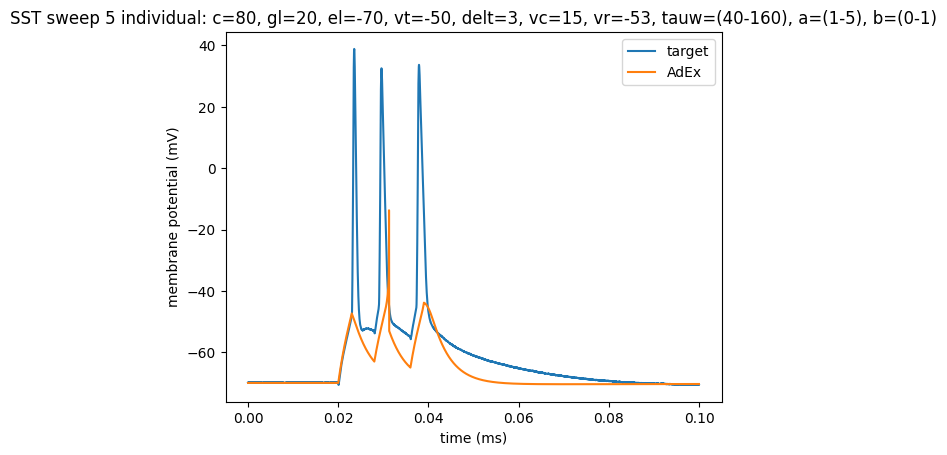

In [540]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35_1[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35_2 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8.1s

first fit:
Round 0: Best parameters a=4.02652353 nS, b=103.09365898 pA, tauw=86.06525475 ms (error: 207.52710715 mV^2)
Round 1: Best parameters a=4.237692 nS, b=68.27777402 pA, tauw=63.05481409 ms (error: 193.47777553 mV^2)
Round 2: Best parameters a=2.60175803 nS, b=43.42678315 pA, tauw=48.38167263 ms (error: 182.99467678 mV^2)
Round 3: Best parameters a=3.04924135 nS, b=29.12004069 pA, tauw=57.96788174 ms (error: 179.25799696 mV^2)
Round 4: Best parameters a=1.34750757 nS, b=28.77382455 pA, tauw=50.04516079 ms (error: 176.71913188 mV^2)
Round 5: Best parameters a=1.31775127 nS, b=18.99190704 pA, tauw=50.95958249 ms (error: 173.74470581 mV^2)
Round 6: Best parameters a=1.75831395 nS, b=12.84641138 pA, tauw=145.12454444 ms (error: 171.55018158 mV^2)
Round 7: Best parameters a=1.42472438 nS, b=11.14139083 pA, tauw=152.75765112 ms (error: 170.70813371 mV^2)
Round 8: Best parameters a=1.11089536 nS, b=8.47605567 pA, tauw=156.68122218 ms (error: 169.39054081 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

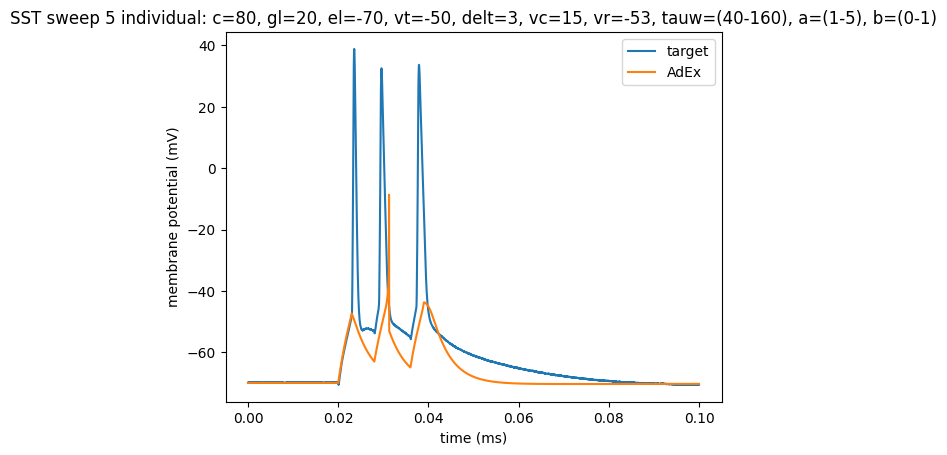

In [550]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35_2[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35_3 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 7.8s

first fit:
Round 0: Best parameters a=2.04357897 nS, b=163.29678221 pA, tauw=63.48043213 ms (error: 227.74350827 mV^2)
Round 1: Best parameters a=1.53328997 nS, b=80.86776268 pA, tauw=63.13014274 ms (error: 194.32132974 mV^2)
Round 2: Best parameters a=1.45075173 nS, b=52.88111368 pA, tauw=50.38400346 ms (error: 184.2981495 mV^2)
Round 3: Best parameters a=2.03358928 nS, b=36.73500592 pA, tauw=124.84119045 ms (error: 180.44095127 mV^2)
Round 4: Best parameters a=1.87660463 nS, b=28.52366306 pA, tauw=50.5288837 ms (error: 177.4615231 mV^2)
Round 5: Best parameters a=1.2451588 nS, b=21.15588738 pA, tauw=131.743838 ms (error: 174.29368463 mV^2)
Round 6: Best parameters a=1.3467867 nS, b=14.75714192 pA, tauw=149.90176169 ms (error: 172.02914576 mV^2)
Round 7: Best parameters a=1.21782553 nS, b=8.99415445 pA, tauw=155.60020443 ms (error: 169.80756788 mV^2)
Round 8: Best parameters a=1.28257661 nS, b=6.78775599 pA, tauw=148.59613534 ms (error: 168.94383126 mV^2)
Round 9: Best parameters a=1.

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

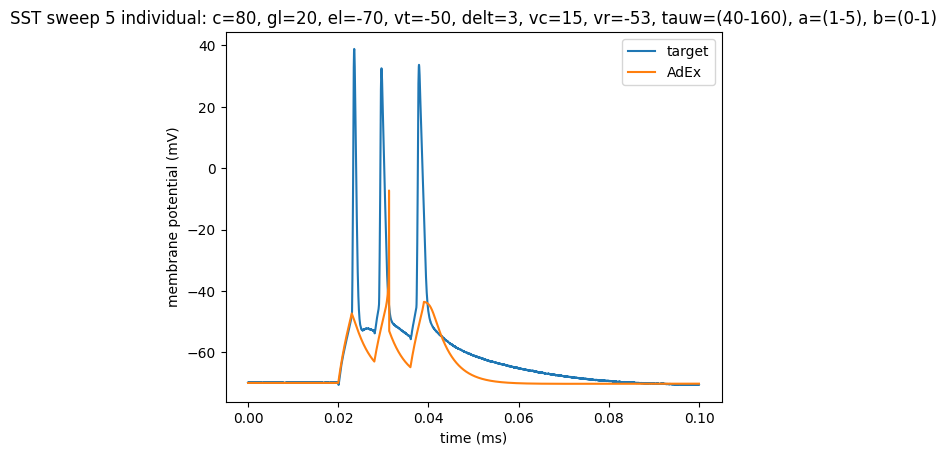

In [551]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35_3[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35_4 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 7.6s

first fit:
Round 0: Best parameters a=2.22270271 nS, b=136.80574662 pA, tauw=108.0498517 ms (error: 223.00315546 mV^2)
Round 1: Best parameters a=2.50844525 nS, b=61.50353171 pA, tauw=74.96630279 ms (error: 189.32204485 mV^2)
Round 2: Best parameters a=1.37397413 nS, b=31.42905953 pA, tauw=65.93032571 ms (error: 177.76547429 mV^2)
Round 3: Best parameters a=1.53527113 nS, b=23.76012995 pA, tauw=70.80668113 ms (error: 175.49576426 mV^2)
Round 4: Best parameters a=1.33477999 nS, b=14.95165484 pA, tauw=63.90221423 ms (error: 172.45182223 mV^2)
Round 5: Best parameters a=1.1817188 nS, b=11.48582542 pA, tauw=79.07559036 ms (error: 170.92872868 mV^2)
Round 6: Best parameters a=1.13720883 nS, b=7.33870812 pA, tauw=74.0591044 ms (error: 169.44969148 mV^2)
Round 7: Best parameters a=1.22581486 nS, b=5.98539609 pA, tauw=122.15761396 ms (error: 168.65690995 mV^2)
Round 8: Best parameters a=1.1367718 nS, b=4.07551127 pA, tauw=104.5638357 ms (error: 167.86399677 mV^2)
Round 9: Best parameters a=1.2

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

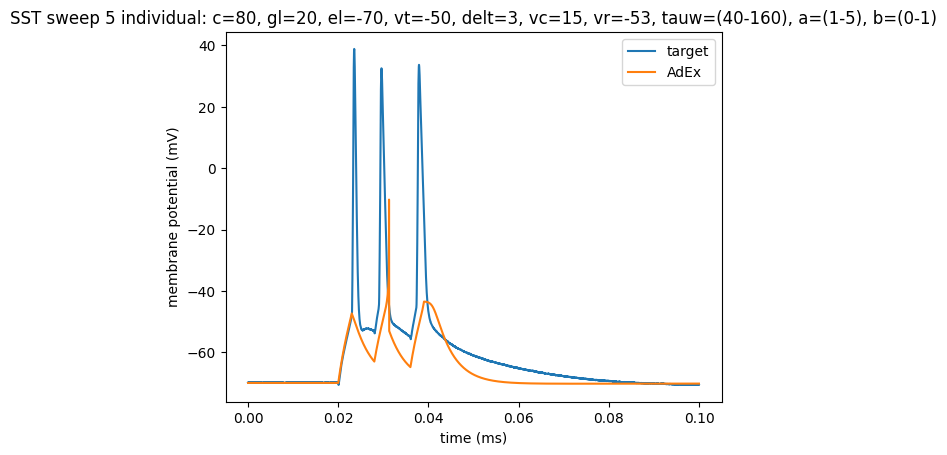

In [552]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35_4[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35_5 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 7.6s

first fit:
Round 0: Best parameters a=2.12706086 nS, b=116.51698316 pA, tauw=104.81149933 ms (error: 212.88167902 mV^2)
Round 1: Best parameters a=1.94112584 nS, b=56.1564084 pA, tauw=70.8820142 ms (error: 186.66331837 mV^2)
Round 2: Best parameters a=1.55704952 nS, b=35.33968847 pA, tauw=77.25592425 ms (error: 179.36880713 mV^2)
Round 3: Best parameters a=1.89912148 nS, b=24.38338512 pA, tauw=82.42556965 ms (error: 176.05548447 mV^2)
Round 4: Best parameters a=1.71880794 nS, b=14.47022494 pA, tauw=127.59100438 ms (error: 172.19472343 mV^2)
Round 5: Best parameters a=1.29974478 nS, b=11.84313725 pA, tauw=145.89907301 ms (error: 170.92772753 mV^2)
Round 6: Best parameters a=1.44769282 nS, b=7.30460182 pA, tauw=151.58163044 ms (error: 169.224185 mV^2)
Round 7: Best parameters a=1.44769282 nS, b=7.30460182 pA, tauw=151.58163044 ms (error: 169.224185 mV^2)
Round 8: Best parameters a=1.54877221 nS, b=6.76342612 pA, tauw=149.97244565 ms (error: 169.06409104 mV^2)
Round 9: Best parameters a=1

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

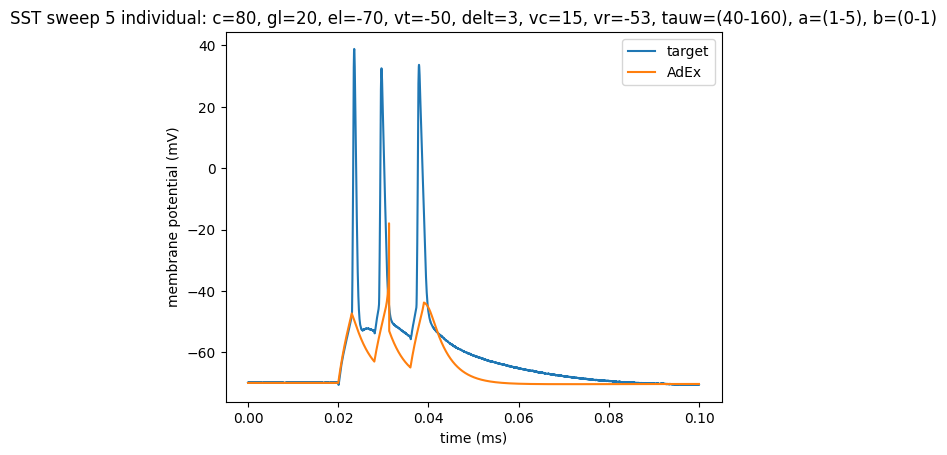

In [553]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35_5[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35_6 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8.2s

first fit:
Round 0: Best parameters a=3.21719846 nS, b=102.15098465 pA, tauw=98.48204077 ms (error: 207.00149478 mV^2)
Round 1: Best parameters a=2.09224022 nS, b=68.68318614 pA, tauw=134.51890466 ms (error: 192.98830875 mV^2)
Round 2: Best parameters a=4.06313982 nS, b=38.05862823 pA, tauw=144.07253756 ms (error: 182.48512715 mV^2)
Round 3: Best parameters a=2.52543982 nS, b=28.38711682 pA, tauw=148.05264594 ms (error: 177.71560227 mV^2)
Round 4: Best parameters a=1.960559 nS, b=18.43868703 pA, tauw=151.07876899 ms (error: 173.70450416 mV^2)
Round 5: Best parameters a=1.74301425 nS, b=13.71632272 pA, tauw=155.41571184 ms (error: 171.82821376 mV^2)
Round 6: Best parameters a=1.57308607 nS, b=9.29313708 pA, tauw=157.02435593 ms (error: 170.05939496 mV^2)
Round 7: Best parameters a=1.28824725 nS, b=6.81087747 pA, tauw=155.28159127 ms (error: 168.94604095 mV^2)
Round 8: Best parameters a=1.48302787 nS, b=5.12215259 pA, tauw=154.214847 ms (error: 168.31652067 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

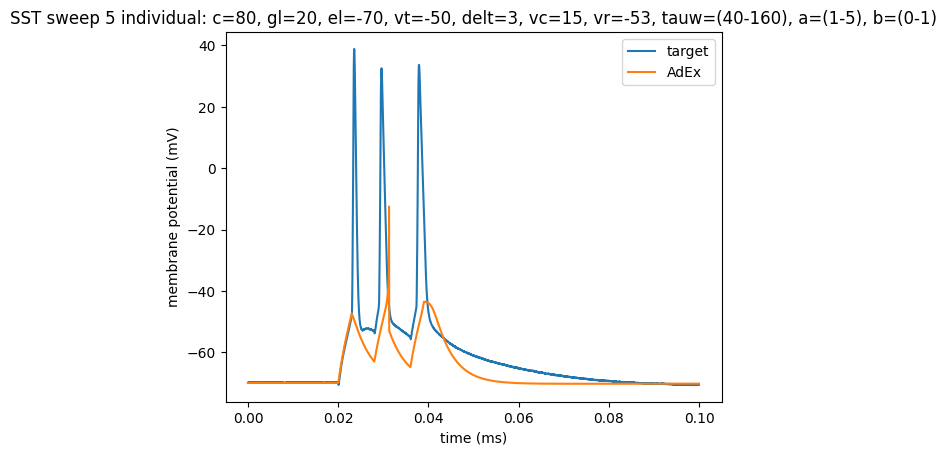

In [554]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35_6[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35_7 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8.2s

first fit:
Round 0: Best parameters a=2.37942338 nS, b=104.14686285 pA, tauw=125.09470287 ms (error: 208.61085341 mV^2)
Round 1: Best parameters a=3.18655646 nS, b=59.56313291 pA, tauw=132.27699981 ms (error: 190.08625337 mV^2)
Round 2: Best parameters a=1.54660894 nS, b=41.8362474 pA, tauw=108.10094235 ms (error: 181.81196723 mV^2)
Round 3: Best parameters a=1.87465767 nS, b=24.44738323 pA, tauw=138.53099593 ms (error: 175.86081468 mV^2)
Round 4: Best parameters a=1.60424494 nS, b=17.30041625 pA, tauw=140.82157501 ms (error: 173.09975012 mV^2)
Round 5: Best parameters a=1.77094587 nS, b=12.99986228 pA, tauw=143.15465147 ms (error: 171.62305335 mV^2)
Round 6: Best parameters a=1.39861441 nS, b=9.37370612 pA, tauw=147.51714326 ms (error: 170.02827208 mV^2)
Round 7: Best parameters a=1.39150807 nS, b=7.29998784 pA, tauw=149.74699702 ms (error: 169.19963342 mV^2)
Round 8: Best parameters a=1.4160851 nS, b=4.80768032 pA, tauw=151.69095393 ms (error: 168.14969252 mV^2)
Round 9: Best paramet

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

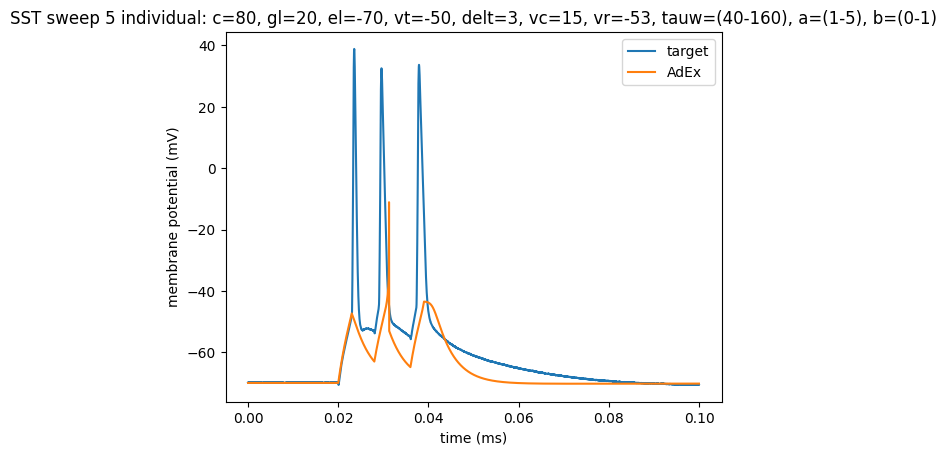

In [555]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35_7[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35_8 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8.3s

first fit:
Round 0: Best parameters a=3.98943606 nS, b=116.50720145 pA, tauw=119.55264787 ms (error: 215.38469609 mV^2)
Round 1: Best parameters a=2.24137822 nS, b=81.69148712 pA, tauw=126.59488894 ms (error: 198.59277492 mV^2)
Round 2: Best parameters a=2.44363529 nS, b=35.20936127 pA, tauw=113.77289159 ms (error: 180.24380051 mV^2)
Round 3: Best parameters a=1.81992861 nS, b=29.92697531 pA, tauw=98.71948629 ms (error: 177.94275272 mV^2)
Round 4: Best parameters a=1.49566171 nS, b=19.20835421 pA, tauw=137.84519016 ms (error: 173.73035079 mV^2)
Round 5: Best parameters a=1.54338108 nS, b=12.92968786 pA, tauw=88.52686885 ms (error: 171.75333291 mV^2)
Round 6: Best parameters a=1.25211954 nS, b=9.64887365 pA, tauw=124.1656229 ms (error: 170.10988155 mV^2)
Round 7: Best parameters a=1.32600203 nS, b=6.45714966 pA, tauw=145.31309004 ms (error: 168.83327381 mV^2)
Round 8: Best parameters a=1.44233816 nS, b=4.64935328 pA, tauw=127.90764977 ms (error: 168.21625971 mV^2)
Round 9: Best paramete

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

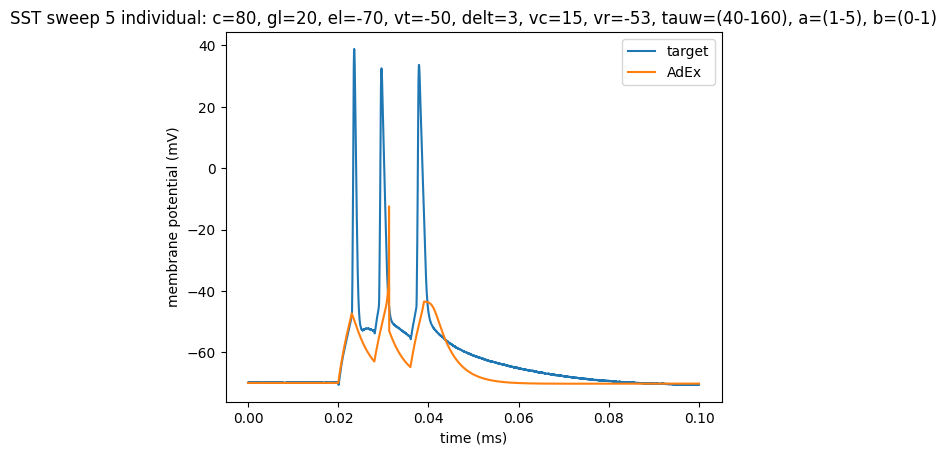

In [556]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35_8[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_35_9 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8s

first fit:
Round 0: Best parameters a=3.98428422 nS, b=170.63618867 pA, tauw=76.32222257 ms (error: 236.45062357 mV^2)
Round 1: Best parameters a=3.62142716 nS, b=85.90255427 pA, tauw=110.05293223 ms (error: 200.91248495 mV^2)
Round 2: Best parameters a=1.7338477 nS, b=58.7491387 pA, tauw=74.47271928 ms (error: 187.43211944 mV^2)
Round 3: Best parameters a=1.71145124 nS, b=32.05813069 pA, tauw=135.00264845 ms (error: 178.51307076 mV^2)
Round 4: Best parameters a=1.32452966 nS, b=22.03637047 pA, tauw=137.29986649 ms (error: 174.65836283 mV^2)
Round 5: Best parameters a=1.22326787 nS, b=15.17493971 pA, tauw=81.37051641 ms (error: 172.2255058 mV^2)
Round 6: Best parameters a=1.46625533 nS, b=10.71467902 pA, tauw=130.26698376 ms (error: 170.62788084 mV^2)
Round 7: Best parameters a=1.20179882 nS, b=8.07886162 pA, tauw=102.74531054 ms (error: 169.56251398 mV^2)
Round 8: Best parameters a=1.20179882 nS, b=6.03023792 pA, tauw=146.42472176 ms (error: 168.5982905 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

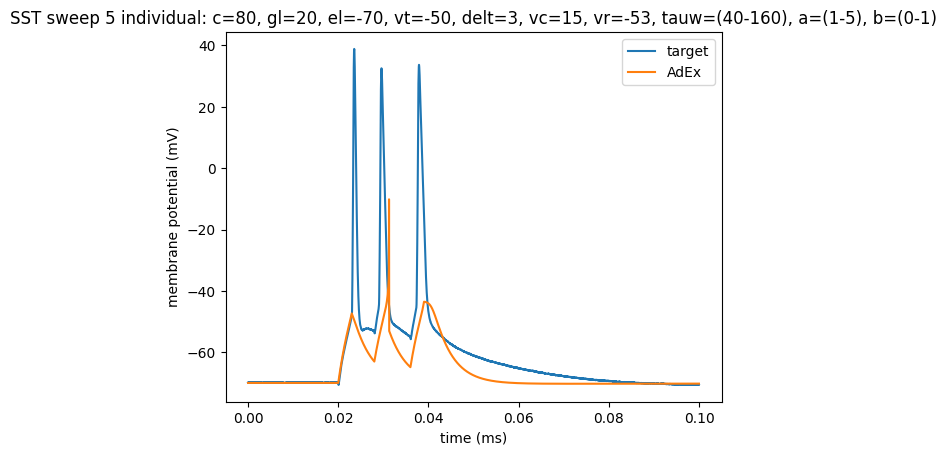

In [542]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_35_9[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_36 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=80, gl_var=15, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8.2s

first fit:
Round 0: Best parameters a=2.98544469 nS, b=140.70300071 pA, tauw=63.88269703 ms (error: 202.16534692 mV^2)
Round 1: Best parameters a=2.59266885 nS, b=73.31710382 pA, tauw=56.36647957 ms (error: 166.42485985 mV^2)
Round 2: Best parameters a=1.36817437 nS, b=68.76537623 pA, tauw=56.20629574 ms (error: 159.95000008 mV^2)
Round 3: Best parameters a=1.50544029 nS, b=67.18944567 pA, tauw=50.48155925 ms (error: 159.16332569 mV^2)
Round 4: Best parameters a=1.50544029 nS, b=67.18944567 pA, tauw=50.48155925 ms (error: 159.16332569 mV^2)
Round 5: Best parameters a=1.50544029 nS, b=67.18944567 pA, tauw=50.48155925 ms (error: 159.16332569 mV^2)
Round 6: Best parameters a=1.50544029 nS, b=67.18944567 pA, tauw=50.48155925 ms (error: 159.16332569 mV^2)
Round 7: Best parameters a=1.50544029 nS, b=67.18944567 pA, tauw=50.48155925 ms (error: 159.16332569 mV^2)
Round 8: Best parameters a=1.20234038 nS, b=69.39477228 pA, tauw=49.19030111 ms (error: 159.01669203 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST sweep 5 individual: c=80, gl=15, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

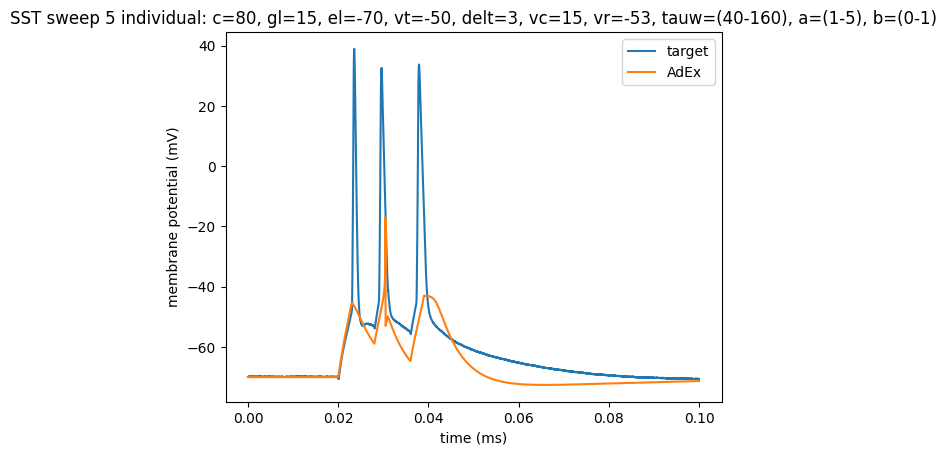

In [558]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_36[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=80, gl=15, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

# BEST ADEX INDIVIDUAL SWEEP 5 SO FAR: RUN 37

In [ ]:
sst_adex_s5_37 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 7.8s

first fit:
Round 0: Best parameters a=3.95176411 nS, b=126.61745383 pA, tauw=83.01076539 ms (error: 237.21812955 mV^2)
Round 1: Best parameters a=3.08961253 nS, b=99.45734867 pA, tauw=68.77598913 ms (error: 213.8802551 mV^2)
Round 2: Best parameters a=3.08961253 nS, b=99.45734867 pA, tauw=68.77598913 ms (error: 213.8802551 mV^2)
Round 3: Best parameters a=3.8245928 nS, b=100.68110596 pA, tauw=52.23221784 ms (error: 213.23173612 mV^2)
Round 4: Best parameters a=3.80621626 nS, b=99.75888683 pA, tauw=55.82036703 ms (error: 213.20113711 mV^2)
Round 5: Best parameters a=1.51849522 nS, b=46.58159412 pA, tauw=48.50920146 ms (error: 210.00630288 mV^2)
Round 6: Best parameters a=2.16072122 nS, b=41.43071971 pA, tauw=46.95971792 ms (error: 205.68994924 mV^2)
Round 7: Best parameters a=1.89716772 nS, b=41.35564562 pA, tauw=47.70252743 ms (error: 204.9811474 mV^2)
Round 8: Best parameters a=4.13394927 nS, b=36.25948193 pA, tauw=45.30221705 ms (error: 203.51983662 mV^2)
Round 9: Best parameters a=1

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

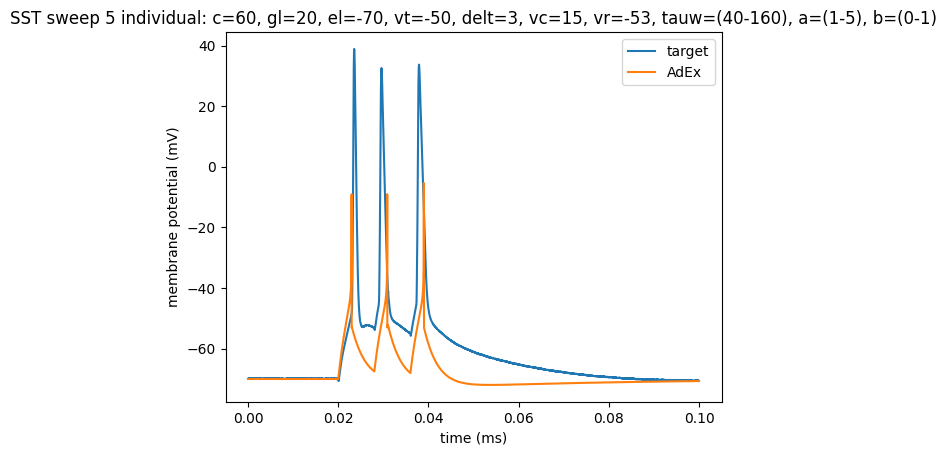

In [560]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_1 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8s

first fit:
Round 0: Best parameters a=3.79512714 nS, b=171.79270254 pA, tauw=59.12234403 ms (error: 257.74629172 mV^2)
Round 1: Best parameters a=1.99585132 nS, b=100.04905694 pA, tauw=77.37759737 ms (error: 212.58841843 mV^2)
Round 2: Best parameters a=1.99585132 nS, b=100.04905694 pA, tauw=77.37759737 ms (error: 212.58841843 mV^2)
Round 3: Best parameters a=1.99585132 nS, b=100.04905694 pA, tauw=77.37759737 ms (error: 212.58841843 mV^2)
Round 4: Best parameters a=1.99585132 nS, b=100.04905694 pA, tauw=77.37759737 ms (error: 212.58841843 mV^2)
Round 5: Best parameters a=1.73450202 nS, b=38.16447009 pA, tauw=124.46132408 ms (error: 207.43473432 mV^2)
Round 6: Best parameters a=1.73450202 nS, b=38.16447009 pA, tauw=124.46132408 ms (error: 207.43473432 mV^2)
Round 7: Best parameters a=1.73450202 nS, b=38.16447009 pA, tauw=124.46132408 ms (error: 207.43473432 mV^2)
Round 8: Best parameters a=1.73450202 nS, b=38.16447009 pA, tauw=124.46132408 ms (error: 207.43473432 mV^2)
Round 9: Best par

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

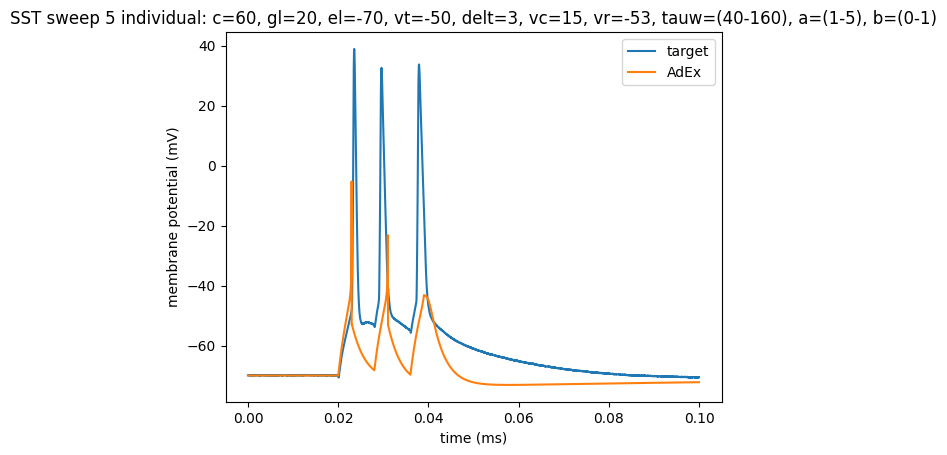

In [573]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_1[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_2 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 7.7s

first fit:
Round 0: Best parameters a=3.14984374 nS, b=166.36400566 pA, tauw=70.13175711 ms (error: 258.19204619 mV^2)
Round 1: Best parameters a=3.72243552 nS, b=100.27946602 pA, tauw=60.89289035 ms (error: 214.90766695 mV^2)
Round 2: Best parameters a=4.29633072 nS, b=95.23973786 pA, tauw=80.24887514 ms (error: 214.06800568 mV^2)
Round 3: Best parameters a=2.14095024 nS, b=42.32478725 pA, tauw=100.78259686 ms (error: 212.69563675 mV^2)
Round 4: Best parameters a=4.22333786 nS, b=37.085633 pA, tauw=59.0456303 ms (error: 206.55987256 mV^2)
Round 5: Best parameters a=3.79375005 nS, b=36.88170551 pA, tauw=51.15562325 ms (error: 204.12636239 mV^2)
Round 6: Best parameters a=3.79375005 nS, b=36.88170551 pA, tauw=51.15562325 ms (error: 204.12636239 mV^2)
Round 7: Best parameters a=4.515585 nS, b=35.36605305 pA, tauw=53.00546321 ms (error: 203.36398602 mV^2)
Round 8: Best parameters a=4.515585 nS, b=35.36605305 pA, tauw=53.00546321 ms (error: 203.36398602 mV^2)
Round 9: Best parameters a=4.5

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

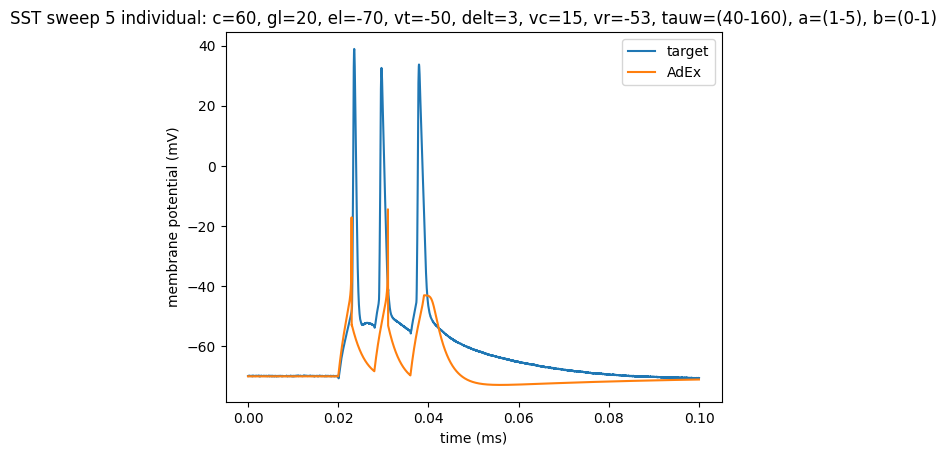

In [574]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_2[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_3 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 7.9s

first fit:
Round 0: Best parameters a=2.0692583 nS, b=123.17399137 pA, tauw=60.60417295 ms (error: 227.60859242 mV^2)
Round 1: Best parameters a=1.62634839 nS, b=112.60493914 pA, tauw=51.56871817 ms (error: 217.09277255 mV^2)
Round 2: Best parameters a=1.39891176 nS, b=109.35734773 pA, tauw=49.08770734 ms (error: 212.05434867 mV^2)
Round 3: Best parameters a=1.48001051 nS, b=107.08288371 pA, tauw=52.52470175 ms (error: 209.77911732 mV^2)
Round 4: Best parameters a=2.17644613 nS, b=40.76553254 pA, tauw=51.82285236 ms (error: 205.7809609 mV^2)
Round 5: Best parameters a=2.0394395 nS, b=39.83330071 pA, tauw=49.38222636 ms (error: 201.11054581 mV^2)
Round 6: Best parameters a=2.0394395 nS, b=39.83330071 pA, tauw=49.38222636 ms (error: 201.11054581 mV^2)
Round 7: Best parameters a=2.0394395 nS, b=39.83330071 pA, tauw=49.38222636 ms (error: 201.11054581 mV^2)
Round 8: Best parameters a=2.0394395 nS, b=39.83330071 pA, tauw=49.38222636 ms (error: 201.11054581 mV^2)
Round 9: Best parameters a=2

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

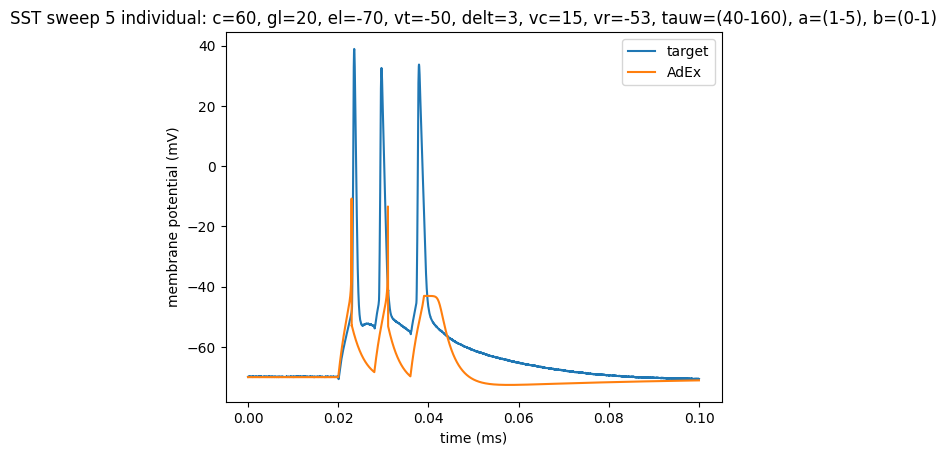

In [575]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_3[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_4 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8.2s

first fit:
Round 0: Best parameters a=1.9667602 nS, b=102.89590725 pA, tauw=134.17026388 ms (error: 223.68763981 mV^2)
Round 1: Best parameters a=1.98852574 nS, b=96.66301406 pA, tauw=141.09350667 ms (error: 217.91116957 mV^2)
Round 2: Best parameters a=1.73826648 nS, b=97.09784374 pA, tauw=144.47289895 ms (error: 217.64732257 mV^2)
Round 3: Best parameters a=1.78319003 nS, b=44.10180493 pA, tauw=143.70393016 ms (error: 216.01289097 mV^2)
Round 4: Best parameters a=1.76245791 nS, b=38.70120753 pA, tauw=101.50901404 ms (error: 207.20488278 mV^2)
Round 5: Best parameters a=2.06661835 nS, b=39.6179909 pA, tauw=61.69063563 ms (error: 205.33024526 mV^2)
Round 6: Best parameters a=1.54985129 nS, b=40.34236137 pA, tauw=55.4510354 ms (error: 203.51112775 mV^2)
Round 7: Best parameters a=1.54985129 nS, b=40.34236137 pA, tauw=55.4510354 ms (error: 203.51112775 mV^2)
Round 8: Best parameters a=1.54985129 nS, b=40.34236137 pA, tauw=55.4510354 ms (error: 203.51112775 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

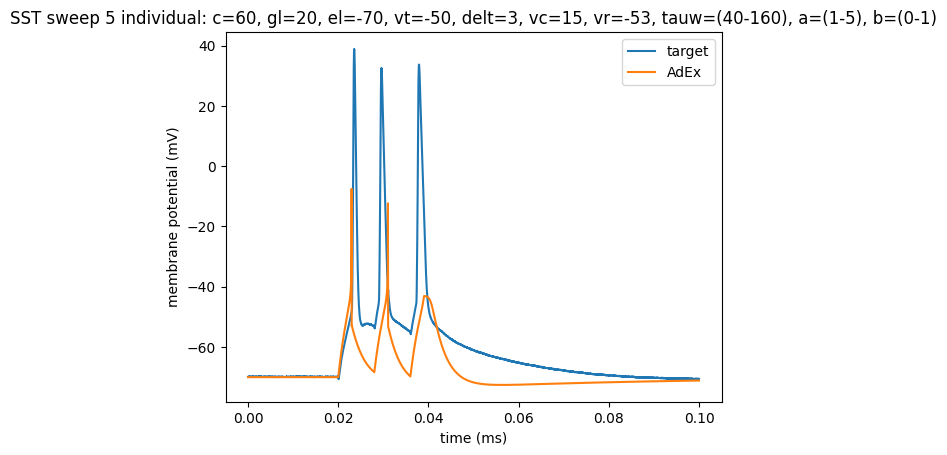

In [576]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_4[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 15.5s

first fit:
Round 0: Best parameters a=2.82896135 nS, b=99.73819278 pA, tauw=76.75792091 ms (error: 215.36037136 mV^2)
Round 1: Best parameters a=2.64182917 nS, b=100.75954107 pA, tauw=64.56030758 ms (error: 212.53259292 mV^2)
Round 2: Best parameters a=2.64182917 nS, b=100.75954107 pA, tauw=64.56030758 ms (error: 212.53259292 mV^2)
Round 3: Best parameters a=2.64182917 nS, b=100.75954107 pA, tauw=64.56030758 ms (error: 212.53259292 mV^2)
Round 4: Best parameters a=2.64182917 nS, b=100.75954107 pA, tauw=64.56030758 ms (error: 212.53259292 mV^2)
Round 5: Best parameters a=3.45950618 nS, b=37.18094785 pA, tauw=70.29377282 ms (error: 205.5878894 mV^2)
Round 6: Best parameters a=1.43160089 nS, b=39.09490684 pA, tauw=83.24091338 ms (error: 205.45768689 mV^2)
Round 7: Best parameters a=1.40110269 nS, b=41.19050634 pA, tauw=50.20028953 ms (error: 203.41839754 mV^2)
Round 8: Best parameters a=1.19619857 nS, b=41.38640032 pA, tauw=49.45474183 ms (error: 201.69515601 mV^2)
Round 9: Best parameter

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

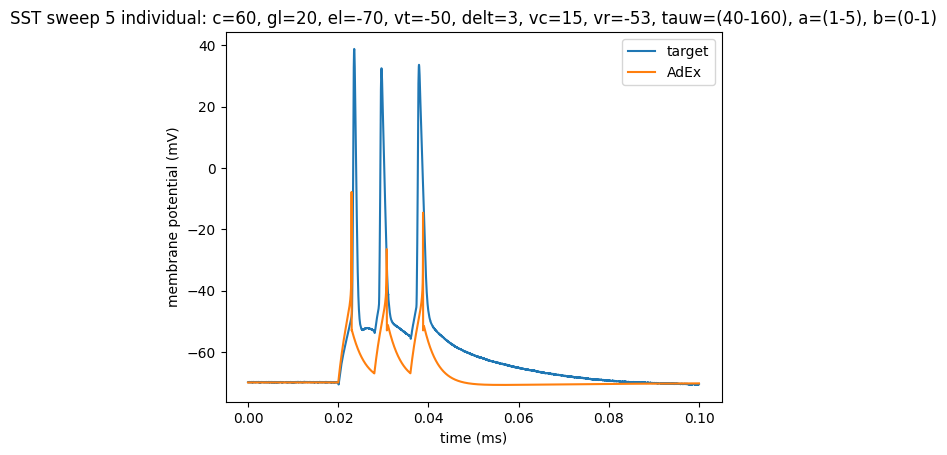

In [587]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds_1 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 14.6s

first fit:
Round 0: Best parameters a=2.16310027 nS, b=137.29229102 pA, tauw=103.04828651 ms (error: 246.02954928 mV^2)
Round 1: Best parameters a=4.37498067 nS, b=93.94751175 pA, tauw=94.06594802 ms (error: 213.74451807 mV^2)
Round 2: Best parameters a=4.37498067 nS, b=93.94751175 pA, tauw=94.06594802 ms (error: 213.74451807 mV^2)
Round 3: Best parameters a=1.65231422 nS, b=41.57335093 pA, tauw=51.14039517 ms (error: 205.37838785 mV^2)
Round 4: Best parameters a=1.65231422 nS, b=41.57335093 pA, tauw=51.14039517 ms (error: 205.37838785 mV^2)
Round 5: Best parameters a=1.3792224 nS, b=41.365941 pA, tauw=49.42773238 ms (error: 203.50301645 mV^2)
Round 6: Best parameters a=1.3792224 nS, b=41.365941 pA, tauw=49.42773238 ms (error: 203.50301645 mV^2)
Round 7: Best parameters a=1.3792224 nS, b=41.365941 pA, tauw=49.42773238 ms (error: 203.50301645 mV^2)
Round 8: Best parameters a=1.53976843 nS, b=17.31436138 pA, tauw=51.29702367 ms (error: 201.02728097 mV^2)
Round 9: Best parameters a=1.6342

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

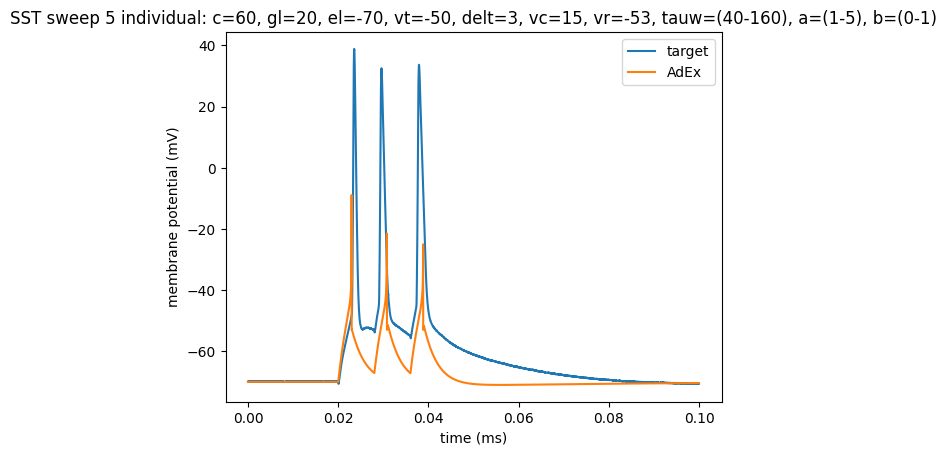

In [588]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds_1[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds_2 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 14.6s

first fit:
Round 0: Best parameters a=3.96392241 nS, b=105.94872436 pA, tauw=118.10713941 ms (error: 226.96716365 mV^2)
Round 1: Best parameters a=4.21932832 nS, b=95.24358223 pA, tauw=141.64419111 ms (error: 219.40787573 mV^2)
Round 2: Best parameters a=4.43436921 nS, b=94.87036074 pA, tauw=76.87980509 ms (error: 213.13132871 mV^2)
Round 3: Best parameters a=4.01807925 nS, b=36.08689975 pA, tauw=71.94383606 ms (error: 204.5395895 mV^2)
Round 4: Best parameters a=4.01807925 nS, b=36.08689975 pA, tauw=71.94383606 ms (error: 204.5395895 mV^2)
Round 5: Best parameters a=2.18834397 nS, b=17.39758153 pA, tauw=66.86326612 ms (error: 202.72416561 mV^2)
Round 6: Best parameters a=1.27136992 nS, b=13.29041464 pA, tauw=49.17778349 ms (error: 196.9666946 mV^2)
Round 7: Best parameters a=1.17267752 nS, b=8.01268047 pA, tauw=54.29529177 ms (error: 192.39610358 mV^2)
Round 8: Best parameters a=1.1380034 nS, b=5.67699567 pA, tauw=48.64265343 ms (error: 190.29827402 mV^2)
Round 9: Best parameters a=1.

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

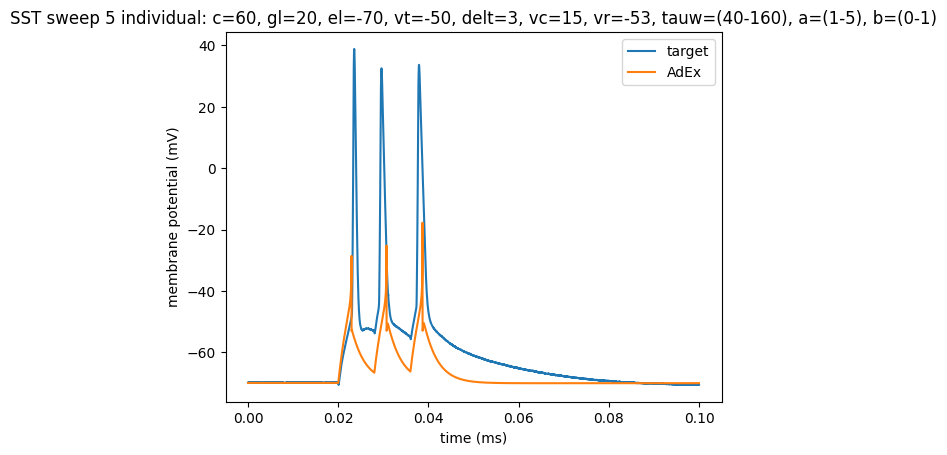

In [589]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds_2[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds_3 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 15.3s

first fit:
Round 0: Best parameters a=2.17560266 nS, b=146.60952369 pA, tauw=55.33796859 ms (error: 239.7060406 mV^2)
Round 1: Best parameters a=2.70271937 nS, b=101.20713474 pA, tauw=66.79698031 ms (error: 214.40871544 mV^2)
Round 2: Best parameters a=1.65265917 nS, b=47.89285288 pA, tauw=50.8971245 ms (error: 211.97409553 mV^2)
Round 3: Best parameters a=3.03860805 nS, b=38.49485569 pA, tauw=56.70003929 ms (error: 205.41985589 mV^2)
Round 4: Best parameters a=2.31715716 nS, b=39.28773954 pA, tauw=52.44043406 ms (error: 203.47952133 mV^2)
Round 5: Best parameters a=2.31715716 nS, b=39.28773954 pA, tauw=52.44043406 ms (error: 203.47952133 mV^2)
Round 6: Best parameters a=1.41695081 nS, b=41.21076182 pA, tauw=49.53546093 ms (error: 203.29286166 mV^2)
Round 7: Best parameters a=2.80663694 nS, b=38.75921782 pA, tauw=45.74209154 ms (error: 202.65585292 mV^2)
Round 8: Best parameters a=1.6998332 nS, b=40.99077427 pA, tauw=44.82910531 ms (error: 201.67077578 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

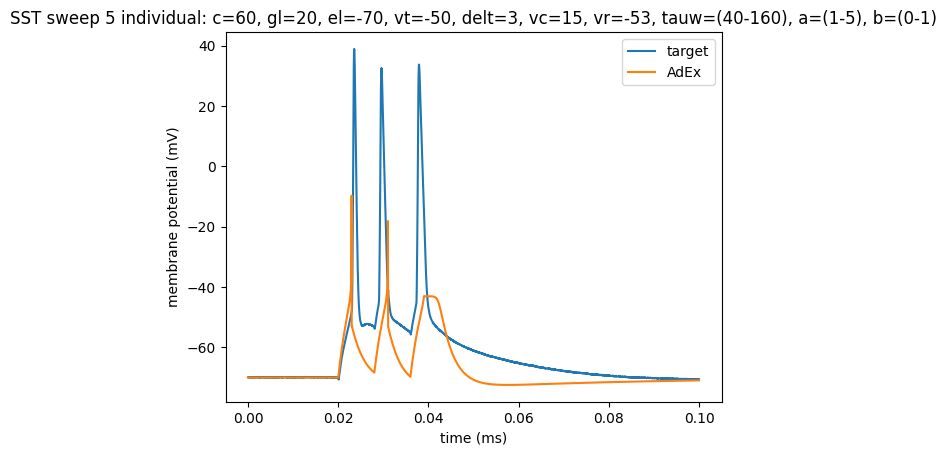

In [590]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds_3[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds_4 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 15.2s

first fit:
Round 0: Best parameters a=4.01533499 nS, b=112.98698412 pA, tauw=61.85069031 ms (error: 224.68815136 mV^2)
Round 1: Best parameters a=3.44911605 nS, b=105.00625748 pA, tauw=67.69408705 ms (error: 219.58188131 mV^2)
Round 2: Best parameters a=2.14664463 nS, b=45.94687553 pA, tauw=58.44988553 ms (error: 212.33703851 mV^2)
Round 3: Best parameters a=3.12617256 nS, b=39.63624237 pA, tauw=50.52702636 ms (error: 206.48890618 mV^2)
Round 4: Best parameters a=2.7446112 nS, b=37.96043001 pA, tauw=68.42250262 ms (error: 204.85457277 mV^2)
Round 5: Best parameters a=2.29811102 nS, b=38.85774946 pA, tauw=63.00787516 ms (error: 204.73926825 mV^2)
Round 6: Best parameters a=2.29811102 nS, b=38.85774946 pA, tauw=63.00787516 ms (error: 204.73926825 mV^2)
Round 7: Best parameters a=1.62112798 nS, b=41.79681669 pA, tauw=45.7809422 ms (error: 204.25469678 mV^2)
Round 8: Best parameters a=1.54261015 nS, b=19.65209526 pA, tauw=46.82938466 ms (error: 203.05370321 mV^2)
Round 9: Best parameters a

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

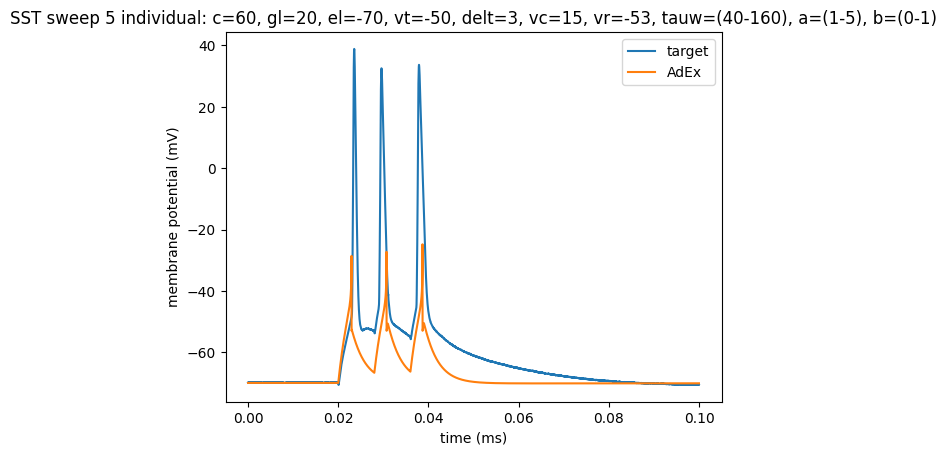

In [591]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds_4[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds_5 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 15.6s

first fit:
Round 0: Best parameters a=2.15973014 nS, b=123.04901363 pA, tauw=94.90863502 ms (error: 234.8706354 mV^2)
Round 1: Best parameters a=2.06322866 nS, b=104.85241212 pA, tauw=65.97209398 ms (error: 216.31309781 mV^2)
Round 2: Best parameters a=2.06322866 nS, b=48.41334859 pA, tauw=65.97209398 ms (error: 215.76336141 mV^2)
Round 3: Best parameters a=2.1130099 nS, b=37.35616834 pA, tauw=122.87088178 ms (error: 205.17692461 mV^2)
Round 4: Best parameters a=2.1130099 nS, b=37.35616834 pA, tauw=122.87088178 ms (error: 205.17692461 mV^2)
Round 5: Best parameters a=1.60110397 nS, b=19.24789215 pA, tauw=127.64349201 ms (error: 204.93977193 mV^2)
Round 6: Best parameters a=1.47780565 nS, b=11.86837457 pA, tauw=136.00348979 ms (error: 196.51992914 mV^2)
Round 7: Best parameters a=1.59985355 nS, b=8.44548777 pA, tauw=136.63109087 ms (error: 192.59675575 mV^2)
Round 8: Best parameters a=1.2974032 nS, b=5.67623245 pA, tauw=154.69759559 ms (error: 189.76738971 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

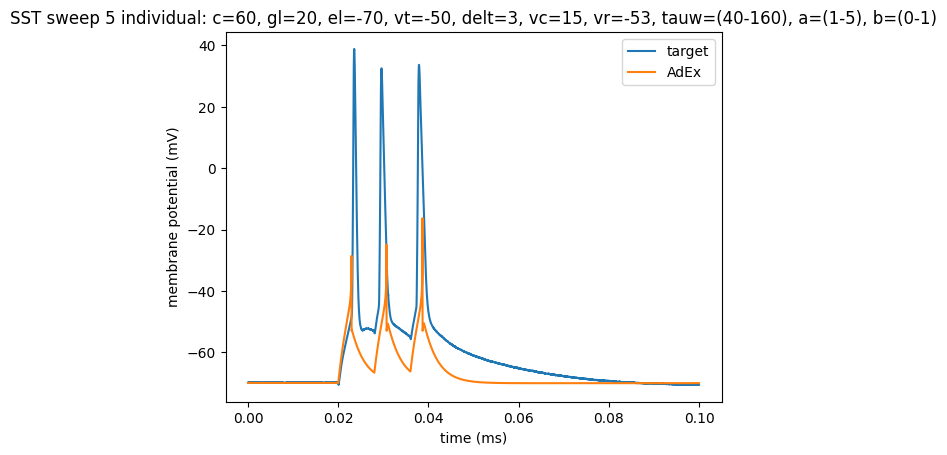

In [592]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds_5[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds_6 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 15.3s

first fit:
Round 0: Best parameters a=2.88502822 nS, b=122.61873085 pA, tauw=78.31227464 ms (error: 232.54050106 mV^2)
Round 1: Best parameters a=4.38630297 nS, b=96.5951794 pA, tauw=59.10321766 ms (error: 211.56041388 mV^2)
Round 2: Best parameters a=4.38630297 nS, b=96.5951794 pA, tauw=59.10321766 ms (error: 211.56041388 mV^2)
Round 3: Best parameters a=4.38630297 nS, b=96.5951794 pA, tauw=59.10321766 ms (error: 211.56041388 mV^2)
Round 4: Best parameters a=4.38630297 nS, b=96.5951794 pA, tauw=59.10321766 ms (error: 211.56041388 mV^2)
Round 5: Best parameters a=2.69661098 nS, b=104.22924082 pA, tauw=49.03037591 ms (error: 210.30245962 mV^2)
Round 6: Best parameters a=2.69661098 nS, b=104.22924082 pA, tauw=49.03037591 ms (error: 210.30245962 mV^2)
Round 7: Best parameters a=1.42253869 nS, b=47.47640323 pA, tauw=45.22944551 ms (error: 209.88024944 mV^2)
Round 8: Best parameters a=1.19039015 nS, b=41.45159644 pA, tauw=55.59691543 ms (error: 204.82121479 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

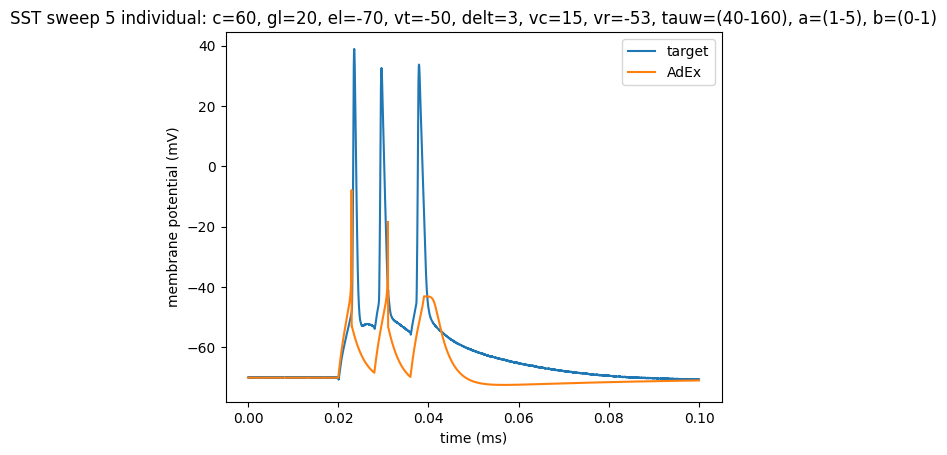

In [596]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds_6[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds_7 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 15.3s

first fit:
Round 0: Best parameters a=2.26430624 nS, b=138.24919004 pA, tauw=71.90443502 ms (error: 240.27590025 mV^2)
Round 1: Best parameters a=1.60171943 nS, b=114.35860612 pA, tauw=56.80472461 ms (error: 220.06695147 mV^2)
Round 2: Best parameters a=1.3808014 nS, b=48.86565733 pA, tauw=53.65082759 ms (error: 212.95288193 mV^2)
Round 3: Best parameters a=1.30199157 nS, b=41.02434736 pA, tauw=51.01613393 ms (error: 201.91923633 mV^2)
Round 4: Best parameters a=1.30199157 nS, b=41.02434736 pA, tauw=51.01613393 ms (error: 201.91923633 mV^2)
Round 5: Best parameters a=1.30199157 nS, b=41.02434736 pA, tauw=51.01613393 ms (error: 201.91923633 mV^2)
Round 6: Best parameters a=1.30199157 nS, b=41.02434736 pA, tauw=51.01613393 ms (error: 201.91923633 mV^2)
Round 7: Best parameters a=1.30199157 nS, b=41.02434736 pA, tauw=51.01613393 ms (error: 201.91923633 mV^2)
Round 8: Best parameters a=1.30199157 nS, b=41.02434736 pA, tauw=51.01613393 ms (error: 201.91923633 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

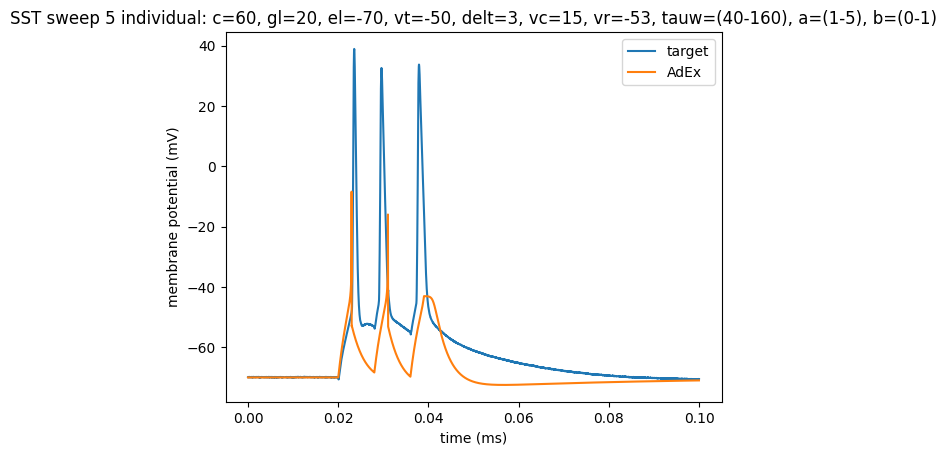

In [597]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds_7[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds_8 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 14.7s

first fit:
Round 0: Best parameters a=2.58539956 nS, b=99.80050373 pA, tauw=99.38752312 ms (error: 218.42036317 mV^2)
Round 1: Best parameters a=2.58539956 nS, b=99.80050373 pA, tauw=99.38752312 ms (error: 218.42036317 mV^2)
Round 2: Best parameters a=3.95731313 nS, b=38.70297812 pA, tauw=133.0694036 ms (error: 211.37801103 mV^2)
Round 3: Best parameters a=2.04024816 nS, b=38.71137591 pA, tauw=75.49448271 ms (error: 205.33195008 mV^2)
Round 4: Best parameters a=2.04024816 nS, b=38.71137591 pA, tauw=75.49448271 ms (error: 205.33195008 mV^2)
Round 5: Best parameters a=2.04024816 nS, b=38.71137591 pA, tauw=75.49448271 ms (error: 205.33195008 mV^2)
Round 6: Best parameters a=1.55276396 nS, b=40.12358211 pA, tauw=57.30096533 ms (error: 203.64385337 mV^2)
Round 7: Best parameters a=1.38957843 nS, b=40.89664525 pA, tauw=52.5464686 ms (error: 203.34783149 mV^2)
Round 8: Best parameters a=1.25640224 nS, b=41.04412595 pA, tauw=53.14222622 ms (error: 203.27859353 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

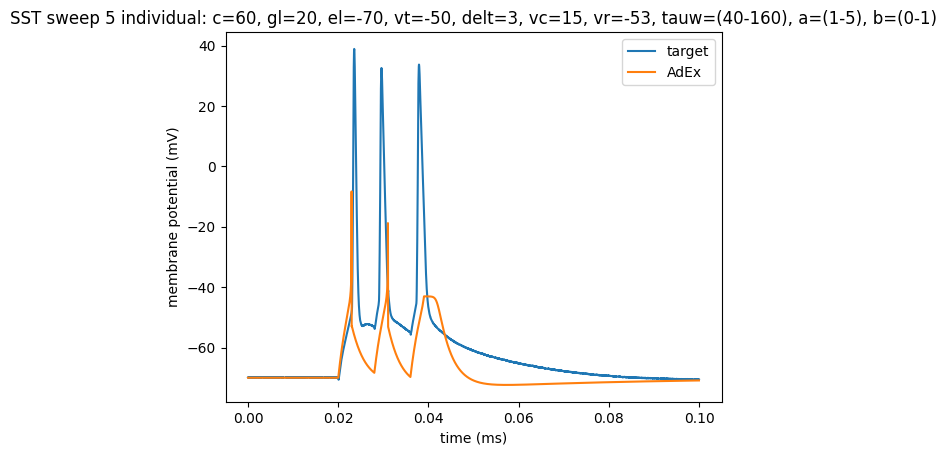

In [594]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds_8[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_20rounds_9 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=20, tauw_min=40, a_max=5, b_max=1)

# tt: 15.2s

first fit:
Round 0: Best parameters a=2.27107336 nS, b=124.80136445 pA, tauw=137.08504959 ms (error: 241.22065509 mV^2)
Round 1: Best parameters a=1.8345704 nS, b=110.46845818 pA, tauw=59.17452251 ms (error: 218.50896842 mV^2)
Round 2: Best parameters a=1.83106529 nS, b=105.31104926 pA, tauw=59.17452251 ms (error: 214.00024104 mV^2)
Round 3: Best parameters a=1.75774573 nS, b=47.11390861 pA, tauw=54.61556776 ms (error: 212.24801154 mV^2)
Round 4: Best parameters a=1.56870662 nS, b=40.88041698 pA, tauw=52.15546248 ms (error: 204.09875488 mV^2)
Round 5: Best parameters a=4.27667942 nS, b=35.97837724 pA, tauw=46.69886818 ms (error: 203.70988005 mV^2)
Round 6: Best parameters a=1.29736802 nS, b=41.96221952 pA, tauw=44.40030145 ms (error: 202.310199 mV^2)
Round 7: Best parameters a=1.66298532 nS, b=16.22147883 pA, tauw=51.34218738 ms (error: 200.3283869 mV^2)
Round 8: Best parameters a=1.2436424 nS, b=11.81120392 pA, tauw=56.66650786 ms (error: 195.90367098 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

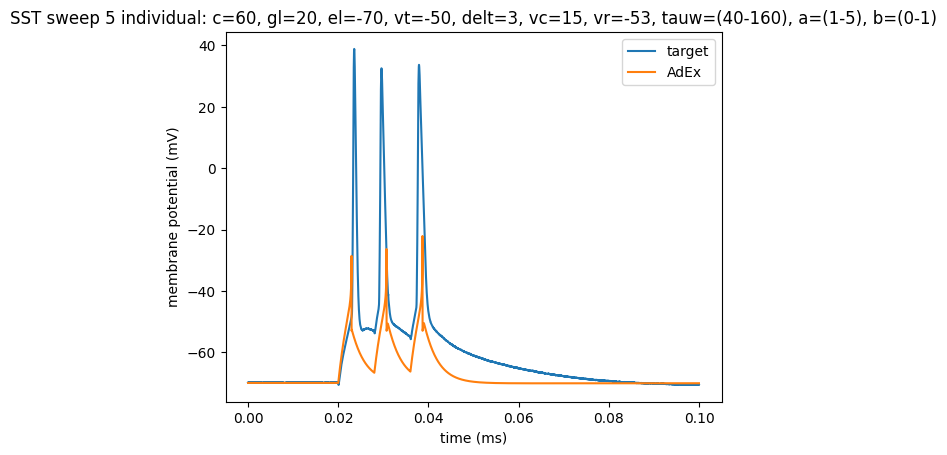

In [595]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_20rounds_9[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 16.8s

first fit:
Round 0: Best parameters a=2.02999654 nS, b=128.14558846 pA, tauw=81.3101427 ms (error: 235.73510624 mV^2)
Round 1: Best parameters a=1.55816519 nS, b=102.92347385 pA, tauw=85.80500164 ms (error: 217.68637155 mV^2)
Round 2: Best parameters a=1.31063386 nS, b=107.07040417 pA, tauw=58.99063117 ms (error: 214.23919043 mV^2)
Round 3: Best parameters a=1.36382239 nS, b=42.46966921 pA, tauw=49.40197824 ms (error: 205.47080256 mV^2)
Round 4: Best parameters a=1.27017476 nS, b=41.54596416 pA, tauw=47.64130513 ms (error: 202.38800386 mV^2)
Round 5: Best parameters a=1.27017476 nS, b=41.54596416 pA, tauw=47.64130513 ms (error: 202.38800386 mV^2)
Round 6: Best parameters a=1.27017476 nS, b=41.54596416 pA, tauw=47.64130513 ms (error: 202.38800386 mV^2)
Round 7: Best parameters a=1.30523167 nS, b=41.88289033 pA, tauw=44.17001166 ms (error: 201.53129065 mV^2)
Round 8: Best parameters a=1.30523167 nS, b=41.88289033 pA, tauw=44.17001166 ms (error: 201.53129065 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

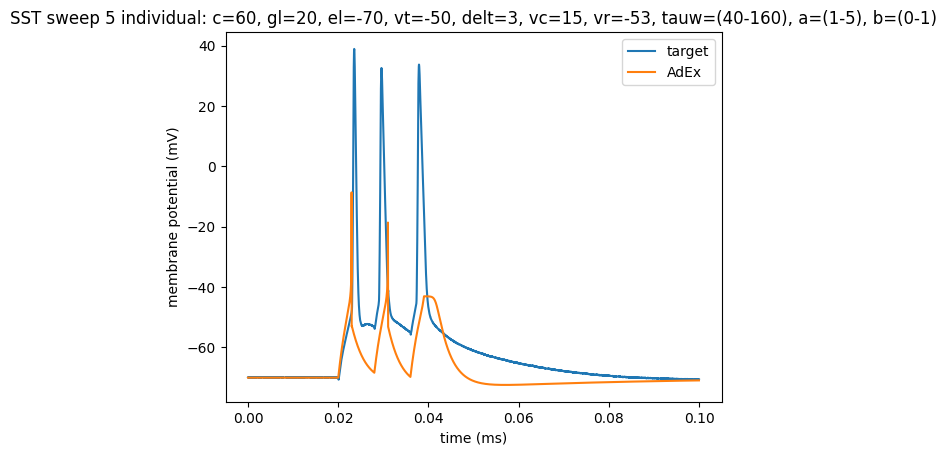

In [604]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds_1 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 16.3s

first fit:
Round 0: Best parameters a=4.11263467 nS, b=133.79774577 pA, tauw=63.14775073 ms (error: 237.52260536 mV^2)
Round 1: Best parameters a=3.73114799 nS, b=101.17105546 pA, tauw=59.22223976 ms (error: 215.38537231 mV^2)
Round 2: Best parameters a=2.53810057 nS, b=105.68199765 pA, tauw=50.63668633 ms (error: 213.37774522 mV^2)
Round 3: Best parameters a=3.93038538 nS, b=39.9826185 pA, tauw=50.11263166 ms (error: 208.53146126 mV^2)
Round 4: Best parameters a=3.27940235 nS, b=38.72301322 pA, tauw=48.80124601 ms (error: 205.41445128 mV^2)
Round 5: Best parameters a=1.93486138 nS, b=22.27481464 pA, tauw=46.5220548 ms (error: 205.25540394 mV^2)
Round 6: Best parameters a=1.67638736 nS, b=15.09162103 pA, tauw=49.98182765 ms (error: 199.17814699 mV^2)
Round 7: Best parameters a=1.33002672 nS, b=10.75814457 pA, tauw=48.64098738 ms (error: 194.82321558 mV^2)
Round 8: Best parameters a=1.79001744 nS, b=7.6772514 pA, tauw=44.99665981 ms (error: 192.96653706 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

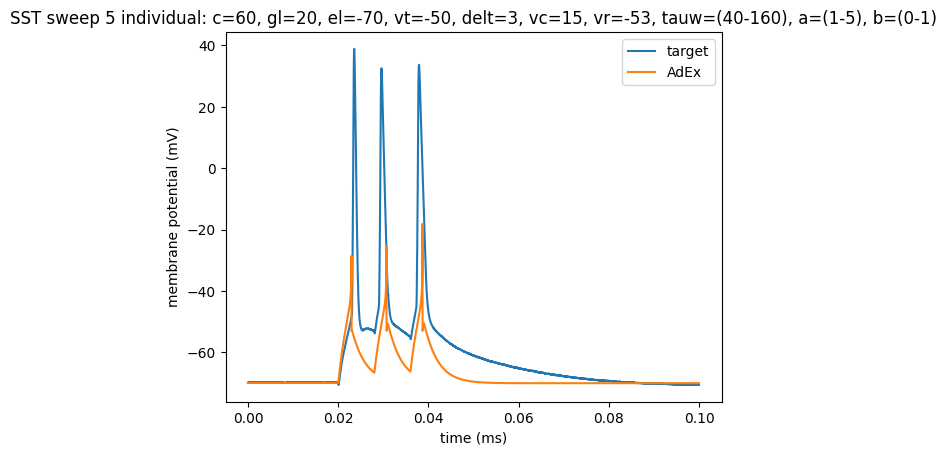

In [ ]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds_1[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds_2 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 18.1s

first fit:
Round 0: Best parameters a=4.29551669 nS, b=140.62340845 pA, tauw=53.7654626 ms (error: 238.75057127 mV^2)
Round 1: Best parameters a=4.54804308 nS, b=110.1226598 pA, tauw=48.53690556 ms (error: 220.76002736 mV^2)
Round 2: Best parameters a=4.49890156 nS, b=101.41088203 pA, tauw=49.79324638 ms (error: 215.31051564 mV^2)
Round 3: Best parameters a=4.56184307 nS, b=98.88378724 pA, tauw=53.7654626 ms (error: 214.30990332 mV^2)
Round 4: Best parameters a=4.56184307 nS, b=98.88378724 pA, tauw=53.7654626 ms (error: 214.30990332 mV^2)
Round 5: Best parameters a=1.75832435 nS, b=43.11946742 pA, tauw=50.31805843 ms (error: 207.40192336 mV^2)
Round 6: Best parameters a=1.70025595 nS, b=41.35403811 pA, tauw=47.55034448 ms (error: 204.26882701 mV^2)
Round 7: Best parameters a=1.35331279 nS, b=41.18255169 pA, tauw=52.13529147 ms (error: 203.87153332 mV^2)
Round 8: Best parameters a=1.25165002 nS, b=41.80962218 pA, tauw=46.67139905 ms (error: 202.80989895 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

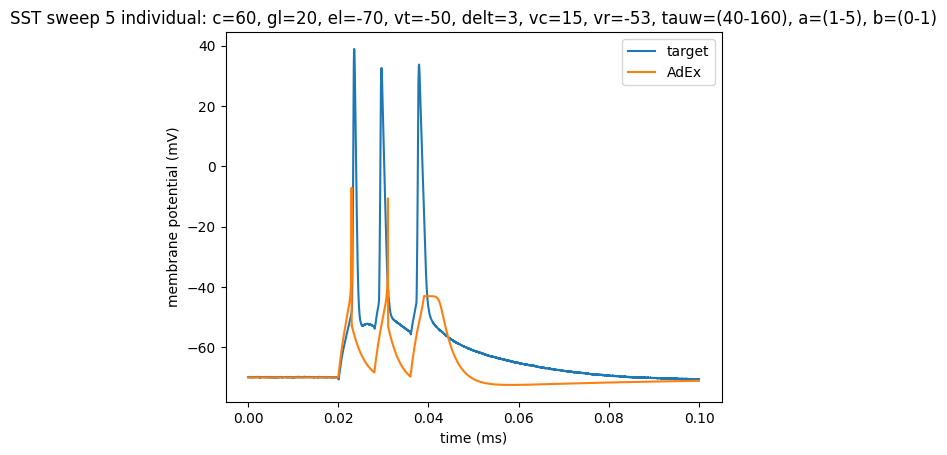

In [602]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds_2[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds_3 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 14.2s

first fit:
Round 0: Best parameters a=4.08924709 nS, b=161.65735801 pA, tauw=115.86573109 ms (error: 266.98620698 mV^2)
Round 1: Best parameters a=2.75411341 nS, b=107.46471792 pA, tauw=70.76533544 ms (error: 220.76038708 mV^2)
Round 2: Best parameters a=2.40003616 nS, b=101.65774172 pA, tauw=62.32696886 ms (error: 211.66974432 mV^2)
Round 3: Best parameters a=2.40003616 nS, b=101.65774172 pA, tauw=62.32696886 ms (error: 211.66974432 mV^2)
Round 4: Best parameters a=2.40003616 nS, b=101.65774172 pA, tauw=62.32696886 ms (error: 211.66974432 mV^2)
Round 5: Best parameters a=1.34199114 nS, b=45.34961164 pA, tauw=54.13547808 ms (error: 209.67757427 mV^2)
Round 6: Best parameters a=1.34971908 nS, b=39.9049227 pA, tauw=70.66229387 ms (error: 205.33264669 mV^2)
Round 7: Best parameters a=1.29246403 nS, b=41.21395454 pA, tauw=54.70993817 ms (error: 204.469841 mV^2)
Round 8: Best parameters a=1.23374059 nS, b=41.67746606 pA, tauw=47.64132013 ms (error: 202.71450824 mV^2)
Round 9: Best parameter

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

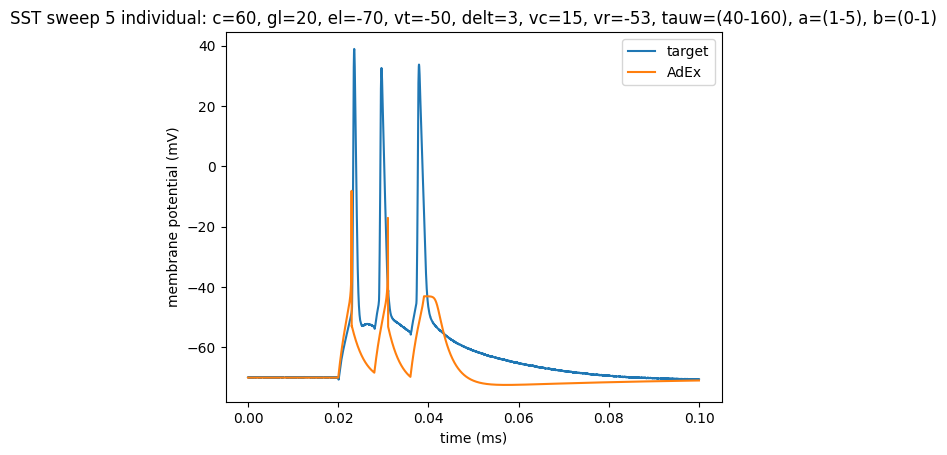

In [610]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds_3[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds_4 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 14.4s

first fit:
Round 0: Best parameters a=2.85952431 nS, b=109.24464357 pA, tauw=127.89542949 ms (error: 229.19980259 mV^2)
Round 1: Best parameters a=3.59993803 nS, b=100.80919652 pA, tauw=56.9681149 ms (error: 214.06149754 mV^2)
Round 2: Best parameters a=3.95124736 nS, b=38.16782028 pA, tauw=67.3744479 ms (error: 208.00944248 mV^2)
Round 3: Best parameters a=3.81538235 nS, b=36.87747029 pA, tauw=54.03570725 ms (error: 204.5609321 mV^2)
Round 4: Best parameters a=3.80274028 nS, b=36.87747029 pA, tauw=54.03570725 ms (error: 204.50593881 mV^2)
Round 5: Best parameters a=2.52239145 nS, b=39.23257826 pA, tauw=47.51496542 ms (error: 202.99280192 mV^2)
Round 6: Best parameters a=2.82838627 nS, b=16.93015643 pA, tauw=49.39040348 ms (error: 202.64234805 mV^2)
Round 7: Best parameters a=2.20071505 nS, b=13.47448316 pA, tauw=62.16839212 ms (error: 198.83857329 mV^2)
Round 8: Best parameters a=1.56720396 nS, b=9.35084013 pA, tauw=45.32776434 ms (error: 193.88618176 mV^2)
Round 9: Best parameters a=

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

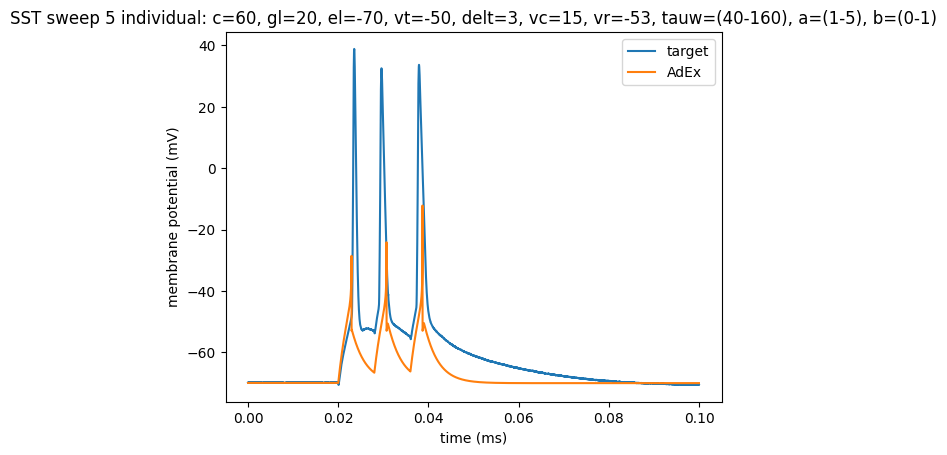

In [612]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds_4[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds_5 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 15.1s

first fit:
Round 0: Best parameters a=2.37813264 nS, b=100.52391569 pA, tauw=76.22371453 ms (error: 214.97234269 mV^2)
Round 1: Best parameters a=2.37813264 nS, b=100.52391569 pA, tauw=76.22371453 ms (error: 214.97234269 mV^2)
Round 2: Best parameters a=1.54166383 nS, b=41.62804523 pA, tauw=121.82474818 ms (error: 211.75731073 mV^2)
Round 3: Best parameters a=1.39331841 nS, b=41.46621718 pA, tauw=62.83302919 ms (error: 206.78494282 mV^2)
Round 4: Best parameters a=2.20197448 nS, b=39.75895337 pA, tauw=47.87870254 ms (error: 202.66493517 mV^2)
Round 5: Best parameters a=2.20197448 nS, b=39.75895337 pA, tauw=47.87870254 ms (error: 202.66493517 mV^2)
Round 6: Best parameters a=2.20197448 nS, b=39.75895337 pA, tauw=47.87870254 ms (error: 202.66493517 mV^2)
Round 7: Best parameters a=1.58689997 nS, b=40.94681293 pA, tauw=46.81721065 ms (error: 201.05068877 mV^2)
Round 8: Best parameters a=1.58689997 nS, b=40.94681293 pA, tauw=46.81721065 ms (error: 201.05068877 mV^2)
Round 9: Best parameter

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

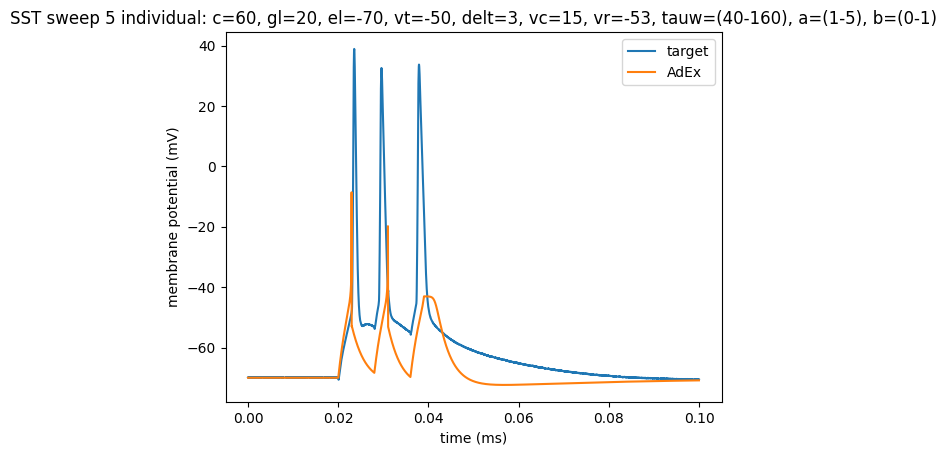

In [614]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds_5[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds_6 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 16.3s

first fit:
Round 0: Best parameters a=2.50682893 nS, b=114.04288844 pA, tauw=133.30171419 ms (error: 232.98790562 mV^2)
Round 1: Best parameters a=3.06836484 nS, b=95.23764079 pA, tauw=123.5141845 ms (error: 216.17794944 mV^2)
Round 2: Best parameters a=1.9332656 nS, b=108.99048521 pA, tauw=53.99290209 ms (error: 215.94307671 mV^2)
Round 3: Best parameters a=2.25886794 nS, b=45.58846512 pA, tauw=57.43081334 ms (error: 212.00988211 mV^2)
Round 4: Best parameters a=1.64545519 nS, b=41.48708231 pA, tauw=53.30255859 ms (error: 205.69450236 mV^2)
Round 5: Best parameters a=1.57941352 nS, b=41.53305448 pA, tauw=47.93028709 ms (error: 204.26024517 mV^2)
Round 6: Best parameters a=1.41157584 nS, b=41.85670702 pA, tauw=43.69603574 ms (error: 202.40821879 mV^2)
Round 7: Best parameters a=1.41157584 nS, b=41.85670702 pA, tauw=43.69603574 ms (error: 202.40821879 mV^2)
Round 8: Best parameters a=1.41157584 nS, b=41.85670702 pA, tauw=43.69603574 ms (error: 202.40821879 mV^2)
Round 9: Best parameters

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

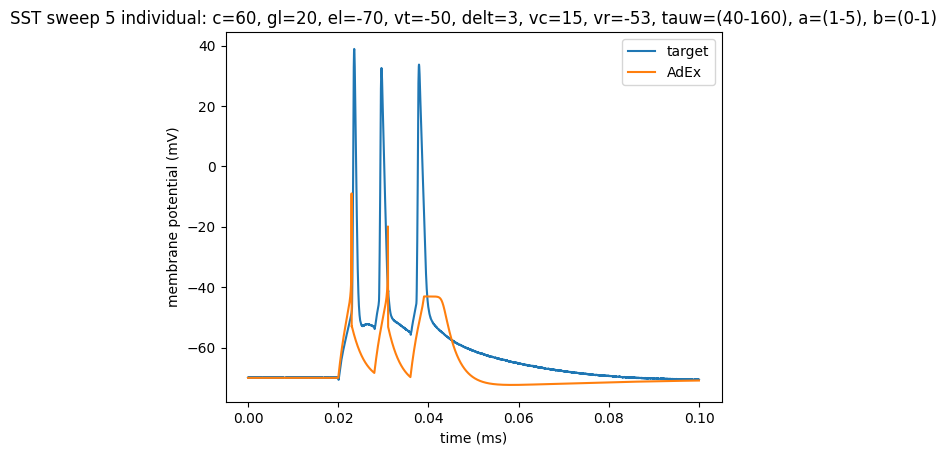

In [616]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds_6[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds_7 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 14.5s

first fit:
Round 0: Best parameters a=2.29307891 nS, b=102.13951832 pA, tauw=82.76000343 ms (error: 217.78975426 mV^2)
Round 1: Best parameters a=1.86295285 nS, b=98.68386537 pA, tauw=95.19124468 ms (error: 214.7463183 mV^2)
Round 2: Best parameters a=2.11731439 nS, b=42.21930576 pA, tauw=114.55940251 ms (error: 213.34396924 mV^2)
Round 3: Best parameters a=1.90384767 nS, b=39.79728802 pA, tauw=70.79222355 ms (error: 206.53486146 mV^2)
Round 4: Best parameters a=1.33851183 nS, b=40.65787056 pA, tauw=54.855262 ms (error: 202.99146339 mV^2)
Round 5: Best parameters a=1.33851183 nS, b=40.65787056 pA, tauw=54.855262 ms (error: 202.99146339 mV^2)
Round 6: Best parameters a=1.33851183 nS, b=40.65787056 pA, tauw=54.855262 ms (error: 202.99146339 mV^2)
Round 7: Best parameters a=1.20585627 nS, b=18.78542728 pA, tauw=56.0414755 ms (error: 202.32582567 mV^2)
Round 8: Best parameters a=1.11928088 nS, b=13.58595896 pA, tauw=53.63176142 ms (error: 197.19482039 mV^2)
Round 9: Best parameters a=1.386

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

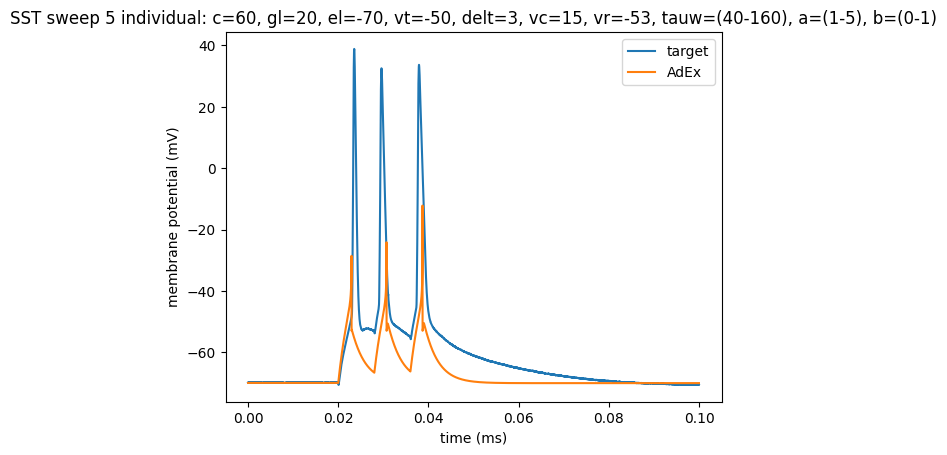

In [618]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds_7[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds_8 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 13.8s

first fit:
Round 0: Best parameters a=2.47233153 nS, b=129.49289184 pA, tauw=78.86855238 ms (error: 236.61204065 mV^2)
Round 1: Best parameters a=2.67722978 nS, b=103.87899572 pA, tauw=60.30638187 ms (error: 215.40030644 mV^2)
Round 2: Best parameters a=2.67722978 nS, b=103.87899572 pA, tauw=60.30638187 ms (error: 215.40030644 mV^2)
Round 3: Best parameters a=2.18044034 nS, b=105.15028886 pA, tauw=55.04667022 ms (error: 213.34106419 mV^2)
Round 4: Best parameters a=3.7227776 nS, b=99.96808888 pA, tauw=52.89544987 ms (error: 211.86739364 mV^2)
Round 5: Best parameters a=3.7227776 nS, b=99.96808888 pA, tauw=52.89544987 ms (error: 211.86739364 mV^2)
Round 6: Best parameters a=1.7544365 nS, b=45.26950581 pA, tauw=55.04759806 ms (error: 210.49483997 mV^2)
Round 7: Best parameters a=3.42604065 nS, b=38.02893536 pA, tauw=53.67500536 ms (error: 205.40296956 mV^2)
Round 8: Best parameters a=1.48768892 nS, b=41.49917182 pA, tauw=47.37278748 ms (error: 203.61731545 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

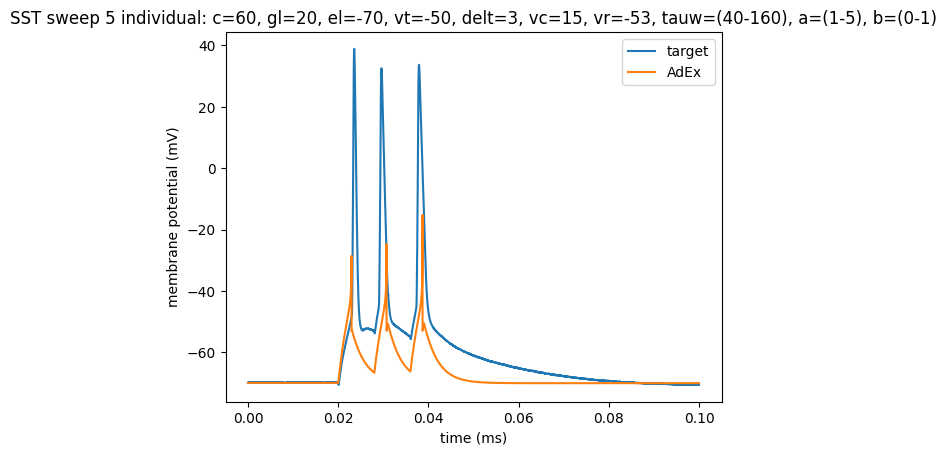

In [620]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds_8[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_37_30rounds_9 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=3, vc_var=15, vr=-53, round_num=30, tauw_min=40, a_max=5, b_max=1)

# tt: 13.7s

first fit:
Round 0: Best parameters a=2.9616318 nS, b=130.8258892 pA, tauw=124.22646375 ms (error: 244.90414183 mV^2)
Round 1: Best parameters a=2.36759259 nS, b=96.13315588 pA, tauw=136.46393022 ms (error: 217.41032873 mV^2)
Round 2: Best parameters a=4.05619077 nS, b=99.57707625 pA, tauw=67.22862759 ms (error: 216.37223188 mV^2)
Round 3: Best parameters a=2.36759259 nS, b=96.13315588 pA, tauw=110.90409781 ms (error: 212.88333134 mV^2)
Round 4: Best parameters a=4.08507278 nS, b=97.81828165 pA, tauw=56.22489263 ms (error: 210.45537589 mV^2)
Round 5: Best parameters a=2.81311638 nS, b=104.16063753 pA, tauw=48.07686429 ms (error: 210.39918678 mV^2)
Round 6: Best parameters a=1.59767032 nS, b=44.37133965 pA, tauw=48.91483427 ms (error: 208.0960657 mV^2)
Round 7: Best parameters a=2.54193463 nS, b=39.74384625 pA, tauw=47.82717906 ms (error: 204.4970257 mV^2)
Round 8: Best parameters a=2.45757689 nS, b=39.12925252 pA, tauw=49.58908503 ms (error: 202.73414467 mV^2)
Round 9: Best parameters 

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

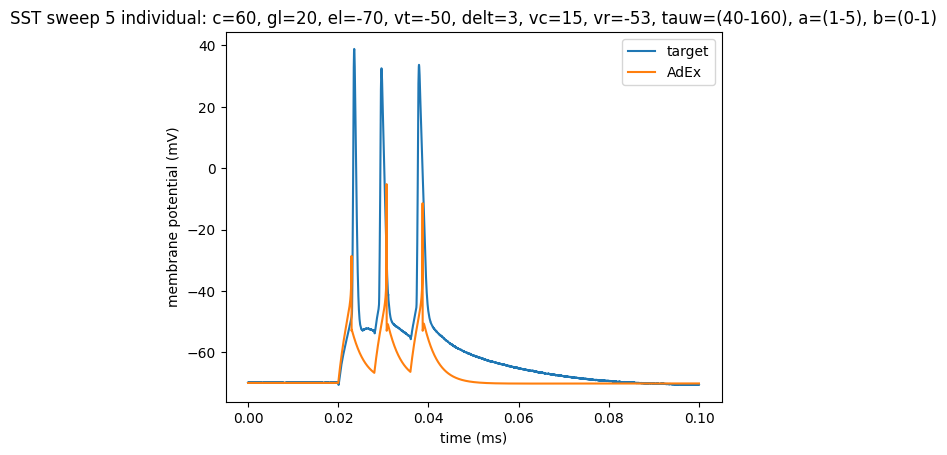

In [599]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37_30rounds_9[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=3, vc=15, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

***

In [ ]:
sst_adex_s5_38 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=20, vt_var=-50,\
                                     delt_var=2, vc_var=45, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8.1s

first fit:
Round 0: Best parameters a=1.83421685 nS, b=121.89900689 pA, tauw=70.40380898 ms (error: 228.28980924 mV^2)
Round 1: Best parameters a=1.40116458 nS, b=112.71521296 pA, tauw=88.96345827 ms (error: 223.69308141 mV^2)
Round 2: Best parameters a=1.40116458 nS, b=112.71521296 pA, tauw=88.96345827 ms (error: 223.69308141 mV^2)
Round 3: Best parameters a=1.41725695 nS, b=49.56493425 pA, tauw=83.67133151 ms (error: 216.96758833 mV^2)
Round 4: Best parameters a=1.23282641 nS, b=50.42557742 pA, tauw=57.48168802 ms (error: 212.8728258 mV^2)
Round 5: Best parameters a=1.2663137 nS, b=30.67116519 pA, tauw=54.48298915 ms (error: 212.50842302 mV^2)
Round 6: Best parameters a=1.33815216 nS, b=25.89075611 pA, tauw=51.24193286 ms (error: 207.51154912 mV^2)
Round 7: Best parameters a=1.147961 nS, b=17.43018753 pA, tauw=49.70192769 ms (error: 199.21278704 mV^2)
Round 8: Best parameters a=1.09672361 nS, b=12.72159859 pA, tauw=44.60658761 ms (error: 194.992178 mV^2)
Round 9: Best parameters a=1.

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=2, vc=45, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

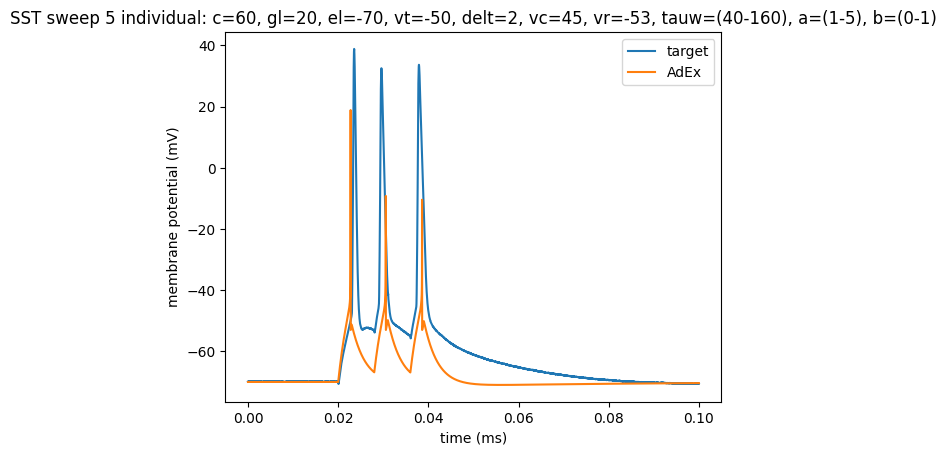

In [562]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_38[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=20, el=-70, vt=-50, delt=2, vc=45, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_39 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=10, vt_var=-50,\
                                     delt_var=2, vc_var=45, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8s

first fit:
Round 0: Best parameters a=1.61529848 nS, b=234.9463304 pA, tauw=86.84593274 ms (error: 342.81149862 mV^2)
Round 1: Best parameters a=3.31286752 nS, b=228.7858712 pA, tauw=71.19296158 ms (error: 312.10618489 mV^2)
Round 2: Best parameters a=4.23300433 nS, b=107.69820595 pA, tauw=71.04427276 ms (error: 294.85037357 mV^2)
Round 3: Best parameters a=4.23300433 nS, b=107.69820595 pA, tauw=51.02253345 ms (error: 265.44099875 mV^2)
Round 4: Best parameters a=3.3715122 nS, b=60.58583826 pA, tauw=51.76473731 ms (error: 237.27750994 mV^2)
Round 5: Best parameters a=2.1918745 nS, b=39.20364793 pA, tauw=47.33585213 ms (error: 225.4771885 mV^2)
Round 6: Best parameters a=1.47255988 nS, b=28.9869059 pA, tauw=46.15066549 ms (error: 193.04143205 mV^2)
Round 7: Best parameters a=1.62624773 nS, b=19.99724902 pA, tauw=47.28880921 ms (error: 173.70105879 mV^2)
Round 8: Best parameters a=1.33051951 nS, b=19.1695315 pA, tauw=46.98976893 ms (error: 168.86294735 mV^2)
Round 9: Best parameters a=1.

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=10, el=-70, vt=-50, delt=2, vc=45, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

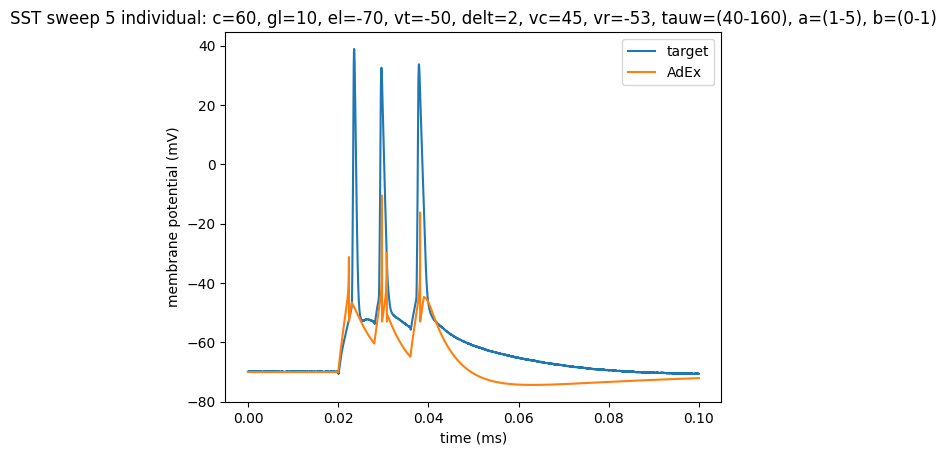

In [564]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_39[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=10, el=-70, vt=-50, delt=2, vc=45, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_40 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=15, vt_var=-50,\
                                     delt_var=2, vc_var=45, vr=-53, tauw_min=40, a_max=5, b_max=1)

# tt: 8.2s

first fit:
Round 0: Best parameters a=3.41245913 nS, b=172.81535 pA, tauw=63.51613863 ms (error: 242.64831637 mV^2)
Round 1: Best parameters a=3.92368512 nS, b=77.400036 pA, tauw=54.29227411 ms (error: 226.64489216 mV^2)
Round 2: Best parameters a=2.12157576 nS, b=46.10899065 pA, tauw=51.13743092 ms (error: 214.89906731 mV^2)
Round 3: Best parameters a=2.09648599 nS, b=28.24491973 pA, tauw=94.92750526 ms (error: 195.72001968 mV^2)
Round 4: Best parameters a=1.77901396 nS, b=22.73058571 pA, tauw=56.8837198 ms (error: 183.80758441 mV^2)
Round 5: Best parameters a=1.42207419 nS, b=17.61710088 pA, tauw=47.21593946 ms (error: 176.53384882 mV^2)
Round 6: Best parameters a=1.29239369 nS, b=14.92098048 pA, tauw=45.49555127 ms (error: 172.68377955 mV^2)
Round 7: Best parameters a=1.26628617 nS, b=13.40529837 pA, tauw=45.99202555 ms (error: 169.08940829 mV^2)
Round 8: Best parameters a=1.25542148 nS, b=13.272773 pA, tauw=47.26539801 ms (error: 168.70999892 mV^2)
Round 9: Best parameters a=1.2554

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=15, el=-70, vt=-50, delt=2, vc=45, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

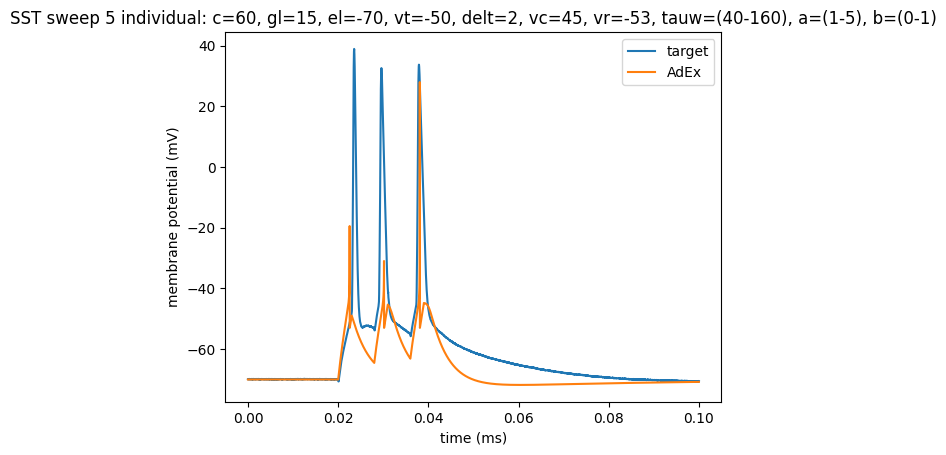

In [566]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_40[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=15, el=-70, vt=-50, delt=2, vc=45, vr=-53, tauw=(40-160), a=(1-5), b=(0-1)')

In [ ]:
sst_adex_s5_41 = run_adex(reshaped_sst_sweep5_in, reshaped_sst_sweep5_out, c_var=60, gl_var=15, vt_var=-50,\
                                     delt_var=2, vc_var=45, vr=-53, tauw_min=100, a_max=5, b_max=1)

# tt: 8.1s

first fit:
Round 0: Best parameters a=2.62203589 nS, b=169.64077654 pA, tauw=123.38985592 ms (error: 264.74332811 mV^2)
Round 1: Best parameters a=2.62203589 nS, b=169.64077654 pA, tauw=123.38985592 ms (error: 264.74332811 mV^2)
Round 2: Best parameters a=1.66694297 nS, b=82.09853135 pA, tauw=113.05220698 ms (error: 252.89285814 mV^2)
Round 3: Best parameters a=2.88385935 nS, b=70.81376476 pA, tauw=146.96174897 ms (error: 234.49627497 mV^2)
Round 4: Best parameters a=1.42187491 nS, b=40.32505507 pA, tauw=115.0256427 ms (error: 218.57735037 mV^2)
Round 5: Best parameters a=1.34251555 nS, b=27.21316023 pA, tauw=122.36401391 ms (error: 195.11994231 mV^2)
Round 6: Best parameters a=1.27448706 nS, b=18.39722036 pA, tauw=111.32613497 ms (error: 180.03033879 mV^2)
Round 7: Best parameters a=1.63768501 nS, b=13.98787425 pA, tauw=136.95143778 ms (error: 173.14798676 mV^2)
Round 8: Best parameters a=1.19699763 nS, b=13.74512516 pA, tauw=117.78465703 ms (error: 171.28697933 mV^2)
Round 9: Best pa

Text(0.5, 1.0, 'SST sweep 5 individual: c=60, gl=15, el=-70, vt=-50, delt=2, vc=45, vr=-53, tauw=(100-160), a=(1-5), b=(0-1)')

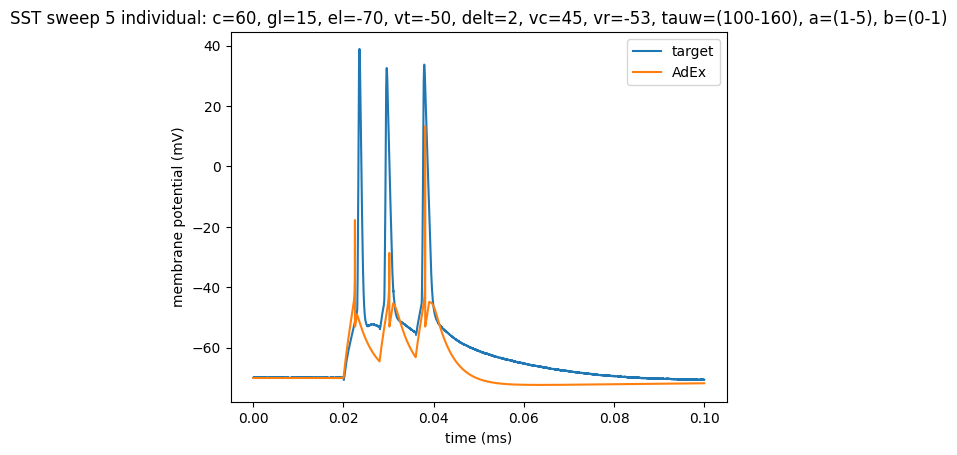

In [568]:
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_41[0]*1000, d2_title='AdEx')
title('SST sweep 5 individual: c=60, gl=15, el=-70, vt=-50, delt=2, vc=45, vr=-53, tauw=(100-160), a=(1-5), b=(0-1)')

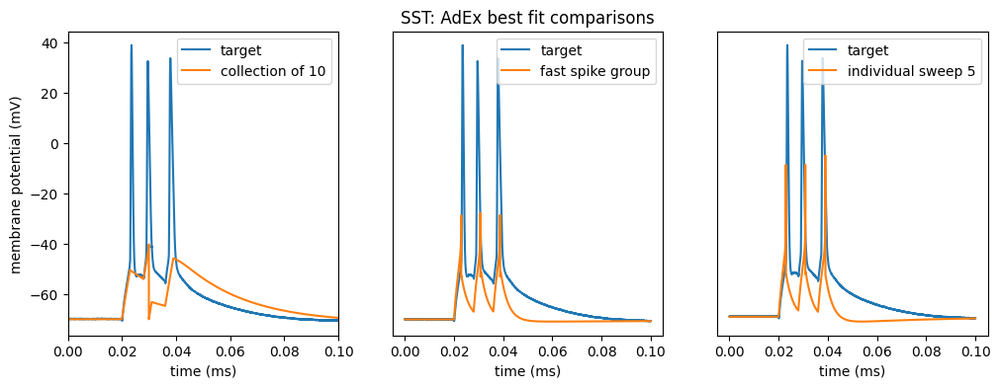

In [630]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together(sliced_output_res[5], adex_sst_starters_1[5]*1000, d2_title='collection of 10')
xlim(0, 0.1)
ylabel('membrane potential (mV)')

subplot(1,3,2)
create_comparison_together(fastspikes_output_sliced[2], adex_sst_fast_6[2]*1000, d2_title='fast spike group')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('SST: AdEx best fit comparisons')

subplot(1,3,3)
create_comparison_together(reshaped_sst_sweep5_out[0], sst_adex_s5_37[0]*1000, d2_title='individual sweep 5')
ax = plt.gca()
ax.yaxis.set_visible(False)

***
***

WARNING    c:\Users\yjk16\OneDrive\Desktop\CS Master's\Dissertation\diss files\general_functions.py:508: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  legend()
 [py.warnings]


Text(0.5, 1.0, 'Individual sweep 5')

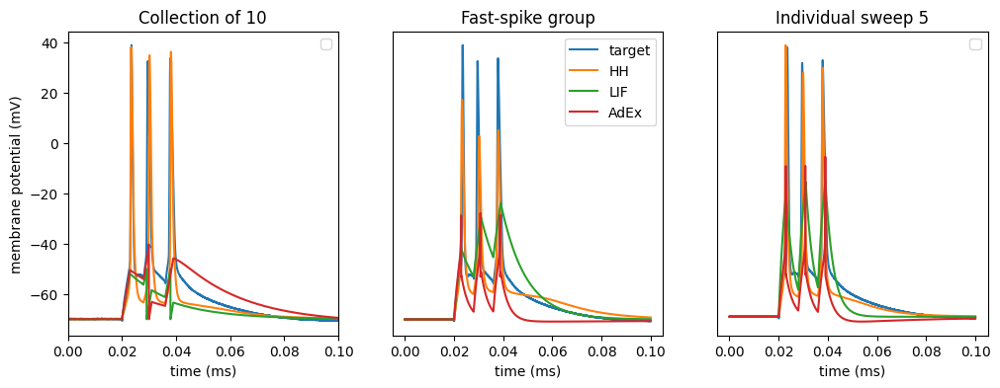

In [631]:
figure(figsize=(12,4))

subplot(1,3,1)
create_comparison_together_four(sliced_output_res[5], hh_sst_starters_3[5]*1000, lif_sst_starters_0[5]*1000, adex_sst_starters_1[5]*1000, \
                                d1_title='', d2_title='', d3_title='', d4_title='')
xlim(0, 0.1)
ylabel('membrane potential (mV)')
title('Collection of 10')

subplot(1,3,2)
create_comparison_together_four(fastspikes_output_sliced[2], hh_sst_fast_5_12[2]*1000, lif_sst_fast_5[2]*1000, adex_sst_fast_6[2]*1000,\
                                d2_title='HH', d3_title='LIF', d4_title='AdEx')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Fast-spike group')

subplot(1,3,3)
create_comparison_together_four(reshaped_sst_sweep5_out[0], sst_hh_s5_17[0]*1000, sst_lif_s5_4_8[0]*1000, sst_adex_s5_37[0]*1000,\
                            d1_title='', d2_title='', d3_title='', d4_title='')
ax = plt.gca()
ax.yaxis.set_visible(False)
title('Individual sweep 5')